<a href="https://colab.research.google.com/github/tajuar-akash-hub/test_repo_for_colaboration/blob/main/DataHackathon_Mahir_Tajuar_Akash.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Fetching Dataset from Github

In [ ]:
!git clone https://github.com/tajuar-akash-hub/Datasets.git

Cloning into 'Datasets'...
remote: Enumerating objects: 20, done.
remote: Counting objects: 100% (20/20), done.
remote: Compressing objects: 100% (19/19), done.
remote: Total 20 (delta 4), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (20/20), 2.29 MiB | 7.29 MiB/s, done.
Resolving deltas: 100% (4/4), done.


# Loading the Dataset and libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

data = '/content/Datasets/Cou_Coffee_Shop_Sales.xlsx - Transactions.csv'
df = pd.read_csv("/content/Datasets/Cou_Coffee_Shop_Sales.xlsx - Transactions.csv")
df.head(1)

copy_df = df



# set style of visualization

sns.set_style("darkgrid")
sns.set_palette("RdBu")

In [ ]:
len(df)

149116

In [ ]:
# Exploratory Data Analysis
df.describe().style.background_gradient(cmap='RdPu', axis=0)

,transaction_id,transaction_qty,store_id,product_id,unit_price
count,149116.000000,149116.000000,149116.000000,149116.000000,149116.000000
mean,74737.371872,1.438276,5.342063,47.918607,3.382219
std,43153.600016,0.542509,2.074241,17.930020,2.658723
min,1.000000,1.000000,3.000000,1.000000,0.800000
25%,37335.750000,1.000000,3.000000,33.000000,2.500000
50%,74727.500000,1.000000,5.000000,47.000000,3.000000
75%,112094.250000,2.000000,8.000000,60.000000,3.750000
max,149456.000000,8.000000,8.000000,87.000000,45.000000


In [ ]:
df.isnull().sum()

,0
transaction_id,0
transaction_date,0
transaction_time,0
transaction_qty,0
store_id,0
store_location,0
product_id,0
unit_price,0
product_category,0
product_type,0


In [ ]:
unique_counts = df.nunique()
print(unique_counts)

transaction_id      149116
transaction_date       181
transaction_time     25762
transaction_qty          6
store_id                 3
store_location           3
product_id              80
unit_price              41
product_category         9
product_type            29
product_detail          80
dtype: int64


In [ ]:
df.shape

(149116, 11)

In [ ]:
df.dtypes

,0
transaction_id,int64
transaction_date,object
transaction_time,object
transaction_qty,int64
store_id,int64
store_location,object
product_id,int64
unit_price,float64
product_category,object
product_type,object


In [ ]:
df.columns

Index(['transaction_id', 'transaction_date', 'transaction_time',
       'transaction_qty', 'store_id', 'store_location', 'product_id',
       'unit_price', 'product_category', 'product_type', 'product_detail'],
      dtype='object')

# Duplicates

In [ ]:
#check duplicates

duplicates = df[df.duplicated()]

# Display duplicates if any are found

print(f"Number of duplicate rows: {duplicates.shape[0]}")
print(duplicates)

Number of duplicate rows: 0
Empty DataFrame
Columns: [transaction_id, transaction_date, transaction_time, transaction_qty, store_id, store_location, product_id, unit_price, product_category, product_type, product_detail]
Index: []


# Convert date and time

In [ ]:
# Convert 'transaction_date' to datetime format

df['transaction_date'] = pd.to_datetime(df['transaction_date'])



In [ ]:
df.columns

Index(['transaction_id', 'transaction_date', 'transaction_time',
       'transaction_qty', 'store_id', 'store_location', 'product_id',
       'unit_price', 'product_category', 'product_type', 'product_detail',
       'z_score_qty', 'z_score_price'],
      dtype='object')

In [ ]:
# Convert 'transaction_time' to a time format
# For 'HH:MM:SS' format, for example:


import pandas as pd

# First attempt with the 12-hour clock format (AM/PM included)
df['transaction_time'] = pd.to_datetime(df['transaction_time'], format='%I:%M:%S %p', errors='coerce')







In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149116 entries, 0 to 149115
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   transaction_id    149116 non-null  int64         
 1   transaction_date  149116 non-null  datetime64[ns]
 2   transaction_time  149116 non-null  object        
 3   transaction_qty   149116 non-null  int64         
 4   store_id          149116 non-null  int64         
 5   store_location    149116 non-null  object        
 6   product_id        149116 non-null  int64         
 7   unit_price        149116 non-null  float64       
 8   product_category  149116 non-null  object        
 9   product_type      149116 non-null  object        
 10  product_detail    149116 non-null  object        
 11  z_score_qty       149116 non-null  float64       
 12  z_score_price     149116 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int64(4), object(5)
memor

In [ ]:
print(df["transaction_time"].head(10))

0    7:06:11
1    7:08:56
2    7:14:04
3    7:20:24
4    7:22:41
5    7:22:41
6    7:25:49
7    7:33:34
8    7:39:13
9    7:39:34
Name: transaction_time, dtype: object


## Univariate Analysis & Visualizations 📊📉

In [ ]:
# create function to visualized categorical column using count plot

def count_plot(x_axis = None, y_axis = None, hue = None, rotation = 0, top = None):
    """
    1) input : x_axis, column name, data type must be object or categorical
    3) output : cout plot using seaborn modules, unique values in x-axis and frequency in y-axis
    4) use bar_label to show frequency of each unique values above each column in graph
    5) top parameter i use it to specify indexes i want to see it
    """
    if x_axis: # if we neet to visualized in x-axis
        order = df[x_axis].value_counts().iloc[:top].index

    else : # if we neet to visualized in y-axis
        order = df[y_axis].value_counts().iloc[:top].index

    graph = sns.countplot(x = x_axis, y = y_axis, data = df, hue = hue, order = order, palette = "RdBu")
    for container in graph.containers:
        graph.bar_label(container)


    plt.xticks(rotation = rotation)
    plt.show()

In [ ]:
# create function that visualized categorical column using pie plot

def pie_plot(column_name, explodeIndex = None):
    """
    1) input : column name, column data type must be object or categorical
    2) explodeIndex, is the index i need to explode it
    2) output : circle chart that shows size of each unique values and percentage
    """
    # Create explode list with zeros of size equal to the number of unique values
    explodeList = [0] * df[column_name].nunique()

    # Check and set explodeIndex value
    if explodeIndex is not None:
        explodeList[explodeIndex] = 0.1

    # Create pie plot
    plt.pie(df[column_name].value_counts(), labels = df[column_name].value_counts().index, shadow = True, autopct = "%1.1f%%",  explode = explodeList)
    plt.show()

### Discovering `transaction_date` column

In [ ]:
# see unique value

df["transaction_date"].unique()[:25]

<DatetimeArray>
['2023-01-01 00:00:00', '2023-01-02 00:00:00', '2023-01-03 00:00:00',
 '2023-01-04 00:00:00', '2023-01-05 00:00:00', '2023-01-06 00:00:00',
 '2023-01-07 00:00:00', '2023-01-08 00:00:00', '2023-01-09 00:00:00',
 '2023-01-10 00:00:00', '2023-01-11 00:00:00', '2023-01-12 00:00:00',
 '2023-01-13 00:00:00', '2023-01-14 00:00:00', '2023-01-15 00:00:00',
 '2023-01-16 00:00:00', '2023-01-17 00:00:00', '2023-01-18 00:00:00',
 '2023-01-19 00:00:00', '2023-01-20 00:00:00', '2023-01-21 00:00:00',
 '2023-01-22 00:00:00', '2023-01-23 00:00:00', '2023-01-24 00:00:00',
 '2023-01-25 00:00:00']
Length: 25, dtype: datetime64[ns]

#Extract some information such as `year , month and day`**

In [ ]:
# add new column year

df["year"] = df["transaction_date"].dt.year

# add new column month
df["month"] = df["transaction_date"].dt.month_name()

# add new column day
df["day"] = df["transaction_date"].dt.day_name()

**Discovering this columns 📉🎛️**

In [ ]:
# see unique values of year column

df["year"].unique()

array([2023], dtype=int32)

**📝Sales exclusively from 2023.**

In [ ]:
# see unique values of month column

df["month"].unique()

array(['January', 'February', 'March', 'April', 'May', 'June'],
      dtype=object)

<ipython-input-22-b202a2bdcee5>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  graph = sns.countplot(x = x_axis, y = y_axis, data = df, hue = hue, order = order, palette = "RdBu")


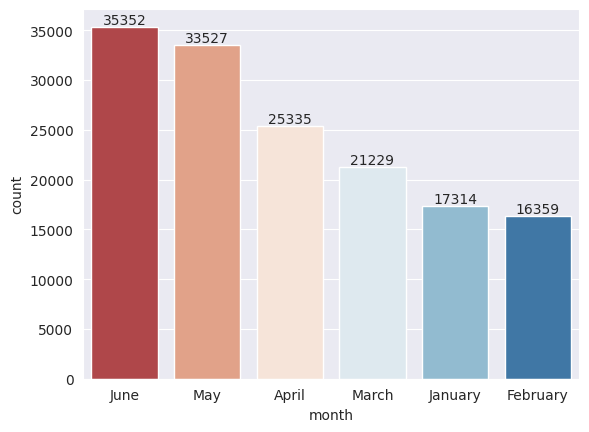

In [ ]:
# see number of transaction in each month

count_plot(x_axis = "month") # call function i create it in cell 12

# Most sales within a six-month period**

In [ ]:
df["day"].unique()

array(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday',
       'Saturday'], dtype=object)

<ipython-input-22-b202a2bdcee5>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  graph = sns.countplot(x = x_axis, y = y_axis, data = df, hue = hue, order = order, palette = "RdBu")


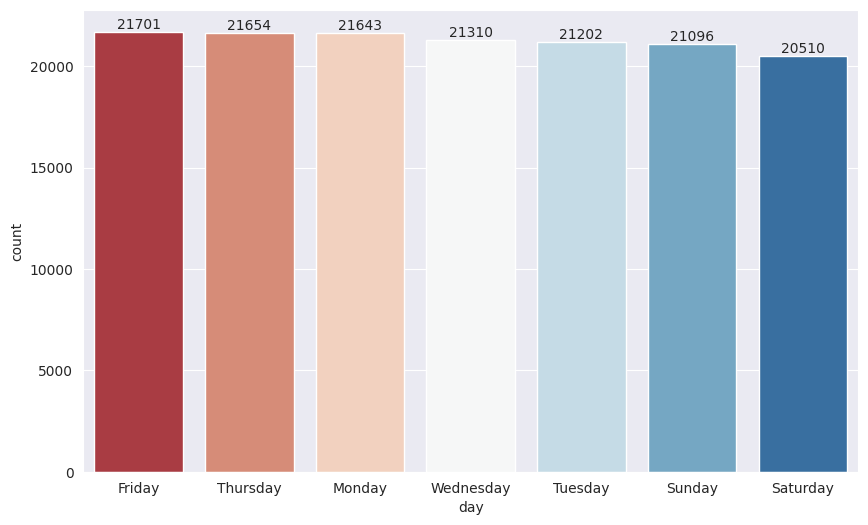

In [ ]:
# see top 5 day of transaction

# set figure size
plt.figure(figsize = (10,6))

# call function i create it in cell 12
count_plot(x_axis = "day")

In [ ]:
# now i will drop  "transaction_date" column

df.drop(columns = "transaction_date", inplace = True)

### Discovering `transaction_time` column

In [ ]:
# see unique values

df["transaction_time"].unique()

array(['7:06:11', '7:08:56', '7:14:04', ..., '10:34:30', '12:03:24',
       '16:59:49'], dtype=object)

In [ ]:
# Force datetime conversion on all entries, with errors converting to NaT if necessary

df['transaction_time'] = pd.to_datetime(df['transaction_time'], errors='coerce')


<ipython-input-35-c469d98d77f0>:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['transaction_time'] = pd.to_datetime(df['transaction_time'], errors='coerce')


In [ ]:
df['hour'] = df['transaction_time'].dt.hour

In [ ]:
df["transaction_time"]

,transaction_time
0,7:06:11
1,7:08:56
2,7:14:04
3,7:20:24
4,7:22:41
...,...
149111,20:18:41
149112,20:25:10
149113,20:31:34
149114,20:57:19


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149116 entries, 0 to 149115
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   transaction_id    149116 non-null  int64         
 1   transaction_date  149116 non-null  datetime64[ns]
 2   transaction_time  149116 non-null  datetime64[ns]
 3   transaction_qty   149116 non-null  int64         
 4   store_id          149116 non-null  int64         
 5   store_location    149116 non-null  object        
 6   product_id        149116 non-null  int64         
 7   unit_price        149116 non-null  float64       
 8   product_category  149116 non-null  object        
 9   product_type      149116 non-null  object        
 10  product_detail    149116 non-null  object        
 11  z_score_qty       149116 non-null  float64       
 12  z_score_price     149116 non-null  float64       
 13  year              149116 non-null  int32         
 14  mont

##  Extract some information such as `hour`**

In [ ]:
# add new column hour

df["hour"] = df["transaction_time"].apply(lambda x : x.hour)

In [ ]:
df["hour"].unique()

array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,  6, 20])

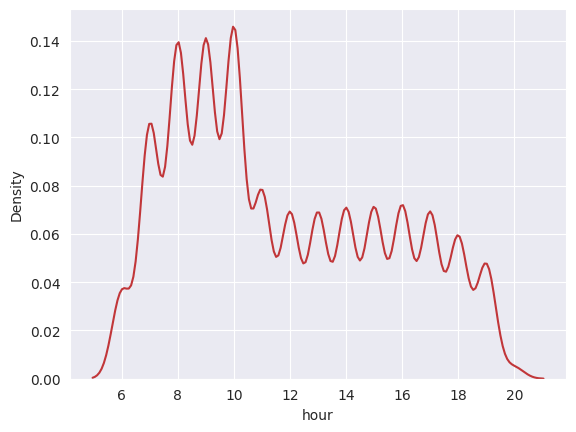

In [ ]:
# see distribution
import seaborn as sns
import matplotlib.pyplot as plt


sns.kdeplot(df["hour"])
plt.show()

**📝 Most sales were from 8 am to 11 pm**

In [ ]:
# now i will drop  "transaction_date" column

df.drop(columns = "transaction_time", inplace = True)

### Discovering `transaction_qty` column

In [ ]:
### see unique values

df["transaction_qty"].unique()

array([2, 1, 3, 4, 8, 6])

<ipython-input-22-b202a2bdcee5>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  graph = sns.countplot(x = x_axis, y = y_axis, data = df, hue = hue, order = order, palette = "RdBu")


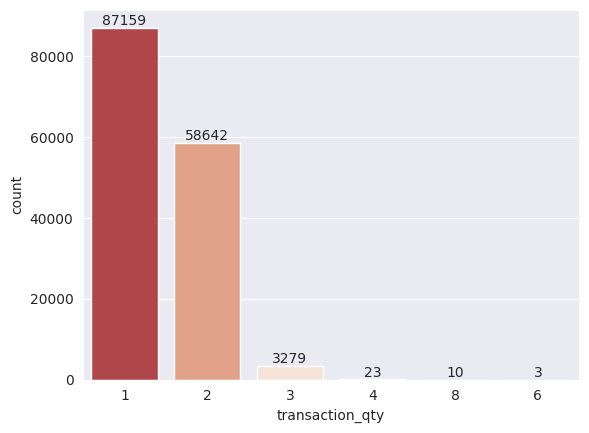

In [ ]:
# see number of sales quantity

count_plot(x_axis = "transaction_qty") # call function i create it in cell 12

**📝Most sales were singles followed by 2 lots**

### Discovering `store_location` column

In [ ]:
# see unique values

df["store_location"].unique()

array(['Lower Manhattan', "Hell's Kitchen", 'Astoria'], dtype=object)

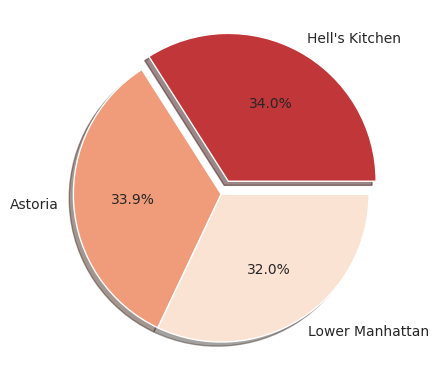

In [ ]:
# see number of sales in each store

pie_plot(column_name = "store_location", explodeIndex = 0)

**📝 The sales rates of the three stores were similar, with the most significant difference observed at the Hell's Kitchen store**

### Discovering `unit_price` column

In [ ]:
# see unique values

df["unit_price"].unique()

array([ 3.  ,  3.1 ,  4.5 ,  2.  ,  4.25,  3.5 ,  2.55,  3.75,  2.5 ,
        4.75,  3.25,  4.  ,  2.2 ,  2.45,  0.8 ,  8.95, 21.  , 28.  ,
        6.4 , 19.75, 12.  , 18.  ,  9.5 , 10.  , 20.45,  9.25, 22.5 ,
       14.75,  7.6 , 14.  , 10.95, 13.33, 15.  ,  4.38,  4.06,  5.63,
        4.69, 45.  , 23.  ,  2.1 ,  2.65])

<Axes: ylabel='unit_price'>

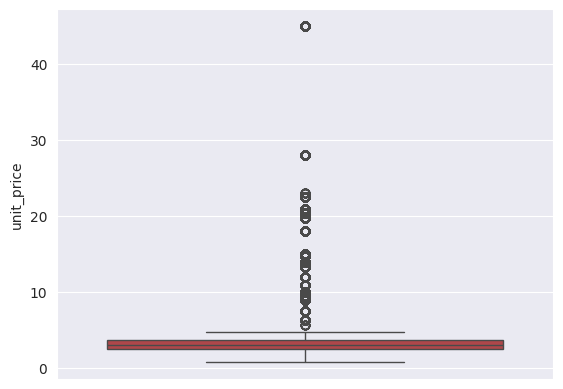

In [ ]:
# see 5 number summary to check outliers

sns.boxplot(y = "unit_price", data = df)

:** One might assume the presence of `outliers`, but such variations are expected in different types of coffee**

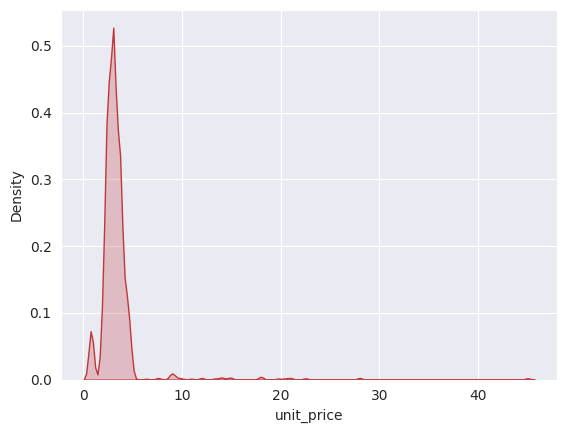

In [ ]:
# see distribution

sns.kdeplot(x = df["unit_price"], fill = True)
plt.show()

**🛑📊 We can see :**
   - Price distribution is `positively skewed`, We understand from this that most Coffee have lower prices,while a few Coffee have higher prices

### Discovering `product_category` column

In [ ]:
# see unique values

df["product_category"].unique()

array(['Coffee', 'Tea', 'Drinking Chocolate', 'Bakery', 'Flavours',
       'Loose Tea', 'Coffee beans', 'Packaged Chocolate', 'Branded'],
      dtype=object)

<ipython-input-22-b202a2bdcee5>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  graph = sns.countplot(x = x_axis, y = y_axis, data = df, hue = hue, order = order, palette = "RdBu")


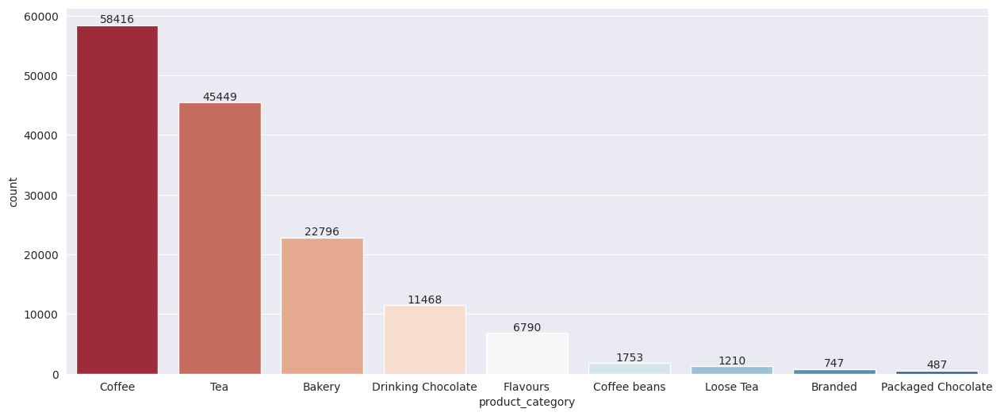

In [ ]:
# see most common category

# set figure size
plt.figure(figsize = (15,6))

# call function i create it in cell 12
count_plot(x_axis = "product_category")

** We can see :**
   
   - `Coffee` stands as the most-selling product.
   - `Tea` second most selling product.

### Discovering `product_type` column

In [ ]:
# see unique values

df["product_type"].unique()

array(['Gourmet brewed coffee', 'Brewed Chai tea', 'Hot chocolate',
       'Drip coffee', 'Scone', 'Barista Espresso', 'Brewed Black tea',
       'Brewed Green tea', 'Brewed herbal tea', 'Biscotti', 'Pastry',
       'Organic brewed coffee', 'Premium brewed coffee', 'Regular syrup',
       'Herbal tea', 'Gourmet Beans', 'Organic Beans', 'Sugar free syrup',
       'Drinking Chocolate', 'Premium Beans', 'Chai tea', 'Green beans',
       'Espresso Beans', 'Green tea', 'Organic Chocolate', 'Housewares',
       'Black tea', 'House blend Beans', 'Clothing'], dtype=object)

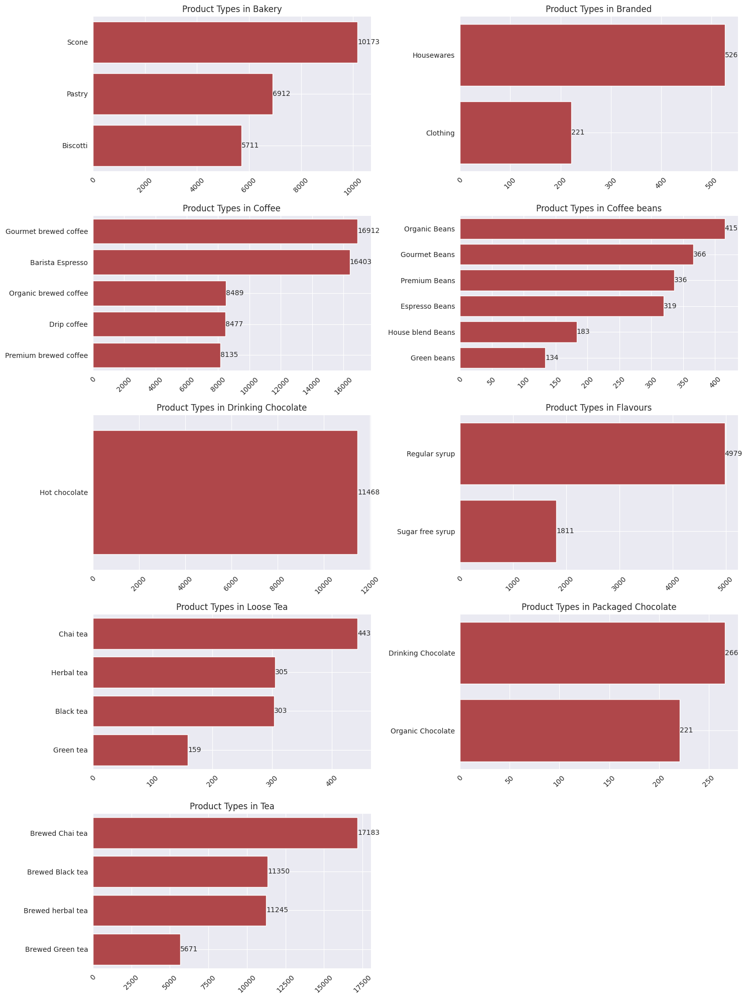

In [ ]:
# Assuming 'counts' is the DataFrame obtained from your groupby operation

counts = df.groupby(["product_category", "product_type"]).size().reset_index(name = "count")

# Get unique categories
categories = counts['product_category'].unique()

# Create subplots for each category in a 4x2 grid
fig, axes = plt.subplots(5, 2, figsize = (15, 20))

# Flatten the axes for easier iteration
axes = axes.flatten()

for i, category in enumerate(categories):
    # Filter data for each category
    subset = counts[counts['product_category'] == category]

    # Sort the data by 'count' column in descending order
    subset = subset.sort_values('count', ascending = False)

    # Create a bar plot for each category with sorted order
    sns.barplot(x = 'count', y = 'product_type', data = subset, ax = axes[i], order = subset['product_type'])
    axes[i].set_title(f'Product Types in {category}')
    axes[i].set_ylabel('')
    axes[i].set_xlabel('')
    axes[i].tick_params(axis = 'x', rotation = 45)
    axes[i].grid(True)

    # Adding bar labels
    for idx, bar in enumerate(axes[i].patches):
        axes[i].text(bar.get_width(), bar.get_y() + bar.get_height() / 2, subset.iloc[idx]['count'], ha = 'left', va = 'center')

# Hide extra subplots if there are fewer categories than subplots
for j in range(len(categories), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


### Discovering `product_detail` column

In [ ]:
# see unique values

df["product_detail"].unique()

array(['Ethiopia Rg', 'Spicy Eye Opener Chai Lg', 'Dark chocolate Lg',
       'Our Old Time Diner Blend Sm', 'Oatmeal Scone',
       'Columbian Medium Roast Sm', 'Latte Rg', 'Dark chocolate Rg',
       'Spicy Eye Opener Chai Rg', 'Ethiopia Lg', 'Earl Grey Lg',
       'Ouro Brasileiro shot', 'Serenity Green Tea Lg',
       'Jumbo Savory Scone', 'Lemon Grass Rg',
       'Sustainably Grown Organic Lg', 'Hazelnut Biscotti', 'Cappuccino',
       'Lemon Grass Lg', 'Chocolate Chip Biscotti', 'Peppermint Lg',
       'Chocolate Croissant', 'Latte', 'Brazilian Rg', 'Brazilian Lg',
       'Columbian Medium Roast Rg', 'Morning Sunrise Chai Rg',
       'Morning Sunrise Chai Lg', 'Our Old Time Diner Blend Lg',
       'Sustainably Grown Organic Rg', 'Scottish Cream Scone ',
       'Peppermint Rg', 'English Breakfast Rg',
       'Our Old Time Diner Blend Rg', 'Serenity Green Tea Rg',
       'Brazilian Sm', 'Jamaican Coffee River Sm',
       'Jamaican Coffee River Lg', 'Ginger Biscotti',
       'Tradit

In [ ]:
# add new column revenue

df["Total revenue"] = df["transaction_qty"] * df["unit_price"]

In [ ]:
# see sample of data

df.sample(5)

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail,z_score_qty,z_score_price,year,month,day,hour,Total revenue
81194,81368,2023-05-01,2024-11-12 18:42:16,1,8,Hell's Kitchen,54,2.50,Tea,Brewed Chai tea,Morning Sunrise Chai Rg,-0.807872,-0.331822,2023,May,Monday,18,2.50
77893,78063,2023-04-27,2024-11-12 17:40:38,1,5,Lower Manhattan,52,2.50,Tea,Brewed Chai tea,Traditional Blend Chai Rg,-0.807872,-0.331822,2023,April,Thursday,17,2.50
123177,123514,2023-06-09,2024-11-12 09:01:35,1,5,Lower Manhattan,75,4.38,Bakery,Pastry,Croissant,-0.807872,0.375287,2023,June,Friday,9,4.38
137733,138070,2023-06-21,2024-11-12 08:15:56,1,3,Astoria,69,3.25,Bakery,Biscotti,Hazelnut Biscotti,-0.807872,-0.049731,2023,June,Wednesday,8,3.25
98575,98829,2023-05-17,2024-11-12 18:12:27,2,5,Lower Manhattan,60,3.75,Drinking Chocolate,Hot chocolate,Sustainably Grown Organic Rg,1.035422,0.138330,2023,May,Wednesday,18,7.50


## Columns Insights📊📉📈

- **Year**, Sales exclusively from 2023.
- **Month**, Most sales within a six-month period
- **Hour**, Most sales were from 8 am to 11 pm
- **Transaction quantity**, Most sales were singles followed by 2 lots
- **Stores**, The sales rates of the three stores were similar, with the most significant difference observed at the `Hell's Kitchen` store
- **Unit price**, Price distribution is `positively skewed`, We understand from this that most Coffee have lower prices,while a few Coffee have higher prices
- **Category :**
     - it's evident that the three stores offer a wide range of services.
     - `Coffee` stands as the best-selling product.
     - `Tea` also exhibits a high sales rate.
- **product type :**
     - In the **Bakery** category, the most sold item is the **scone**
     - In the **Branded** category, the best-selling item is **Housewares**
     - In the **Coffee** category, the best-selling item is **Gourmet brewed coffee**
     - In the **Coffee beans** category, the best-selling item is **Organic Beans**
     - The **Drinking Chocolate** category solely offers **hot chocolate**
     - **Regular syrup** are the top-selling items in the **Flavours** category
     - In the **Loose Tea** category, the best-selling item is **Chai tea**
     - In the **Packaged Chocolate** category, the best-selling item is **Drinking Chocolate**
     - In the **Tea** category, the best-selling item is **Brewed Chai tea**

## Bivariate Analysis & Visualizations 📊📉📈

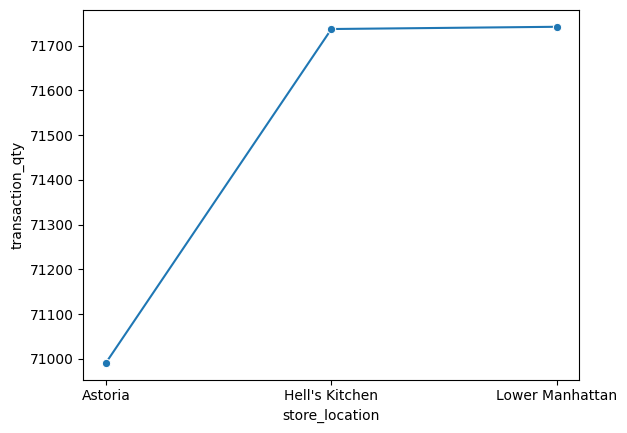

In [ ]:
# stores Vs transaction quantities

# Calculate sum of transaction quantities for each store_location
sum_transaction_qty = df.groupby("store_location")["transaction_qty"].sum().reset_index()

# create line plot
sns.lineplot(x = "store_location", y = "transaction_qty", data = sum_transaction_qty, marker = "o")
plt.show()

**🛑 We can see :**
   - The sales ratios for quantities seem to be quite similar across all stores

In [ ]:
# Stores Vs Total revenue

# Calculate total revenue for each store_location
revenue = df.groupby("store_location")["Total revenue"].sum().reset_index()

# create bar plot
ax = sns.barplot(x = "store_location", y = "Total revenue", data = revenue)

# Adding labels to each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center',
                xytext = (0, 5), textcoords = 'offset points')

plt.show()

**We can see :**
- The total revenue generated from sales at each store location amounted to $232,243.91 for Astoria, $236,511.17 for `Hell's Kitchen`, and $230,057.25 for `Lower Manhattan`
- **"Hell's Kitchen"** appears to be the best store in terms of revenue.

In [ ]:
# Stores VS product categories

# Calculate number of product categories at each store location
popular_products = df.groupby('store_location')[['product_category']].value_counts().reset_index(name='count')

# set figure size
plt.figure(figsize=(10, 5))

# Create a bar plot
sns.barplot(x = 'store_location', y = 'count', hue = 'product_category', data = popular_products, palette = "RdBu")

plt.tight_layout()
plt.show()

- **Astoria Store :**
    - The highest selling product category is **Coffee** with a count of **20,025** units
    - Following Coffee, **Tea** stands as the second most popular category with a count of **16,260** units
    - Other categories like Bakery, Drinking Chocolate, Flavours, Coffee beans, Loose Tea, Branded, and Packaged Chocolate have        varying counts, ranging from **7289** to **110** units, in **descending order**
<p>&nbsp;</p>

- **Hell's Kitchen Store :**
    - Similar to Astoria, **Coffee** leads in sales, amounting to **20,187** units
    - **Tea** follows closely as the second most popular category with **15,277** units
    - Other categories, such as Bakery, Drinking Chocolate, Flavours, Coffee beans, Loose Tea, Packaged Chocolate, Branded, and Packaged Chocolate, have counts ranging from **7617** to **119** units  
<p>&nbsp;</p>

- **Lower Manhattan Store :**
    - **Coffee** is again the top-selling category with **18,204** units
    - **Tea** follows with **13,912** units
    - Bakery, Drinking Chocolate, Flavours, Coffee beans, Loose Tea, Branded, Packaged Chocolate have counts ranging from **7890** to **180** units, in **descending order**

In [ ]:
# Stores VS Most transaction_qty

# grouped 'store_location' and 'transaction_qty' as columns
grouped_data = df.groupby("store_location")["transaction_qty"].value_counts().reset_index(name = "count")

# set figure size
plt.figure(figsize=(10, 5))

# Create bar plot
sns.barplot(x = "store_location", y = "count", hue = "transaction_qty", data = grouped_data)

plt.tight_layout()
plt.show()

NameError: name 'df' is not defined

- **Astoria Store :**
    - The most frequent transaction quantity observed is **1**, with a count of **30,207** instances
    - The second most frequent transaction quantity is **2**, noted **20,392** times
<p>&nbsp;</p>
- **Hell's Kitchen Store:**
    - The most frequent transaction quantity observed is **1**, noted **29,793** times
    - The second most frequent transaction quantity is **2**, observed **20,932** times
    - Additionally, there are **8** transactions with a quantity of **8**
<p>&nbsp;</p>
- **Lower Manhattan Store:**
    - The most frequent transaction quantity observed is **1**, recorded **27,159** times.
    - The second most frequent transaction quantity is **2**, seen **17,318** times.
    - There are occurrences of transaction quantities **3**, **4**, and **6**, but they are less frequent compared to quantities **1** and **2**

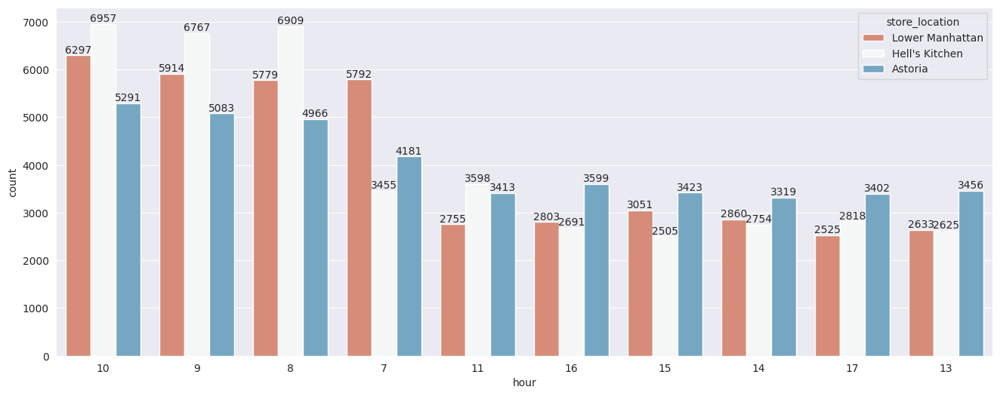

In [ ]:
# Stores VS Hour sales

# set figure size
plt.figure(figsize=(16, 6))

# call function i create it in cell 12
count_plot(x_axis = "hour", hue = "store_location", top = 10)

- **Astoria Store :**
    - Peak hours are from **9 AM** to **10 AM**, and from **4 PM** to **5 PM**, with counts ranging between **5,083** and **5,291** during these periods
    - The least busy hours are from **7 AM** to **8 AM**, with counts ranging between **4,181** and **4,966**
<p>&nbsp;</p>
- **Hell's Kitchen Store :**
    - Busiest hours are from **8 AM** to **10 AM**, with counts ranging between **6,767** and **6,909**
    - The least busy hours are from **6 AM** to **7 AM** and from **6 PM** to **8 PM**
<p>&nbsp;</p>
- **Lower Manhattan Store :**
    - Peak hours are from **9 AM** to **10 AM**, with a count of **6,297**, and from **2 PM** to **3 PM**, with a count of **3,051**
    - The least busy hours are from **7 PM** to **8 PM**, with counts dropping to **75** and **125**

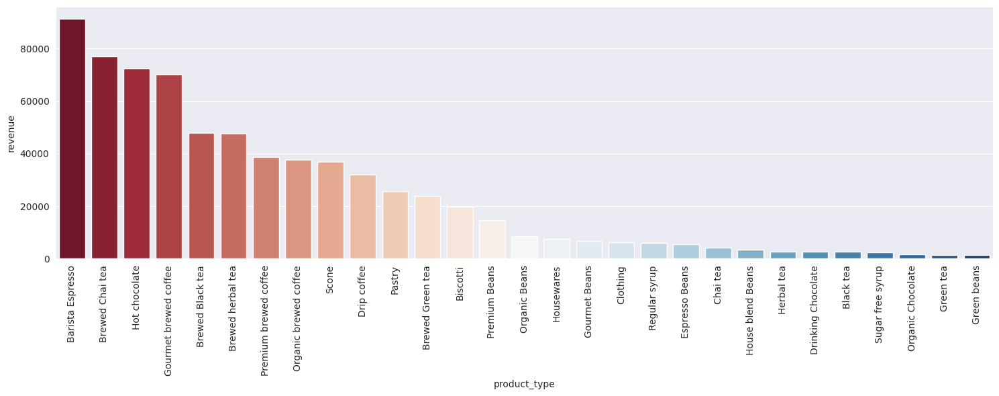

In [ ]:
# Category VS Total revenue

# grouped product_type' and 'Total revenue'
category_revenue = data.groupby("product_type")["Total revenue"].sum().reset_index(name = "revenue")

# sort category by revenue
category_revenue = category_revenue.sort_values(by = 'revenue', ascending = False)

# set figure size
plt.figure(figsize = (15,6))

# create bar plot
sns.barplot(x = "product_type", y = "revenue", data = category_revenue, palette = "RdBu")

# set x-axis rotation
plt.xticks(rotation = 90)

plt.tight_layout()
plt.show()

- **Top Revenue Product Types :**
   - **Barista Espresso** with a revenue of **91,406.20**
   - **Brewed Chai tea** with a revenue of **77,081.95**
   - **Hot chocolate** with a revenue of **72,416.00**
   - **Gourmet brewed coffee** with a revenue of **70,034.60**
   - **Brewed Black tea** with a revenue of **47,932.00**
<p>&nbsp;</p>
- **Lowest Revenue Product Types :**
   - **Organic Chocolate** with a revenue of **1,679.60**
   - **Green tea** with a revenue of **1,470.75**
   - **Green beans** with a revenue of **1,340.00**
<p>&nbsp;</p>
- **Other Observations :**
    - Various products contribute to revenue across different ranges, with a mix of beverages (like **teas, coffees**) and snacks (**biscotti, pastries**).
    - **Coffee-related products**, such as various brews and espresso variants, hold prominent positions in revenue generation.
    - The lowest revenue-generating products are predominantly related to **tea** and specific beverage variants.

In [ ]:
# Month VS revenue

# Grouping by month and summing the revenue
monthly_revenue  = df.groupby("month")["Total revenue"].sum().reset_index().sort_values(by = "Total revenue")

# create line plot
sns.lineplot(x = "month", y = "Total revenue", data = monthly_revenue , marker = "o")

plt.tight_layout()
plt.show()

KeyError: 'Column not found: Total revenue'

- **We can see 🎛️📊 :**
    - **Jun**e had the highest total revenue, reaching **166,485.88**, making it the most profitable month.
    - **May** followed closely behind with a total revenue of **156,727.76**, indicating strong performance.
    - **Apri**l and **March** also performed well, generating revenues of **118,941.08** and **98,834.68**, respectively.
    - **January** and **February** had comparatively lower revenue figures at **81,677.74** and **76,145.19**, respectively.

# Q1. How have Maven Roasters sales trended over time?

This questions can be asnwered by tracking daily or weekly revenue. In addition to the revenue, it would also be interesting to follow the corresponding number of items sold each day (week), and then to see the correlation between the two, as a scalar value and on a scatterplot. Obviously, the correlation should be strong, as the two series are linearly dependent, but it never hurts to counter-check.

## Daily totals.

Finding the revenue and items sold on each day is a plain and simple matter of grouping the transaction data by date. After that, I can plot the daily revenues and the number of items sold on separate graphs, as well as a scatterplot of the two.

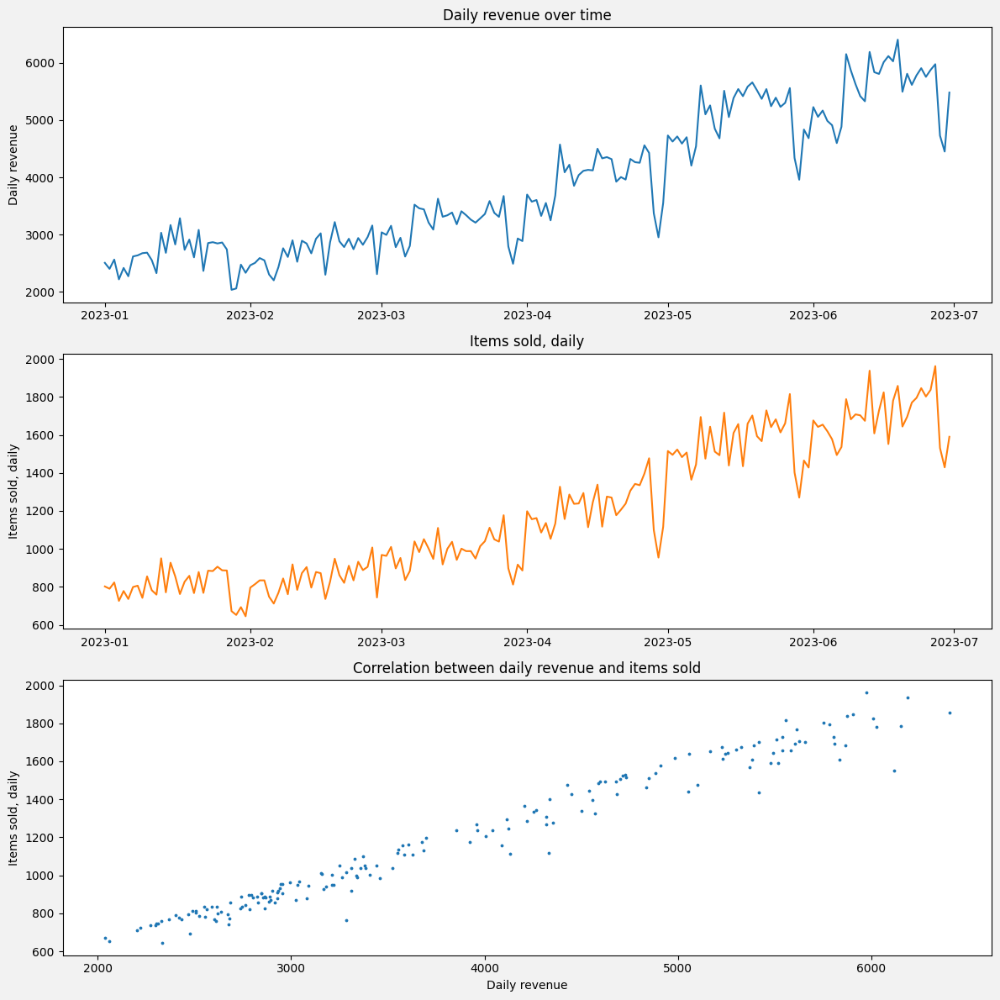

In [ ]:
# Group by date to get the daily revenue and items sold
daily_totals = (df[['transaction_date', 'total_amount', 'transaction_qty']]
                .groupby('transaction_date')
                .agg('sum')
                ) # OK

# which is roughly equivalent to
'''
SELECT transaction_date, sum(total_amount) total_amount, sum(transaction_qty) transaction_qty
FROM ds_vw
GROUP BY transaction_date
ORDER BY transaction_date
'''

# and plot both trends over the whole time period
fig, (ax_amt, ax_items, corr) = plt.subplots(3, 1, figsize=(12,12))

# Daily revenue over time
ax_amt.plot(daily_totals.index, daily_totals.total_amount)
ax_amt.set_title('Daily revenue over time')
ax_amt.set_ylabel('Daily revenue')

# Items sold, daily
ax_items.plot(daily_totals.index, daily_totals.transaction_qty, c='tab:orange')
ax_items.set_title('Items sold, daily')
ax_items.set_ylabel('Items sold, daily')

# Correlation scatterplot
corr.scatter(daily_totals.total_amount, daily_totals.transaction_qty, s = 3)
corr.set_title('Correlation between daily revenue and items sold')
corr.set_xlabel('Daily revenue')
corr.set_ylabel('Items sold, daily')

fig.set_facecolor(PLOT_COLOR)
fig.tight_layout()

It can be seen that the sales are increasing over time, albeit irregularly, with a number of distinct troughs which tend to occur at the end of each month. The troughs are present in both the daily revenue and the number of items sold, suggesting regular sales reductions across all (or most of) items. The scatterplot, as well as the correlation coefficient below, show that the two series correlate with each other perfectly.

In [ ]:
# The standard correlation coefficient (pearson)
daily_totals['total_amount'].corr(daily_totals['transaction_qty'])

0.9839324028845456

The abovementioned end-of-month changes in daily revenues and items sold are also pronounced on the plots below which show the absolute day-on-day percentage change for both data series:

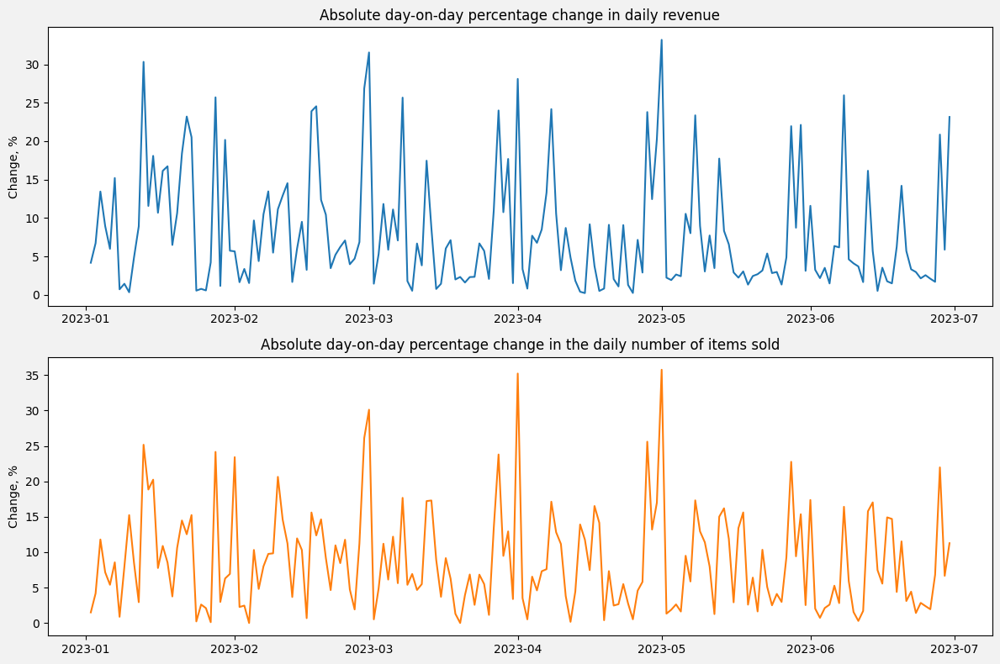

In [ ]:
abs_pct_change = (daily_totals
                  .pct_change()
                  .abs()
                  .dropna()
                 ) * 100

fig, (ax_amt, ax_items) = plt.subplots(2, 1, figsize=(12,8))

ax_amt.plot(abs_pct_change.index, abs_pct_change.total_amount)
ax_amt.set_title('Absolute day-on-day percentage change in daily revenue')
ax_amt.set_ylabel('Change, %')

ax_items.plot(abs_pct_change.index, abs_pct_change.transaction_qty, c='tab:orange')
ax_items.set_title('Absolute day-on-day percentage change in the daily number of items sold')
ax_items.set_ylabel('Change, %')

fig.set_facecolor(PLOT_COLOR)
fig.tight_layout()

## Weekly totals.

In a similar fashion, we can plot weekly totals for the revenue and items sold, adding the correlation scatterplot afterwards, but not before removing the incomplete weeks which I identified in the "Data Integrity Checks" section. For the sake of variety, let me go for bar plots this time.

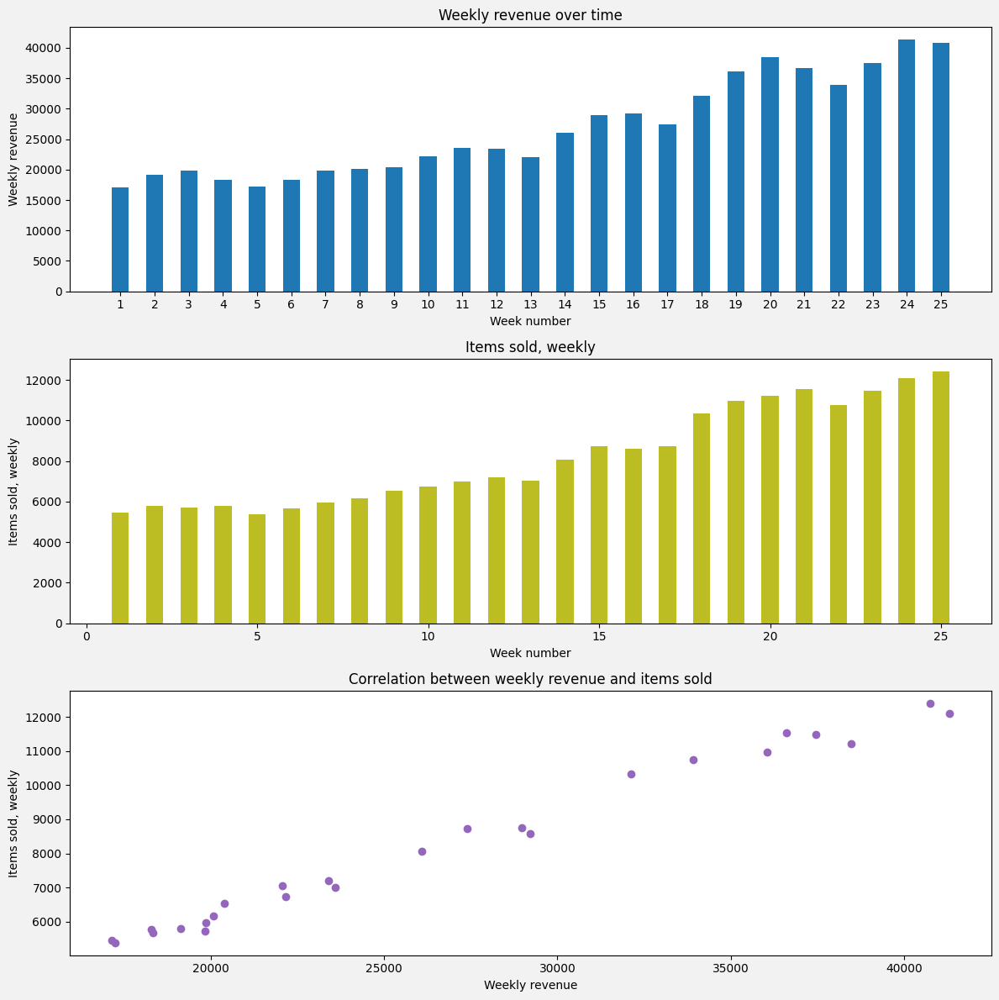

In [ ]:
weekly_totals = (df[['total_amount', 'transaction_qty']]
                 .groupby(df.transaction_date.dt.isocalendar().week)
                 .agg('sum')
                )

# Removing outlier partial weeks
weekly_totals = weekly_totals[weekly_totals.index < len(weekly_totals) - 1]

fig, (ax_amt, ax_items, corr) = plt.subplots(3, 1, figsize=(12,12))

# Weekly revenue over time
ax_amt.bar(weekly_totals.index, weekly_totals.total_amount, width=0.5)
#ax_amt.plot(weekly_totals.index, weekly_totals.total_amount)
ax_amt.set_title('Weekly revenue over time')
ax_amt.set_xlabel('Week number')
ax_amt.set_ylabel('Weekly revenue')
ax_amt
ax_amt.set_xticks(range(1, len(weekly_totals) + 1))

#Items sold, weekly
ax_items.bar(weekly_totals.index, weekly_totals.transaction_qty, color='tab:olive', width=0.5)
#ax_items.plot(weekly_totals.index, weekly_totals.transaction_qty)
ax_items.set_title('Items sold, weekly')
ax_items.set_xlabel('Week number')
ax_items.set_ylabel('Items sold, weekly')

# Correlation scatterplot
corr.scatter(weekly_totals.total_amount, weekly_totals.transaction_qty, color='tab:purple')
corr.set_title('Correlation between weekly revenue and items sold')
corr.set_xlabel('Weekly revenue')
corr.set_ylabel('Items sold, weekly')

fig.set_facecolor(PLOT_COLOR)
fig.tight_layout()

As with the daily totals, theese results also suggest steady growth over time, with peaks and troughs smoothed over by choosing a longer "group by" period. As far as the correlation between the weekly totals is concerned, it is even a tad higher than between the daily ones:

In [ ]:
# The standard correlation coefficient (pearson)
weekly_totals['total_amount'].corr(weekly_totals['transaction_qty'])


0.9938190333739547

# Q2. Which days of the week tend to be [the] busiest, and why do you think that's the case?

Having defined the degree of being "busy" in terms of the amount of items sold in a day, we can use `daily_totals` to find out the rate of activity for each day. To that end, I will map dates to weekdays before grouping `daily_totals` by weekdays and applying common aggregate functions to the `transaction_qty` values, like so:

In [ ]:
busydays = (daily_totals[['transaction_qty']]
            .groupby([daily_totals.index.dayofweek, daily_totals.index.day_name()])
            .agg(['mean', 'median', 'min', 'max', ('pop_st_dev', lambda s : s.std(ddof=0))])
            .droplevel(0, axis=1)
            .sort_values('mean', ascending=False)
           )

busydays.index = busydays.index.rename(['day_number', 'dayname'])
busydays['mean_share'] = 100 * busydays['mean'] / busydays['mean'].sum()
busydays['median_share'] = 100 * busydays['median'] / busydays['median'].sum()
busydays

,,mean,median,min,max,pop_st_dev,mean_share,median_share
day_number,dayname,,,,,,,
0,Monday,1201.192308,1139.5,693,1858,369.753454,14.481957,15.146883
4,Friday,1200.269231,1105.0,736,1824,355.495057,14.470828,14.688289
3,Thursday,1198.538462,1046.5,759,1788,356.319134,14.449961,13.910674
5,Saturday,1184.560000,1050.0,672,1846,367.168962,14.281432,13.957198
2,Wednesday,1177.884615,1087.5,726,1695,323.281293,14.200952,14.455669
1,Tuesday,1171.115385,1017.5,645,1962,390.191110,14.119340,13.525189
6,Sunday,1160.846154,1077.0,652,1802,337.125940,13.995531,14.316097


The `std` optimized groupby method, which could be called by its string name, just like `mean` or `median`, would return the standard deviation for a sample. Since we have the full set, I used a lambda function to get the population standard deviation. I also added normalized values for the arithmetic mean and the median, as well as day numbers as the zero-level index to be able to sort the DataFrame by days of the week, in the usual order. The rest of the columns, I believe, speak for themselves.

As the results show, the busiest day is Monday, though not by far. Indeed, the percentage share of the arithmetic mean for all days but Sunday hover above 14% and is more or less the same. No day stands out significantly in terms of the total amount of sold items.

The absense of significant variations in activity between different days of the week can be shown on a plot, using the columns from `busydays`:

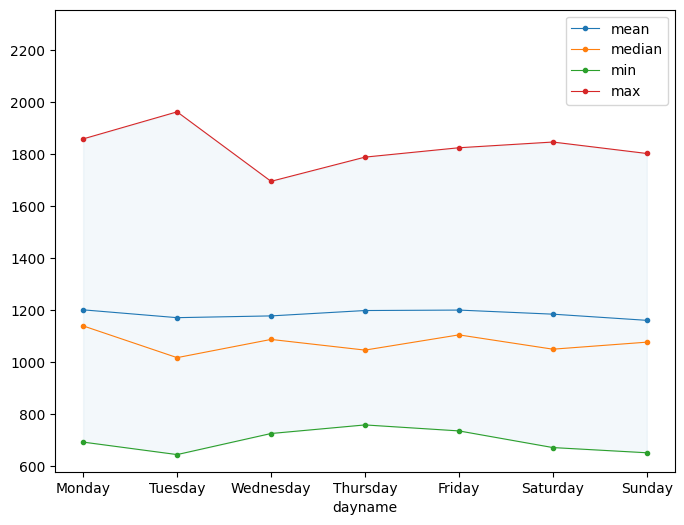

In [ ]:
busyplot = (busydays[['mean', 'median', 'min', 'max']]
            .sort_index(level=0)
            .droplevel(level=0, axis=0)
           )

ax = busyplot.plot(figsize=(8,6), linewidth = 0.8, marker = '.')

ax.set_ylim(top = 1.2 * busyplot['max'].max())

ax.fill_between(x = busyplot.index,
                y1 = busyplot['min'],
                y2 = busyplot['max'],
                alpha = 0.05,
                color= 'tab:blue'
               )

_ = ax.legend(loc = 'upper right')

# Q3. Which products are sold most and least often?

As we have confirmed a direct mapping correspondence between the `product_id` and `product_detail` fields, we can group the original DataFrame by these two fields and apply the `sum()` aggregate function to `transaction_qty`, before sorting by the aggregate result. Taking advantage of the default printing behaviour of DataFrames (the five first and five last rows) will show us the five most and least often sold items:

In [ ]:
products = (df[['product_id', 'product_detail', 'transaction_qty']]
            .groupby(['product_id', 'product_detail'])
            .sum()
            .sort_values('transaction_qty', ascending=False)
           )

# roughly equivalent to
'''
-- The 5 top and bottom items in terms of quantities sold

WITH products AS
(SELECT product_id, product_detail, sum(transaction_qty) transaction_qty
FROM ds_vw
GROUP BY product_id, product_detail
ORDER BY sum(transaction_qty) DESC),

cashcows AS -- Since we cannot use LIMIT with UNION [ALL], can we?
(SELECT * FROM products LIMIT 5),

cashhogs AS
(SELECT * FROM products LIMIT (SELECT count(*) FROM products) - 5, 5)

SELECT * FROM cashcows
UNION ALL
SELECT "..." product_id, "..." product_detail, "..." transaction_qty
UNION ALL
SELECT * FROM cashhogs
'''

products

,,transaction_qty
product_id,product_detail,
50,Earl Grey Rg,4708
59,Dark chocolate Lg,4668
54,Morning Sunrise Chai Rg,4643
38,Latte,4602
44,Peppermint Rg,4564
...,...,...
7,Jamacian Coffee River,146
14,Earl Grey,142
10,Guatemalan Sustainably Grown,134


# Q4. Which [products] drive the most revenue for the business?

Making use of the `total_amount` column I added earlier, to answer this question one needs to group by `product_id` and `product_detail` before applying the `sum()` aggregation on `total_amount`. Here is the top 10 items in terms of total revenue, with normalized values also added:

In [ ]:
cashcows = (df[['product_id', 'product_detail', 'total_amount']]
            .groupby(['product_id', 'product_detail'])
            .sum()
            .sort_values('total_amount', ascending=False)
           )
cashcows['% share'] = 100 * cashcows.total_amount / cashcows.total_amount.sum()

# roughly equivalent to
'''
WITH product_revenue AS
(SELECT product_id, product_detail, sum(total_amount) total_amount
FROM ds_vw
GROUP BY product_id, product_detail
ORDER BY 3 DESC)

SELECT *, 100 * total_amount / (SELECT sum(total_amount) FROM product_revenue) "% share"
FROM product_revenue
LIMIT 10
'''
cashcows.head(10)

,,total_amount,% share
product_id,product_detail,,
61,Sustainably Grown Organic Lg,21151.75,3.026814
59,Dark chocolate Lg,21006.00,3.005957
39,Latte Rg,19112.25,2.734962
41,Cappuccino Lg,17641.75,2.524533
55,Morning Sunrise Chai Lg,17384.00,2.487649
38,Latte,17257.50,2.469547
36,Jamaican Coffee River Lg,16481.25,2.358466
60,Sustainably Grown Organic Rg,16233.75,2.323049
40,Cappuccino,15997.50,2.289241


When it comes to identifying products that drive sales the most, there is a kind of analysis called ABC analysis, which categorizes products into three groups based on their contribution to the business. I invite you to check out the ABC analysis which I performed on this entire dataset, and on all of the locations separately, using pandas and SQL.

# Conclusion.

This notebook has explored the Coffee Shop Sales dataset by addressing various sales- and product-related questions.

The high quality of the dataset made it possible to bypass the usual time-consuming data cleansing steps, although some data checks were performed to enhance understanding of the underlying data.

For certain analyses, near-equivalent SQL queries were provided alongside the pandas code, facilitating result verification and comparison.

Additionally, visualizations were included where relevant to illustrate the findings clearly.

Thanks for reading!

### Import libaries and Data



In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_excel('/kaggle/input/coffee-sales/Coffee Shop Sales.xlsx', index_col = 0)
df.head(5)

,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail
transaction_id,,,,,,,,,,
1,2023-01-01,07:06:11,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg
2,2023-01-01,07:08:56,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg
3,2023-01-01,07:14:04,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg
4,2023-01-01,07:20:24,1,5,Lower Manhattan,22,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm
5,2023-01-01,07:22:41,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg


### How have Maven Roasters sales trended over time?

In [ ]:
df['total_sales'] = df['transaction_qty'] * df['unit_price']
df.head()

,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail,total_sales
transaction_id,,,,,,,,,,,
1,2023-01-01,07:06:11,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg,6.0
2,2023-01-01,07:08:56,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,6.2
3,2023-01-01,07:14:04,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg,9.0
4,2023-01-01,07:20:24,1,5,Lower Manhattan,22,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm,2.0
5,2023-01-01,07:22:41,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,6.2


/tmp/ipykernel_18/2329549697.py:2: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_sales = df.groupby(pd.Grouper(key='transaction_date', freq='M'))['total_sales'].sum().reset_index()


grown_rate : 203.83%
grown_rate_per_month : 33.97%


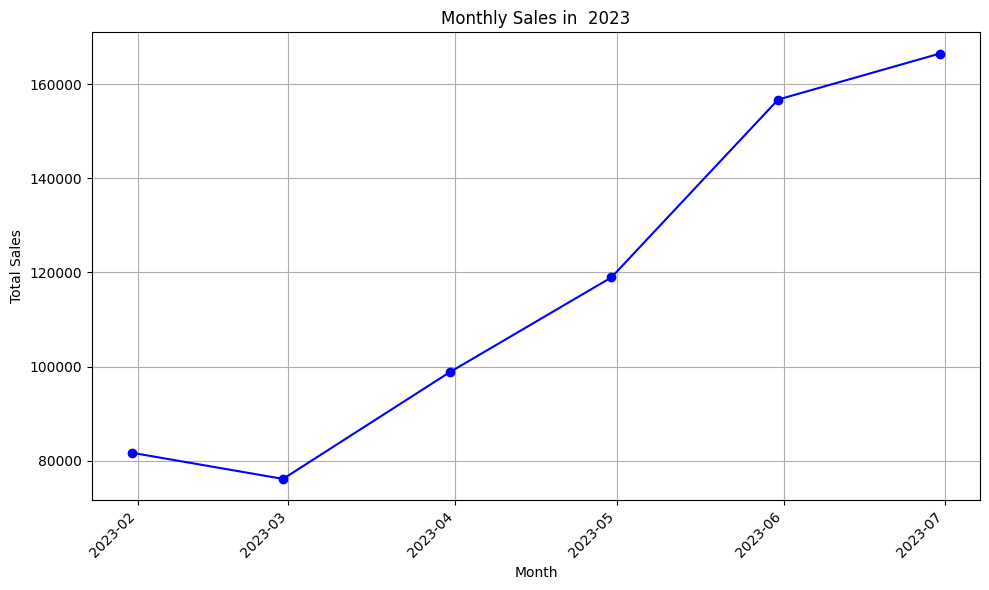

In [ ]:
df['transaction_date'] = pd.to_datetime(df['transaction_date'])
monthly_sales = df.groupby(pd.Grouper(key='transaction_date', freq='M'))['total_sales'].sum().reset_index()
grown_rate = round(monthly_sales['total_sales'][5]*100/monthly_sales['total_sales'][0], 2)
grown_rate_per_m = round(grown_rate / 6, 2)

print('grown_rate : '+str(grown_rate)+'%')
print('grown_rate_per_month : '+str(grown_rate_per_m)+'%')

plt.figure(figsize=(10, 6))
plt.plot(monthly_sales.transaction_date, monthly_sales.total_sales, marker='o', linestyle='-', color='blue')

plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.title('Monthly Sales in  2023')

plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.tight_layout()
plt.show()

Based on the revenue graph, there has been a significant overall increase in sales, rising by **203.83%** from the first month. On average, this translates to a **monthly growth rate of 33.97%**.

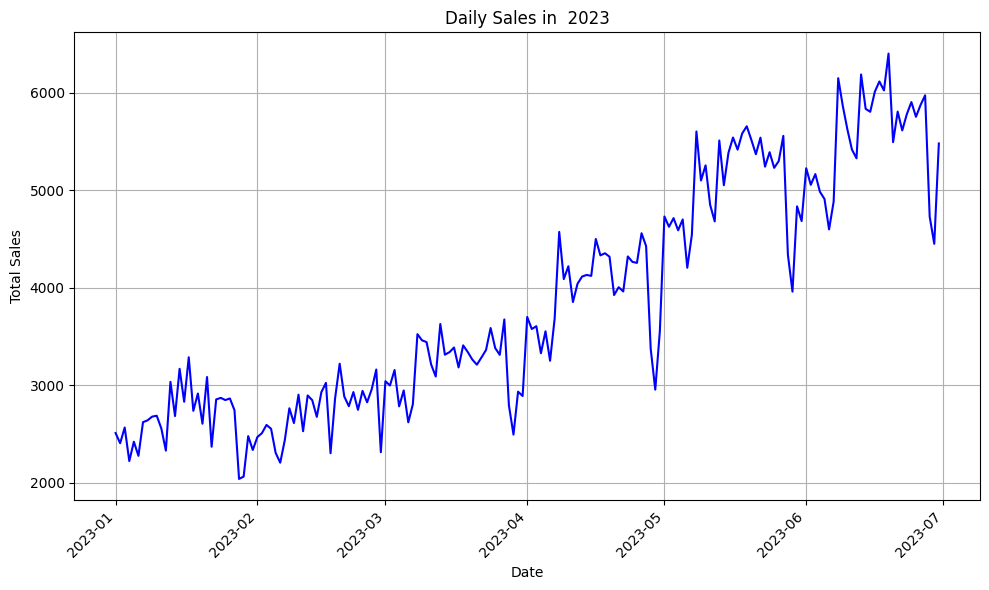

In [ ]:
daily_sales = df.groupby('transaction_date')['total_sales'].sum()

plt.figure(figsize=(10, 6))
plt.plot(daily_sales.index, daily_sales.values, linestyle='-', color='blue')

plt.xlabel('Date')
plt.ylabel('Total Sales')
plt.title('Daily Sales in  2023')

plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.tight_layout()
plt.show()

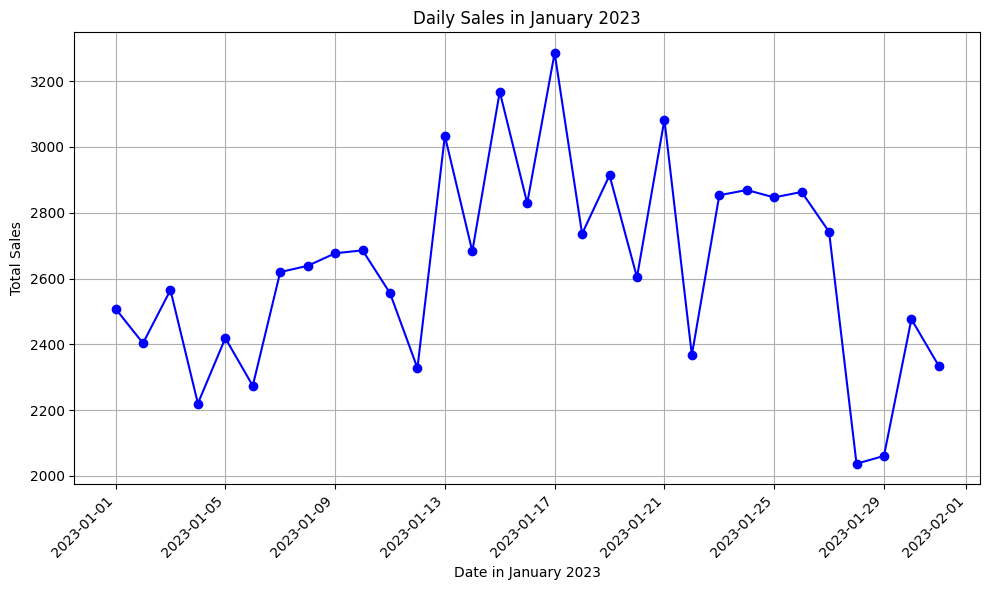

In [ ]:
january_sales = df[df['transaction_date'].dt.month == 1].groupby('transaction_date')['total_sales'].sum()

plt.figure(figsize=(10, 6))
plt.plot(january_sales.index, january_sales.values, marker='o', linestyle='-', color='blue')

plt.xlabel('Date in January 2023')
plt.ylabel('Total Sales')
plt.title('Daily Sales in January 2023')

plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.tight_layout()
plt.show()


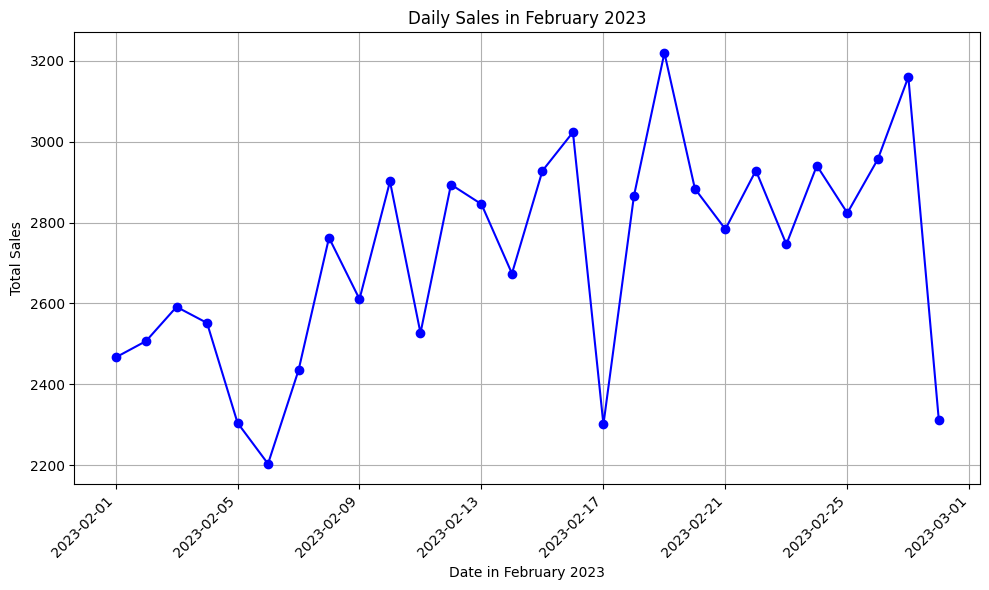

In [ ]:
february_sales = df[df['transaction_date'].dt.month == 2].groupby('transaction_date')['total_sales'].sum()

plt.figure(figsize=(10, 6))
plt.plot(february_sales.index, february_sales.values, marker='o', linestyle='-', color='blue')

plt.xlabel('Date in February 2023')
plt.ylabel('Total Sales')
plt.title('Daily Sales in February 2023')

plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.tight_layout()
plt.show()

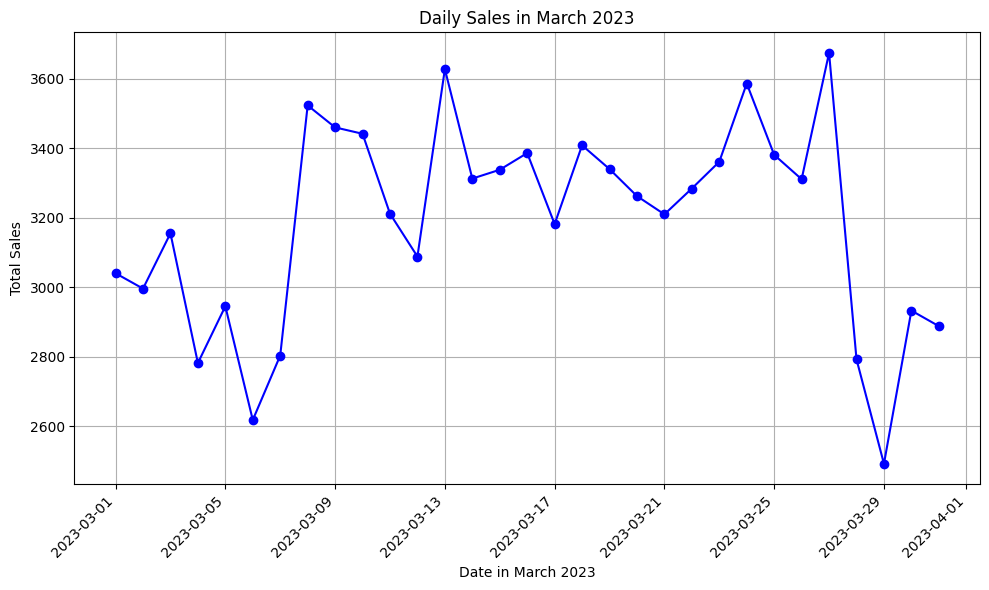

In [ ]:
march_sales = df[df['transaction_date'].dt.month == 3].groupby('transaction_date')['total_sales'].sum()

plt.figure(figsize=(10, 6))
plt.plot(march_sales.index, march_sales.values, marker='o', linestyle='-', color='blue')

plt.xlabel('Date in March 2023')
plt.ylabel('Total Sales')
plt.title('Daily Sales in March 2023')

plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.tight_layout()
plt.show()

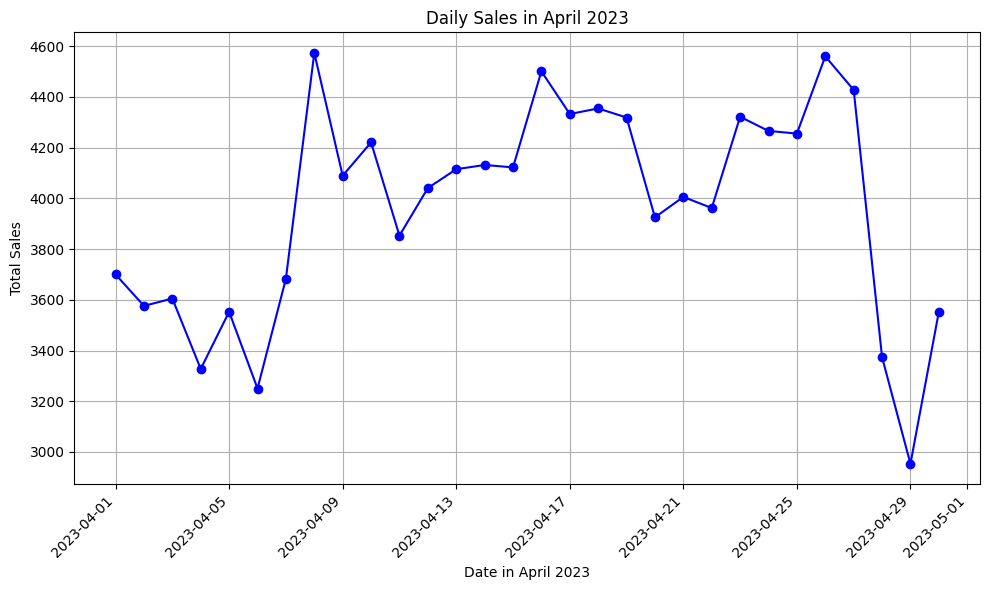

In [ ]:
april_sales = df[df['transaction_date'].dt.month == 4].groupby('transaction_date')['total_sales'].sum()

plt.figure(figsize=(10, 6))
plt.plot(april_sales.index, april_sales.values, marker='o', linestyle='-', color='blue')

plt.xlabel('Date in April 2023')
plt.ylabel('Total Sales')
plt.title('Daily Sales in April 2023')

plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.tight_layout()
plt.show()

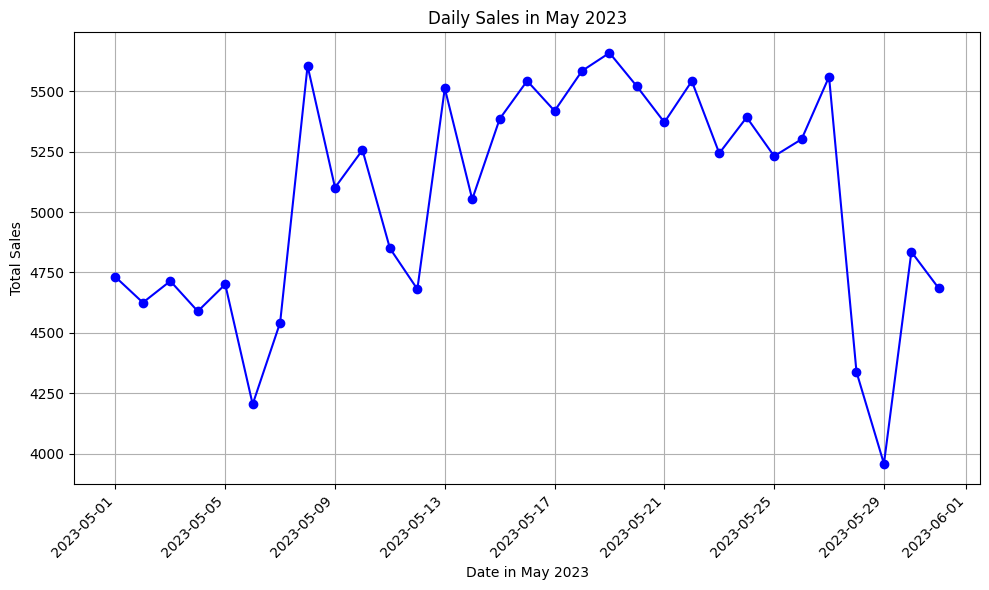

In [ ]:
may_sales = df[df['transaction_date'].dt.month == 5].groupby('transaction_date')['total_sales'].sum()

plt.figure(figsize=(10, 6))
plt.plot(may_sales.index, may_sales.values, marker='o', linestyle='-', color='blue')

plt.xlabel('Date in May 2023')
plt.ylabel('Total Sales')
plt.title('Daily Sales in May 2023')

plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.tight_layout()
plt.show()

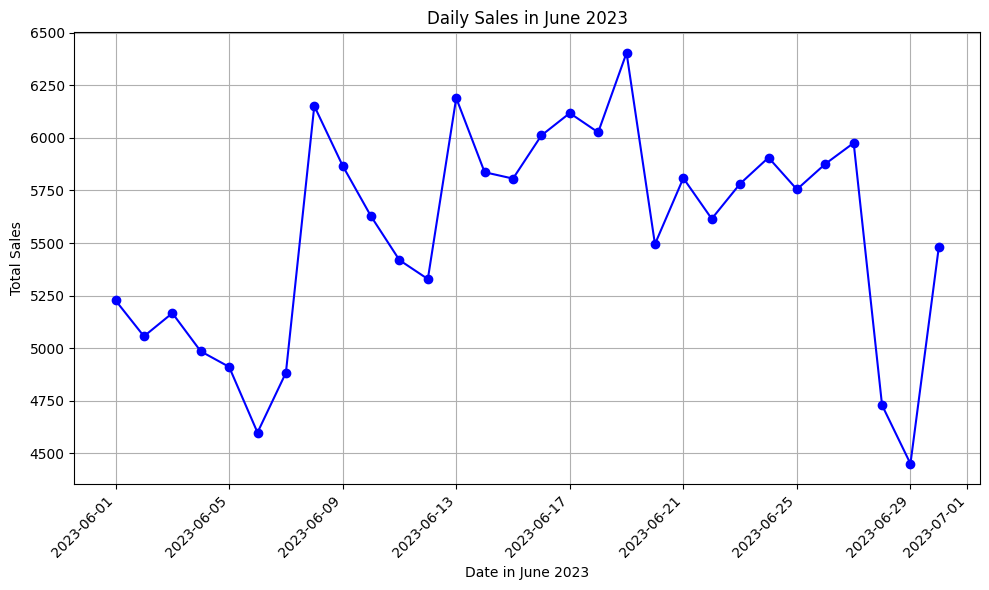

In [ ]:
june_sales = df[df['transaction_date'].dt.month == 6].groupby('transaction_date')['total_sales'].sum()

plt.figure(figsize=(10, 6))
plt.plot(june_sales.index, june_sales.values, marker='o', linestyle='-', color='blue')

plt.xlabel('Date in June 2023')
plt.ylabel('Total Sales')
plt.title('Daily Sales in June 2023')

plt.xticks(rotation=45, ha='right')

plt.grid(True)
plt.tight_layout()
plt.show()

The 6-month sales graph reveals a pattern of lower sales during specific periods: the beginning of the month (around the 1st to 6th), mid-month (around the 11th to 13th), and the end of the month (around the 28th to 29th). To address this, it would be wise to investigate the reasons behind these dips and implement strategies like targeted promotions to boost customer engagement during these times.

### Which days of the week tend to be busiest, and why do you think that's the case?

In [ ]:
df['day_of_week'] = df['transaction_date'].dt.day_name()

print(df[['transaction_qty', 'day_of_week']])

                transaction_qty day_of_week
transaction_id                             
1                             2      Sunday
2                             2      Sunday
3                             2      Sunday
4                             1      Sunday
5                             2      Sunday
...                         ...         ...
149452                        2      Friday
149453                        2      Friday
149454                        1      Friday
149455                        1      Friday
149456                        2      Friday

[149116 rows x 2 columns]


In [ ]:
qty_by_day = df.groupby('day_of_week')['transaction_qty'].sum().reset_index()

ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
qty_by_day['day_of_week'] = pd.Categorical(qty_by_day['day_of_week'], categories=ordered_days, ordered=True)
qty_by_day = qty_by_day.sort_values('day_of_week')

print(qty_by_day)

  day_of_week  transaction_qty
1      Monday            31231
5     Tuesday            30449
6   Wednesday            30625
4    Thursday            31162
0      Friday            31207
2    Saturday            29614
3      Sunday            30182


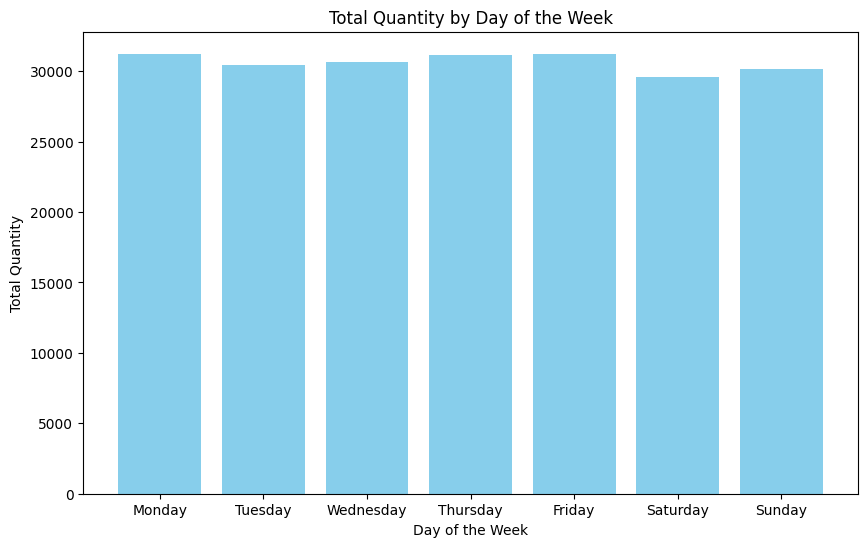

In [ ]:
plt.figure(figsize=(10, 6))
plt.bar(qty_by_day['day_of_week'], qty_by_day['transaction_qty'], color='skyblue')

plt.xlabel('Day of the Week')
plt.ylabel('Total Quantity')
plt.title('Total Quantity by Day of the Week')

plt.show()


###Which products are sold most and least often? Which drive the most revenue for the business?

In [ ]:
product_qty_sale = df.groupby('product_detail')['transaction_qty'].sum()

sorted_product_qty_sale_desc  = product_qty_sale.sort_values(ascending=False).head(5)
sorted_product_qty_sale_asc  = product_qty_sale.sort_values(ascending=True).head(5)

print(sorted_product_qty_sale_desc)
print(sorted_product_qty_sale_asc)

product_detail
Earl Grey Rg               4708
Dark chocolate Lg          4668
Morning Sunrise Chai Rg    4643
Latte                      4602
Peppermint Rg              4564
Name: transaction_qty, dtype: int64
product_detail
Dark chocolate                  118
Spicy Eye Opener Chai           122
Guatemalan Sustainably Grown    134
Earl Grey                       142
Jamacian Coffee River           146
Name: transaction_qty, dtype: int64


In [ ]:
product_sales = df.groupby('product_detail')['total_sales'].sum()

sorted_product_sales_desc = product_sales.sort_values(ascending=False)

top_five_max = sorted_product_sales_desc.head(5)

print("Top Five Products with Maximum Sales:")
print(top_five_max)

print(product_sales)

Top Five Products with Maximum Sales:
product_detail
Sustainably Grown Organic Lg    21151.75
Dark chocolate Lg               21006.00
Latte Rg                        19112.25
Cappuccino Lg                   17641.75
Morning Sunrise Chai Lg         17384.00
Name: total_sales, dtype: float64
product_detail
Almond Croissant                 7168.13
Brazilian - Organic              3852.00
Brazilian Lg                    15109.50
Brazilian Rg                    13155.00
Brazilian Sm                     9482.00
                                  ...   
Sustainably Grown Organic Lg    21151.75
Sustainably Grown Organic Rg    16233.75
Traditional Blend Chai           1369.35
Traditional Blend Chai Lg       12522.00
Traditional Blend Chai Rg       11280.00
Name: total_sales, Length: 80, dtype: float64


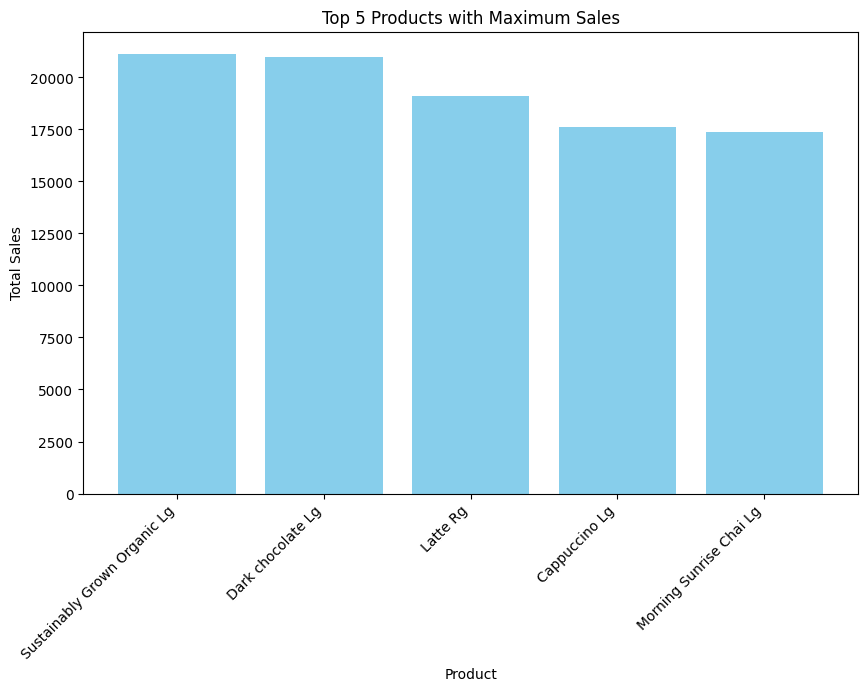

In [ ]:
top_five_max= pd.DataFrame(data=top_five_max).reset_index()
top_five_max.columns = ['product_detail', 'total_sales']

plt.figure(figsize=(10, 6))
plt.bar(top_five_max['product_detail'], top_five_max['total_sales'], color='skyblue')

plt.xlabel('Product')
plt.ylabel('Total Sales')
plt.title('Top 5 Products with Maximum Sales')

plt.xticks(rotation=45, ha='right')

plt.show()

<div style="text-align: center;">
  <img src="https://github.com/datax-official/datax-official/blob/main/assests/Data%20Analysis%20class%20bammer%20(1).png?raw=true" alt="Data X Banner" />
</div>

<h1 style="font-family:verdana;"> <center>Coffee Shop Sales Analysis</center> </h1>
<p><center style="color:#159364; font-family:cursive;">Turning data into Insights</center></p>

***


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_excel('/kaggle/input/coffee-sales/Coffee Shop Sales.xlsx')

In [ ]:
df.head()

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail
0,1,2023-01-01,07:06:11,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg
1,2,2023-01-01,07:08:56,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg
2,3,2023-01-01,07:14:04,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg
3,4,2023-01-01,07:20:24,1,5,Lower Manhattan,22,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm
4,5,2023-01-01,07:22:41,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg


In [ ]:
missing = df.isnull().sum()
missing

transaction_id      0
transaction_date    0
transaction_time    0
transaction_qty     0
store_id            0
store_location      0
product_id          0
unit_price          0
product_category    0
product_type        0
product_detail      0
dtype: int64

In [ ]:
df.shape

(149116, 11)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149116 entries, 0 to 149115
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   transaction_id    149116 non-null  int64         
 1   transaction_date  149116 non-null  datetime64[ns]
 2   transaction_time  149116 non-null  object        
 3   transaction_qty   149116 non-null  int64         
 4   store_id          149116 non-null  int64         
 5   store_location    149116 non-null  object        
 6   product_id        149116 non-null  int64         
 7   unit_price        149116 non-null  float64       
 8   product_category  149116 non-null  object        
 9   product_type      149116 non-null  object        
 10  product_detail    149116 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(4), object(5)
memory usage: 12.5+ MB


In [ ]:
df.duplicated().any()

False

In [ ]:
# see unique values in each column

# 1- create new data frame with number of unique value in each column
columnValue = df.nunique().reset_index()

# 2- rename column name
columnValue.rename(columns = {"index" : "Column _name", 0 : "Uniue values"}, inplace = True)

# 3- see columns and number of unique values of each
columnValue

,Column _name,Uniue values
0,transaction_id,149116
1,transaction_date,181
2,transaction_time,25762
3,transaction_qty,6
4,store_id,3
5,store_location,3
6,product_id,80
7,unit_price,41
8,product_category,9
9,product_type,29


In [ ]:
df.describe()

,transaction_id,transaction_date,transaction_qty,store_id,product_id,unit_price
count,149116.000000,149116,149116.000000,149116.000000,149116.000000,149116.000000
mean,74737.371872,2023-04-15 11:50:32.173609984,1.438276,5.342063,47.918607,3.382219
min,1.000000,2023-01-01 00:00:00,1.000000,3.000000,1.000000,0.800000
25%,37335.750000,2023-03-06 00:00:00,1.000000,3.000000,33.000000,2.500000
50%,74727.500000,2023-04-24 00:00:00,1.000000,5.000000,47.000000,3.000000
75%,112094.250000,2023-05-30 00:00:00,2.000000,8.000000,60.000000,3.750000
max,149456.000000,2023-06-30 00:00:00,8.000000,8.000000,87.000000,45.000000
std,43153.600016,NaN,0.542509,2.074241,17.930020,2.658723


In [ ]:
# see quick info of categorical data

df.describe(include = object)

,transaction_time,store_location,product_category,product_type,product_detail
count,149116,149116,149116,149116,149116
unique,25762,3,9,29,80
top,09:31:15,Hell's Kitchen,Coffee,Brewed Chai tea,Chocolate Croissant
freq,41,50735,58416,17183,3076


In [ ]:
# drop some columns such as "product_id", "transaction_id" and "store_id"

#data.drop(columns = ["transaction_id", "store_id", "product_id"], inplace = True)

# Extract some information such as year, month, day

In [ ]:
# add new column year
df["year"] = df["transaction_date"].dt.year

# add new column month
df["month"] = df["transaction_date"].dt.month_name()

# add new column day
df["day"] = df["transaction_date"].dt.day_name()

In [ ]:
df.sample(3)

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail,sales,datetime,year,month,day
10725,10755,2023-01-19,0 days 14:48:27,1,3,Astoria,49,3.0,Tea,Brewed Black tea,English Breakfast Lg,3.0,2023-01-19 14:48:27,2023,January,Thursday
30483,30540,2023-02-23,0 days 11:59:29,1,5,Lower Manhattan,28,2.0,Coffee,Gourmet brewed coffee,Columbian Medium Roast Sm,2.0,2023-02-23 11:59:29,2023,February,Thursday
14299,14329,2023-01-26,0 days 06:49:02,1,5,Lower Manhattan,9,22.5,Coffee beans,Organic Beans,Organic Decaf Blend,22.5,2023-01-26 06:49:02,2023,January,Thursday


# Discovering Unique in columns

In [ ]:
# see unique values of year column

df["year"].unique()

array([2023], dtype=int32)

In [ ]:
# see unique values of month column

df["month"].unique()

array(['January', 'February', 'March', 'April', 'May', 'June'],
      dtype=object)

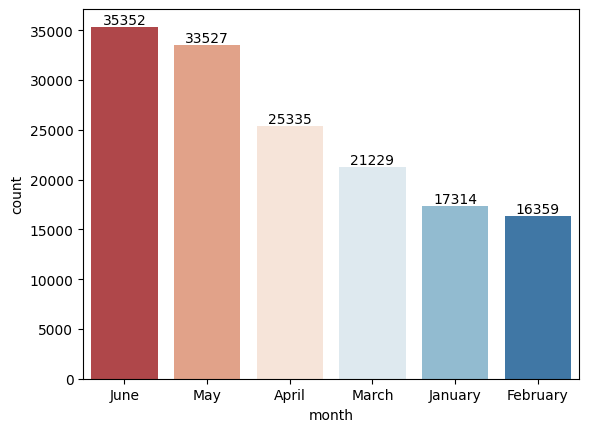

In [ ]:
# see number of transaction in each month

count_plot(x_axis = "month") #called the function i created above

In [ ]:
df["day"].unique()

array(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday',
       'Saturday'], dtype=object)

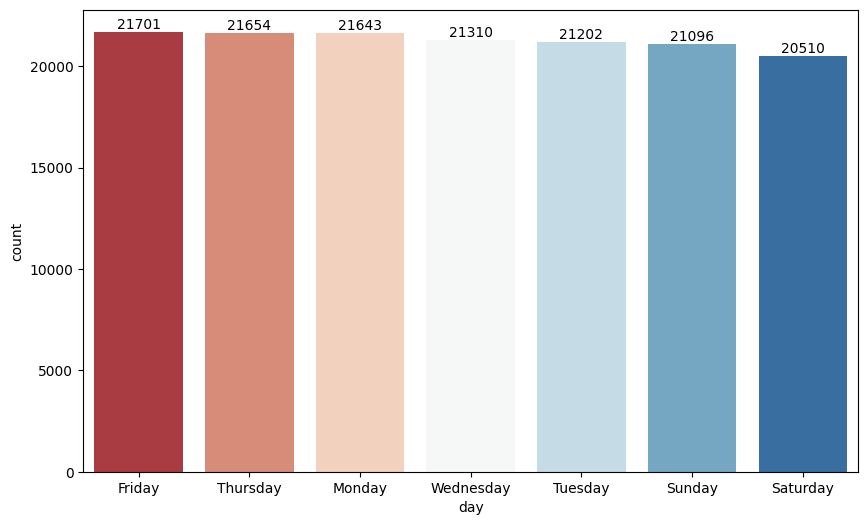

In [ ]:
plt.figure(figsize=(10,6))

count_plot(x_axis= "day")

In [ ]:
# Extract the hour from the original transaction_time before conversion to Timedelta
df['hour'] = df['transaction_time'].dt.components['hours']

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


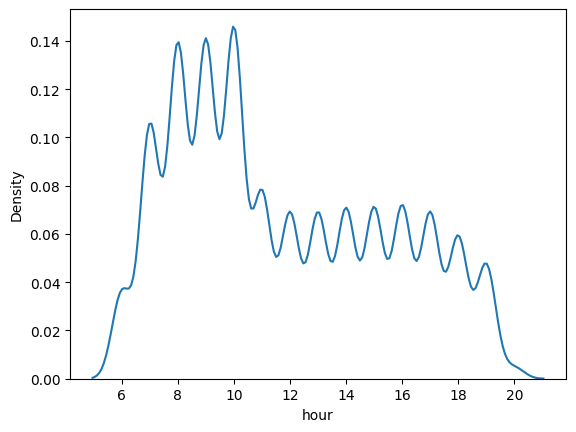

In [ ]:
# see distribution

sns.kdeplot(df["hour"])
plt.show()

## Discovering Transaction quantity column

In [ ]:
# see unique values

df["transaction_qty"].unique()

array([2, 1, 3, 4, 8, 6])

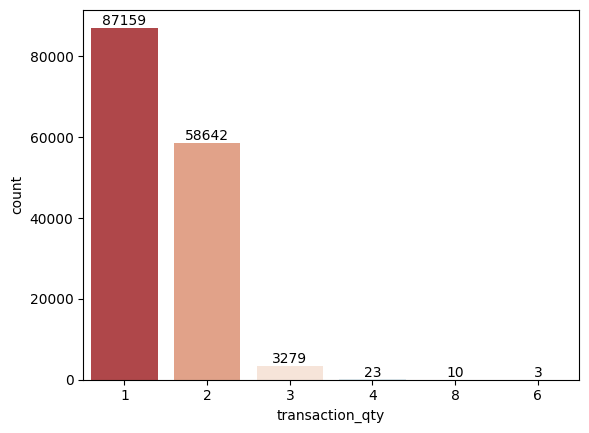

In [ ]:
# see number of sales quantity

count_plot(x_axis = "transaction_qty") # call function i create it in cell 12

In [ ]:
df['store_location'].unique()

array(['Lower Manhattan', "Hell's Kitchen", 'Astoria'], dtype=object)

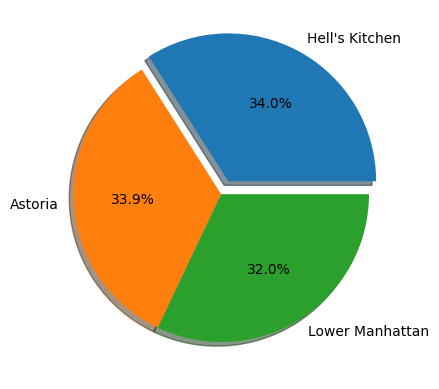

In [ ]:
# see number of sales in each store

pie_plot(column_name = "store_location", explodeIndex = 0)

## Discovering price columns

In [ ]:
# see unique values

df["unit_price"].unique()

array([ 3.  ,  3.1 ,  4.5 ,  2.  ,  4.25,  3.5 ,  2.55,  3.75,  2.5 ,
        4.75,  3.25,  4.  ,  2.2 ,  2.45,  0.8 ,  8.95, 21.  , 28.  ,
        6.4 , 19.75, 12.  , 18.  ,  9.5 , 10.  , 20.45,  9.25, 22.5 ,
       14.75,  7.6 , 14.  , 10.95, 13.33, 15.  ,  4.38,  4.06,  5.63,
        4.69, 45.  , 23.  ,  2.1 ,  2.65])

<Axes: ylabel='unit_price'>

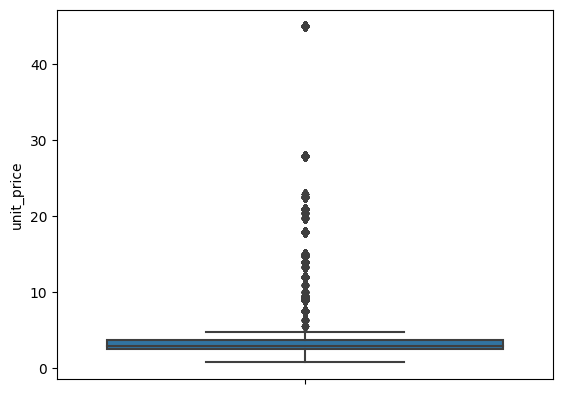

In [ ]:
sns.boxplot(y= 'unit_price', data = df)

### 🧩 One might assume the presence of outliers, but such variations are expected in different types of coffee

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


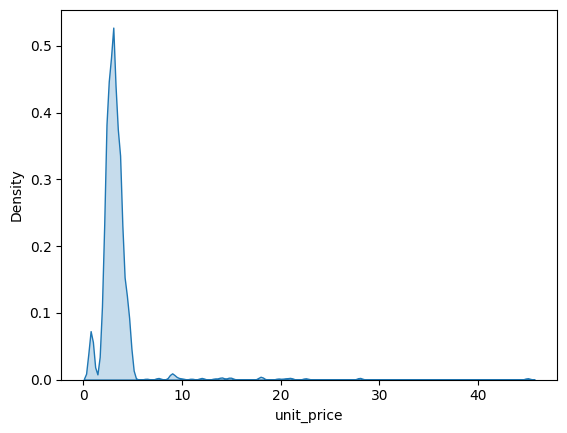

In [ ]:
# see distribution

sns.kdeplot(x = df["unit_price"], fill = True)
plt.show()

🛑📊 We can see :

Price distribution is positively skewed, We understand from this that most Coffee have lower prices,while a few Coffee have higher prices

# Product Category

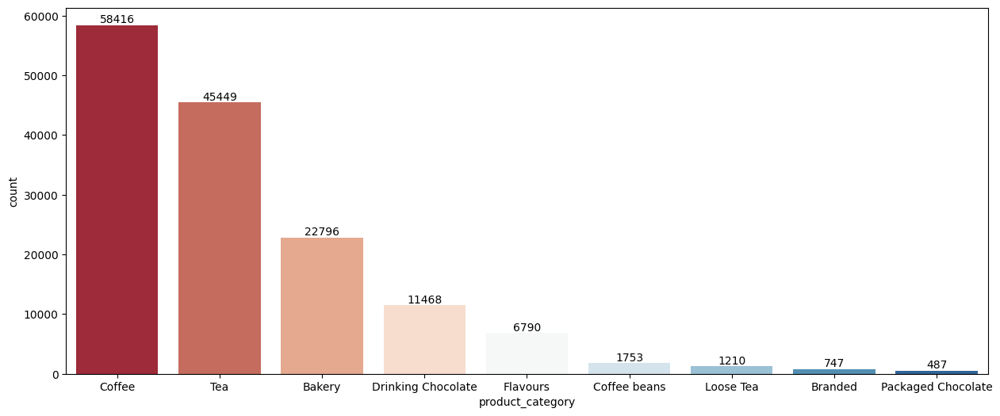

In [ ]:
# see most common category

# set figure size
plt.figure(figsize = (15,6))

# call function i create it in cell 12
count_plot(x_axis = "product_category")

🛑📊 We can see :

it's evident that the three stores offer a wide range of services.
Coffee stands as the best-selling product.
Tea also exhibits a high sales rate.

Columns Insights📊📉📈¶ <br>
Year, Sales exclusively from 2023. <br>
Month, Most sales within a six-month period <br>
Hour, Most sales were from 8 am to 11 pm <br>
Transaction quantity, Most sales were singles followed by 2 lots <br>
Stores, The sales rates of the three stores were similar, with the most significant difference observed at the Hell's Kitchen store <br>
Unit price, Price distribution is positively skewed, We understand from this that most Coffee have lower prices,while a few Coffee have higher prices <br>
Category :
it's evident that the three stores offer a wide range of services. <br>
Coffee stands as the best-selling product. <br>
Tea also exhibits a high sales rate. <br>

product type : <br>
In the Bakery category, the most sold item is the scone <br>
In the Branded category, the best-selling item is Housewares <br>
In the Coffee category, the best-selling item is Gourmet brewed coffee <br>
In the Coffee beans category, the best-selling item is Organic Beans <br>
The Drinking Chocolate category solely offers hot chocolate <br>
Regular syrup are the top-selling items in the Flavours category <br>
In the Loose Tea category, the best-selling item is Chai tea <br>
In the Packaged Chocolate category, the best-selling item is Drinking Chocolate<br>
In the Tea category, the best-selling item is Brewed Chai tea

In [ ]:
df_location = df.groupby('store_location').agg({
    'sales': 'sum',
    'transaction_id': 'count'
})
df_location

,sales,transaction_id
store_location,,
Astoria,232243.91,50599
Hell's Kitchen,236511.17,50735
Lower Manhattan,230057.25,47782


In [ ]:
daily_sales_by_location = df.groupby(['transaction_date','store_location'])['sales'].sum().unstack()
daily_sales_by_location

store_location,Astoria,Hell's Kitchen,Lower Manhattan
transaction_date,,,
2023-01-01,868.40,851.45,788.35
2023-01-02,925.50,828.80,649.05
2023-01-03,902.75,906.25,756.00
2023-01-04,808.25,781.65,630.20
2023-01-05,903.05,714.90,800.90
...,...,...,...
2023-06-26,1975.10,1746.10,2154.70
2023-06-27,1861.55,1676.70,2437.40
2023-06-28,1758.10,1445.85,1524.95


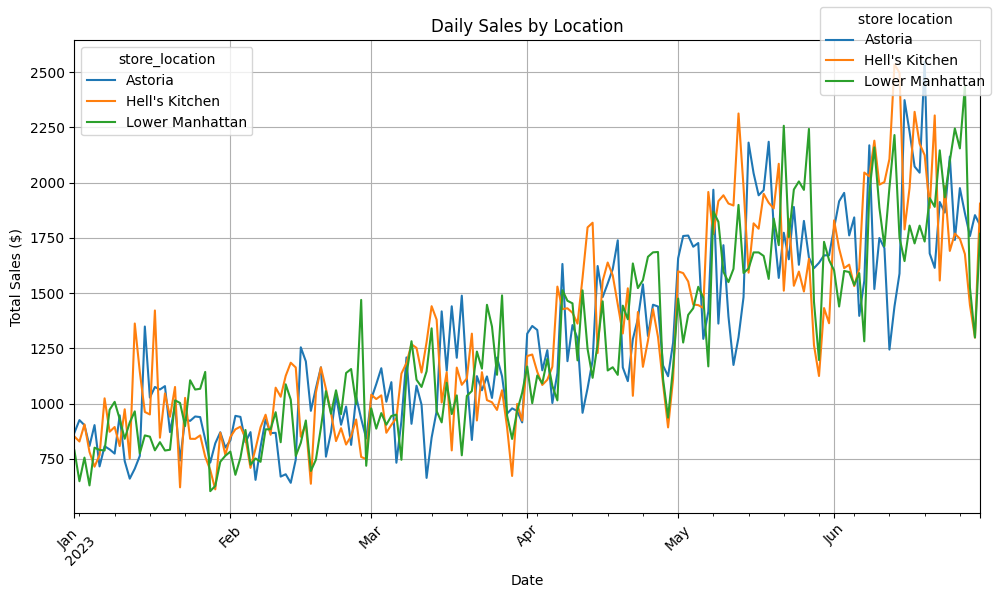

In [ ]:
daily_sales_by_location.plot(figsize=(10,6), title="Daily Sales by Location")

plt.xlabel("Date")
plt.ylabel("Total Sales ($)")
plt.figlegend(title = 'store location')
plt.grid(True)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()


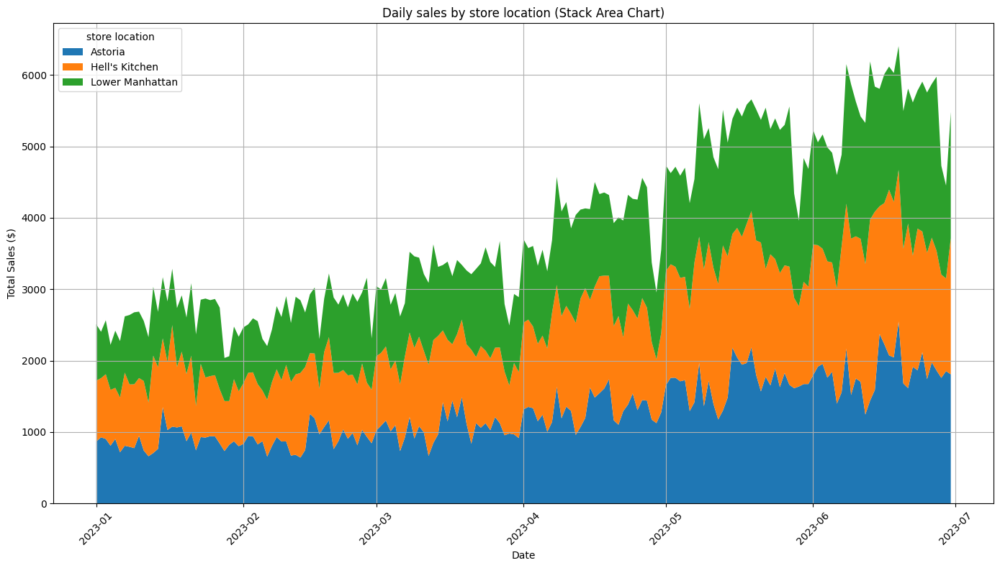

In [ ]:
plt.figure(figsize=(14,8))

plt.stackplot(daily_sales_by_location.index, daily_sales_by_location.T, labels=daily_sales_by_location.columns)
plt.title('Daily sales by store location (Stack Area Chart)')
plt.xlabel("Date")
plt.ylabel("Total Sales ($)")
plt.legend(title = 'store location', loc = 'upper left')
plt.grid(True)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

In [ ]:
df.head(1)

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail,sales,datetime,year,month,day,hour
0,1,2023-01-01,0 days 07:06:11,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg,6.0,2023-01-01 07:06:11,2023,January,Sunday,7


In [ ]:
daily_sales = df.groupby('transaction_date') ['sales'].sum().reset_index()
df['day_of_week'] = df['datetime'].dt.day_name()

In [ ]:
weekly_sales = df.groupby('transaction_date') ['day_of_week'].sum().reindex(
    ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']).reset_index()

In [ ]:
df['Month'] = df['datetime'].dt.to_period('M')

monthly_sales = df.groupby('Month') ['sales'].sum().reset_index()

In [ ]:
daily_sales, weekly_sales, monthly_sales

(    transaction_date    sales
 0         2023-01-01  2508.20
 1         2023-01-02  2403.35
 2         2023-01-03  2565.00
 3         2023-01-04  2220.10
 4         2023-01-05  2418.85
 ..               ...      ...
 176       2023-06-26  5875.90
 177       2023-06-27  5975.65
 178       2023-06-28  4728.90
 179       2023-06-29  4450.75
 180       2023-06-30  5481.32
 
 [181 rows x 2 columns],
   transaction_date day_of_week
 0           Monday         NaN
 1          Tuesday         NaN
 2        Wednesday         NaN
 3         Thursday         NaN
 4           Friday         NaN
 5         Saturday         NaN
 6           Sunday         NaN,
      Month      sales
 0  2023-01   81677.74
 1  2023-02   76145.19
 2  2023-03   98834.68
 3  2023-04  118941.08
 4  2023-05  156727.76
 5  2023-06  166485.88)

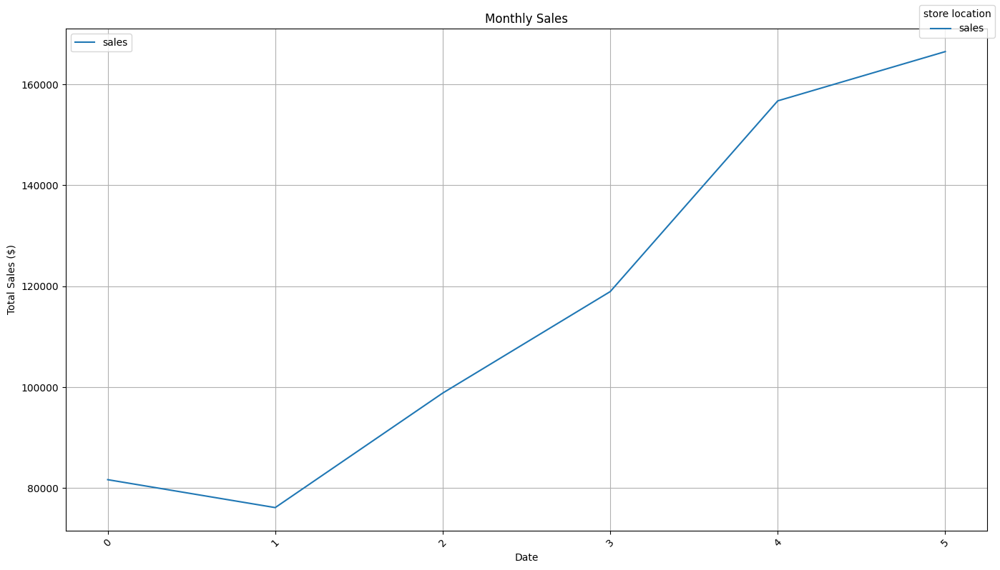

In [ ]:
monthly_sales.plot(figsize=(14,8), title="Monthly Sales")

plt.xlabel("Date")
plt.ylabel("Total Sales ($)")
plt.figlegend(title = 'store location')
plt.grid(True)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()


In [ ]:
weekly_sales = df.groupby(['day_of_week', 'store_location']) ['sales'].sum().unstack()

days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

weekly_sales = weekly_sales.reindex(days_order)

weekly_sales

store_location,Astoria,Hell's Kitchen,Lower Manhattan
day_of_week,,,
Monday,33928.29,33389.51,34359.48
Tuesday,31816.76,34846.47,32792.71
Wednesday,34244.63,33779.09,32289.82
Thursday,34140.37,33468.06,33159.35
Friday,33472.75,34743.18,33157.07
Saturday,31845.93,32599.23,32449.32
Sunday,32795.18,33685.63,31849.50


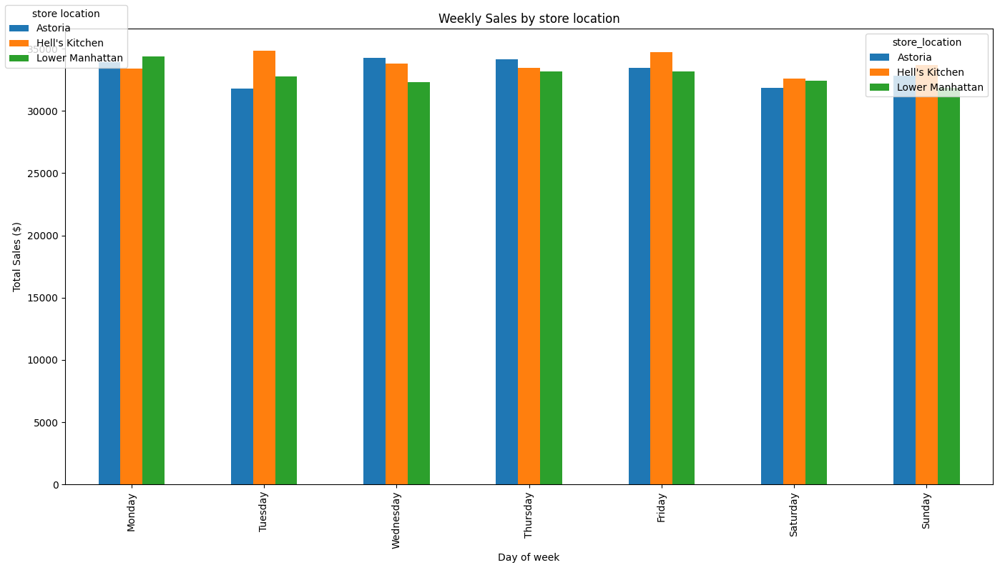

In [ ]:
weekly_sales[['Astoria', 'Hell\'s Kitchen', 'Lower Manhattan']].plot(kind='bar' , figsize=(14,8))

plt.xlabel("Day of week")
plt.ylabel("Total Sales ($)")
plt.title('Weekly Sales by store location')
plt.figlegend(title = 'store location', loc = 'upper left')

plt.tight_layout()
plt.show()

In [ ]:
df_category = df.groupby('product_category').agg({
    'sales': 'sum',
    'transaction_id': 'count'
}).sort_values('sales', ascending=False)
df_category

,sales,transaction_id
product_category,,
Coffee,269952.45,58416
Tea,196405.95,45449
Bakery,82315.64,22796
Drinking Chocolate,72416.00,11468
Coffee beans,40085.25,1753
Branded,13607.00,747
Loose Tea,11213.60,1210
Flavours,8408.80,6790
Packaged Chocolate,4407.64,487


In [ ]:
hourly_sales_by_product = df.groupby(['hour', 'product_category'])['sales'].sum().unstack()

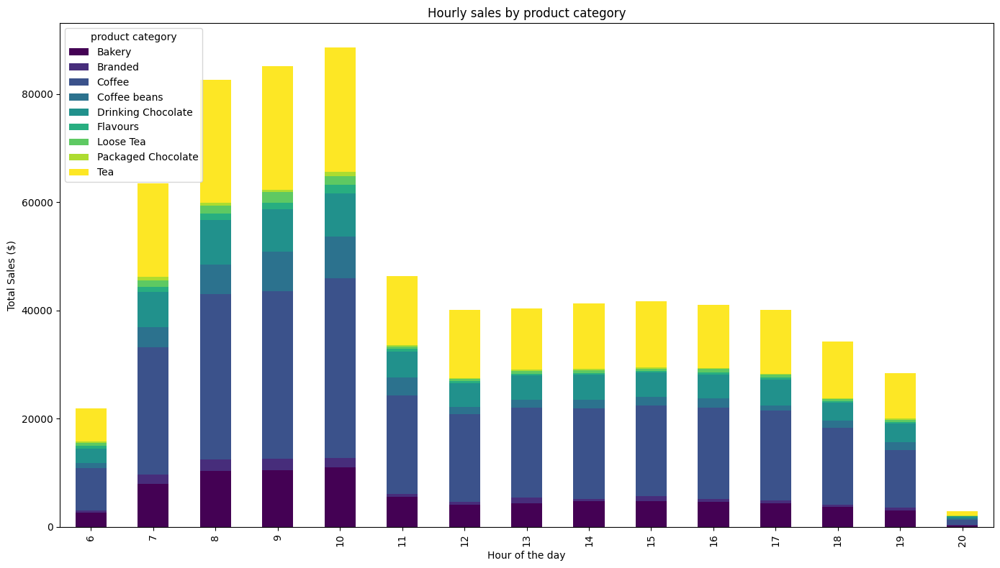

In [ ]:
hourly_sales_by_product.plot(kind='bar', stacked=True, figsize=(14,8), colormap='viridis')

plt.title('Hourly sales by product category')

plt.xlabel("Hour of the day")
plt.ylabel("Total Sales ($)")
plt.legend(title = 'product category', loc = 'upper left')

plt.tight_layout()
plt.show()

# Average sale

In [ ]:
df_category['avg_sales'] = df_category['sales'] / df_category['transaction_id']
df_category

,sales,transaction_id,avg_sales
product_category,,,
Coffee,269952.45,58416,4.621207
Tea,196405.95,45449,4.321458
Bakery,82315.64,22796,3.610969
Drinking Chocolate,72416.00,11468,6.314615
Coffee beans,40085.25,1753,22.866657
Branded,13607.00,747,18.215529
Loose Tea,11213.60,1210,9.267438
Flavours,8408.80,6790,1.238409
Packaged Chocolate,4407.64,487,9.050595


In [ ]:
sales_by_product = df.groupby('product_type').agg({
    'sales': 'sum',
    'transaction_id': 'count'
}).sort_values('sales', ascending=False)
sales_by_product

,sales,transaction_id
product_type,,
Barista Espresso,91406.20,16403
Brewed Chai tea,77081.95,17183
Hot chocolate,72416.00,11468
Gourmet brewed coffee,70034.60,16912
Brewed Black tea,47932.00,11350
Brewed herbal tea,47539.50,11245
Premium brewed coffee,38781.15,8135
Organic brewed coffee,37746.50,8489
Scone,36866.12,10173


In [ ]:
product_sales_df = df.groupby(['product_category', 'product_type']) ['sales'].sum().reset_index()
product_sales_df

,product_category,product_type,sales
0,Bakery,Biscotti,19793.53
1,Bakery,Pastry,25655.99
2,Bakery,Scone,36866.12
3,Branded,Clothing,6163.00
4,Branded,Housewares,7444.00
5,Coffee,Barista Espresso,91406.20
6,Coffee,Drip coffee,31984.00
7,Coffee,Gourmet brewed coffee,70034.60
8,Coffee,Organic brewed coffee,37746.50
9,Coffee,Premium brewed coffee,38781.15


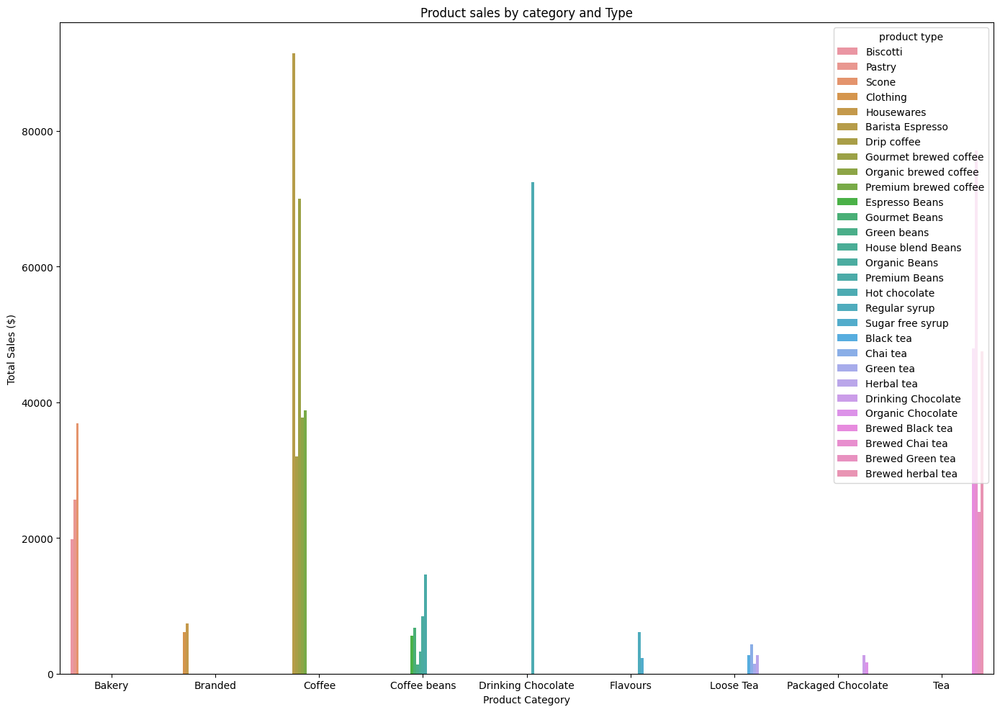

In [ ]:
plt.figure(figsize=(14,10))
sns.barplot(data= product_sales_df, x='product_category',y='sales', hue='product_type')

plt.title('Product sales by category and Type')

plt.xlabel("Product Category")
plt.ylabel("Total Sales ($)")
plt.legend(title = 'product type', loc = 'upper right')

plt.tight_layout()
plt.show()

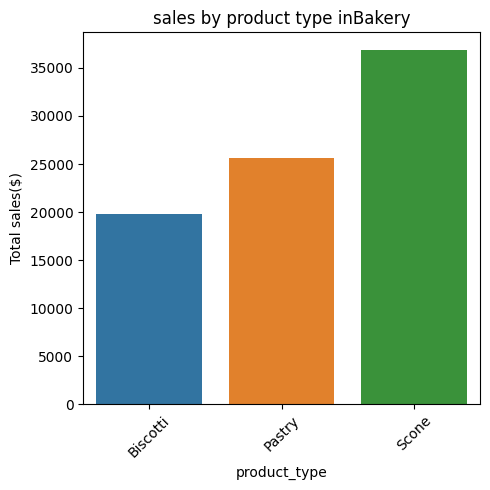

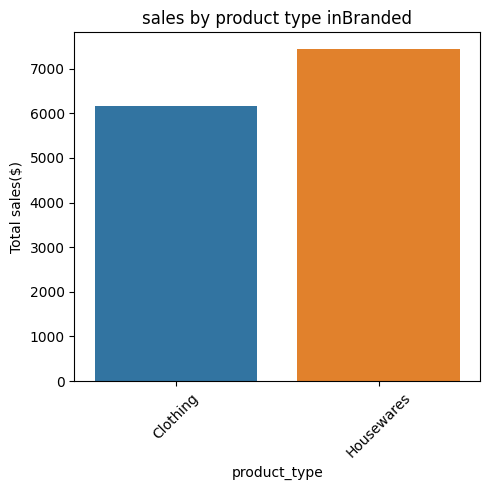

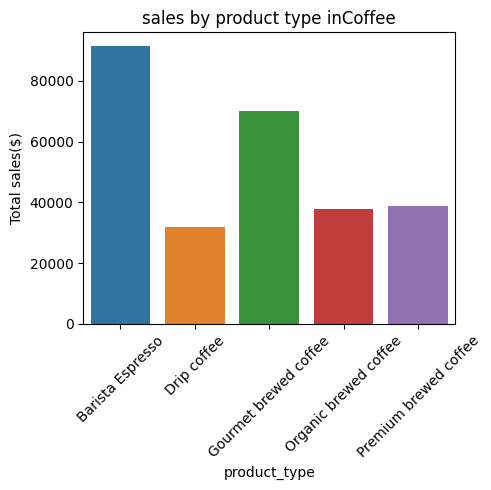

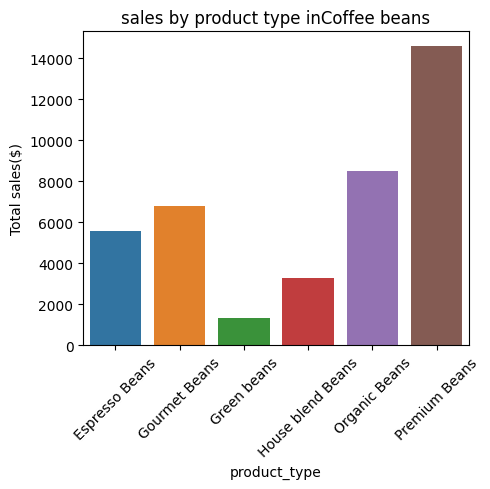

/opt/conda/lib/python3.10/site-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


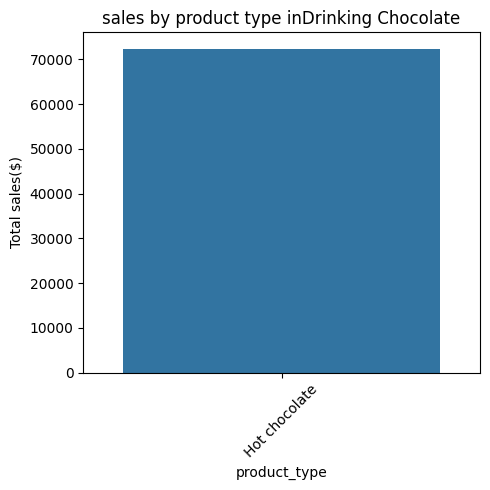

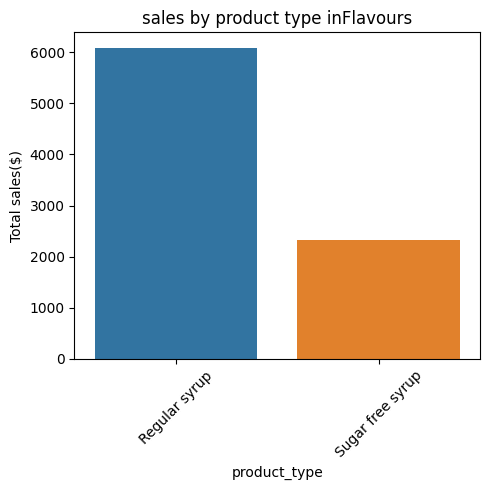

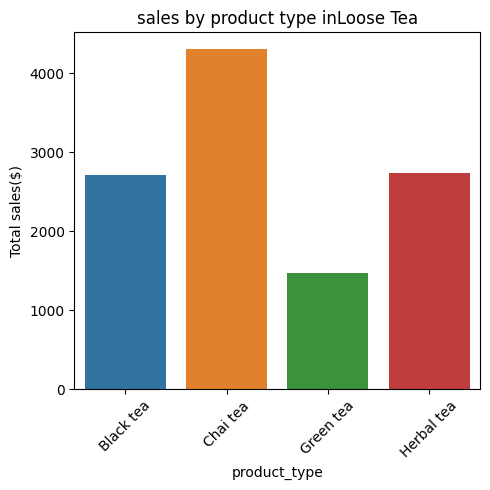

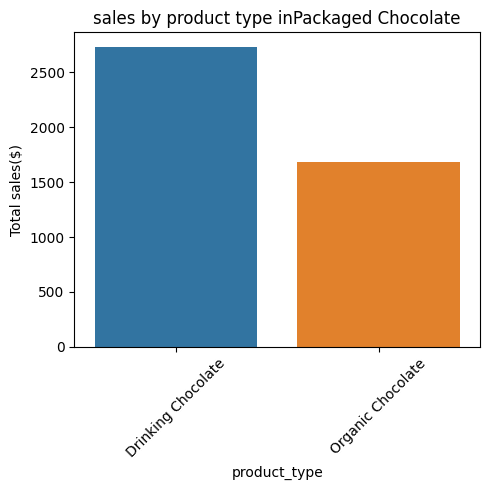

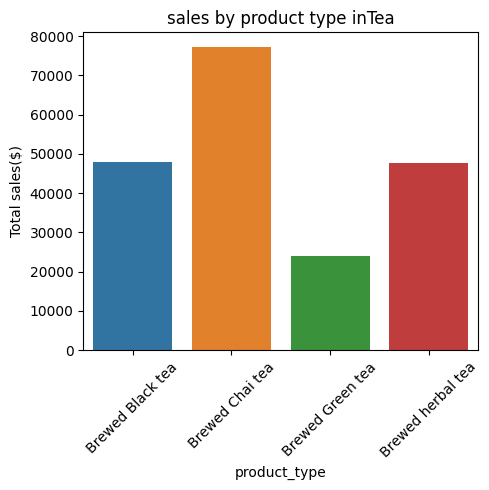

In [ ]:
categories = product_sales_df['product_category'].unique()
for category in categories:
    plt.figure(figsize=(5,5))
    category_data = product_sales_df[product_sales_df['product_category'] == category]
    sns.barplot(data = category_data, x='product_type', y='sales')
    #add labels and title
    plt.title(f'sales by product type in{category}')
    plt.xlabel('product_type')
    plt.ylabel('Total sales($)')
    plt.xticks(rotation = 45)
    plt.tight_layout()
    plt.show()

In [ ]:
hourly_sales_by_location = df.groupby(['store_location', 'hour']) ['sales'].sum().reset_index()

In [ ]:
hourly_sales_by_location

,store_location,hour,sales
0,Astoria,7,19028.80
1,Astoria,8,22805.90
2,Astoria,9,23183.57
3,Astoria,10,24426.12
4,Astoria,11,15498.13
5,Astoria,12,15681.20
6,Astoria,13,15947.87
7,Astoria,14,15175.27
8,Astoria,15,15651.95
9,Astoria,16,16110.85


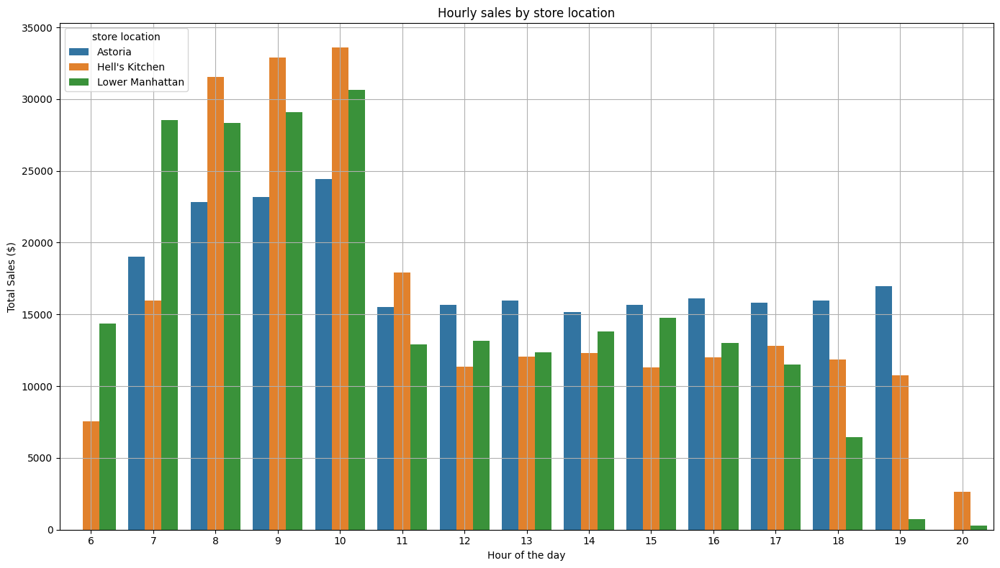

In [ ]:
plt.figure(figsize=(14,8))
sns.barplot(data = hourly_sales_by_location, x = 'hour', y = 'sales', hue = 'store_location')

plt.title('Hourly sales by store location')

plt.xlabel("Hour of the day")
plt.ylabel("Total Sales ($)")
plt.legend(title = 'store location', loc = 'upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

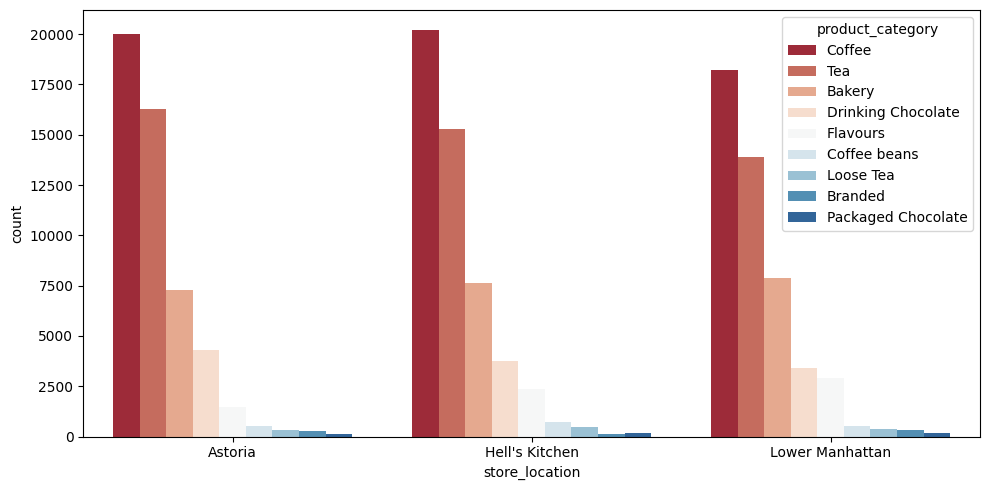

In [ ]:
# Stores VS product categories

# Calculate number of product categories at each store location
popular_products = df.groupby('store_location')[['product_category']].value_counts().reset_index(name='count')

# set figure size
plt.figure(figsize=(10, 5))

# Create a bar plot
sns.barplot(x = 'store_location', y = 'count', hue = 'product_category', data = popular_products, palette = "RdBu")

plt.tight_layout()
plt.show()

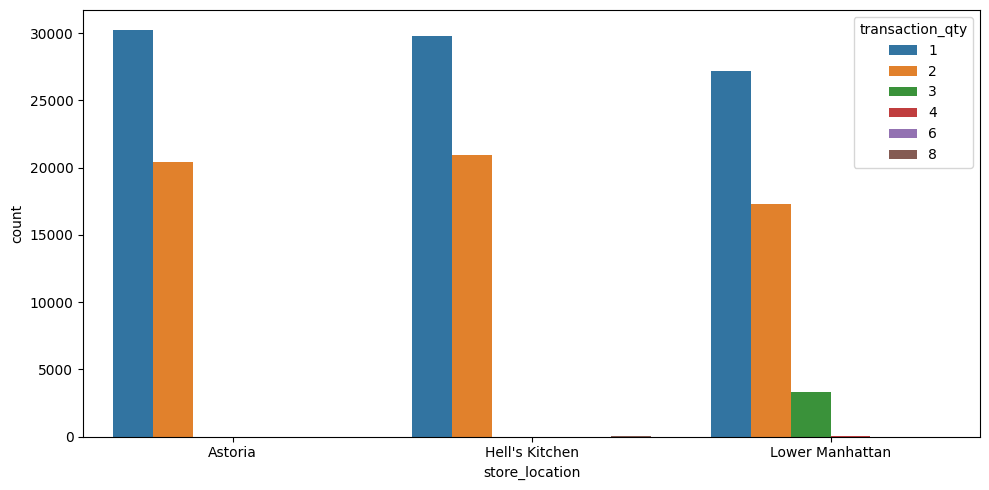

In [ ]:
# Stores VS Most transaction_qty

# grouped 'store_location' and 'transaction_qty' as columns
grouped_data = df.groupby("store_location")["transaction_qty"].value_counts().reset_index(name = "count")

# set figure size
plt.figure(figsize=(10, 5))

# Create bar plot
sns.barplot(x = "store_location", y = "count", hue = "transaction_qty", data = grouped_data)

plt.tight_layout()
plt.show()

Astoria Store :
The most frequent transaction quantity observed is 1, with a count of 30,207 instances
The second most frequent transaction quantity is 2, noted 20,392 times


Hell's Kitchen Store:
The most frequent transaction quantity observed is 1, noted 29,793 times
The second most frequent transaction quantity is 2, observed 20,932 times
Additionally, there are 8 transactions with a quantity of 8


Lower Manhattan Store:
The most frequent transaction quantity observed is 1, recorded 27,159 times.
The second most frequent transaction quantity is 2, seen 17,318 times.
There are occurrences of transaction quantities 3, 4, and 6, but they are less frequent compared to quantities 1 and 2

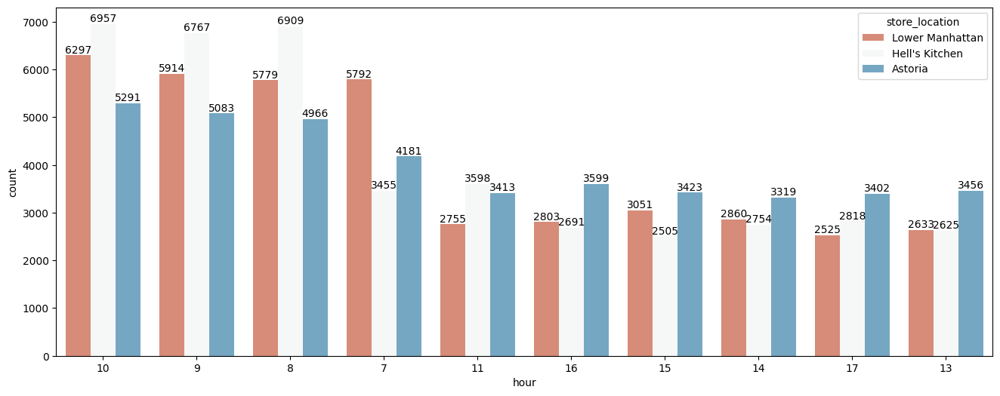

In [ ]:
# Stores VS Hour sales

# set figure size
plt.figure(figsize=(16, 6))

# call function i create it in cell 12
count_plot(x_axis = "hour", hue = "store_location", top = 10)

Astoria Store :
Peak hours are from 9 AM to 10 AM, and from 4 PM to 5 PM, with counts ranging between 5,083 and 5,291 during these periods
The least busy hours are from 7 AM to 8 AM, with counts ranging between 4,181 and 4,966


Hell's Kitchen Store :
Busiest hours are from 8 AM to 10 AM, with counts ranging between 6,767 and 6,909
The least busy hours are from 6 AM to 7 AM and from 6 PM to 8 PM


Lower Manhattan Store :
Peak hours are from 9 AM to 10 AM, with a count of 6,297, and from 2 PM to 3 PM, with a count of 3,051
The least busy hours are from 7 PM to 8 PM, with counts dropping to 75 and 125

In [ ]:
df

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail,sales,datetime,year,month,day,hour,day_of_week,Month
0,1,2023-01-01,0 days 07:06:11,2,5,Lower Manhattan,32,3.00,Coffee,Gourmet brewed coffee,Ethiopia Rg,6.00,2023-01-01 07:06:11,2023,January,Sunday,7,Sunday,2023-01
1,2,2023-01-01,0 days 07:08:56,2,5,Lower Manhattan,57,3.10,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,6.20,2023-01-01 07:08:56,2023,January,Sunday,7,Sunday,2023-01
2,3,2023-01-01,0 days 07:14:04,2,5,Lower Manhattan,59,4.50,Drinking Chocolate,Hot chocolate,Dark chocolate Lg,9.00,2023-01-01 07:14:04,2023,January,Sunday,7,Sunday,2023-01
3,4,2023-01-01,0 days 07:20:24,1,5,Lower Manhattan,22,2.00,Coffee,Drip coffee,Our Old Time Diner Blend Sm,2.00,2023-01-01 07:20:24,2023,January,Sunday,7,Sunday,2023-01
4,5,2023-01-01,0 days 07:22:41,2,5,Lower Manhattan,57,3.10,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,6.20,2023-01-01 07:22:41,2023,January,Sunday,7,Sunday,2023-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149111,149452,2023-06-30,0 days 20:18:41,2,8,Hell's Kitchen,44,2.50,Tea,Brewed herbal tea,Peppermint Rg,5.00,2023-06-30 20:18:41,2023,June,Friday,20,Friday,2023-06
149112,149453,2023-06-30,0 days 20:25:10,2,8,Hell's Kitchen,49,3.00,Tea,Brewed Black tea,English Breakfast Lg,6.00,2023-06-30 20:25:10,2023,June,Friday,20,Friday,2023-06
149113,149454,2023-06-30,0 days 20:31:34,1,8,Hell's Kitchen,45,3.00,Tea,Brewed herbal tea,Peppermint Lg,3.00,2023-06-30 20:31:34,2023,June,Friday,20,Friday,2023-06
149114,149455,2023-06-30,0 days 20:57:19,1,8,Hell's Kitchen,40,3.75,Coffee,Barista Espresso,Cappuccino,3.75,2023-06-30 20:57:19,2023,June,Friday,20,Friday,2023-06


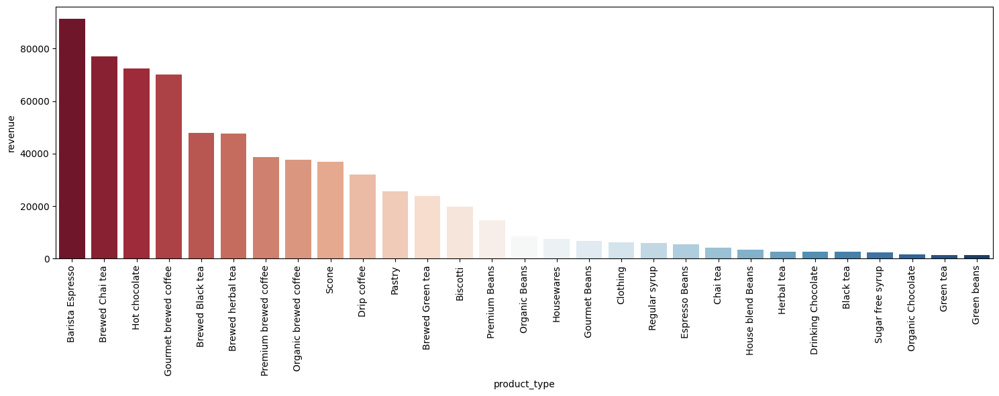

In [ ]:
# Category VS Total revenue

# grouped product_type' and 'Total revenue'
category_revenue = df.groupby("product_type")["sales"].sum().reset_index(name = "revenue")

# sort category by revenue
category_revenue = category_revenue.sort_values(by = 'revenue', ascending = False)

# set figure size
plt.figure(figsize = (15,6))
# create bar plot
sns.barplot(x = "product_type", y = "revenue", data = category_revenue, palette = "RdBu")

# set x-axis rotation
plt.xticks(rotation = 90)

plt.tight_layout()
plt.show()

Top Revenue Product Types :
Barista Espresso with a revenue of 91,406.20
Brewed Chai tea with a revenue of 77,081.95
Hot chocolate with a revenue of 72,416.00
Gourmet brewed coffee with a revenue of 70,034.60
Brewed Black tea with a revenue of 47,932.00


Lowest Revenue Product Types :
Organic Chocolate with a revenue of 1,679.60
Green tea with a revenue of 1,470.75
Green beans with a revenue of 1,340.00
Other Observations :
Various products contribute to revenue across different ranges, with a mix of beverages (like teas, coffees) and snacks (biscotti, pastries).
Coffee-related products, such as various brews and espresso variants, hold prominent positions in revenue generation.
The lowest revenue-generating products are predominantly related to tea and specific beverage variants.

<div style="text-align: center; margin-top: 20px;">
  <a href="https://www.youtube.com/@datax_official" target="_blank">
    <img src="https://img.shields.io/badge/YouTube-FF0000?style=for-the-badge&logo=youtube&logoColor=white" alt="YouTube">
  </a>
  <a href="https://www.linkedin.com/company/datax-official" target="_blank">
    <img src="https://img.shields.io/badge/LinkedIn-0A66C2?style=for-the-badge&logo=linkedin&logoColor=white" alt="LinkedIn">
  </a>
</div>

<div style="text-align: center; margin-top: 20px;">
  <p style="text-align: center; font-family:verdana;">All rights reserved to Data X</p>
</div>

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.offline import iplot
from plotly.subplots import make_subplots
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.tree import plot_tree
from mlxtend.frequent_patterns import apriori, association_rules
from mlxtend.preprocessing import TransactionEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score


# set style of visualization
sns.set_style("darkgrid")
sns.set_palette("RdBu")

# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

# Business Scenarios

Improving business performance by analyzing the transaction records provided by a branded coffee shop focuses on the following three questions:

#### 1. What are the complementary and substitute products in the coffee shop?
Identify which products are often bought together, and which products are very rarely bought together.


#### 2. Which product categories are most frequently purchased and how can they be leveraged to increase profits?
Identify the most frequest product categories, and how can this information help in optimizing inventory and sales strategies.


#### 3. What pricing adjustments can be made to increase overall revenue while maintaining customer satisfaction based on the current pricing and transaction data?
Understanding the preferences of customers at different locations, the coffee shop can tailor its product offerings and pricings to better meet local demand, optimize inventory, and enhance customer satisfaction.

# Final Results and Conclusion

### Overall Summary

The analysis of the coffee shop sales transactions provided valuable insights into product relationships, purchasing behavior, and revenue optimization. Here's a summary of the key findings and recommendations based on the performed analyses:

#### **Complementary and Substitute Products**

- **Complementary Products:**
  - While the analysis primarily highlighted weak associations and potential substitutes, it should be noted that the detailed output mentioned a possibility of complementary products. The absence of strong positive associations (lift > 1) suggests that there are no strongly established complementary products in the data.

- **Substitute Products:**
  - Products identified as potential substitutes include:
    - **Barista Espresso and Gourmet brewed coffee**
    - **Biscotti and Scone**
  - These products are rarely bought together, indicating they might be substitutes rather than complements.

#### **Product Categories Analysis**

- **Most Frequent Categories:**
  - **Coffee** (17,540 transactions) and **Tea** (13,510 transactions) are the most frequently purchased categories.

- **Least Frequent Categories:**
  - **Packaged Chocolate** (144 transactions) is the least frequently purchased category.

- **Implications:**
  - **Inventory Management:** Increase stock for high-demand categories like Coffee and Tea; reduce stock for less popular categories like Packaged Chocolate.
  - **Marketing Strategy:** Focus marketing efforts on Coffee and Tea. Develop strategies to boost sales for less popular items to balance inventory and increase revenue.

#### **Pricing Adjustments for Revenue Optimization**

- **Cluster 0:**
  - **Average Unit Price:** $3.13
  - **Recommendation:** Introduce premium bundles (e.g., $5 for 2 items) to increase transaction value.

- **Cluster 1:**
  - **Average Unit Price:** $2.90
  - **Recommendation:** Increase unit prices by 10% to $3.19, potentially raising revenue per transaction from $6.03 to $6.64.

- **Cluster 2:**
  - **Average Unit Price:** $20.86
  - **Recommendation:** Maintain current pricing, as it already generates the highest revenue per transaction ($21.51). Focus on increasing transaction frequency instead.

- **Cluster 3:**
  - **Average Unit Price:** $3.24
  - **Recommendation:** Implement promotional pricing with a 10% increase to $3.56 to improve revenue per transaction.

### Interesting Facts

1. **Product Substitution:**
   - The analysis identified several pairs of products as potential substitutes, which can guide inventory and marketing strategies.

2. **Revenue Insights:**
   - **Cluster 2** has the highest revenue per transaction due to a high unit price, despite its lower transaction volume.
   - **Cluster 1** has the highest transaction quantity with a lower unit price, indicating a potential area for revenue growth through pricing adjustments.

3. **Category Popularity:**
   - Coffee and Tea dominate sales, suggesting they are key drivers of revenue. Conversely, Packaged Chocolate is less popular, highlighting a potential area for promotional focus.

4. **Pricing Strategy:**
   - Strategic pricing adjustments and bundling can significantly impact overall revenue, especially in clusters with high or low transaction volumes.

By leveraging these insights, the coffee shop can optimize its inventory, refine marketing strategies, and adjust pricing to enhance overall revenue and customer satisfaction.

# **Coffee Sales Data Analysis**

This notebook provides an exploratory data analysis of coffee shop sales. We aim to uncover insights that can help optimize sales strategies and enhance customer satisfaction.

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Setting aesthetic parameters in one step
sns.set(style="whitegrid")


## **Understand the Problem and the Data**

The objective of this analysis is to explore the sales data of a coffee shop to understand the sales distribution across different products and locations, identify peak sales hours, and analyze overall sales trends. This dataset includes transaction records with details such as transaction date, time, location, product category, and sales amounts.

## **Import and Inspect the Data**

In [ ]:
# Load the dataset from a local path (adjust path as needed)
data = pd.read_excel('/content/Coffee Shop Sales.xlsx')

# Display the first few rows of the dataframe to understand the available data
data.head()

# Display the data types and non-null counts
data.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 149116 entries, 0 to 149115

Data columns (total 11 columns):

 #   Column            Non-Null Count   Dtype         

---  ------            --------------   -----         

 0   transaction_id    149116 non-null  int64         

 1   transaction_date  149116 non-null  datetime64[ns]

 2   transaction_time  149116 non-null  object        

 3   transaction_qty   149116 non-null  int64         

 4   store_id          149116 non-null  int64         

 5   store_location    149116 non-null  object        

 6   product_id        149116 non-null  int64         

 7   unit_price        149116 non-null  float64       

 8   product_category  149116 non-null  object        

 9   product_type      149116 non-null  object        

 10  product_detail    149116 non-null  object        

dtypes: datetime64[ns](1), float64(1), int64(4), object(5)

memory usage: 12.5+ MB


## **Handling Missing Values**

In [ ]:
# Check for missing values
data.isnull().sum()

# Handling missing values - for this example, we'll drop rows with any missing data
data.dropna(inplace=True)


## **Explore Data Characteristics**

In [ ]:
# Basic descriptive statistics
data.describe()

# Explore the frequency of different categories
data['product_category'].value_counts()


product_category
Coffee                58416
Tea                   45449
Bakery                22796
Drinking Chocolate    11468
Flavours               6790
Coffee beans           1753
Loose Tea              1210
Branded                 747
Packaged Chocolate      487
Name: count, dtype: int64

## **Perform Data Transformation**

In [ ]:
# Ensure 'unit_price' and 'transaction_qty' are numeric
data['unit_price'] = pd.to_numeric(data['unit_price'])
data['transaction_qty'] = pd.to_numeric(data['transaction_qty'])

# Calculate 'Total Sales'
data['Total Sales'] = data['unit_price'] * data['transaction_qty']

# Convert the transaction_date to a datetime format
data['transaction_date'] = pd.to_datetime(data['transaction_date'])

# Calculate revenue for each transaction
data['revenue'] = data['transaction_qty'] * data['unit_price']

# Display the updated DataFrame
data.head()

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail,Total Sales,revenue
0,1,2023-01-01,07:06:11,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg,6.0,6.0
1,2,2023-01-01,07:08:56,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,6.2,6.2
2,3,2023-01-01,07:14:04,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg,9.0,9.0
3,4,2023-01-01,07:20:24,1,5,Lower Manhattan,22,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm,2.0,2.0
4,5,2023-01-01,07:22:41,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,6.2,6.2


## **Visualize Data Relationships**

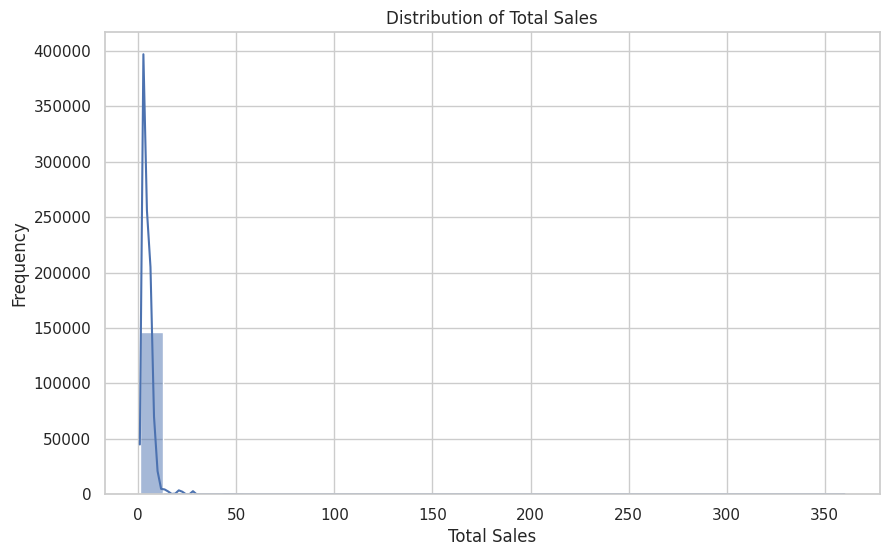

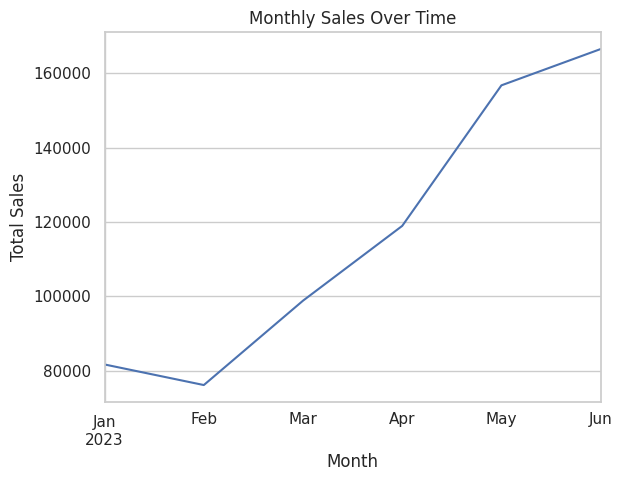

In [ ]:
# Visualizing the distribution of total sales
plt.figure(figsize=(10, 6))
sns.histplot(data['Total Sales'], bins=30, kde=True)
plt.title('Distribution of Total Sales')
plt.xlabel('Total Sales')
plt.ylabel('Frequency')
plt.show()

# Sales trends over time
data['Date'] = pd.to_datetime(data['transaction_date'])  # ensuring the date format
data.set_index('Date', inplace=True)
data['Total Sales'].resample('M').sum().plot()
plt.title('Monthly Sales Over Time')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.show()


## **Handling Outliers**

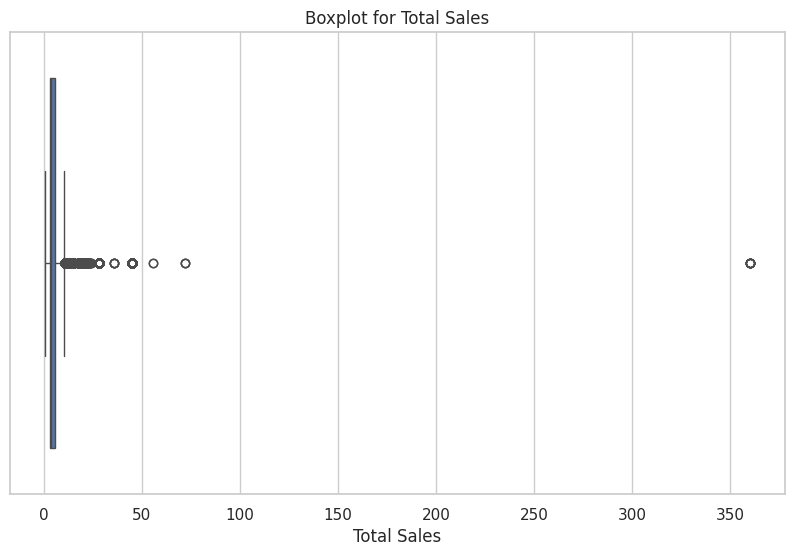

In [ ]:
# Identifying outliers in total sales
plt.figure(figsize=(10, 6))
sns.boxplot(x=data['Total Sales'])
plt.title('Boxplot for Total Sales')
plt.show()

# Removing outliers
q_low = data['Total Sales'].quantile(0.01)
q_hi  = data['Total Sales'].quantile(0.99)
data_filtered = data[(data['Total Sales'] < q_hi) & (data['Total Sales'] > q_low)]


# **Findings and Insights**

## **Which product category contributes the most to the revenue?**

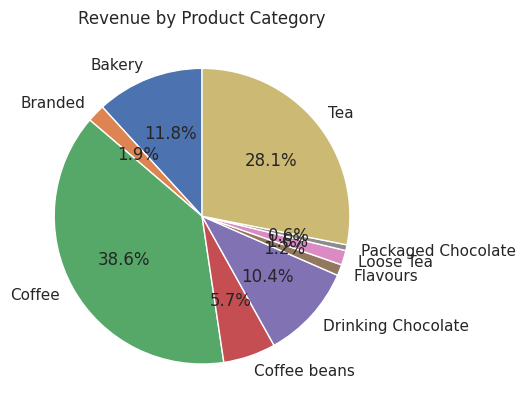

In [ ]:
# Revenue by product category
revenue_by_category = data.groupby('product_category')['Total Sales'].sum()
revenue_by_category.plot(kind='pie', autopct='%1.1f%%', startangle=90)
plt.title('Revenue by Product Category')
plt.ylabel('')  # hide the y-label as it is not relevant for pie charts
plt.show()


### Key Insights:

1. **Coffee Dominance**:
   - **Coffee** is the largest contributor to revenue, accounting for **38.6%** of the total. This highlights the popularity and importance of coffee products for Maven Roasters, reinforcing the idea that coffee is the cornerstone of their business.

2. **Tea as a Significant Revenue Source**:
   - **Tea** contributes **28.1%** to the total revenue, making it the second-largest revenue generator. This indicates a strong consumer demand for tea, suggesting that the product offerings in this category are well-received by customers.

3. **Diverse Product Range**:
   - Other significant categories include **Bakery** at **11.8%** and **Drinking Chocolate** at **10.4%**, which suggest a well-rounded product range that appeals to various customer preferences.
   - **Coffee Beans** contribute **5.7%**, indicating a market for home-brewing enthusiasts or those purchasing for later consumption.

4. **Smaller Revenue Contributors**:
   - Categories such as **Branded** (1.9%), **Packaged Chocolate** (0.6%), **Loose Tea** (2.8%), and **Flavours** are much smaller contributors to the total revenue. These might be niche products that cater to specific customer segments or serve as complementary offerings to the main product lines.

5. **Strategic Focus**:
   - The dominance of coffee and tea in revenue generation suggests that Maven Roasters could benefit from focusing on these categories for future growth, perhaps by introducing new flavors, expanding product lines, or creating promotional strategies around them.
   - For less popular categories, strategies such as product innovation, marketing, or bundling with popular items could be explored to increase their contribution to the overall revenue.

### Recommendations:

- **Enhance Coffee and Tea Offerings**: Given their substantial contribution to revenue, exploring new flavors, seasonal products, or premium offerings in these categories could attract more customers.
- **Marketing and Promotions**: Targeted marketing efforts focusing on the most popular categories (Coffee and Tea) could drive further sales, while promotional bundles might help boost sales in smaller categories.
- **Product Diversification**: Consider expanding successful product lines or introducing new products in underperforming categories to broaden appeal and capture untapped market segments.

## **What are the peak hours for sales?**

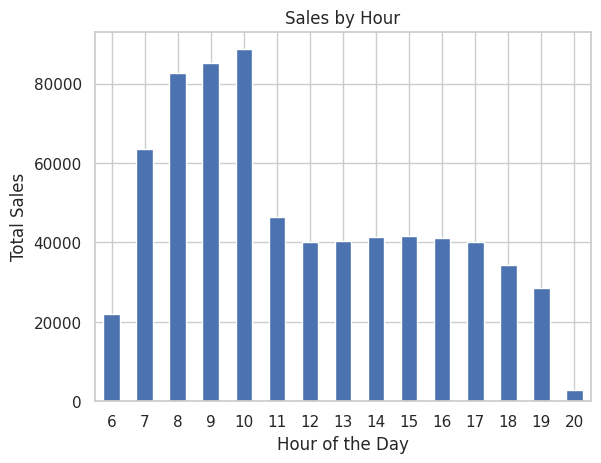

In [ ]:
# Extract hour from datetime.time objects
data['Hour'] = data['transaction_time'].apply(lambda x: x.hour)
sales_by_hour = data.groupby('Hour')['Total Sales'].sum()

# Plot the sales by hour
import matplotlib.pyplot as plt

sales_by_hour.plot(kind='bar')
plt.title('Sales by Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Total Sales')
plt.xticks(rotation=0)  # Keeps the labels upright for readability
plt.show()


### Insights on Peak Sales Hours:

1. **Morning Rush**:
   - The data indicates that the highest sales occur between **8 AM** and **11 AM**. This peak can be attributed to morning routines where customers likely purchase coffee or breakfast items on their way to work or school.

2. **Stable Midday Sales**:
   - Sales remain relatively stable from **12 PM** to **4 PM**, suggesting consistent customer traffic during lunchtime and early afternoon. This period may reflect a mix of lunch purchases and casual visits.

3. **Decline in Evening Sales**:
   - A noticeable decline in sales is observed after **4 PM**, with a significant drop post **6 PM**. This decline could be due to the completion of the typical workday, leading to fewer customer visits in the evening.

### Recommendations:

- **Focus on Morning Offers**:
  - Given the morning rush, consider offering special promotions or new breakfast items to capitalize on this busy period.

- **Lunch Specials**:
  - Enhance midday offerings with lunch specials or combos to maintain and possibly increase the steady sales during this period.

- **Evening Engagement**:
  - Explore strategies to increase evening sales, such as hosting events, offering discounts, or promoting evening-specific items to attract customers after typical working hours.

## **Analyze Sales Trend Over Time**

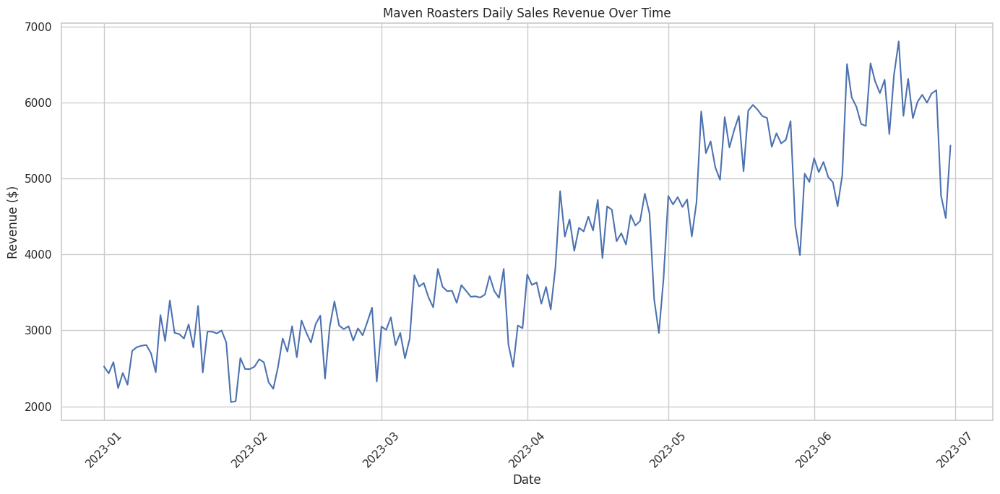

In [ ]:
# Group by transaction_date to calculate daily sales
daily_sales = data.groupby('transaction_date').agg({
    'transaction_qty': 'sum',
    'unit_price': 'mean'
}).reset_index()

# Calculate daily revenue
daily_sales['revenue'] = daily_sales['transaction_qty'] * daily_sales['unit_price']

# Sort by date to ensure it's in chronological order
daily_sales = daily_sales.sort_values('transaction_date')

# Plotting the sales trend over time
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))
plt.plot(daily_sales['transaction_date'], daily_sales['revenue'], label='Daily Revenue', color='b')
plt.xlabel('Date')
plt.ylabel('Revenue ($)')
plt.title('Maven Roasters Daily Sales Revenue Over Time')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### Insights on Sales Revenue Over Time:

1. **Overall Trend**:
   - The daily sales revenue shows a general upward trend from January to July 2023. This indicates positive business growth and increasing customer engagement over the months.

2. **Early Year Fluctuations**:
   - The period from January to March exhibits significant fluctuations in daily revenue, which could be attributed to seasonal factors, changing consumer behavior, or promotional activities. Despite these fluctuations, there is a noticeable increase in revenue during this time.

3. **Consistent Growth**:
   - From March onwards, there is a more consistent growth pattern observed in the sales revenue, with fewer dramatic dips. This stability may be a result of refined business strategies, customer retention efforts, or favorable market conditions.

4. **Mid-Year Peaks**:
   - The chart highlights several peaks in sales around June and July, suggesting successful promotional campaigns, introduction of popular products, or seasonal demand spikes, such as summer specials or events.

5. **Strategic Considerations**:
   - Understanding the factors driving the peaks in sales can help Maven Roasters replicate successful strategies in future periods.
   - Continuous monitoring and analysis of sales trends are essential for identifying potential challenges and capitalizing on opportunities for growth.

### Recommendations:

- **Strengthen Successful Strategies**: Identify and amplify the strategies that contributed to revenue peaks, such as effective marketing campaigns or product launches.
- **Address Fluctuations**: Investigate the causes of early-year fluctuations and implement measures to stabilize sales, potentially through loyalty programs or targeted promotions.
- **Seasonal Planning**: Prepare for seasonal demand variations by aligning inventory and staffing with expected sales trends, ensuring readiness for high-demand periods.

## **Analyze Busiest Days of the Week**

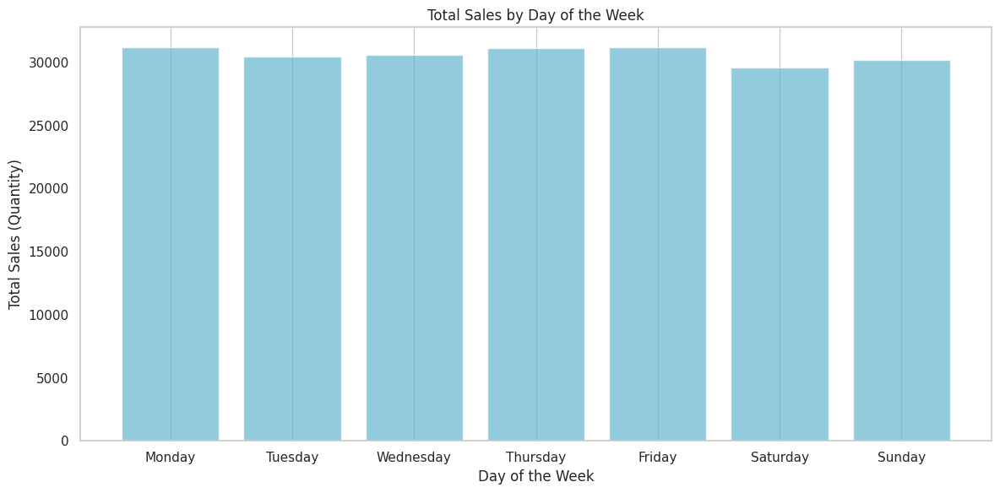

  day_of_week  transaction_qty    revenue

1      Monday            31231  101677.28

5     Tuesday            30449   99455.94

6   Wednesday            30625  100313.54

4    Thursday            31162  100767.78

0      Friday            31207  101373.00

2    Saturday            29614   96894.48

3      Sunday            30182   98330.31


In [ ]:
# Extract the day of the week from the transaction_date
data['day_of_week'] = data['transaction_date'].dt.day_name()

# Group by day_of_week to calculate total sales for each day
weekly_sales = data.groupby('day_of_week').agg({
    'transaction_qty': 'sum',
    'revenue': 'sum'
}).reset_index()

# Sort days of the week in order
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekly_sales['day_of_week'] = pd.Categorical(weekly_sales['day_of_week'], categories=days_order, ordered=True)
weekly_sales = weekly_sales.sort_values('day_of_week')

# Plotting sales by day of the week
plt.figure(figsize=(12, 6))
plt.bar(weekly_sales['day_of_week'], weekly_sales['transaction_qty'], color='c', alpha=0.7)
plt.xlabel('Day of the Week')
plt.ylabel('Total Sales (Quantity)')
plt.title('Total Sales by Day of the Week')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

# Display the weekly sales data
print(weekly_sales)


### Insights on Total Sales by Day of the Week:

1. **Steady Sales Across the Week**:
   - The chart demonstrates that sales are relatively consistent throughout the week, with minor variations between different days. This suggests that Maven Roasters has a stable customer base that frequents the shop regularly across all days.

2. **Highest Sales Days**:
   - **Monday** emerges as the day with the highest sales quantity, totaling 31,231 items sold and generating approximately $101,677.28 in revenue. This could be attributed to customers starting their week with coffee purchases or Monday-specific promotions.
   
   - **Wednesday** also shows high sales, with 30,625 items sold and revenue reaching $100,313.54, indicating another strong mid-week performance.

3. **Consistent Midweek Performance**:
   - Tuesday and Thursday also maintain robust sales, with totals closely following Monday and Wednesday. This steady midweek performance suggests a consistent demand for products throughout the workweek.

4. **Slight Dip on Weekends**:
   - Sales show a slight decrease during the weekend, with **Saturday** and **Sunday** having the lowest sales volumes of 29,614 and 30,182 respectively. This could be due to customers engaging in different activities over the weekend or the presence of other competing businesses.

### Recommendations:

- **Monday Promotions**:
  - Enhance Monday sales further with targeted promotions or loyalty programs to capitalize on the high foot traffic at the start of the week.

- **Midweek Specials**:
  - Introduce midweek specials or discounts on Tuesday and Thursday to sustain the consistent sales observed during these days.

- **Weekend Strategies**:
  - Consider introducing weekend-specific offers or events to attract more customers and boost sales during these lower-traffic days.


## **Identify Most and Least Sold Products and Revenue Drivers**

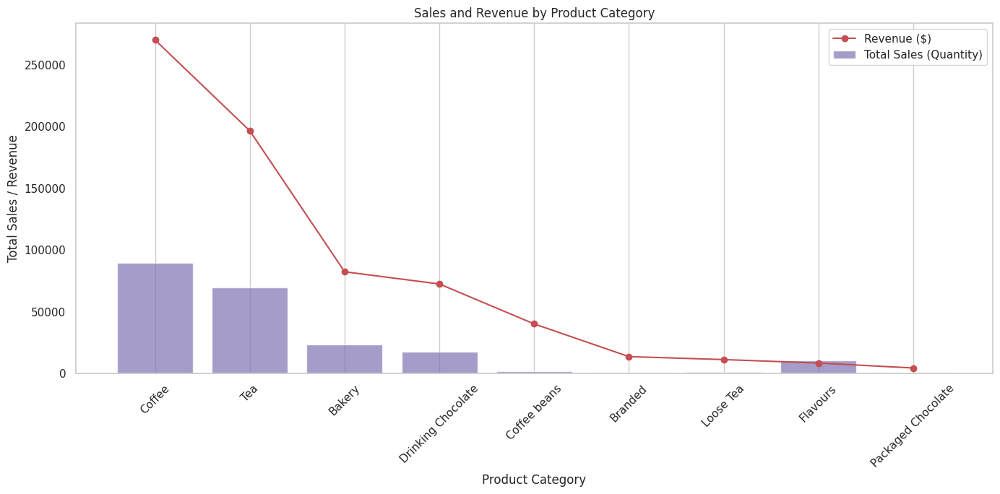

Most Sold Product:

Category: Coffee

Quantity Sold: 89250

Revenue: $269952.45



Least Sold Product:

Category: Packaged Chocolate

Quantity Sold: 487

Revenue: $4407.64



Highest Revenue Product:

Category: Coffee

Quantity Sold: 89250

Revenue: $269952.45


In [ ]:
# Group by product_category to calculate total sales and revenue for each category
product_sales = data.groupby('product_category').agg({
    'transaction_qty': 'sum',
    'revenue': 'sum'
}).reset_index()

# Identify the most and least sold products
most_sold_product = product_sales.loc[product_sales['transaction_qty'].idxmax()]
least_sold_product = product_sales.loc[product_sales['transaction_qty'].idxmin()]

# Identify the products that drive the most revenue
highest_revenue_product = product_sales.loc[product_sales['revenue'].idxmax()]

# Sort the product sales by revenue for better visualization
product_sales_sorted = product_sales.sort_values(by='revenue', ascending=False)

# Plotting sales and revenue by product category
plt.figure(figsize=(14, 7))
plt.bar(product_sales_sorted['product_category'], product_sales_sorted['transaction_qty'], color='m', alpha=0.7, label='Total Sales (Quantity)')
plt.plot(product_sales_sorted['product_category'], product_sales_sorted['revenue'], color='r', marker='o', label='Revenue ($)')
plt.xlabel('Product Category')
plt.ylabel('Total Sales / Revenue')
plt.title('Sales and Revenue by Product Category')
plt.xticks(rotation=45)
plt.legend()
plt.grid(axis='y')
plt.tight_layout()
plt.show()

# Display the summary of most and least sold products and highest revenue product
print("Most Sold Product:")
print(f"Category: {most_sold_product['product_category']}")
print(f"Quantity Sold: {most_sold_product['transaction_qty']}")
print(f"Revenue: ${most_sold_product['revenue']:.2f}")
print("\nLeast Sold Product:")
print(f"Category: {least_sold_product['product_category']}")
print(f"Quantity Sold: {least_sold_product['transaction_qty']}")
print(f"Revenue: ${least_sold_product['revenue']:.2f}")
print("\nHighest Revenue Product:")
print(f"Category: {highest_revenue_product['product_category']}")
print(f"Quantity Sold: {highest_revenue_product['transaction_qty']}")
print(f"Revenue: ${highest_revenue_product['revenue']:.2f}")



### Insights on Sales and Revenue by Product Category:

1. **Coffee Dominance**:
   - **Coffee** is the standout category, both in terms of quantity sold and revenue generated. It leads with a total of 89,250 units sold, generating a significant revenue of $269,952.45. This confirms coffee as the most popular and profitable product, underscoring its central role in the business.

2. **Strong Performance of Tea**:
   - **Tea** follows coffee, with substantial sales figures and revenue, reinforcing its status as a key product category. The strong demand for tea suggests opportunities for further product development and marketing efforts.

3. **Moderate Sales in Bakery and Drinking Chocolate**:
   - Both **Bakery** and **Drinking Chocolate** products contribute notably to overall sales, indicating a diverse product mix that appeals to different customer preferences. These categories can be leveraged for cross-selling opportunities with beverages.

4. **Underperformance of Niche Products**:
   - Categories like **Packaged Chocolate**, **Loose Tea**, **Flavours**, and **Branded** products show much lower sales volumes and revenue. This suggests these are niche items that may require strategic reevaluation, such as improved marketing or adjustments to the product offerings.

5. **Strategic Opportunities**:
   - The strong performance of core categories like Coffee and Tea should be leveraged through targeted promotions and new product introductions. Meanwhile, exploring ways to boost sales in underperforming categories could balance the product portfolio and enhance overall profitability.

### Recommendations:

- **Expand Coffee and Tea Lines**: Develop new flavors, sizes, or complementary products to capture a larger market share and increase customer satisfaction.
- **Promote Bakery and Drinking Chocolate**: Utilize cross-selling techniques and bundling strategies to enhance sales of these products alongside popular beverages.
- **Revitalize Niche Products**: Consider repositioning, bundling, or adjusting prices for underperforming items to better align with customer interests and drive incremental sales.


# **Maven Roasters Sales Analysis Summary**

**Key Insights:**

1. **Revenue Trends**:
   - The sales revenue has shown a steady upward trend from January to July 2023, with notable revenue peaks in June and July due to successful promotional campaigns and new product introductions.
   - While there were fluctuations early in the year (January to March), a more consistent growth pattern emerged from March onward, indicating effective customer retention and refined business strategies.

2. **Day and Time Patterns**:
   - Sales are consistent throughout the week, with Monday and Wednesday showing slightly higher sales volumes. The weekend sees a slight dip, suggesting different customer routines or increased competition.
   - Peak sales hours are observed between 8 AM and 11 AM, reflecting morning routines and a high demand for coffee and breakfast items. Sales remain steady during lunchtime (12 PM to 4 PM) but decline significantly after 4 PM.

3. **Product Category Performance**:
   - Coffee is the leading product category, both in quantity sold and revenue generated, underscoring its critical role in the business. Tea also performs strongly, contributing significantly to overall sales.
   - Bakery and Drinking Chocolate show moderate sales, indicating potential for cross-selling opportunities, while niche categories like Packaged Chocolate and Loose Tea underperform, suggesting a need for strategic reevaluation.

**Recommendations:**

- **Leverage High-Performing Products**: Expand coffee and tea offerings with new flavors and sizes, and implement targeted promotions to capitalize on their popularity.
- **Enhance Monday and Midweek Sales**: Utilize special promotions and loyalty programs to maintain high sales on Mondays and sustain consistent performance on Tuesdays and Thursdays.
- **Boost Weekend and Evening Engagement**: Introduce weekend-specific events and post-workday promotions to attract more customers during these lower-traffic periods.
- **Revitalize Underperforming Categories**: Consider repositioning, bundling, or adjusting pricing for niche products to better align with customer preferences and drive incremental sales.

By focusing on these strategies, Maven Roasters can maximize its strengths, address areas for improvement, and continue its trajectory of growth and customer satisfaction.


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/coffee-sales/Coffee Shop Sales.xlsx


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df= pd.read_excel(r"/kaggle/input/coffee-sales/Coffee Shop Sales.xlsx")

In [ ]:
df.sample(5)

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail
46085,46192,2023-03-18,17:36:31,1,3,Astoria,63,0.80,Flavours,Regular syrup,Carmel syrup
116839,117101,2023-06-03,16:14:07,1,8,Hell's Kitchen,69,3.25,Bakery,Biscotti,Hazelnut Biscotti
281,282,2023-01-01,14:07:12,2,3,Astoria,41,4.25,Coffee,Barista Espresso,Cappuccino Lg
45459,45566,2023-03-18,07:13:33,1,8,Hell's Kitchen,72,3.25,Bakery,Scone,Ginger Scone
125740,126077,2023-06-11,09:23:02,1,8,Hell's Kitchen,55,4.00,Tea,Brewed Chai tea,Morning Sunrise Chai Lg


In [ ]:
df.describe()

,transaction_id,transaction_date,transaction_qty,store_id,product_id,unit_price
count,149116.000000,149116,149116.000000,149116.000000,149116.000000,149116.000000
mean,74737.371872,2023-04-15 11:50:32.173609984,1.438276,5.342063,47.918607,3.382219
min,1.000000,2023-01-01 00:00:00,1.000000,3.000000,1.000000,0.800000
25%,37335.750000,2023-03-06 00:00:00,1.000000,3.000000,33.000000,2.500000
50%,74727.500000,2023-04-24 00:00:00,1.000000,5.000000,47.000000,3.000000
75%,112094.250000,2023-05-30 00:00:00,2.000000,8.000000,60.000000,3.750000
max,149456.000000,2023-06-30 00:00:00,8.000000,8.000000,87.000000,45.000000
std,43153.600016,NaN,0.542509,2.074241,17.930020,2.658723


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149116 entries, 0 to 149115
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   transaction_id    149116 non-null  int64         
 1   transaction_date  149116 non-null  datetime64[ns]
 2   transaction_time  149116 non-null  object        
 3   transaction_qty   149116 non-null  int64         
 4   store_id          149116 non-null  int64         
 5   store_location    149116 non-null  object        
 6   product_id        149116 non-null  int64         
 7   unit_price        149116 non-null  float64       
 8   product_category  149116 non-null  object        
 9   product_type      149116 non-null  object        
 10  product_detail    149116 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(4), object(5)
memory usage: 12.5+ MB


In [ ]:
df['transaction_time']=df['transaction_time'].astype(str)

In [ ]:
df['transaction_time']=pd.to_timedelta (df['transaction_time'])

In [ ]:
df['sales']=df['transaction_qty']*df['unit_price']

In [ ]:
df['datetime']=df['transaction_date']+df['transaction_time']

In [ ]:
df.sample(3)

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail,sales,datetime
18106,18136,2023-02-02,0 days 13:40:36,2,8,Hell's Kitchen,47,3.00,Tea,Brewed Green tea,Serenity Green Tea Lg,6.00,2023-02-02 13:40:36
69046,69216,2023-04-17,0 days 13:18:06,1,5,Lower Manhattan,61,4.75,Drinking Chocolate,Hot chocolate,Sustainably Grown Organic Lg,4.75,2023-04-17 13:18:06
63387,63557,2023-04-11,0 days 08:44:50,1,5,Lower Manhattan,48,2.50,Tea,Brewed Black tea,English Breakfast Rg,2.50,2023-04-11 08:44:50


In [ ]:
df_location=df.groupby('store_location').agg({
    'sales':'sum',
    'transaction_id' : 'count'
})
df_location

,sales,transaction_id
store_location,,
Astoria,232243.91,50599
Hell's Kitchen,236511.17,50735
Lower Manhattan,230057.25,47782


In [ ]:
daily_sales_by_location=df.groupby(['transaction_date','store_location'])['sales'].sum().unstack()

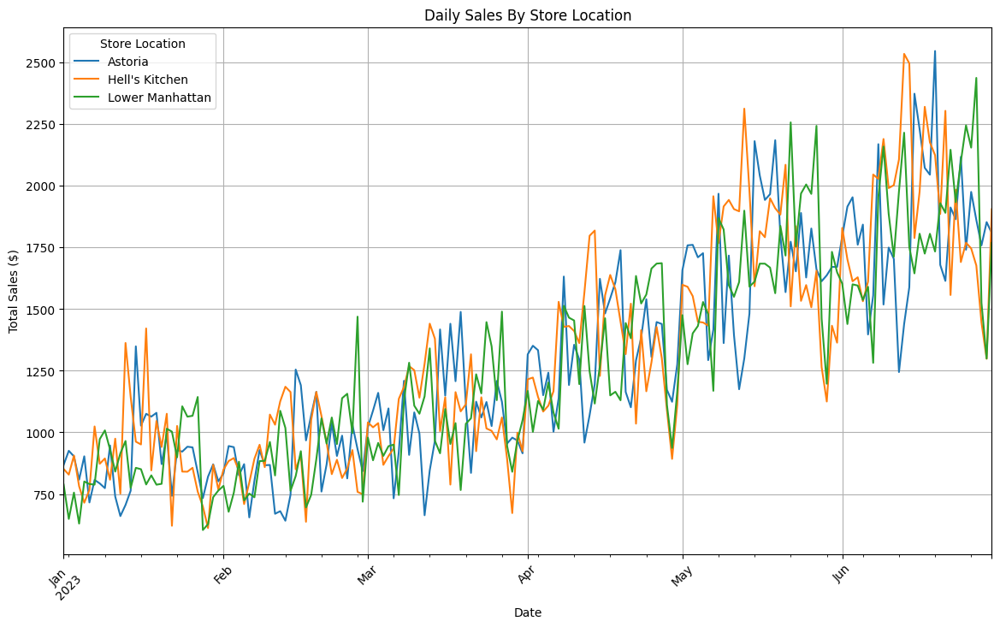

In [ ]:
daily_sales_by_location.plot(figsize=(14,8), title='Daily Sales By Store Location')
plt.xlabel('Date')
plt.ylabel('Total Sales ($)')
plt.legend(title='Store Location')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout
plt.show()

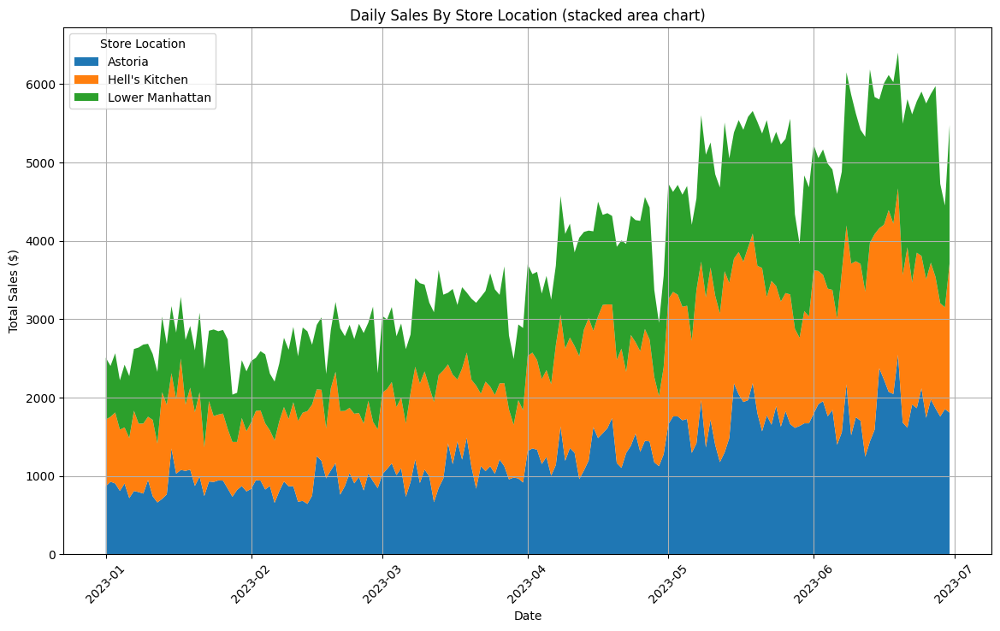

In [ ]:
plt.figure(figsize=(14,8))
plt.stackplot(daily_sales_by_location.index, daily_sales_by_location.T, labels=daily_sales_by_location.columns)
plt.title('Daily Sales By Store Location (stacked area chart)')
plt.xlabel('Date')
plt.ylabel('Total Sales ($)')
plt.legend(title='Store Location', loc='upper left')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout
plt.show()

In [ ]:
df['day_of_week']=df['datetime'].dt.day_name()

In [ ]:
df.sample(3)

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail,sales,datetime,day_of_week
86472,86726,2023-05-07,0 days 07:09:45,1,3,Astoria,58,3.5,Drinking Chocolate,Hot chocolate,Dark chocolate Rg,3.5,2023-05-07 07:09:45,Sunday
75928,76098,2023-04-25,0 days 15:15:49,2,3,Astoria,29,2.5,Coffee,Gourmet brewed coffee,Columbian Medium Roast Rg,5.0,2023-04-25 15:15:49,Tuesday
80981,81155,2023-05-01,0 days 16:24:40,2,3,Astoria,47,3.0,Tea,Brewed Green tea,Serenity Green Tea Lg,6.0,2023-05-01 16:24:40,Monday


In [ ]:
daily_sales=df.groupby ('transaction_date')['sales'].sum().reset_index()


In [ ]:
weekly_sales=df.groupby('day_of_week')['sales'].sum().reindex(
['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']).reset_index()

In [ ]:
df['month']=df['datetime'].dt.to_period('M')
monthly_sales=df.groupby('month')['sales'].sum().reset_index()

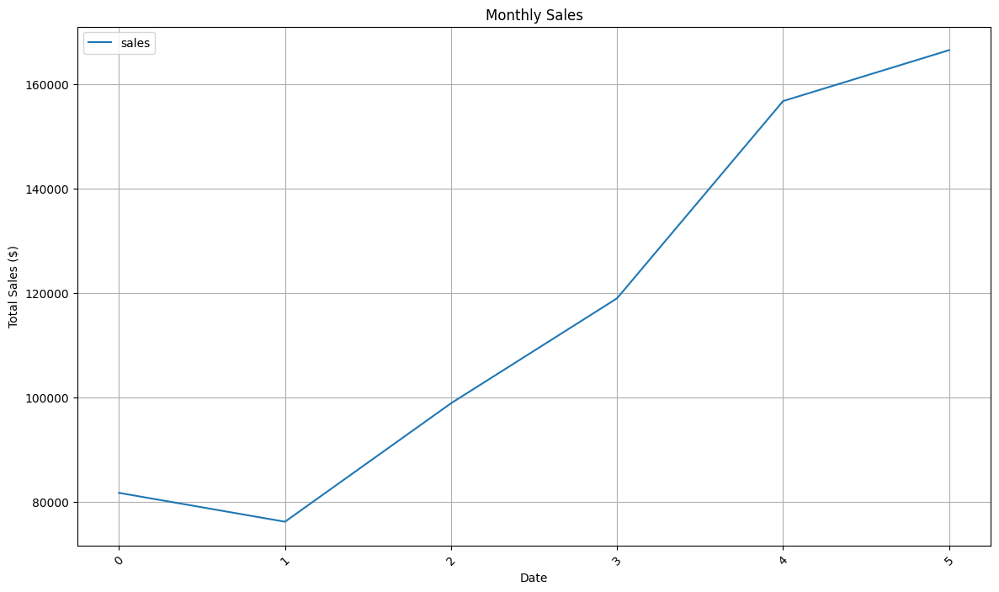

In [ ]:
monthly_sales.plot(figsize=(14,8), title='Monthly Sales')
plt.xlabel('Date')
plt.ylabel('Total Sales ($)')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout
plt.show()

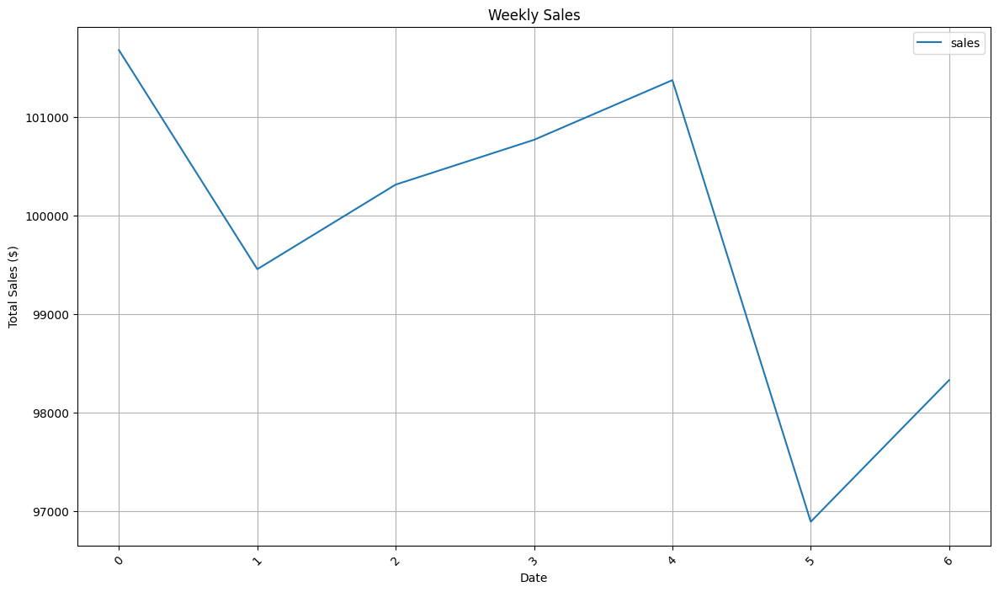

In [ ]:
weekly_sales.plot(figsize=(14,8), title='Weekly Sales')
plt.xlabel('Date')
plt.ylabel('Total Sales ($)')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout
plt.show()

In [ ]:
weekly_sales=df.groupby(['day_of_week','store_location'])['sales'].sum().unstack()

In [ ]:
days_order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
weekly_sales=weekly_sales.reindex(days_order)

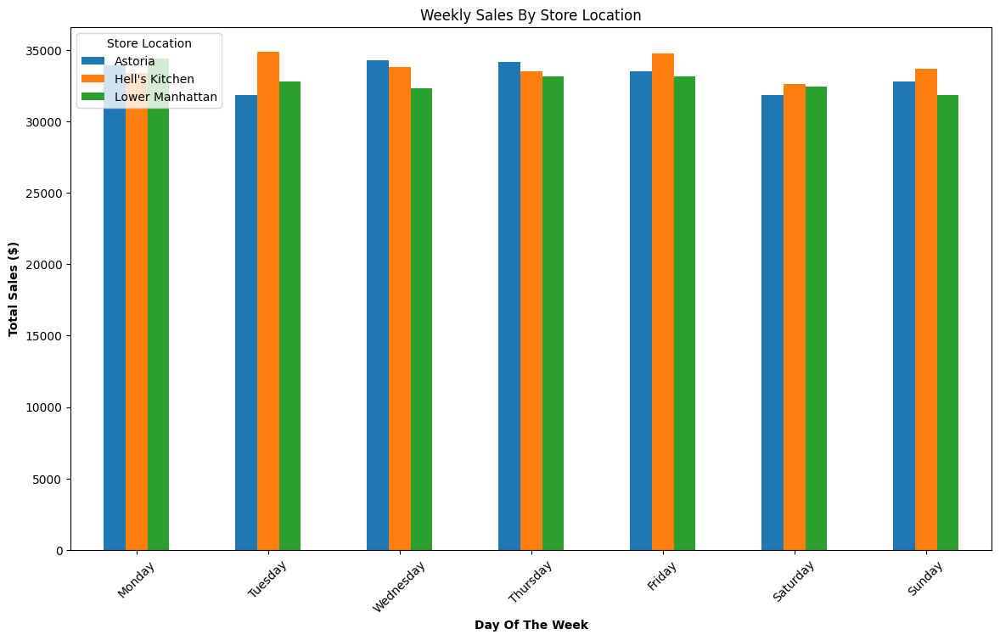

In [ ]:
weekly_sales[["Astoria", "Hell's Kitchen", "Lower Manhattan"]].plot(kind='bar', figsize=(14,8))
plt.title('Weekly Sales By Store Location')
plt.xlabel('Day Of The Week', fontweight='bold')
plt.ylabel('Total Sales ($)', fontweight='bold')
plt.xticks(rotation=45)
plt.legend(title='Store Location', loc='upper left')
plt.tight_layout
plt.show()

In [ ]:
df_category=df.groupby('product_category').agg({
    'sales': 'sum',
    'transaction_id':'count'
}).sort_values('sales', ascending=False)
df_category

,sales,transaction_id
product_category,,
Coffee,269952.45,58416
Tea,196405.95,45449
Bakery,82315.64,22796
Drinking Chocolate,72416.00,11468
Coffee beans,40085.25,1753
Branded,13607.00,747
Loose Tea,11213.60,1210
Flavours,8408.80,6790
Packaged Chocolate,4407.64,487


In [ ]:
df['hour']=df['datetime'].dt.hour
hourly_sales_by_product=df.groupby(['hour', 'product_category'])['sales'].sum().unstack()

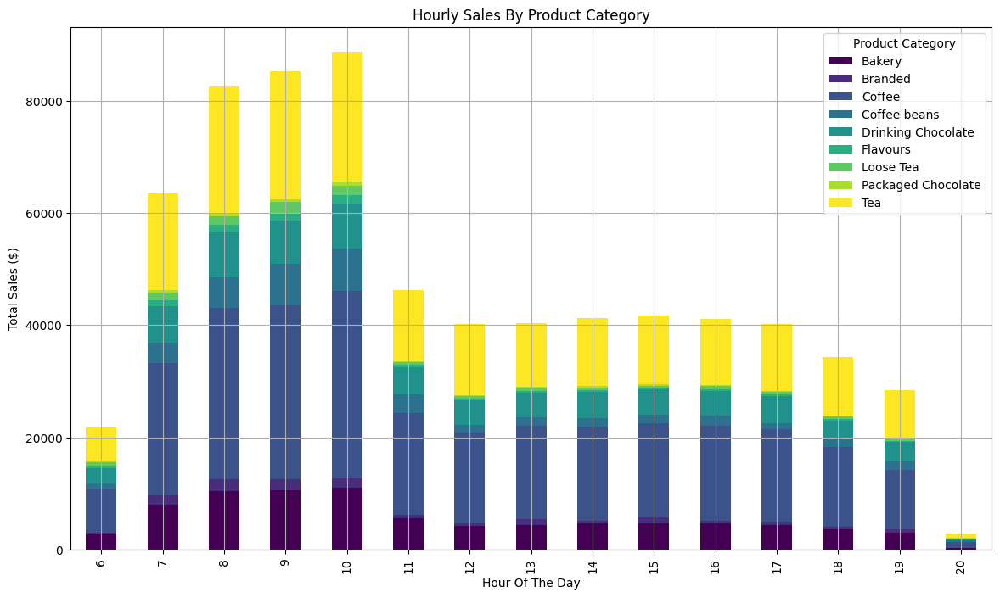

In [ ]:
hourly_sales_by_product.plot(kind='bar', stacked=True,figsize=(14,8), colormap='viridis')
plt.title('Hourly Sales By Product Category')
plt.xlabel('Hour Of The Day')
plt.ylabel('Total Sales ($)')
plt.legend(title='Product Category', loc='upper right')
plt.grid(True)
plt.tight_layout
plt.show()

In [ ]:
sales_by_product=df.groupby('product_type').agg({
    'sales':'sum',
    'unit_price':'mean'

}).sort_values('sales', ascending=False)
sales_by_product

,sales,unit_price
product_type,,
Barista Espresso,91406.20,3.655200
Brewed Chai tea,77081.95,2.936993
Hot chocolate,72416.00,4.148827
Gourmet brewed coffee,70034.60,2.696641
Brewed Black tea,47932.00,2.744670
Brewed herbal tea,47539.50,2.744731
Premium brewed coffee,38781.15,3.122452
Organic brewed coffee,37746.50,2.898021
Scone,36866.12,3.534638


In [ ]:
product_sales_df=df.groupby(['product_category', 'product_type'])['sales'].sum().reset_index()
product_sales_df

,product_category,product_type,sales
0,Bakery,Biscotti,19793.53
1,Bakery,Pastry,25655.99
2,Bakery,Scone,36866.12
3,Branded,Clothing,6163.00
4,Branded,Housewares,7444.00
5,Coffee,Barista Espresso,91406.20
6,Coffee,Drip coffee,31984.00
7,Coffee,Gourmet brewed coffee,70034.60
8,Coffee,Organic brewed coffee,37746.50
9,Coffee,Premium brewed coffee,38781.15


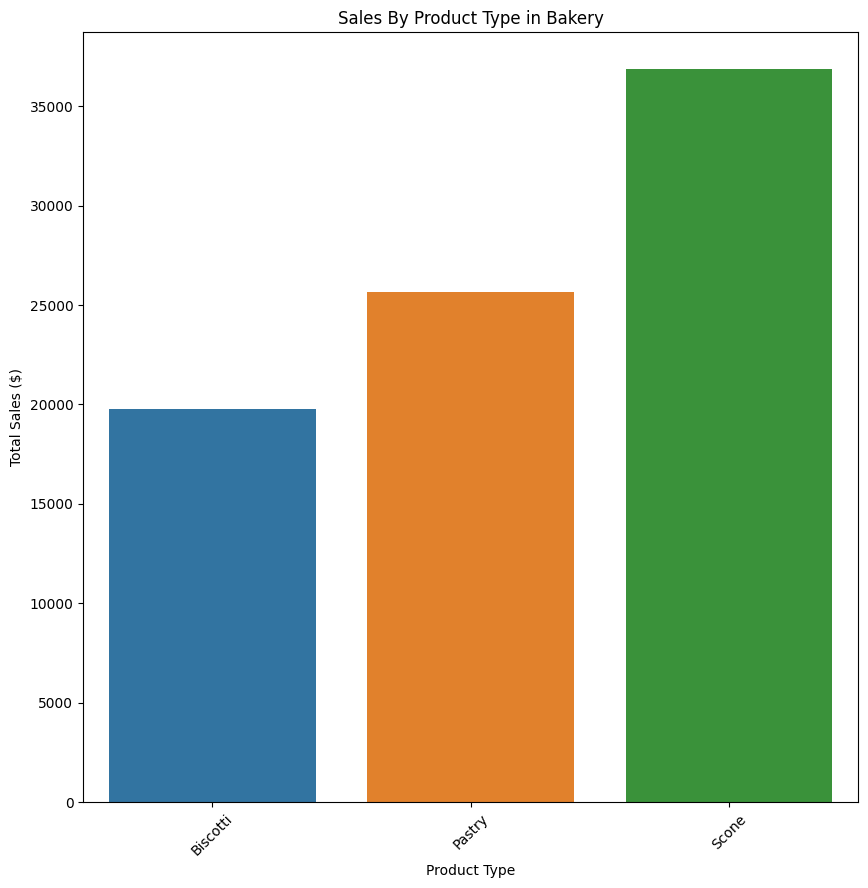

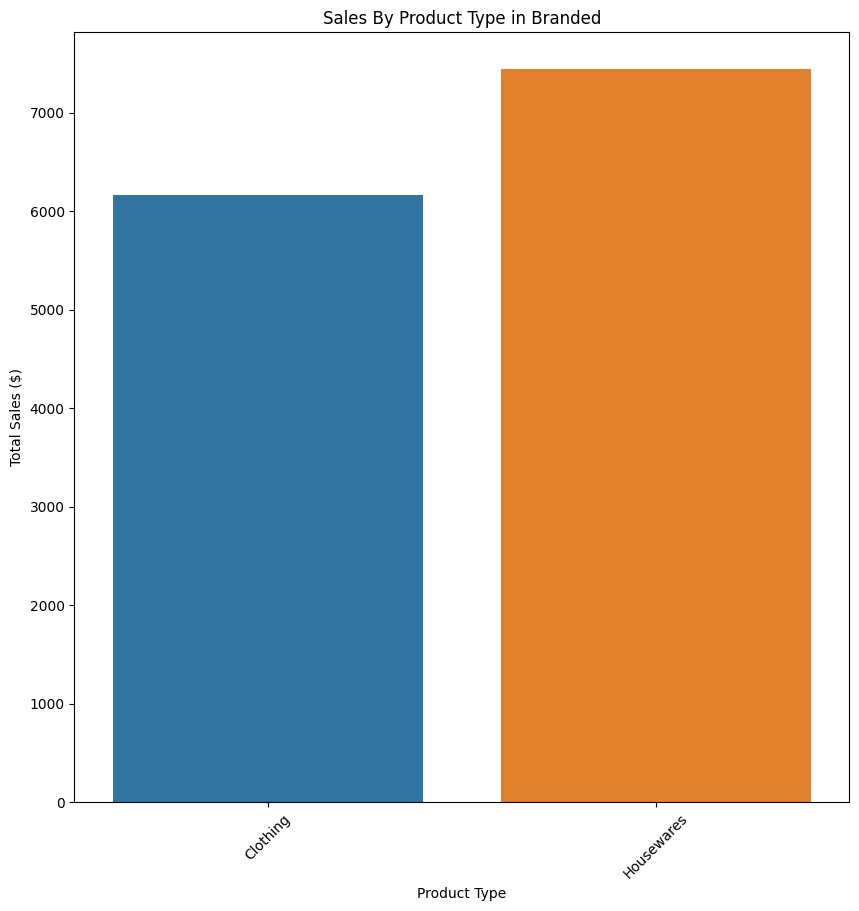

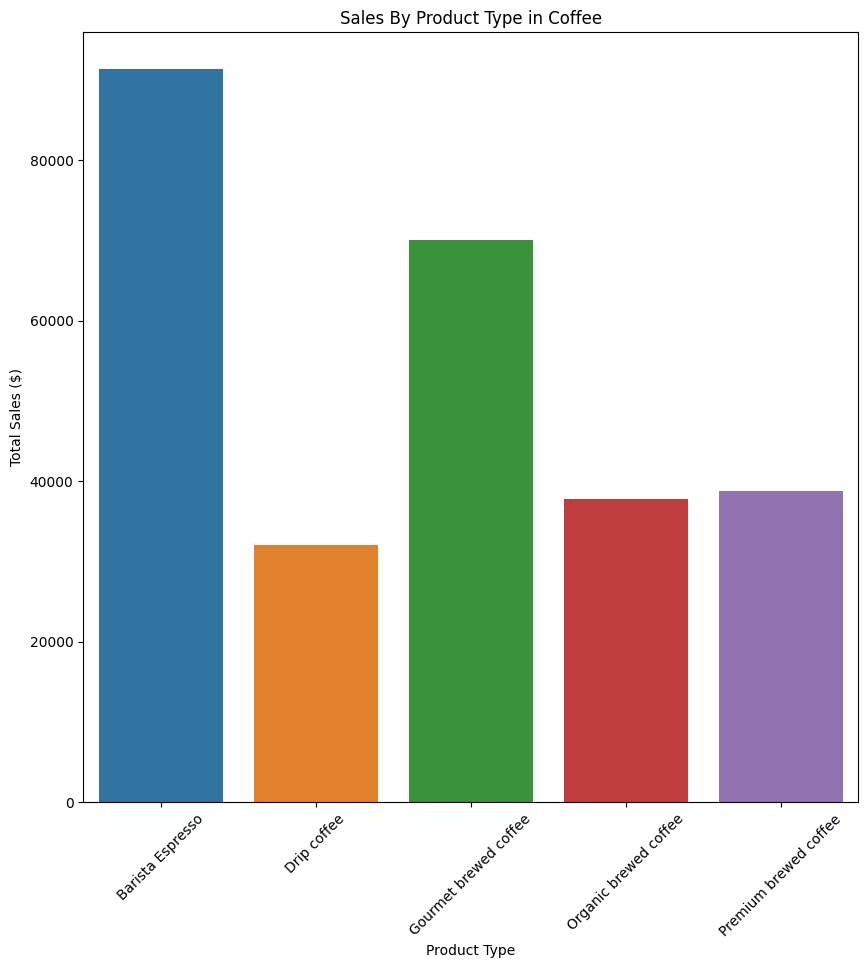

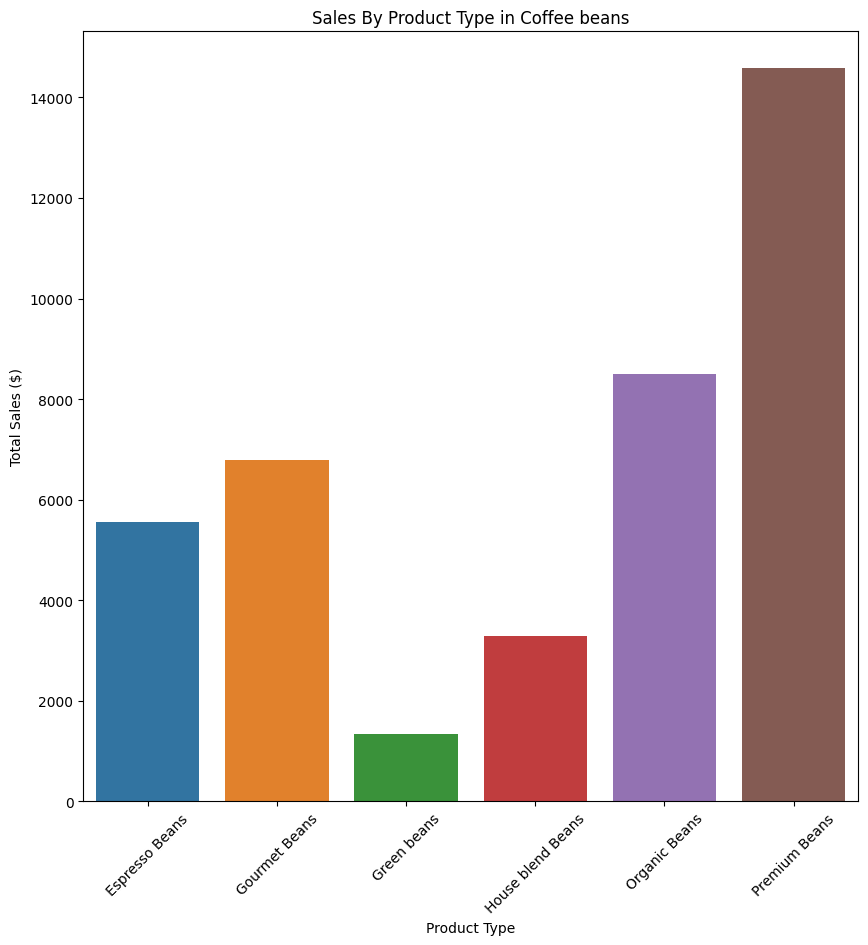

/opt/conda/lib/python3.10/site-packages/seaborn/categorical.py:645: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  g_vals = grouped_vals.get_group(g)


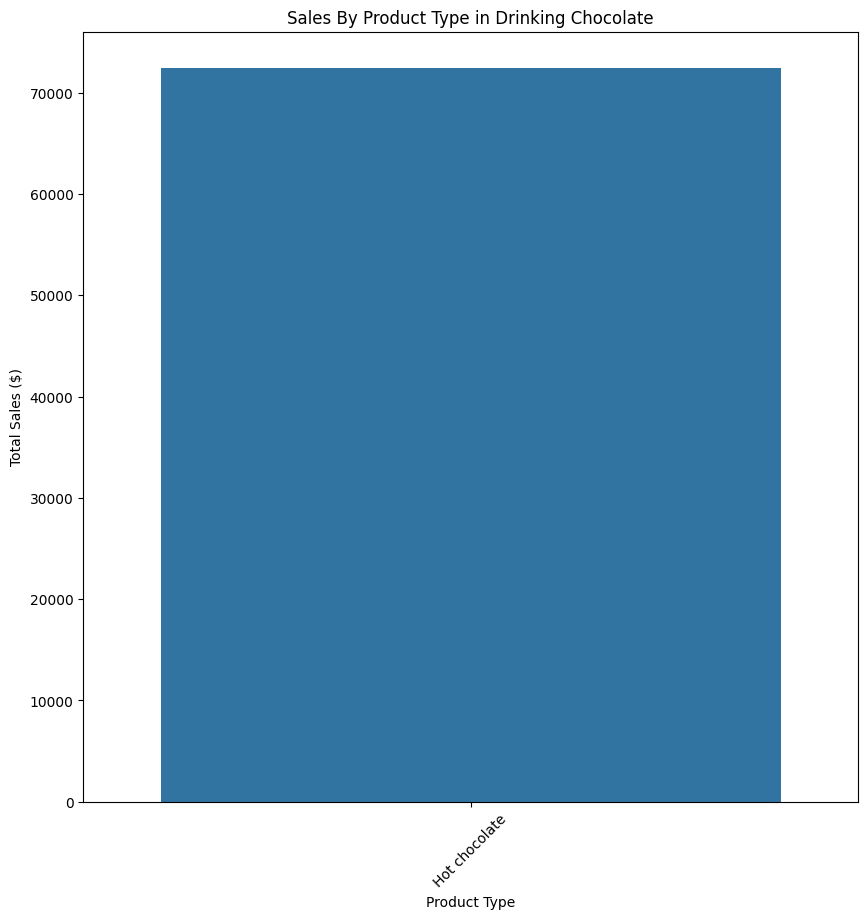

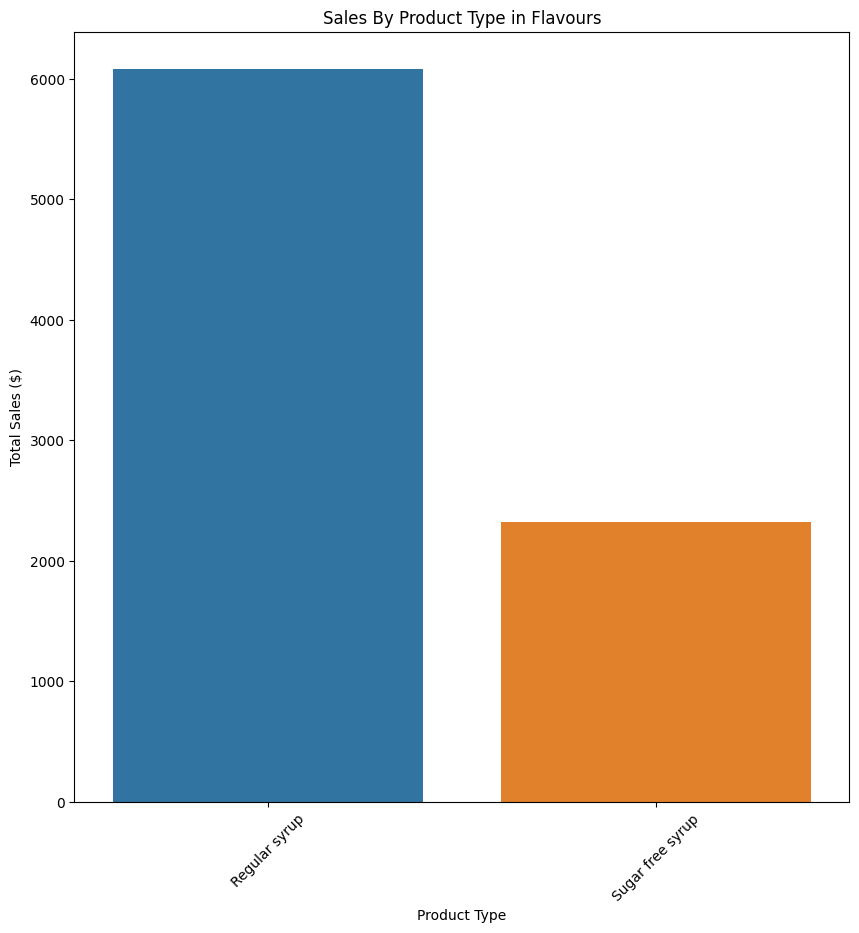

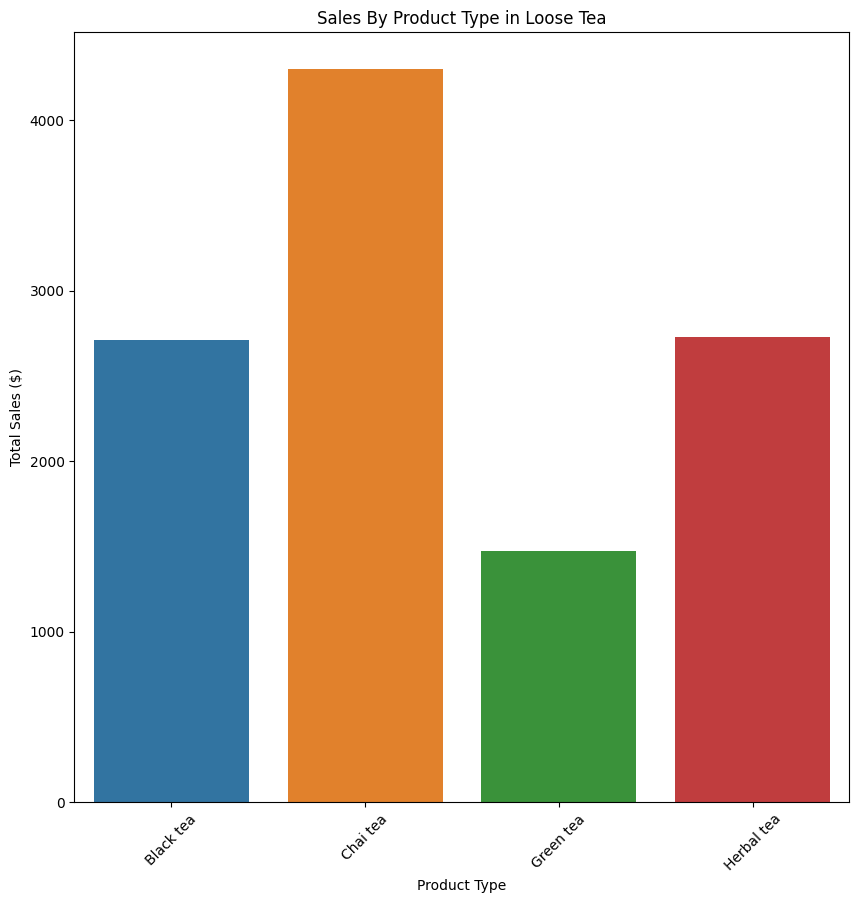

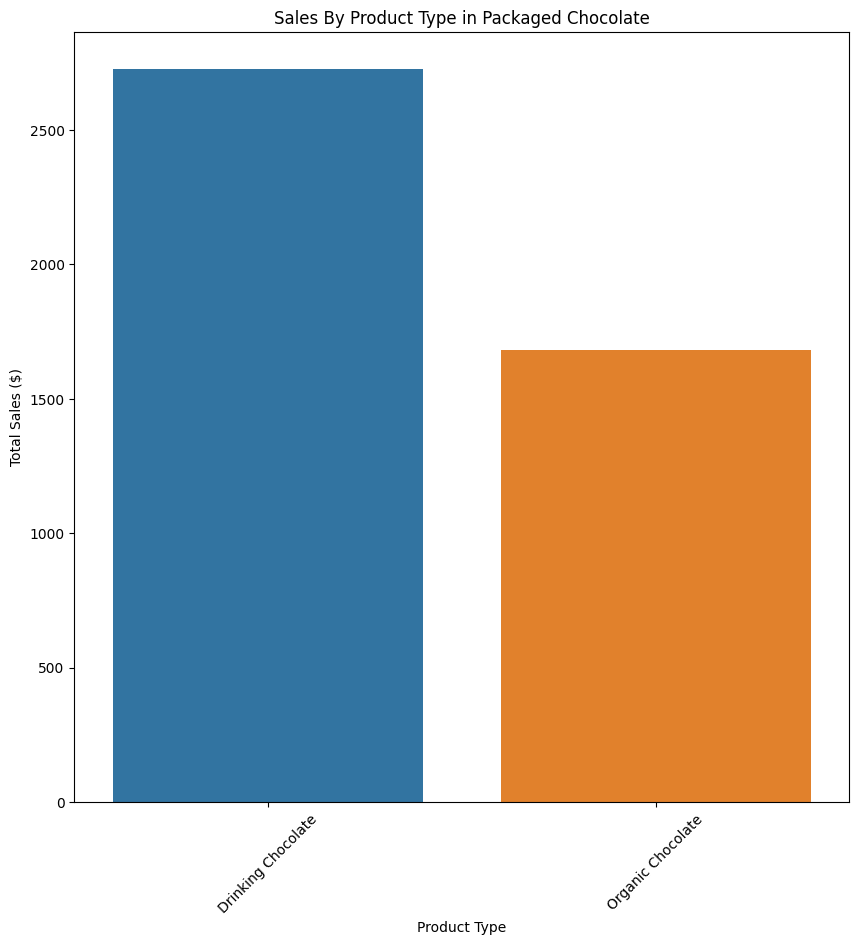

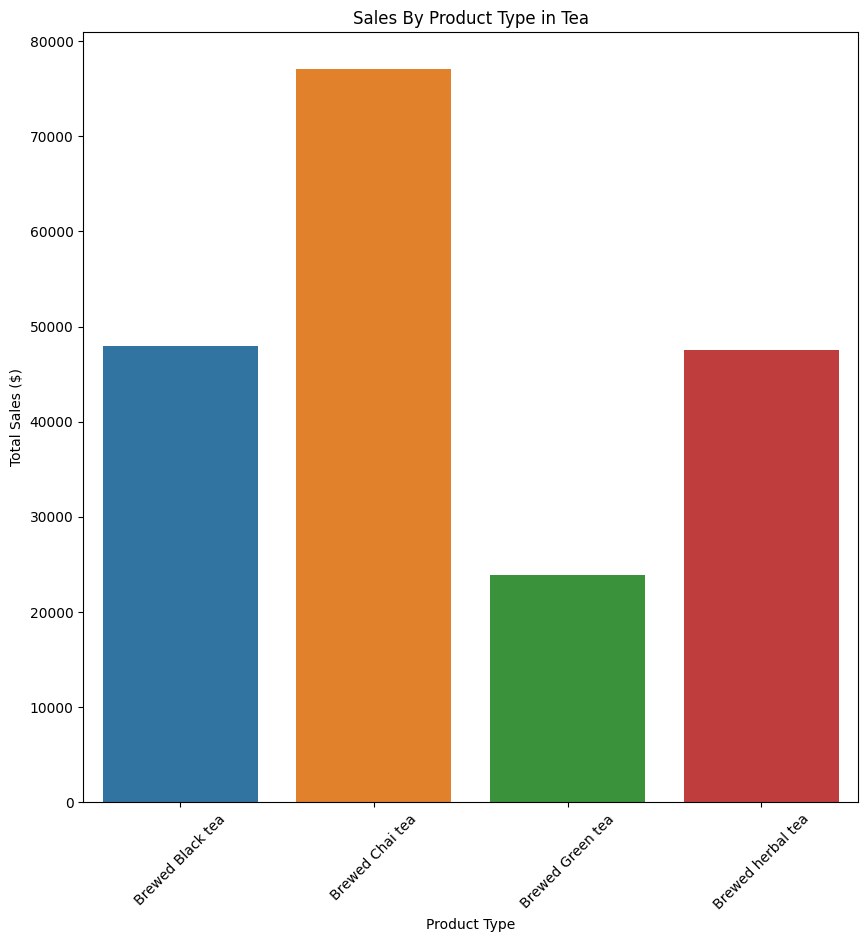

In [ ]:
categories = product_sales_df['product_category'].unique()
for category in categories:
    plt.figure(figsize=(10,10))
    category_data = product_sales_df[product_sales_df['product_category']==category]
    sns.barplot(data=category_data, x='product_type', y='sales')

    plt.title(f'Sales By Product Type in {category}')
    plt.xlabel('Product Type')
    plt.ylabel('Total Sales ($)')
    plt.xticks(rotation=45)
    plt.tight_layout
    plt.show()

In [ ]:
hourly_sales_by_location=df.groupby(['store_location', 'hour'])['sales'].sum().reset_index()
hourly_sales_by_location

,store_location,hour,sales
0,Astoria,7,19028.80
1,Astoria,8,22805.90
2,Astoria,9,23183.57
3,Astoria,10,24426.12
4,Astoria,11,15498.13
5,Astoria,12,15681.20
6,Astoria,13,15947.87
7,Astoria,14,15175.27
8,Astoria,15,15651.95
9,Astoria,16,16110.85


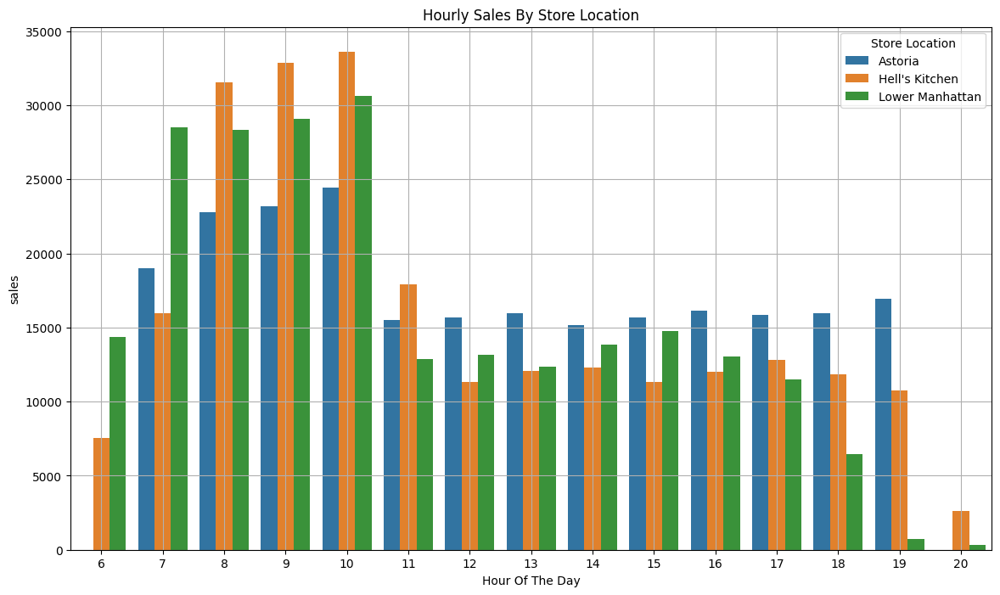

In [ ]:
plt.figure(figsize=(14,8))
sns.barplot(data=hourly_sales_by_location, x='hour', y='sales', hue='store_location')

plt.title('Hourly Sales By Store Location')
plt.xlabel('Hour Of The Day')
plt.ylabel=('Total Sales ($)')
plt.grid(True)
plt.legend(title='Store Location', loc='upper right')
plt.tight_layout
plt.show()

# ABC Analysis Overview.

In it's simplest form, ABC analysis is a product categorization exercise designed to split all range of products into three categories, usually designated as A, B and C (hence the analysis' name), based on their contribution to the busness in terms of a certain criterion. In other words, products are grouped by their importance to the business.

ABC analysis is inspired by the Pareto Principle stating that 80% of output comes from 20% of items, which is not a strict law but merely an observation.

As far as the criterion, most often it is revenue or margin. For this work, I will choose revenue.

For such an analysis, the dataset should contain item-level data allowing for each item's contribution to the overall revenue, or share of revenue, to be determined. Then, the dataset is sorted in descending order by the share of revenue value and a running total is calculated. All the top items which cumulatively account for 80% of revenue are assigned to Category A; the next batch of items which, together with those in Category A, contribute to 95% (80% + 15%) of the revenue overall, will go to Category B, and the remainder to Category C. Of course, the percentage shares can be chosen differently. In the code below they are defined by constants `CAT_A = 80` and `CAT_B = 15`.

Apart from a couple of plots, the analysis does not have much in the way of visualization; it's mostly numbers.

# Importing and Looking into the Data.

Importing the Excel file and calling basic exploration methods are self-explanatory:

In [ ]:
import numpy as np
import pandas as pd
from pandas import Series, DataFrame # I prefer to have these in the namespace, unqualified
import matplotlib.pyplot as plt
from matplotlib.ticker import FixedLocator, FixedFormatter, PercentFormatter

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Background color for the figure object
PLOT_COLOR = '#f2f2f2'

/kaggle/input/coffee-sales/Coffee Shop Sales.xlsx


In [ ]:
# Importing the data
EXCEL_FILE = r'/kaggle/input/coffee-sales/Coffee Shop Sales.xlsx'
#DATE_FORMAT = '%d/%m/%Y'  # # e.g. 16/06/2017

df = pd.read_excel(EXCEL_FILE,
                   header = 0,
                   sheet_name = 0,
                   index_col = 0,
                   )

In [ ]:
df.head()

,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail
transaction_id,,,,,,,,,,
1,2023-01-01,07:06:11,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg
2,2023-01-01,07:08:56,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg
3,2023-01-01,07:14:04,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg
4,2023-01-01,07:20:24,1,5,Lower Manhattan,22,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm
5,2023-01-01,07:22:41,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg


In [ ]:
# Data types are acceptable
df.dtypes

transaction_date    datetime64[ns]
transaction_time            object
transaction_qty              int64
store_id                     int64
store_location              object
product_id                   int64
unit_price                 float64
product_category            object
product_type                object
product_detail              object
dtype: object

In [ ]:
# There are no NaN values
df.isna().any()

transaction_date    False
transaction_time    False
transaction_qty     False
store_id            False
store_location      False
product_id          False
unit_price          False
product_category    False
product_type        False
product_detail      False
dtype: bool

# Data Integrity Checks.

## Product identification and description.

ABC analysis centers around products. Here, both `product_id` (identification) and `product_detail` (description) are used in the code and results. It helps to be sure that product identification and description form a bi-directional map (a one-to-one correspondence). The following code shows that it does:

In [ ]:
# Checking that each product_id uniquely identifies a product, and vice versa. Should return nothing.
products_df = df[['product_id', 'product_detail']].drop_duplicates()
assert products_df.product_id.is_unique and products_df.product_detail.is_unique

## Store ids and locations.

I will be performing an independent analysis for each store location, in addition to the whole business. To use location names and ids interchangeably, we need to know that `store_id` and `store_location` also form a bi-directional map, which they do:

In [ ]:
# store_id uniquely identifies store_location
df[['store_id', 'store_location']].drop_duplicates(ignore_index=True)

,store_id,store_location
0,5,Lower Manhattan
1,8,Hell's Kitchen
2,3,Astoria


## Dataset time period.

It is useful to know that all transactions happened in the first half of 2023:

In [ ]:
print(f'Year(s): {df.transaction_date.dt.year.unique()}')
print(f'Month(s): {df.transaction_date.dt.month.unique()}')

Year(s): [2023]
Month(s): [1 2 3 4 5 6]


## Price consistency.

It turns out that some product items were sold at markedly different prices, even at the same location. This may happen as the result of various discounts schedules and / or customer loyalty programs. ABC analysis is based on calculating the revenue each product brings in over a certain time period. A product retail price does not have to stay constant during that period, but if it changes, this need to be taken into account when making broader business decisions based on the analysis.

The code and the table below reveal products whose prices changed, the number of different price points at which such products were sold at various times and / or locations, and the price points themselves:

In [ ]:

(df[['product_detail', 'store_location', 'unit_price']]
 .drop_duplicates()
 .groupby(['product_detail', 'store_location'])
 .agg([('Number_of_price_points', 'size'), ('Price points', lambda price : price.astype(str).str.cat(sep = ', '))])
 .droplevel(level=0, axis=1)
 .query('Number_of_price_points > 1')
)

Number_of_price_points  \
product_detail            store_location                            
Almond Croissant          Lower Manhattan                       2   
Chocolate Chip Biscotti   Lower Manhattan                       2   
Chocolate Croissant       Lower Manhattan                       2   
Cranberry Scone           Lower Manhattan                       2   
Croissant                 Lower Manhattan                       2   
Ginger Biscotti           Lower Manhattan                       2   
Ginger Scone              Hell's Kitchen                        2   
                          Lower Manhattan                       3   
Hazelnut Biscotti         Lower Manhattan                       2   
I Need My Bean! Diner mug Astoria                               2   
I Need My Bean! Latte cup Astoria                               2   
I Need My Bean! T-shirt   Astoria                               2   
Jumbo Savory Scone        Lower Manhattan                       2   
Organic Decaf Blend       Lower Manhattan                       4   
Ouro Brasileiro shot      Hell's Kitchen                        2   
                          Lower Manhattan                       2   
Scottish Cream Scone      Lower Manhattan                       2   

                                                     Price points  
product_detail            store_location                           
Almond Croissant          Lower Manhattan              3.75, 4.69  
Chocolate Chip Biscotti   Lower Manhattan               3.5, 4.38  
Chocolate Croissant       Lower Manhattan              3.75, 4.69  
Cranberry Scone           Lower Manhattan              3.25, 4.06  
Croissant                 Lower Manhattan               3.5, 4.38  
Ginger Biscotti           Lower Manhattan               3.5, 4.38  
Ginger Scone              Hell's Kitchen               3.25, 2.65  
                          Lower Manhattan        3.25, 4.06, 2.65  
Hazelnut Biscotti         Lower Manhattan              3.25, 4.06  
I Need My Bean! Diner mug Astoria                      12.0, 23.0  
I Need My Bean! Latte cup Astoria                      14.0, 23.0  
I Need My Bean! T-shirt   Astoria                      28.0, 23.0  
Jumbo Savory Scone        Lower Manhattan              3.75, 4.69  
Organic Decaf Blend       Lower Manhattan  28.0, 12.0, 22.5, 23.0  
Ouro Brasileiro shot      Hell's Kitchen                 3.0, 2.1  
                          Lower Manhattan                3.0, 2.1  
Scottish Cream Scone      Lower Manhattan               4.5, 5.63

# ABC analysis.

## Data Subsets for the Analysis.

I will be doing the ABC analysis for a number of distincts cases, defined by different subsets of data:

* the whole dataset,
* each of the stores independently.

This will essentially produce four analysis results based on the four subsets of data, if the number of outlets (locations) remains to be three (updating the dataset in future may increase the number).

## Running the analysis on the whole dataset.

To facilitate the ABC analysis on the whole dataset as well as its different subsets, I will define a function taking the original DataFrame as an argument along with the percentage share values. The functions returns two DataFrames:

* The `abc` DataFrame, representing the core ABC analysis data: a full list or products with detailed data for each product: total revenue, the share of the revenue, the running share of the revenue (the list is ordered by the revenue in the descending order), and the product category.

* The `summary` DataFrame, which outlines information for each category: the number of items in the category, the share of items (helps to compare with the Pareto principle) and its actual share of revenue, which is likely to differ from the initial percentage share values.

The fucntion and the rather long list of products with the analysis data are as follows:

In [ ]:
# Percentage share values which determine which group a product should belong to,
# based on each product's contribution to the total revenue.
CAT_A = 80
CAT_B = 15

def analyze_abc(df: DataFrame, cat_a: int, cat_b: int) -> tuple[DataFrame, DataFrame]:
    """Performs the ABC analysis for products (product_id', 'product_detail')
    based on the total revenue for each item of products.

    df: DafaFrame containing itemized transactions
    cat_a, cat_b: the percentage values used to determine Category A and B items, respectively

    Returns a tuple of two DataFrames:
    abc: contains the full results of the analysis for each item:
      - an item's revenue,
      - it's share of the total revenue,
      - the running share (cumulative),
      - the assigned category;
    summary: contains generalized data of the analysis:
      - the initial percentage breakdown
      - the number of items in each category
      - the actual share of revenue all items in the category account for
      - the percentage of items in the category
    """

    summary = DataFrame({'percentage' : [CAT_A, CAT_B, 100-CAT_A-CAT_B]},
                        index = ['A', 'B', 'C']
                       )

    abc = (df[['product_id', 'product_detail', 'unit_price', 'transaction_qty']]
           .assign(revenue = df['unit_price'] * df['transaction_qty'])
           [['product_id', 'product_detail', 'revenue']].
           groupby(['product_id', 'product_detail']).
           sum().
           sort_values('revenue', ascending=False)
           )

    abc['share'] = 100 * abc.revenue / abc.revenue.sum()
    abc['running_share'] = abc.share.cumsum()
    abc['category'] = (abc['running_share']
                       .map(lambda e : 'A' if e <= CAT_A else 'B' if e <= CAT_A+CAT_B else 'C')
                       )

    summary = pd.concat([summary,
                         abc[['category', 'share']]
                         .groupby('category')
                         .agg([('items_per_category', 'count'),
                               ('share_of_revenue', 'sum'),
                               ('percentage_of_items', lambda s : 100 * len(s)/len(abc))])
                         .droplevel(level=0, axis=1)
                        ],
                        axis = 1,
                        join = 'inner'
                       )

    return abc, summary

# Removing the limit on the maximum rows printed:
#with pd.option_context('display.max_rows', len(abc)):
pd.set_option('display.max_rows', None)

# The full analysis and the summary data for the whole dataset
abc, summary = analyze_abc(df, CAT_A, CAT_B)
abc

,,revenue,share,running_share,category
product_id,product_detail,,,,
61,Sustainably Grown Organic Lg,21151.75,3.026814,3.026814,A
59,Dark chocolate Lg,21006.00,3.005957,6.032771,A
39,Latte Rg,19112.25,2.734962,8.767733,A
41,Cappuccino Lg,17641.75,2.524533,11.292266,A
55,Morning Sunrise Chai Lg,17384.00,2.487649,13.779916,A
38,Latte,17257.50,2.469547,16.249463,A
36,Jamaican Coffee River Lg,16481.25,2.358466,18.607929,A
60,Sustainably Grown Organic Rg,16233.75,2.323049,20.930977,A
40,Cappuccino,15997.50,2.289241,23.220219,A


The detailed table above quickly identifies each product's place in the overall revenue share distribution. A plot in the next section will help to grasp the whole picture visually.

### Plotting the ordered revenue share distribution.

The following charts show the revenue share each product contributes and the running (cumulative) share of revenue across all products. Although contribution levels may vary by an order or magnitude, there are no obvious outliers present (cash cows, in managerial parlance).

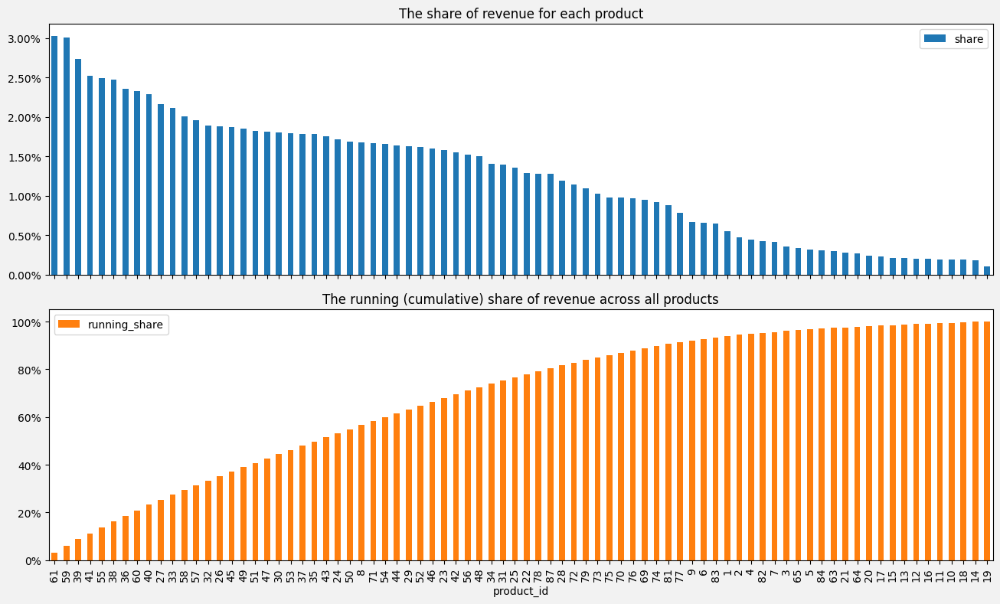

In [ ]:
(share, running) = (abc[['share', 'running_share']]
                    .droplevel(level=1, axis=0)  # The product names are not important here, they will only clutter the plot
                    .plot
                    .bar(subplots=True, figsize=(13,8))
                   )
(fig := share.get_figure()).set_facecolor(PLOT_COLOR)
fig.tight_layout()
#share.set_facecolor(PLOT_COLOR)
#running.set_facecolor(PLOT_COLOR)
share.yaxis.set_major_formatter(PercentFormatter())
share.set_title('The share of revenue for each product')
running.yaxis.set_major_formatter(PercentFormatter())
_ = running.set_title('The running (cumulative) share of revenue across all products')

### Analysis summary.

The following table contains the generalized data of the analysis, as returned by the `analyze_abc` function and described above.

In [ ]:
summary

,percentage,items_per_category,share_of_revenue,percentage_of_items
A,80,42,79.247547,52.5
B,15,18,15.614981,22.5
C,5,20,5.137472,25.0


To vizualize the summary results, let me step off the beaten track and show each category's size and its respective input with 3D bars, instead of the usual Lorenz curve.

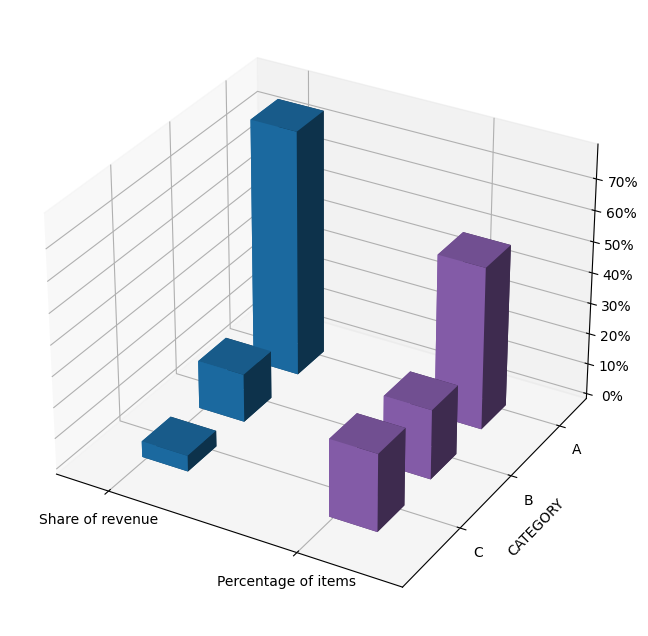

In [ ]:
# Manual bars placing
x = [1] * 3 + [5] * 3
y = [1, 3, 5] * 2
z = [0] * 6
dx = [1]
dy = [1]
dz = pd.concat([summary.share_of_revenue[::-1], summary.percentage_of_items[::-1]], axis=0)

fig, ax = plt.subplots(subplot_kw={"projection": "3d"}, figsize=(10, 8))
ax.bar3d(x, y, z, dx, dy, dz, color=['tab:blue'] * 3 + ['tab:purple'] * 3)

ax.set(xlim=(0, 7), ylim=(0,7), xticklabels=[], yticklabels=[], ylabel = 'CATEGORY')
ax.xaxis.set_major_locator(FixedLocator([1, 5]))
ax.xaxis.set_major_formatter(FixedFormatter(['Share of revenue', 'Percentage of items']))

ax.yaxis.set_major_locator(FixedLocator([2, 4, 6]))
ax.yaxis.set_major_formatter(FixedFormatter(['C', 'B', 'A']))

ax.zaxis.set_major_formatter(PercentFormatter())

The three purple bars on the right represent the proportion of items that end up in each category, while the blue ones on the left show the share of the total revenue all products in each respective category generate.

According to the results, as much as about half of all products, not 20%, as suggested by the Pareto principle, account for slightly less than 80% of the revenue, which is not unusual in business. On the other hand, one should not read too much into the results, since the dataset, as stated in its description, is fictitious.

## Running the analysis on subsets of data.

Using the `analyze_abc` function, it is easy to perform the analysis on any subset of the original dataset.

The code below produces independent results for each outlet, by specifying their id numbers. To save space, I will forgo the detailed information for each product and focus only on the summary data:

In [ ]:
_, summary_3 = analyze_abc(df.query('store_id == 3'), CAT_A, CAT_B)
_, summary_5 = analyze_abc(df.query('store_id == 5'), CAT_A, CAT_B)
_, summary_8 = analyze_abc(df.query('store_id == 8'), CAT_A, CAT_B)

In [ ]:
# The ABC summary results for the Astoria outlet (store_id == 3)
summary_3

,percentage,items_per_category,share_of_revenue,percentage_of_items
A,80,40,79.521784,50.632911
B,15,16,15.092732,20.253165
C,5,23,5.385485,29.113924


In [ ]:
# The ABC summary results for the Lower Manhattan outlet (store_id == 5)
summary_5

,percentage,items_per_category,share_of_revenue,percentage_of_items
A,80,43,79.347841,53.75
B,15,17,15.565269,21.25
C,5,20,5.086890,25.00


In [ ]:
# The ABC summary results for the Hell's Kitchen outlet (store_id == 8)
summary_8

,percentage,items_per_category,share_of_revenue,percentage_of_items
A,80,42,79.727989,52.5
B,15,18,15.038042,22.5
C,5,20,5.233968,25.0


As it can be easily seen, each store's results are not much different from those of the whole dataset, which can be taken as a baseline. Plotting such results will not be necessary.

# Conclusion.

In this notebook, I have shown how to perform a simple ABC analysis on a retail sales dataset.

In the course of the analysis, I have:

* Grouped all products into three categories, reflecting their value to the business in terms of revenue, and provided detailed revenue-based data on each product.

* Presented summary data of the analysis, with useful information on each product category.

* Defined a function that can do the analysis on the whole dataset or on any subset thereof.

I also invite you to look at a companion notebook, in which I perform the same analysis using SQL: https://www.kaggle.com/code/dmitrycloud/sql-based-abc-analysis-coffee-shop-sales

Thank you for reading!

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_excel('/kaggle/input/coffee-sales/Coffee Shop Sales.xlsx')
df.head()

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail
0,1,2023-01-01,07:06:11,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg
1,2,2023-01-01,07:08:56,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg
2,3,2023-01-01,07:14:04,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg
3,4,2023-01-01,07:20:24,1,5,Lower Manhattan,22,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm
4,5,2023-01-01,07:22:41,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149116 entries, 0 to 149115
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   transaction_id    149116 non-null  int64         
 1   transaction_date  149116 non-null  datetime64[ns]
 2   transaction_time  149116 non-null  object        
 3   transaction_qty   149116 non-null  int64         
 4   store_id          149116 non-null  int64         
 5   store_location    149116 non-null  object        
 6   product_id        149116 non-null  int64         
 7   unit_price        149116 non-null  float64       
 8   product_category  149116 non-null  object        
 9   product_type      149116 non-null  object        
 10  product_detail    149116 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(4), object(5)
memory usage: 12.5+ MB


In [ ]:
df.shape

(149116, 11)

In [ ]:
# check missing values

missing_values=df.isna().sum()

In [ ]:
missing_values

transaction_id      0
transaction_date    0
transaction_time    0
transaction_qty     0
store_id            0
store_location      0
product_id          0
unit_price          0
product_category    0
product_type        0
product_detail      0
dtype: int64

In [ ]:
# 1. Convert 'transaction_time' to strings (if necessary)
if not pd.api.types.is_string_dtype(df['transaction_time']):
    df['transaction_time'] = df['transaction_time'].astype(str)

# 2. Convert strings to timedelta objects using pd.to_timedelta
df['transaction_time'] = pd.to_timedelta(df['transaction_time'])

In [ ]:
df['sales'] = df['transaction_qty'] * df['unit_price']

In [ ]:
df['datetime'] = df['transaction_date'] + df['transaction_time']
df.head()

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail,sales,datetime
0,1,2023-01-01,0 days 07:06:11,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg,6.0,2023-01-01 07:06:11
1,2,2023-01-01,0 days 07:08:56,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,6.2,2023-01-01 07:08:56
2,3,2023-01-01,0 days 07:14:04,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg,9.0,2023-01-01 07:14:04
3,4,2023-01-01,0 days 07:20:24,1,5,Lower Manhattan,22,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm,2.0,2023-01-01 07:20:24
4,5,2023-01-01,0 days 07:22:41,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,6.2,2023-01-01 07:22:41


In [ ]:
df.describe()

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,product_id,unit_price,sales,datetime
count,149116.000000,149116,149116,149116.000000,149116.000000,149116.000000,149116.000000,149116.000000,149116
mean,74737.371872,2023-04-15 11:50:32.173609984,0 days 12:14:15.815794415,1.438276,5.342063,47.918607,3.382219,4.686367,2023-04-16 00:04:47.989404160
min,1.000000,2023-01-01 00:00:00,0 days 06:00:00,1.000000,3.000000,1.000000,0.800000,0.800000,2023-01-01 07:06:11
25%,37335.750000,2023-03-06 00:00:00,0 days 09:05:10.500000,1.000000,3.000000,33.000000,2.500000,3.000000,2023-03-06 13:37:08
50%,74727.500000,2023-04-24 00:00:00,0 days 11:15:28,1.000000,5.000000,47.000000,3.000000,3.750000,2023-04-24 08:24:32.500000
75%,112094.250000,2023-05-30 00:00:00,0 days 15:25:57,2.000000,8.000000,60.000000,3.750000,6.000000,2023-05-30 07:16:13
max,149456.000000,2023-06-30 00:00:00,0 days 20:59:32,8.000000,8.000000,87.000000,45.000000,360.000000,2023-06-30 20:57:19
std,43153.600016,NaN,0 days 03:45:57.901686173,0.542509,2.074241,17.930020,2.658723,4.227099,NaN


In [ ]:
df_location = df.groupby('store_location').agg({
    'sales' : 'sum',
    'transaction_id': 'count'
})
df_location

,sales,transaction_id
store_location,,
Astoria,232243.91,50599
Hell's Kitchen,236511.17,50735
Lower Manhattan,230057.25,47782


In [ ]:
daily_sales_by_location = df.groupby(['transaction_date', 'store_location'])['sales'].sum().unstack()
daily_sales_by_location

store_location,Astoria,Hell's Kitchen,Lower Manhattan
transaction_date,,,
2023-01-01,868.40,851.45,788.35
2023-01-02,925.50,828.80,649.05
2023-01-03,902.75,906.25,756.00
2023-01-04,808.25,781.65,630.20
2023-01-05,903.05,714.90,800.90
...,...,...,...
2023-06-26,1975.10,1746.10,2154.70
2023-06-27,1861.55,1676.70,2437.40
2023-06-28,1758.10,1445.85,1524.95


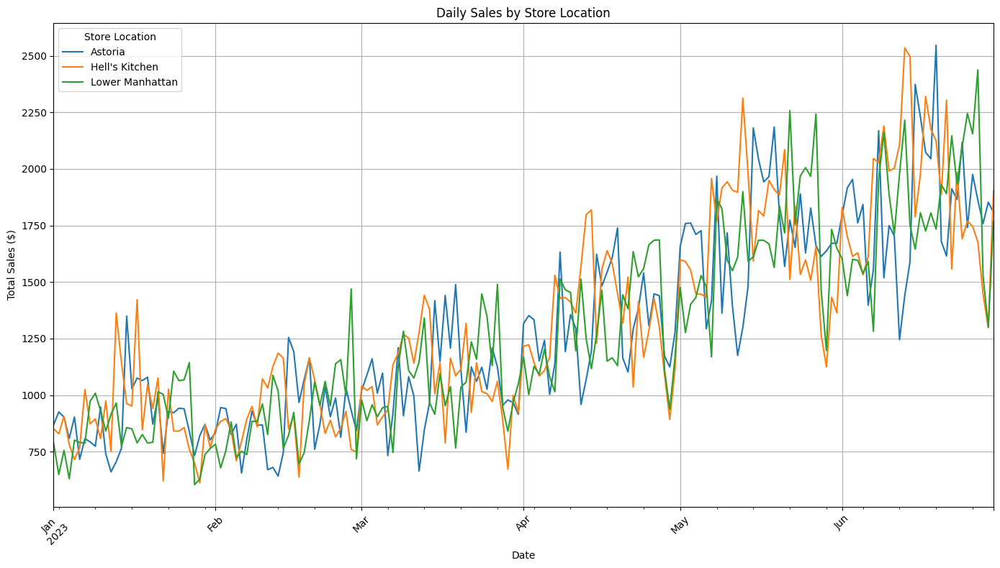

In [ ]:
daily_sales_by_location.plot(figsize=(14,8),title='Daily Sales by Store Location')

plt.xlabel('Date')
plt.ylabel('Total Sales ($)')
plt.legend(title='Store Location')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

#show the plot
plt.show()

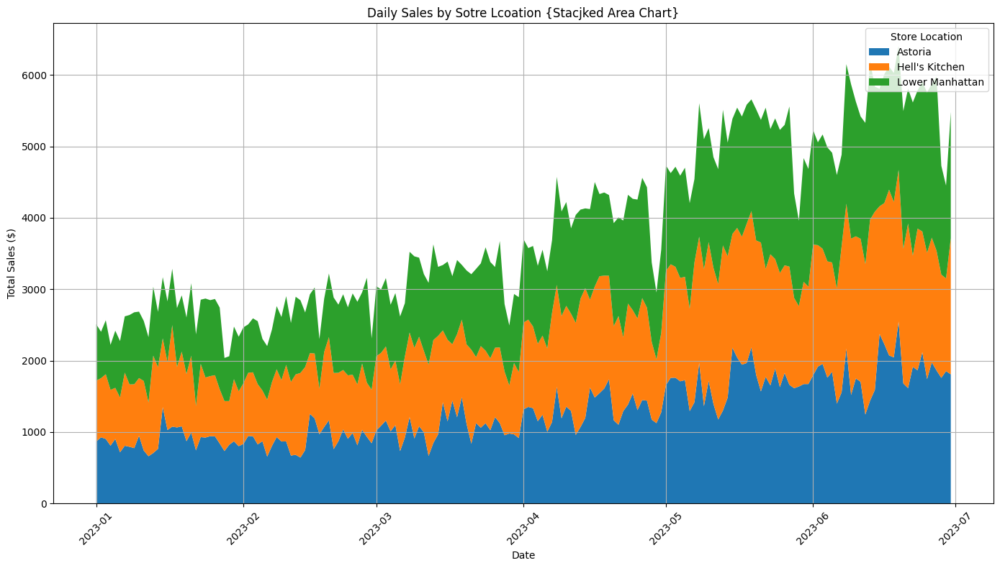

In [ ]:
plt.figure(figsize=(14,8))

plt.stackplot(daily_sales_by_location.index,daily_sales_by_location.T,labels=daily_sales_by_location.columns)
plt.title('Daily Sales by Sotre Lcoation {Stacjked Area Chart}')
plt.xlabel('Date')
plt.ylabel('Total Sales ($)')
plt.legend(title='Store Location')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

#show the plot
plt.show()

In [ ]:
# Daily Sales
daily_sales = df.groupby('transaction_date')['sales'].sum().reset_index()

# Weekly Sales
df['day_of_week'] = df['datetime'].dt.day_name()
weekly_sales = df.groupby('day_of_week')['sales'].sum().reindex(
    ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']).reset_index()

# Monthly Sales
df['month'] = df['datetime'].dt.to_period('M')
monthly_sales = df.groupby('month')['sales'].sum().reset_index()

daily_sales, weekly_sales, monthly_sales


(    transaction_date    sales
 0         2023-01-01  2508.20
 1         2023-01-02  2403.35
 2         2023-01-03  2565.00
 3         2023-01-04  2220.10
 4         2023-01-05  2418.85
 ..               ...      ...
 176       2023-06-26  5875.90
 177       2023-06-27  5975.65
 178       2023-06-28  4728.90
 179       2023-06-29  4450.75
 180       2023-06-30  5481.32
 
 [181 rows x 2 columns],
   day_of_week      sales
 0      Monday  101677.28
 1     Tuesday   99455.94
 2   Wednesday  100313.54
 3    Thursday  100767.78
 4      Friday  101373.00
 5    Saturday   96894.48
 6      Sunday   98330.31,
      month      sales
 0  2023-01   81677.74
 1  2023-02   76145.19
 2  2023-03   98834.68
 3  2023-04  118941.08
 4  2023-05  156727.76
 5  2023-06  166485.88)

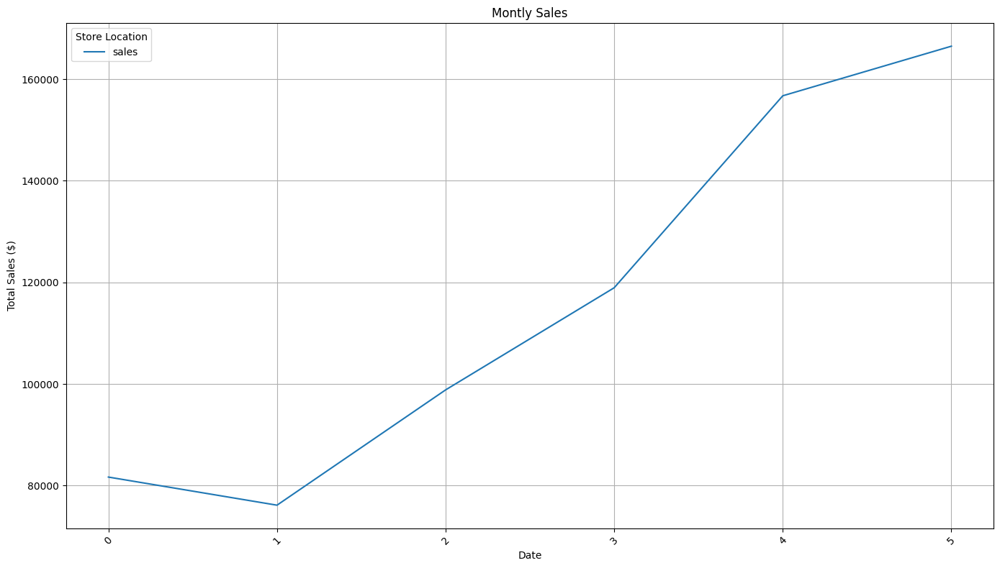

In [ ]:
monthly_sales.plot(figsize=(14,8),title='Montly Sales')

plt.xlabel('Date')
plt.ylabel('Total Sales ($)')
plt.legend(title='Store Location')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

#show the plot
plt.show()

In [ ]:
weekly_sales = df.groupby(['day_of_week','store_location'])['sales'].sum().unstack()

days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekly_sales = weekly_sales.reindex(days_order)

weekly_sales

store_location,Astoria,Hell's Kitchen,Lower Manhattan
day_of_week,,,
Monday,33928.29,33389.51,34359.48
Tuesday,31816.76,34846.47,32792.71
Wednesday,34244.63,33779.09,32289.82
Thursday,34140.37,33468.06,33159.35
Friday,33472.75,34743.18,33157.07
Saturday,31845.93,32599.23,32449.32
Sunday,32795.18,33685.63,31849.50


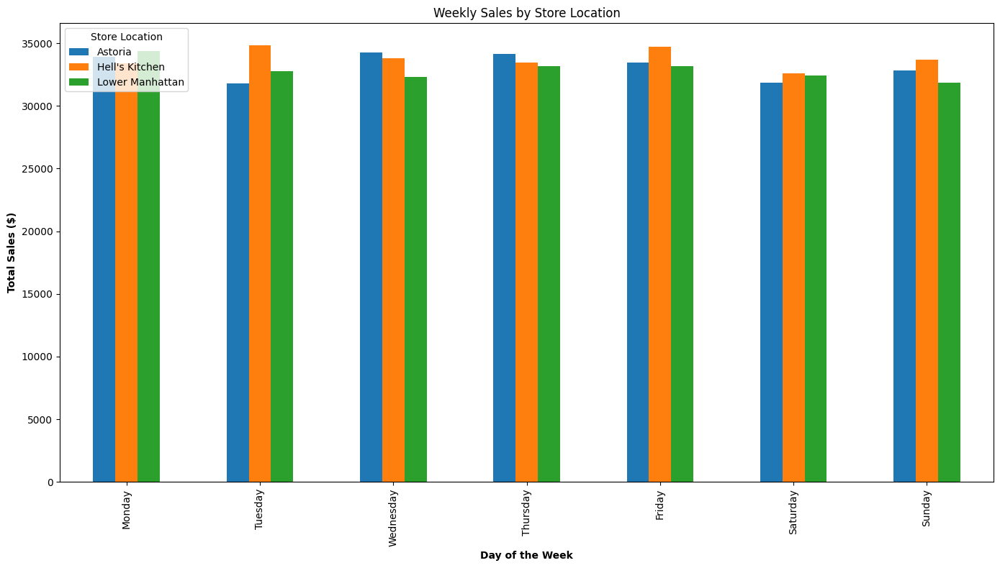

In [ ]:
weekly_sales[["Astoria","Hell's Kitchen","Lower Manhattan"]].plot(kind='bar',figsize=(14,8))

plt.xlabel('Day of the Week', fontweight='bold')
plt.ylabel('Total Sales ($)', fontweight='bold')
plt.title('Weekly Sales by Store Location')
plt.legend(title='Store Location',loc='upper left')


#Show the plot
plt.tight_layout()
plt.show()

In [ ]:
df_category = df.groupby('product_category').agg({
    'sales' : 'sum',
    'transaction_id' : 'count'
}).sort_values('sales', ascending = False)

df_category

,sales,transaction_id
product_category,,
Coffee,269952.45,58416
Tea,196405.95,45449
Bakery,82315.64,22796
Drinking Chocolate,72416.00,11468
Coffee beans,40085.25,1753
Branded,13607.00,747
Loose Tea,11213.60,1210
Flavours,8408.80,6790
Packaged Chocolate,4407.64,487


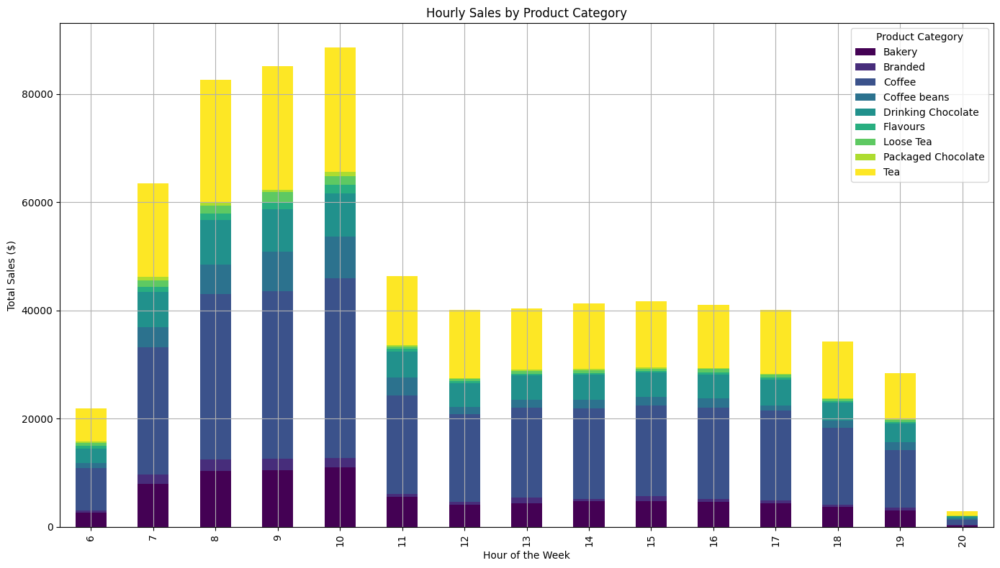

In [ ]:
df['hour'] = df['datetime'].dt.hour

hourly_sales_by_product = df.groupby(['hour','product_category'])['sales'].sum().unstack()
hourly_sales_by_product.plot(kind='bar',stacked=True,figsize=(14,8),colormap='viridis')


plt.title('Hourly Sales by Product Category')
plt.xlabel('Hour of the Week')
plt.ylabel('Total Sales ($)')
plt.legend(title='Product Category',loc='upper right')
plt.grid(True)

#Show the plot
plt.tight_layout()
plt.show()

In [ ]:
df_category['avg_sales'] = df_category['sales']/df_category['transaction_id']
df_category

,sales,transaction_id,avg_sales
product_category,,,
Coffee,269952.45,58416,4.621207
Tea,196405.95,45449,4.321458
Bakery,82315.64,22796,3.610969
Drinking Chocolate,72416.00,11468,6.314615
Coffee beans,40085.25,1753,22.866657
Branded,13607.00,747,18.215529
Loose Tea,11213.60,1210,9.267438
Flavours,8408.80,6790,1.238409
Packaged Chocolate,4407.64,487,9.050595


In [ ]:
sales_by_product = df.groupby('product_type').agg({
    'sales' : 'sum',
    'unit_price' : 'mean'
}).sort_values('sales', ascending = False)

sales_by_product

,sales,unit_price
product_type,,
Barista Espresso,91406.20,3.655200
Brewed Chai tea,77081.95,2.936993
Hot chocolate,72416.00,4.148827
Gourmet brewed coffee,70034.60,2.696641
Brewed Black tea,47932.00,2.744670
Brewed herbal tea,47539.50,2.744731
Premium brewed coffee,38781.15,3.122452
Organic brewed coffee,37746.50,2.898021
Scone,36866.12,3.534638


In [ ]:
product_sales_df = df.groupby(['product_category','product_type'])['sales'].sum().reset_index()
product_sales_df

,product_category,product_type,sales
0,Bakery,Biscotti,19793.53
1,Bakery,Pastry,25655.99
2,Bakery,Scone,36866.12
3,Branded,Clothing,6163.00
4,Branded,Housewares,7444.00
5,Coffee,Barista Espresso,91406.20
6,Coffee,Drip coffee,31984.00
7,Coffee,Gourmet brewed coffee,70034.60
8,Coffee,Organic brewed coffee,37746.50
9,Coffee,Premium brewed coffee,38781.15


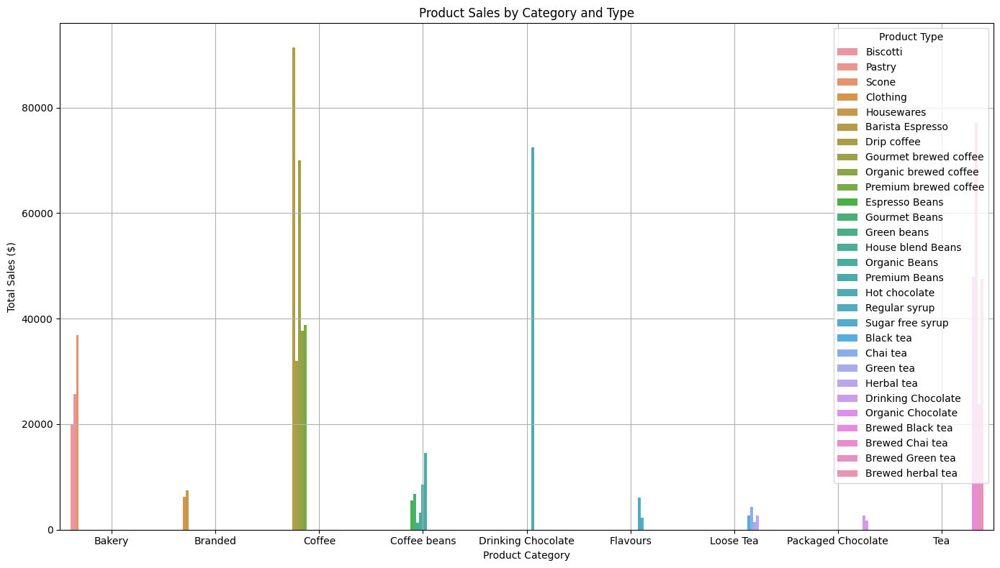

In [ ]:
plt.figure(figsize=(14,8))
sns.barplot(data=product_sales_df,x='product_category',y='sales', hue='product_type')

# Add labels and title
plt.title('Product Sales by Category and Type')
plt.xlabel('Product Category')
plt.ylabel('Total Sales ($)')
plt.legend(title='Product Type',loc='upper right')
plt.grid(True)

#Show the plot
plt.tight_layout()
plt.show()

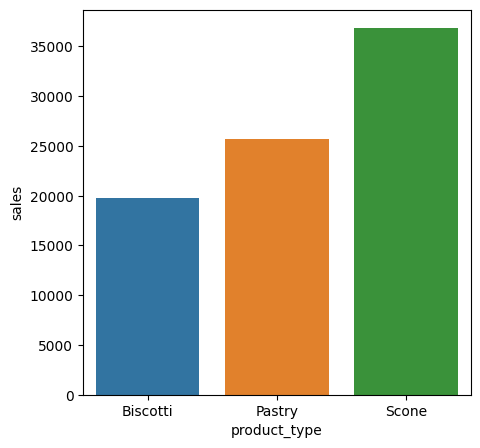

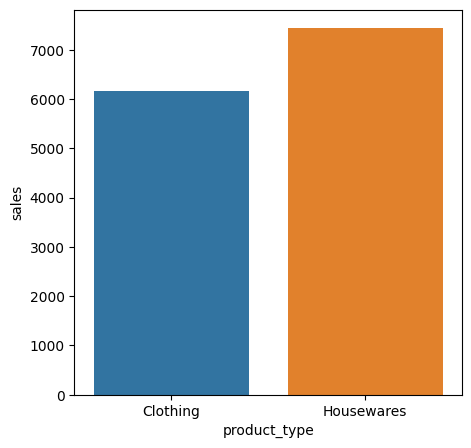

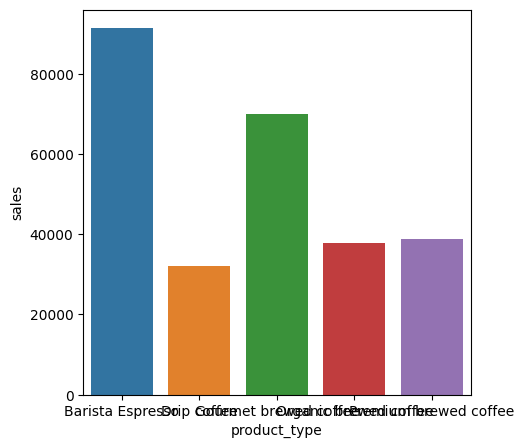

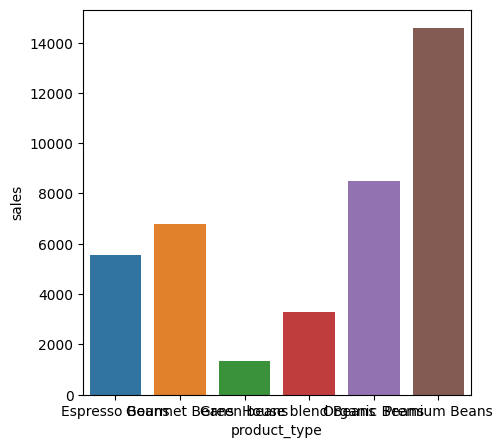

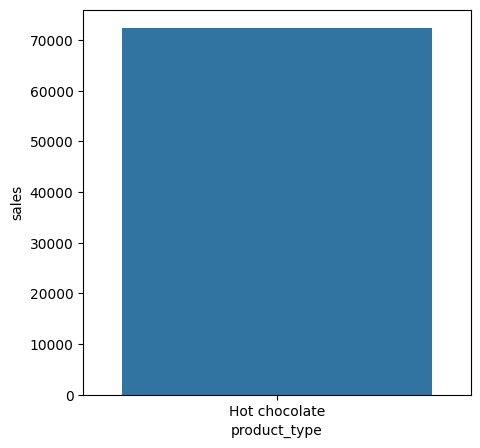

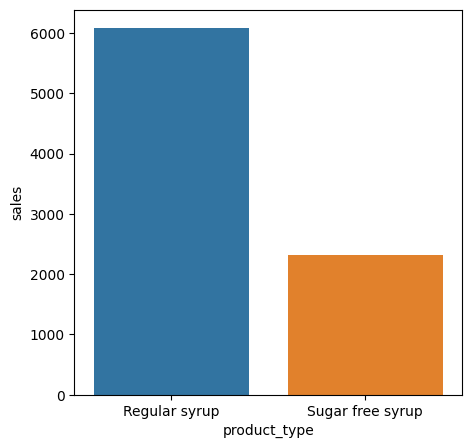

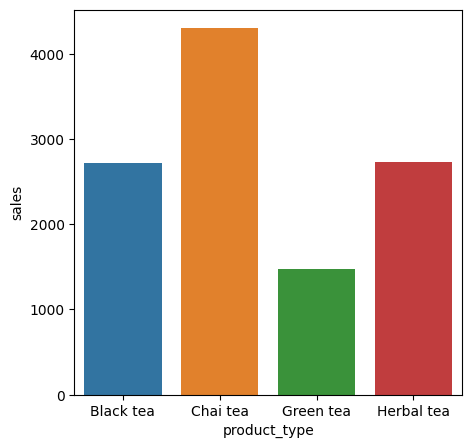

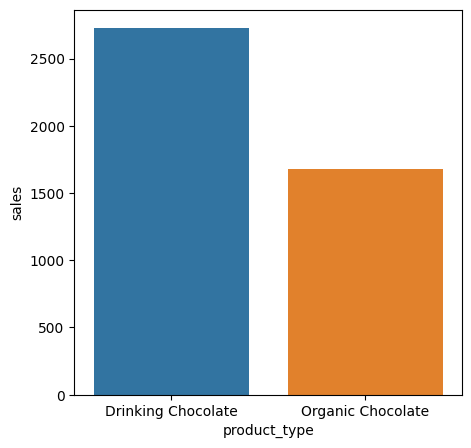

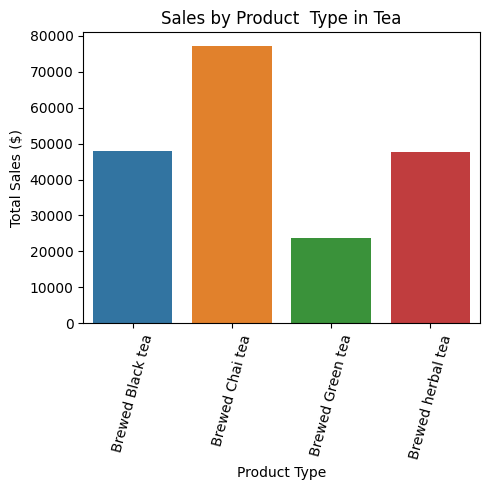

In [ ]:

import warnings

# Ignoriere alle Warnungen
warnings.filterwarnings("ignore")
categories = product_sales_df['product_category'].unique()

for category in categories:
 plt.figure(figsize=(5,5))
 category_data = product_sales_df[product_sales_df['product_category'] == category]
 sns.barplot(data=category_data,x='product_type',y='sales')

# Add labels and title
plt.title(f'Sales by Product  Type in {category}')
plt.xlabel('Product Type')
plt.ylabel('Total Sales ($)')
plt.xticks(rotation=75)

#Show the plot
plt.tight_layout()
plt.show()

In [ ]:
hourly_sales_by_location = df.groupby(['store_location','hour',])['sales'].sum().reset_index()
hourly_sales_by_location

,store_location,hour,sales
0,Astoria,7,19028.80
1,Astoria,8,22805.90
2,Astoria,9,23183.57
3,Astoria,10,24426.12
4,Astoria,11,15498.13
5,Astoria,12,15681.20
6,Astoria,13,15947.87
7,Astoria,14,15175.27
8,Astoria,15,15651.95
9,Astoria,16,16110.85


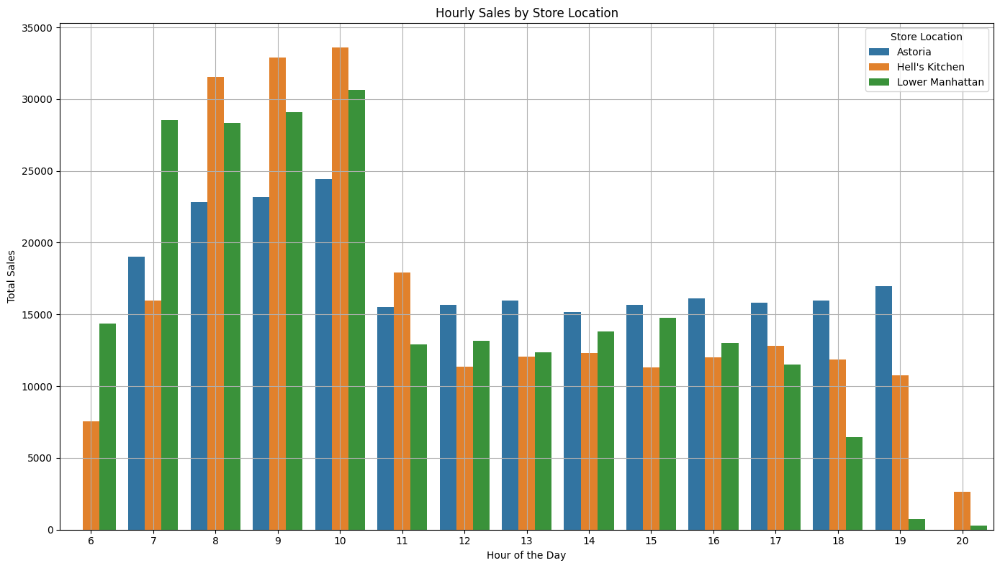

In [ ]:
plt.figure(figsize=(14,8))
sns.barplot(data=hourly_sales_by_location,x='hour',y='sales',hue='store_location')


plt.title('Hourly Sales by Store Location')
plt.xlabel('Hour of the Day')
plt.ylabel('Total Sales')
plt.legend(title='Store Location',loc='upper right')
plt.grid(True)

#Show the plot
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/coffee-sales/Coffee Shop Sales.xlsx


In [ ]:
df = pd.read_excel("/kaggle/input/coffee-sales/Coffee Shop Sales.xlsx")

In [ ]:
df.shape

(149116, 11)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149116 entries, 0 to 149115
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   transaction_id    149116 non-null  int64         
 1   transaction_date  149116 non-null  datetime64[ns]
 2   transaction_time  149116 non-null  object        
 3   transaction_qty   149116 non-null  int64         
 4   store_id          149116 non-null  int64         
 5   store_location    149116 non-null  object        
 6   product_id        149116 non-null  int64         
 7   unit_price        149116 non-null  float64       
 8   product_category  149116 non-null  object        
 9   product_type      149116 non-null  object        
 10  product_detail    149116 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(4), object(5)
memory usage: 12.5+ MB


In [ ]:
df.duplicated().sum()

0

In [ ]:
df.isna().sum()

transaction_id      0
transaction_date    0
transaction_time    0
transaction_qty     0
store_id            0
store_location      0
product_id          0
unit_price          0
product_category    0
product_type        0
product_detail      0
dtype: int64

In [ ]:
df.describe()

,transaction_id,transaction_date,transaction_qty,store_id,product_id,unit_price
count,149116.000000,149116,149116.000000,149116.000000,149116.000000,149116.000000
mean,74737.371872,2023-04-15 11:50:32.173609984,1.438276,5.342063,47.918607,3.382219
min,1.000000,2023-01-01 00:00:00,1.000000,3.000000,1.000000,0.800000
25%,37335.750000,2023-03-06 00:00:00,1.000000,3.000000,33.000000,2.500000
50%,74727.500000,2023-04-24 00:00:00,1.000000,5.000000,47.000000,3.000000
75%,112094.250000,2023-05-30 00:00:00,2.000000,8.000000,60.000000,3.750000
max,149456.000000,2023-06-30 00:00:00,8.000000,8.000000,87.000000,45.000000
std,43153.600016,NaN,0.542509,2.074241,17.930020,2.658723


In [ ]:
df.head()

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail
0,1,2023-01-01,07:06:11,2,5,Lower Manhattan,32,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg
1,2,2023-01-01,07:08:56,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg
2,3,2023-01-01,07:14:04,2,5,Lower Manhattan,59,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg
3,4,2023-01-01,07:20:24,1,5,Lower Manhattan,22,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm
4,5,2023-01-01,07:22:41,2,5,Lower Manhattan,57,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg


In [ ]:
df['transaction_time'] = pd.to_datetime(df['transaction_time'],format='%H:%M:%S').dt.hour

In [ ]:
df.drop(columns=['transaction_id','store_id','product_id'], inplace=True)

> These columns aren't useful in Analysis

In [ ]:
print('numder of unique values:\n')
for i in df.columns:
    print( i ,'>>', df[i].nunique())

numder of unique values:

transaction_date >> 181
transaction_time >> 15
transaction_qty >> 6
store_location >> 3
unit_price >> 41
product_category >> 9
product_type >> 29
product_detail >> 80


In [ ]:
df['weekday'] = df['transaction_date'].dt.day_name()

In [ ]:
df['month'] = df['transaction_date'].dt.month_name()

In [ ]:
df.head()

,transaction_date,transaction_time,transaction_qty,store_location,unit_price,product_category,product_type,product_detail,weekday,month
0,2023-01-01,7,2,Lower Manhattan,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg,Sunday,January
1,2023-01-01,7,2,Lower Manhattan,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,Sunday,January
2,2023-01-01,7,2,Lower Manhattan,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg,Sunday,January
3,2023-01-01,7,1,Lower Manhattan,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm,Sunday,January
4,2023-01-01,7,2,Lower Manhattan,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,Sunday,January


In [ ]:
df.describe()

,transaction_date,transaction_time,transaction_qty,unit_price
count,149116,149116.000000,149116.000000,149116.000000
mean,2023-04-15 11:50:32.173609984,11.735790,1.438276,3.382219
min,2023-01-01 00:00:00,6.000000,1.000000,0.800000
25%,2023-03-06 00:00:00,9.000000,1.000000,2.500000
50%,2023-04-24 00:00:00,11.000000,1.000000,3.000000
75%,2023-05-30 00:00:00,15.000000,2.000000,3.750000
max,2023-06-30 00:00:00,20.000000,8.000000,45.000000
std,NaN,3.764662,0.542509,2.658723


> Data represents 6 months from 2023-01-01 to 2023-06-30

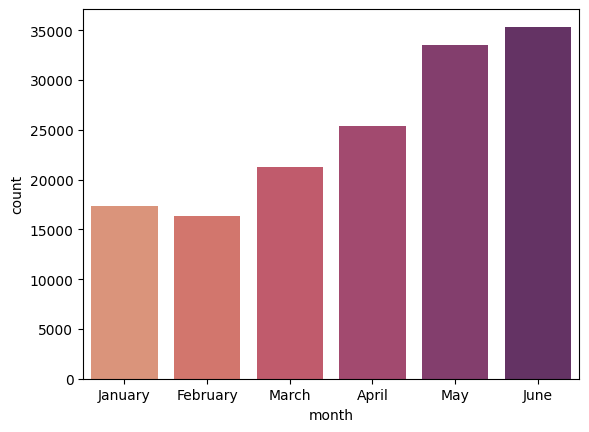

In [ ]:
sns.countplot(data=df, x ='month', palette='flare')
plt.show()

> Most sales were in June and the least were in February

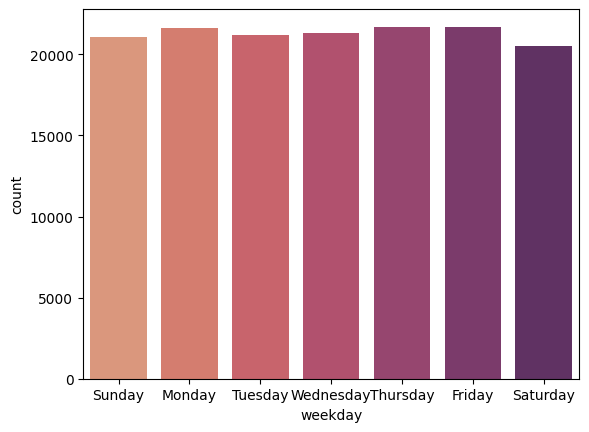

In [ ]:
sns.countplot(data=df,x ='weekday',palette='flare')
plt.show()

> Monday, Thursday and Friday have slightly more sales

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

<Axes: xlabel='transaction_time', ylabel='Density'>

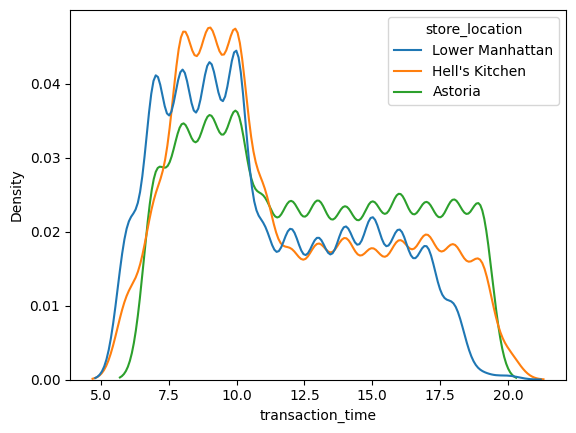

In [ ]:
sns.kdeplot(data=df,x ='transaction_time',hue='store_location')

> Most sales were from 6 am to 10 am

In [ ]:
df['store_location'].value_counts(normalize=True)

store_location
Hell's Kitchen     0.340238
Astoria            0.339326
Lower Manhattan    0.320435
Name: proportion, dtype: float64

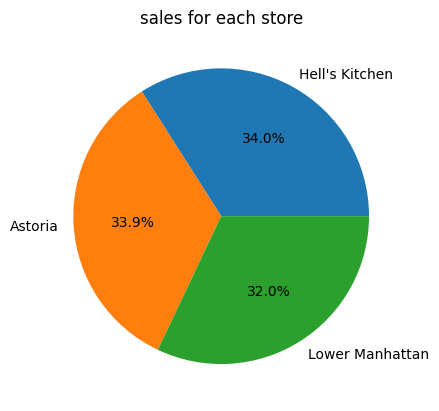

In [ ]:
plt.pie(df['store_location'].value_counts(), labels =['Hell\'s Kitchen', 'Astoria', 'Lower Manhattan'], autopct='%1.1f%%')
plt.title('sales for each store')
plt.show()

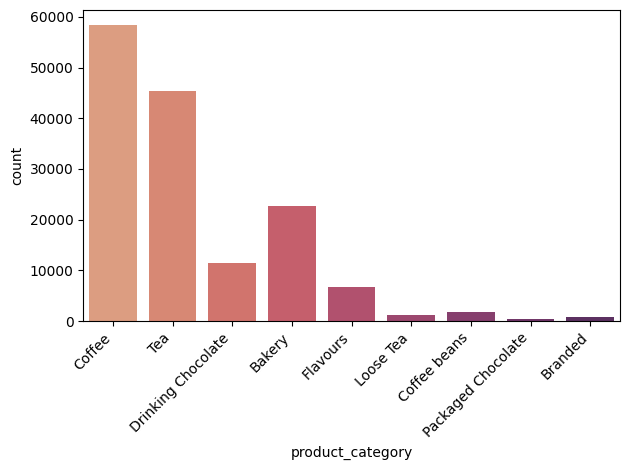

In [ ]:
sns.countplot(data=df, x='product_category',palette='flare')
plt.xticks(rotation=45,ha='right')
plt.tight_layout()

> Most sales are for Coffee and Tea

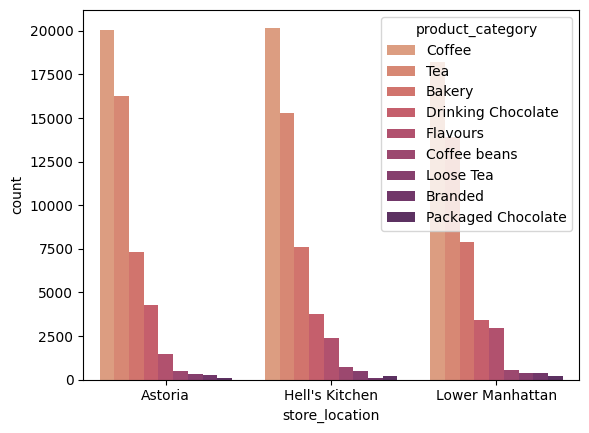

In [ ]:
product_count = df.groupby('store_location')[['product_category']].value_counts().reset_index(name='count')
sns.barplot(data = product_count, x = 'store_location', y = 'count', hue = 'product_category', palette = 'flare')
plt.show()

In [ ]:
df['unit_price'].unique()

array([ 3.  ,  3.1 ,  4.5 ,  2.  ,  4.25,  3.5 ,  2.55,  3.75,  2.5 ,
        4.75,  3.25,  4.  ,  2.2 ,  2.45,  0.8 ,  8.95, 21.  , 28.  ,
        6.4 , 19.75, 12.  , 18.  ,  9.5 , 10.  , 20.45,  9.25, 22.5 ,
       14.75,  7.6 , 14.  , 10.95, 13.33, 15.  ,  4.38,  4.06,  5.63,
        4.69, 45.  , 23.  ,  2.1 ,  2.65])

<Axes: xlabel='unit_price'>

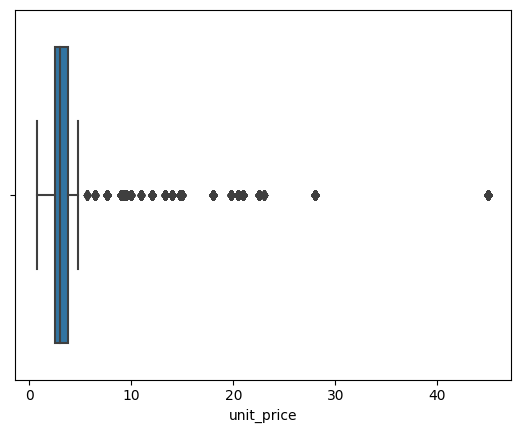

In [ ]:
sns.boxplot(data=df,x='unit_price')

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


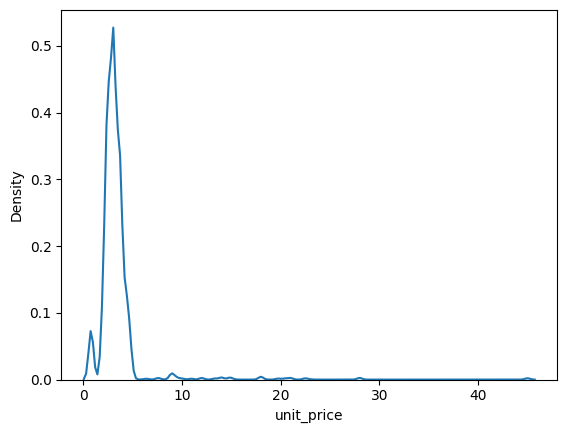

In [ ]:
sns.kdeplot(data=df,x='unit_price')
plt.show()

In [ ]:
q1 = df['unit_price'].quantile(0.25)
q3 = df['unit_price'].quantile(0.75)
iqr = q3-q1
outlier = (df['unit_price'] > 1.5*iqr + q3) | (df['unit_price'] < q1 - 1.5*iqr)

In [ ]:
df[outlier].groupby('product_category')['unit_price'].unique()

product_category
Bakery                                                           [5.63]
Branded                                        [14.0, 28.0, 12.0, 23.0]
Coffee beans          [21.0, 28.0, 19.75, 12.0, 18.0, 10.0, 20.45, 2...
Loose Tea                                      [8.95, 9.5, 9.25, 10.95]
Packaged Chocolate                                    [6.4, 7.6, 13.33]
Name: unit_price, dtype: object

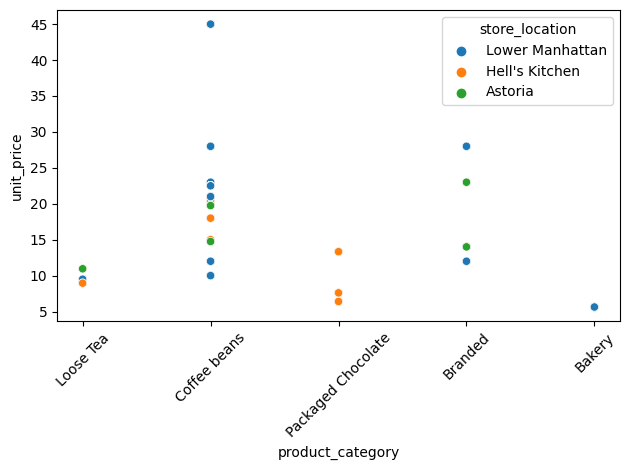

In [ ]:
sns.scatterplot(data=df[outlier],x='product_category',y='unit_price',hue='store_location')
plt.xticks(rotation=45)
plt.tight_layout()

> Coffee beans has the highst price

In [ ]:
df['transaction_qty'].value_counts()

transaction_qty
1    87159
2    58642
3     3279
4       23
8       10
6        3
Name: count, dtype: int64

<Axes: xlabel='transaction_qty', ylabel='count'>

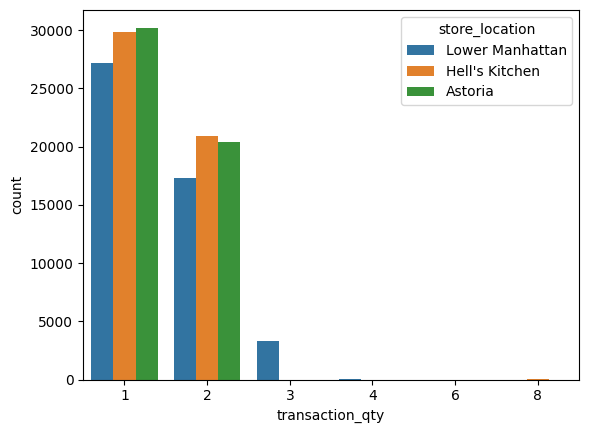

In [ ]:
sns.countplot(data=df, x='transaction_qty', hue='store_location')

In [ ]:
df['total_price'] = df['transaction_qty'] * df['unit_price']

In [ ]:
df.groupby('store_location')['total_price'].sum()

store_location
Astoria            232243.91
Hell's Kitchen     236511.17
Lower Manhattan    230057.25
Name: total_price, dtype: float64

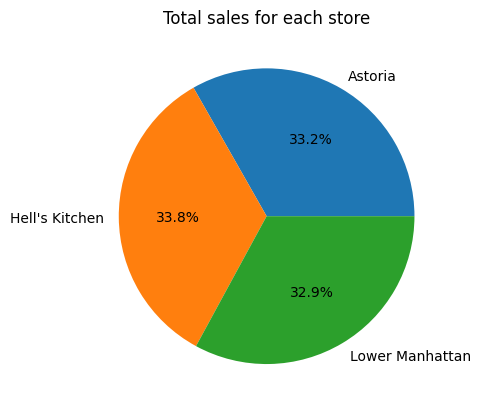

In [ ]:
plt.pie(df.groupby('store_location')['total_price'].sum(), labels =['Astoria', 'Hell\'s Kitchen', 'Lower Manhattan'], autopct='%1.1f%%')
plt.title('Total sales for each store')
plt.show()

> Hell's Kitchen store has slightly more revenue

# Importing necassary Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.offline import iplot
from plotly.subplots import make_subplots

# Reading the dataset

In [ ]:
df = pd.read_excel('/kaggle/input/coffee-sales/Coffee Shop Sales.xlsx')
df

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail
0,1,2023-01-01,07:06:11,2,5,Lower Manhattan,32,3.00,Coffee,Gourmet brewed coffee,Ethiopia Rg
1,2,2023-01-01,07:08:56,2,5,Lower Manhattan,57,3.10,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg
2,3,2023-01-01,07:14:04,2,5,Lower Manhattan,59,4.50,Drinking Chocolate,Hot chocolate,Dark chocolate Lg
3,4,2023-01-01,07:20:24,1,5,Lower Manhattan,22,2.00,Coffee,Drip coffee,Our Old Time Diner Blend Sm
4,5,2023-01-01,07:22:41,2,5,Lower Manhattan,57,3.10,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg
...,...,...,...,...,...,...,...,...,...,...,...
149111,149452,2023-06-30,20:18:41,2,8,Hell's Kitchen,44,2.50,Tea,Brewed herbal tea,Peppermint Rg
149112,149453,2023-06-30,20:25:10,2,8,Hell's Kitchen,49,3.00,Tea,Brewed Black tea,English Breakfast Lg
149113,149454,2023-06-30,20:31:34,1,8,Hell's Kitchen,45,3.00,Tea,Brewed herbal tea,Peppermint Lg
149114,149455,2023-06-30,20:57:19,1,8,Hell's Kitchen,40,3.75,Coffee,Barista Espresso,Cappuccino


# Preprocessing & Cleaning

In [ ]:
df.isna().sum()

transaction_id      0
transaction_date    0
transaction_time    0
transaction_qty     0
store_id            0
store_location      0
product_id          0
unit_price          0
product_category    0
product_type        0
product_detail      0
dtype: int64

In [ ]:
df.isnull().sum()

transaction_id      0
transaction_date    0
transaction_time    0
transaction_qty     0
store_id            0
store_location      0
product_id          0
unit_price          0
product_category    0
product_type        0
product_detail      0
dtype: int64

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149116 entries, 0 to 149115
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   transaction_id    149116 non-null  int64         
 1   transaction_date  149116 non-null  datetime64[ns]
 2   transaction_time  149116 non-null  object        
 3   transaction_qty   149116 non-null  int64         
 4   store_id          149116 non-null  int64         
 5   store_location    149116 non-null  object        
 6   product_id        149116 non-null  int64         
 7   unit_price        149116 non-null  float64       
 8   product_category  149116 non-null  object        
 9   product_type      149116 non-null  object        
 10  product_detail    149116 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(4), object(5)
memory usage: 12.5+ MB


**This data is clean from NaN values, Nulls and duplicates**

In [ ]:
# describing the numerical data
df.describe()

,transaction_id,transaction_date,transaction_qty,store_id,product_id,unit_price
count,149116.000000,149116,149116.000000,149116.000000,149116.000000,149116.000000
mean,74737.371872,2023-04-15 11:50:32.173609984,1.438276,5.342063,47.918607,3.382219
min,1.000000,2023-01-01 00:00:00,1.000000,3.000000,1.000000,0.800000
25%,37335.750000,2023-03-06 00:00:00,1.000000,3.000000,33.000000,2.500000
50%,74727.500000,2023-04-24 00:00:00,1.000000,5.000000,47.000000,3.000000
75%,112094.250000,2023-05-30 00:00:00,2.000000,8.000000,60.000000,3.750000
max,149456.000000,2023-06-30 00:00:00,8.000000,8.000000,87.000000,45.000000
std,43153.600016,NaN,0.542509,2.074241,17.930020,2.658723


In [ ]:
# describing the categorical data
df.describe(include= object)

,transaction_time,store_location,product_category,product_type,product_detail
count,149116,149116,149116,149116,149116
unique,25762,3,9,29,80
top,09:31:15,Hell's Kitchen,Coffee,Brewed Chai tea,Chocolate Croissant
freq,41,50735,58416,17183,3076


In [ ]:
# add new column year
df["year"] = df["transaction_date"].dt.year

# add new column month
df["month"] = df["transaction_date"].dt.month_name()

# add new column day
df["day"] = df["transaction_date"].dt.day_name()

In [ ]:
df

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail,year,month,day
0,1,2023-01-01,07:06:11,2,5,Lower Manhattan,32,3.00,Coffee,Gourmet brewed coffee,Ethiopia Rg,2023,January,Sunday
1,2,2023-01-01,07:08:56,2,5,Lower Manhattan,57,3.10,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,2023,January,Sunday
2,3,2023-01-01,07:14:04,2,5,Lower Manhattan,59,4.50,Drinking Chocolate,Hot chocolate,Dark chocolate Lg,2023,January,Sunday
3,4,2023-01-01,07:20:24,1,5,Lower Manhattan,22,2.00,Coffee,Drip coffee,Our Old Time Diner Blend Sm,2023,January,Sunday
4,5,2023-01-01,07:22:41,2,5,Lower Manhattan,57,3.10,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,2023,January,Sunday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149111,149452,2023-06-30,20:18:41,2,8,Hell's Kitchen,44,2.50,Tea,Brewed herbal tea,Peppermint Rg,2023,June,Friday
149112,149453,2023-06-30,20:25:10,2,8,Hell's Kitchen,49,3.00,Tea,Brewed Black tea,English Breakfast Lg,2023,June,Friday
149113,149454,2023-06-30,20:31:34,1,8,Hell's Kitchen,45,3.00,Tea,Brewed herbal tea,Peppermint Lg,2023,June,Friday
149114,149455,2023-06-30,20:57:19,1,8,Hell's Kitchen,40,3.75,Coffee,Barista Espresso,Cappuccino,2023,June,Friday


In [ ]:
# We can drop some columns we don't use in analysis
df.drop(columns = ["transaction_id", "store_id", "product_id"], inplace = True)

In [ ]:
df

,transaction_date,transaction_time,transaction_qty,store_location,unit_price,product_category,product_type,product_detail,year,month,day
0,2023-01-01,07:06:11,2,Lower Manhattan,3.00,Coffee,Gourmet brewed coffee,Ethiopia Rg,2023,January,Sunday
1,2023-01-01,07:08:56,2,Lower Manhattan,3.10,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,2023,January,Sunday
2,2023-01-01,07:14:04,2,Lower Manhattan,4.50,Drinking Chocolate,Hot chocolate,Dark chocolate Lg,2023,January,Sunday
3,2023-01-01,07:20:24,1,Lower Manhattan,2.00,Coffee,Drip coffee,Our Old Time Diner Blend Sm,2023,January,Sunday
4,2023-01-01,07:22:41,2,Lower Manhattan,3.10,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,2023,January,Sunday
...,...,...,...,...,...,...,...,...,...,...,...
149111,2023-06-30,20:18:41,2,Hell's Kitchen,2.50,Tea,Brewed herbal tea,Peppermint Rg,2023,June,Friday
149112,2023-06-30,20:25:10,2,Hell's Kitchen,3.00,Tea,Brewed Black tea,English Breakfast Lg,2023,June,Friday
149113,2023-06-30,20:31:34,1,Hell's Kitchen,3.00,Tea,Brewed herbal tea,Peppermint Lg,2023,June,Friday
149114,2023-06-30,20:57:19,1,Hell's Kitchen,3.75,Coffee,Barista Espresso,Cappuccino,2023,June,Friday


# Analysis & Visualization

In [ ]:
df['year'].unique()

array([2023], dtype=int32)

In [ ]:
df['month'].unique()

array(['January', 'February', 'March', 'April', 'May', 'June'],
      dtype=object)

In [ ]:
transactions_per_month = df['month'].value_counts()
transactions_per_month

month
June        35352
May         33527
April       25335
March       21229
January     17314
February    16359
Name: count, dtype: int64

In [ ]:
iplot(px.bar(x=transactions_per_month.index, y=transactions_per_month.values,
             labels={'x': 'Month', 'y': 'Number of Transactions'},
             title='Transactions per Month', text_auto= True))

In [ ]:
# # Same plot using seaborn
# plt.figure(figsize=(10, 6))
# sns.barplot(x=transactions_per_month.index, y=transactions_per_month.values, color='skyblue', palette = "RdBu")
# plt.title('Transactions per Month')
# plt.xlabel('Month')
# plt.ylabel('Number of Transactions')
# plt.show()

In [ ]:
df['day'].unique()

array(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday',
       'Saturday'], dtype=object)

In [ ]:
transactions_per_day = df['day'].value_counts()
transactions_per_day

day
Friday       21701
Thursday     21654
Monday       21643
Wednesday    21310
Tuesday      21202
Sunday       21096
Saturday     20510
Name: count, dtype: int64

In [ ]:
iplot(px.bar(x=transactions_per_day.index, y=transactions_per_day.values,
             labels={'x': 'Month', 'y': 'Number of Transactions'},
             title='Transactions per Day', text_auto= True))

In [ ]:
# # Same plot using seaborn
# plt.figure(figsize=(10, 6))
# sns.barplot(x=transactions_per_day.index, y=transactions_per_day.values, color='skyblue', palette = "RdBu")
# plt.title('Transactions per Day')
# plt.xlabel('Month')
# plt.ylabel('Number of Transactions')
# plt.show()

In [ ]:
# add new column hour

df["hour"] = df["transaction_time"].apply(lambda x : x.hour)

In [ ]:
df.head()

,transaction_date,transaction_time,transaction_qty,store_location,unit_price,product_category,product_type,product_detail,year,month,day,hour
0,2023-01-01,07:06:11,2,Lower Manhattan,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg,2023,January,Sunday,7
1,2023-01-01,07:08:56,2,Lower Manhattan,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,2023,January,Sunday,7
2,2023-01-01,07:14:04,2,Lower Manhattan,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg,2023,January,Sunday,7
3,2023-01-01,07:20:24,1,Lower Manhattan,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm,2023,January,Sunday,7
4,2023-01-01,07:22:41,2,Lower Manhattan,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,2023,January,Sunday,7


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



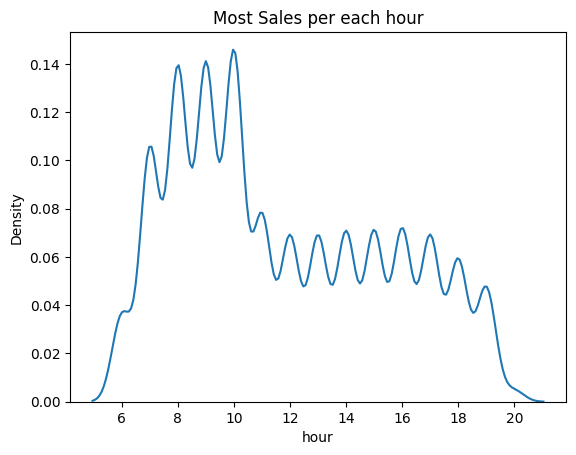

In [ ]:
# see distribution

sns.kdeplot(df["hour"])
plt.title('Most Sales per each hour')
plt.show()

**This means that most of the transactions occurs from 8 am to 11 am**

In [ ]:
df['transaction_qty'].unique()

array([2, 1, 3, 4, 8, 6])

In [ ]:
no_sales_quantity = df['transaction_qty'].value_counts()
no_sales_quantity

transaction_qty
1    87159
2    58642
3     3279
4       23
8       10
6        3
Name: count, dtype: int64

In [ ]:
iplot(px.bar(x=no_sales_quantity.index, y=no_sales_quantity.values,
             labels={'x': 'Quantity', 'y': 'Number of sales'},
             title='Number of sales quantity', text_auto= True))

In [ ]:
df['store_location'].unique()

array(['Lower Manhattan', "Hell's Kitchen", 'Astoria'], dtype=object)

In [ ]:
sales_per_store = df['store_location'].value_counts()
sales_per_store

store_location
Hell's Kitchen     50735
Astoria            50599
Lower Manhattan    47782
Name: count, dtype: int64

In [ ]:
iplot(px.pie(names=sales_per_store.index, values=sales_per_store.values,
             title='Number of sales for each store'))

In [ ]:
df["unit_price"].unique()

array([ 3.  ,  3.1 ,  4.5 ,  2.  ,  4.25,  3.5 ,  2.55,  3.75,  2.5 ,
        4.75,  3.25,  4.  ,  2.2 ,  2.45,  0.8 ,  8.95, 21.  , 28.  ,
        6.4 , 19.75, 12.  , 18.  ,  9.5 , 10.  , 20.45,  9.25, 22.5 ,
       14.75,  7.6 , 14.  , 10.95, 13.33, 15.  ,  4.38,  4.06,  5.63,
        4.69, 45.  , 23.  ,  2.1 ,  2.65])

<Axes: ylabel='unit_price'>

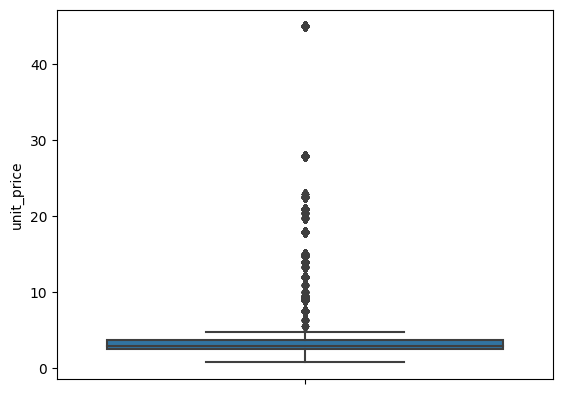

In [ ]:
# see 5 number summary to check outliers

sns.boxplot(y = "unit_price", data = df)

**One might assume the presence of outliers, but such variations are expected in different types of coffee**

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



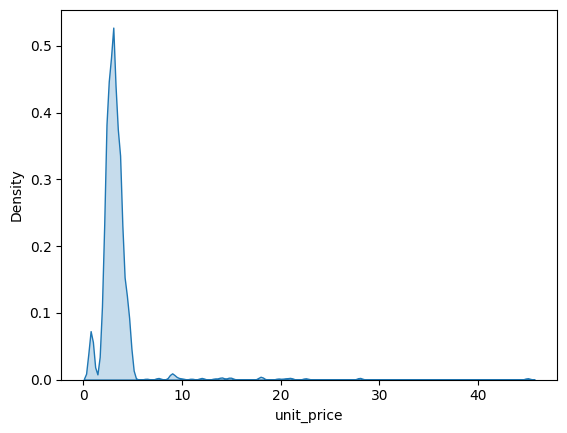

In [ ]:
# see distribution

sns.kdeplot(x = df["unit_price"], fill = True)
plt.show()

**We can see: Price distribution is positively skewed, We understand from this that most Coffee have lower prices,while a few Coffee have higher prices**

In [ ]:
df['product_category'].unique()

array(['Coffee', 'Tea', 'Drinking Chocolate', 'Bakery', 'Flavours',
       'Loose Tea', 'Coffee beans', 'Packaged Chocolate', 'Branded'],
      dtype=object)

In [ ]:
category_count = df['product_category'].value_counts()
category_count

product_category
Coffee                58416
Tea                   45449
Bakery                22796
Drinking Chocolate    11468
Flavours               6790
Coffee beans           1753
Loose Tea              1210
Branded                 747
Packaged Chocolate      487
Name: count, dtype: int64

In [ ]:
iplot(px.bar(x=category_count.index, y=category_count.values,
             labels={'x': 'Product Category', 'y': 'Count'},
             title='Category Count', text_auto= True))

**We can see that Coffee stands as the best selling product. Also, Tea exhibits a high sales rates**

In [ ]:
df["product_type"].unique()

array(['Gourmet brewed coffee', 'Brewed Chai tea', 'Hot chocolate',
       'Drip coffee', 'Scone', 'Barista Espresso', 'Brewed Black tea',
       'Brewed Green tea', 'Brewed herbal tea', 'Biscotti', 'Pastry',
       'Organic brewed coffee', 'Premium brewed coffee', 'Regular syrup',
       'Herbal tea', 'Gourmet Beans', 'Organic Beans', 'Sugar free syrup',
       'Drinking Chocolate', 'Premium Beans', 'Chai tea', 'Green beans',
       'Espresso Beans', 'Green tea', 'Organic Chocolate', 'Housewares',
       'Black tea', 'House blend Beans', 'Clothing'], dtype=object)

In [ ]:
product_type_count = df['product_type'].value_counts()
product_type_count

product_type
Brewed Chai tea          17183
Gourmet brewed coffee    16912
Barista Espresso         16403
Hot chocolate            11468
Brewed Black tea         11350
Brewed herbal tea        11245
Scone                    10173
Organic brewed coffee     8489
Drip coffee               8477
Premium brewed coffee     8135
Pastry                    6912
Biscotti                  5711
Brewed Green tea          5671
Regular syrup             4979
Sugar free syrup          1811
Housewares                 526
Chai tea                   443
Organic Beans              415
Gourmet Beans              366
Premium Beans              336
Espresso Beans             319
Herbal tea                 305
Black tea                  303
Drinking Chocolate         266
Organic Chocolate          221
Clothing                   221
House blend Beans          183
Green tea                  159
Green beans                134
Name: count, dtype: int64

/opt/conda/lib/python3.10/site-packages/seaborn/categorical.py:645: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



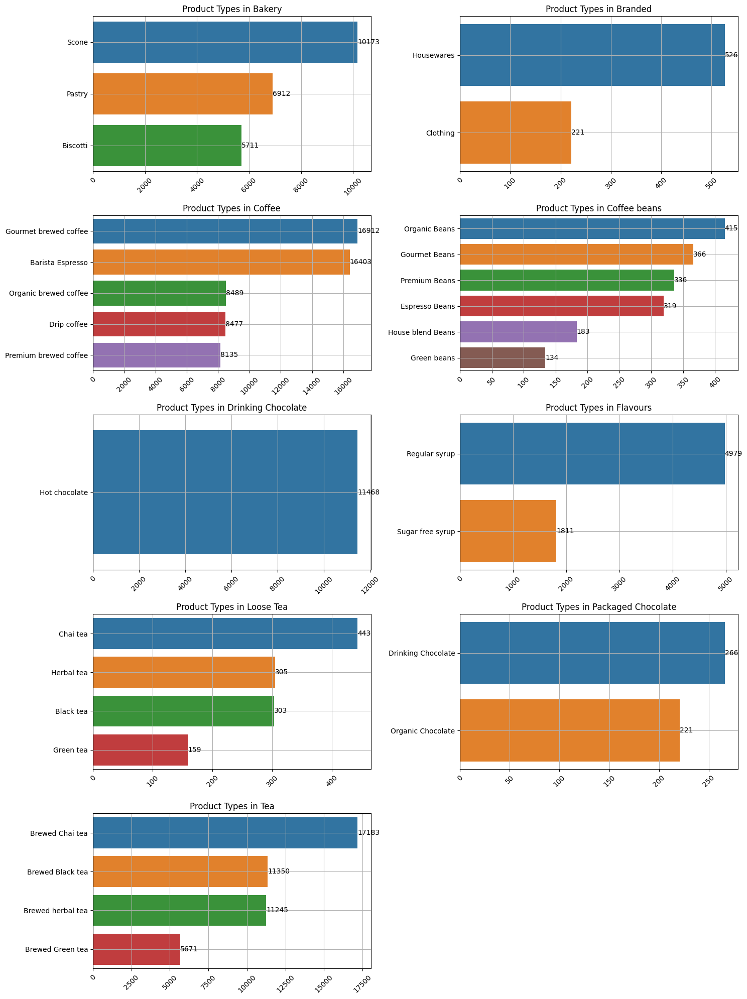

In [ ]:
# Assuming 'counts' is the DataFrame obtained from your groupby operation
counts = df.groupby(["product_category", "product_type"]).size().reset_index(name = "count")

# Get unique categories
categories = counts['product_category'].unique()

# Create subplots for each category in a 4x2 grid
fig, axes = plt.subplots(5, 2, figsize = (15, 20))

# Flatten the axes for easier iteration
axes = axes.flatten()

for i, category in enumerate(categories):
    # Filter data for each category
    subset = counts[counts['product_category'] == category]

    # Sort the data by 'count' column in descending order
    subset = subset.sort_values('count', ascending = False)

    # Create a bar plot for each category with sorted order
    sns.barplot(x = 'count', y = 'product_type', data = subset, ax = axes[i], order = subset['product_type'])
    axes[i].set_title(f'Product Types in {category}')
    axes[i].set_ylabel('')
    axes[i].set_xlabel('')
    axes[i].tick_params(axis = 'x', rotation = 45)
    axes[i].grid(True)

    # Adding bar labels
    for idx, bar in enumerate(axes[i].patches):
        axes[i].text(bar.get_width(), bar.get_y() + bar.get_height() / 2, subset.iloc[idx]['count'], ha = 'left', va = 'center')

# Hide extra subplots if there are fewer categories than subplots
for j in range(len(categories), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

# Conclusion from Columns analysis

* **Year**, Sales exclusively from 2023.
* **Month**, Most sales within a six-month period
* **Hour**, Most sales were from 8 am to 11 pm
* **Transaction quantity**, Most sales were singles followed by 2 lots
* **Stores**, The sales rates of the three stores were similar, with the most significant difference observed at the Hell's Kitchen store
* **Unit price**, Price distribution is positively skewed, We understand from this that most Coffee have lower prices,while a few Coffee have higher prices
* **Category** :
  - it's evident that the three stores offer a wide range of services.
  - Coffee stands as the best-selling product.
  - Tea also exhibits a high sales rate.
* **product type** :
  - In the Bakery category, the most sold item is the scone
  - In the Branded category, the best-selling item is Housewares
  - In the Coffee category, the best-selling item is Gourmet brewed coffee
  - In the Coffee beans category, the best-selling item is Organic Beans
  - The Drinking Chocolate category solely offers hot chocolate
  - Regular syrup are the top-selling items in the Flavours category
  - In the Loose Tea category, the best-selling item is Chai tea
  - In the Packaged Chocolate category, the best-selling item is Drinking Chocolate
  - In the Tea category, the best-selling item is Brewed Chai tea

In [ ]:
# add new column revenue
df["Total revenue"] = df["transaction_qty"] * df["unit_price"]

In [ ]:
df.head()

,transaction_date,transaction_time,transaction_qty,store_location,unit_price,product_category,product_type,product_detail,year,month,day,hour,Total revenue
0,2023-01-01,07:06:11,2,Lower Manhattan,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg,2023,January,Sunday,7,6.0
1,2023-01-01,07:08:56,2,Lower Manhattan,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,2023,January,Sunday,7,6.2
2,2023-01-01,07:14:04,2,Lower Manhattan,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg,2023,January,Sunday,7,9.0
3,2023-01-01,07:20:24,1,Lower Manhattan,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm,2023,January,Sunday,7,2.0
4,2023-01-01,07:22:41,2,Lower Manhattan,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,2023,January,Sunday,7,6.2


In [ ]:
# stores Vs transaction quantities

# Calculate sum of transaction quantities for each store_location
sum_transaction_qty = df.groupby("store_location")["transaction_qty"].sum().reset_index()

# Create a Plotly line plot
iplot(px.line(sum_transaction_qty, x="store_location", y="transaction_qty",
              title="Total Transaction Quantities per Store Location",
              labels={"store_location": "Store Location", "transaction_qty": "Total Transaction Quantity"}))

**We can notice: The sales ratios for quantities seem to be quite similar across all stores**

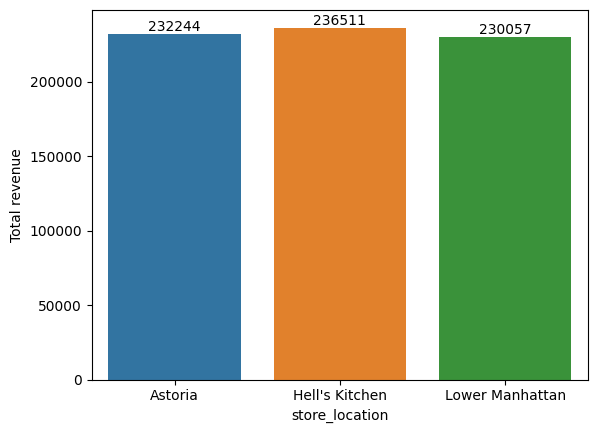

In [ ]:
# Stores Vs Total revenue

# Calculate total revenue for each store_location
revenue = df.groupby("store_location")["Total revenue"].sum().reset_index()

# create bar plot
ax = sns.barplot(x = "store_location", y = "Total revenue", data = revenue)

# Adding labels to each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center',
                xytext = (0, 5), textcoords = 'offset points')

plt.show()

**Notes**:
* The total revenue generated from sales at each store location amounted to  232,243.91 for Astoria,
 236,511.17 for Hell's Kitchen, and $230,057.25 for Lower Manhattan.
* "Hell's Kitchen" appears to be the best store in terms of revenue.

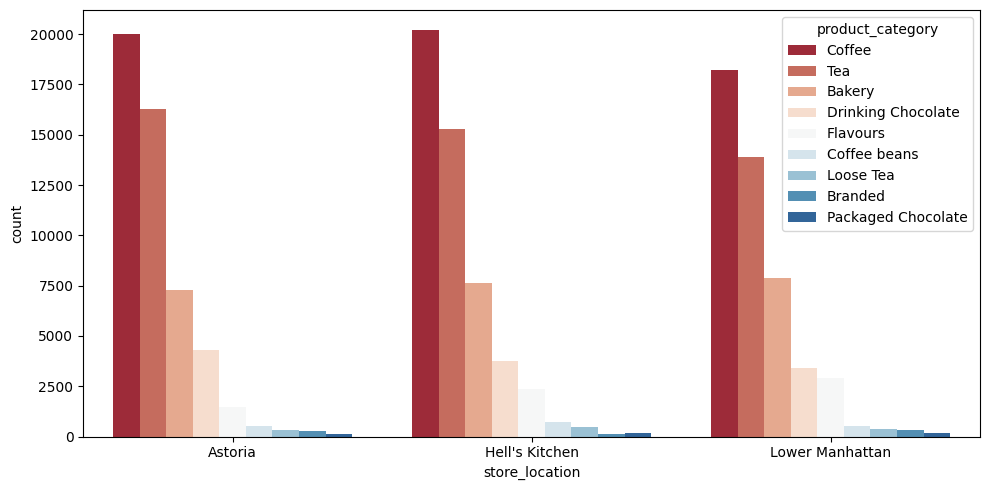

In [ ]:
# Stores VS product categories

# Calculate number of product categories at each store location
popular_products = df.groupby('store_location')[['product_category']].value_counts().reset_index(name='count')

# set figure size
plt.figure(figsize=(10, 5))

# Create a bar plot
sns.barplot(x = 'store_location', y = 'count', hue = 'product_category', data = popular_products, palette = "RdBu")

plt.tight_layout()
plt.show()

**Astoria Store** :
  - The highest selling product category is Coffee with a count of 20,025 units
  - Following Coffee, Tea stands as the second most popular category with a count of 16,260 units
  - Other categories like Bakery, Drinking Chocolate, Flavours, Coffee beans, Loose Tea, Branded, and Packaged Chocolate have varying counts, ranging from 7289 to 110 units, in descending order


**Hell's Kitchen Store** :

  - Similar to Astoria, Coffee leads in sales, amounting to 20,187 units
  - Tea follows closely as the second most popular category with 15,277 units
  - Other categories, such as Bakery, Drinking Chocolate, Flavours, Coffee beans, Loose Tea, Packaged Chocolate, Branded, and Packaged Chocolate, have counts ranging from 7617 to 119 units


**Lower Manhattan Store** :

  - Coffee is again the top-selling category with 18,204 units
  - Tea follows with 13,912 units
  - Bakery, Drinking Chocolate, Flavours, Coffee beans, Loose Tea, Branded, Packaged Chocolate have counts ranging from 7890 to 180 units, in descending order

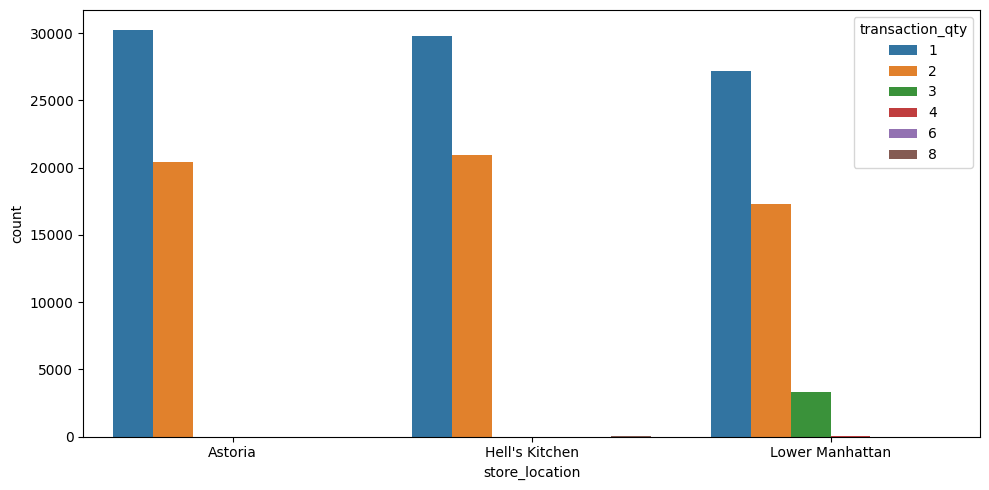

In [ ]:
# Stores VS Most transaction_qty

# grouped 'store_location' and 'transaction_qty' as columns
grouped_data = df.groupby("store_location")["transaction_qty"].value_counts().reset_index(name = "count")

# set figure size
plt.figure(figsize=(10, 5))

# Create bar plot
sns.barplot(x = "store_location", y = "count", hue = "transaction_qty", data = grouped_data)

plt.tight_layout()
plt.show()

**Astoria Store** :
  - The most frequent transaction quantity observed is 1, with a count of 30,207 instances
  - The second most frequent transaction quantity is 2, noted 20,392 times


**Hell's Kitchen Store**:
  - The most frequent transaction quantity observed is 1, noted 29,793 times
  - The second most frequent transaction quantity is 2, observed 20,932 times
  - Additionally, there are 8 transactions with a quantity of 8


**Lower Manhattan Store**:
  - The most frequent transaction quantity observed is 1, recorded 27,159 times.
  - The second most frequent transaction quantity is 2, seen 17,318 times.
  - There are occurrences of transaction quantities 3, 4, and 6, but they are less frequent compared to quantities 1 and 2

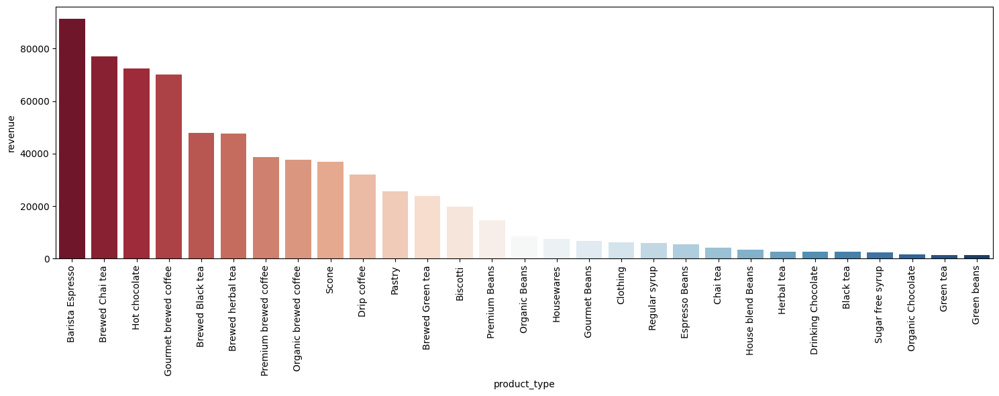

In [ ]:
# grouped product_type' and 'Total revenue'
category_revenue = df.groupby("product_type")["Total revenue"].sum().reset_index(name = "revenue")

# sort category by revenue
category_revenue = category_revenue.sort_values(by = 'revenue', ascending = False)

# set figure size
plt.figure(figsize = (15,6))

# create bar plot
sns.barplot(x = "product_type", y = "revenue", data = category_revenue, palette = "RdBu")

# set x-axis rotation
plt.xticks(rotation = 90)

plt.tight_layout()
plt.show()

**Top Revenue Product Types** :
  - Barista Espresso with a revenue of 91,406.20
  - Brewed Chai tea with a revenue of 77,081.95
  - Hot chocolate with a revenue of 72,416.00
  - Gourmet brewed coffee with a revenue of 70,034.60
  - Brewed Black tea with a revenue of 47,932.00


**Lowest Revenue Product Types** :
  - Organic Chocolate with a revenue of 1,679.60
  - Green tea with a revenue of 1,470.75
  - Green beans with a revenue of 1,340.00


**Other Observations** :
  - Various products contribute to revenue across different ranges, with a mix of beverages (like teas, coffees) and snacks (biscotti, pastries).
  - Coffee-related products, such as various brews and espresso variants, hold prominent positions in revenue generation.
  - The lowest revenue-generating products are predominantly related to tea and specific beverage variants.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



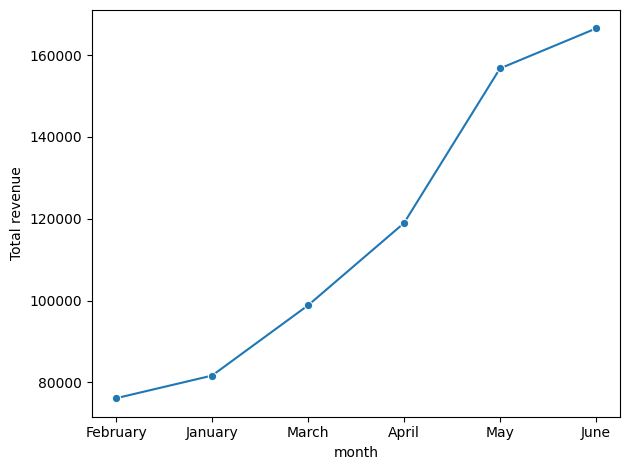

In [ ]:
# Month VS revenue

# Grouping by month and summing the revenue
monthly_revenue  = df.groupby("month")["Total revenue"].sum().reset_index().sort_values(by = "Total revenue")

# create line plot
sns.lineplot(x = "month", y = "Total revenue", data = monthly_revenue , marker = "o")

plt.tight_layout()
plt.show()

**We can see** :
  - June had the highest total revenue, reaching 166,485.88, making it the most profitable month.
  - May followed closely behind with a total revenue of 156,727.76, indicating strong performance.
  - April and March also performed well, generating revenues of 118,941.08 and 98,834.68, respectively.
  - January and February had comparatively lower revenue figures at 81,677.74 and 76,145.19, respectively.

## Univariate Analysis & Visualizations 📊📉

In [ ]:
# create function to visualized categorical column using count plot

def count_plot(x_axis = None, y_axis = None, hue = None, rotation = 0, top = None):
    """
    1) input : x_axis, column name, data type must be object or categorical
    3) output : cout plot using seaborn modules, unique values in x-axis and frequency in y-axis
    4) use bar_label to show frequency of each unique values above each column in graph
    5) top parameter i use it to specify indexes i want to see it
    """
    if x_axis: # if we neet to visualized in x-axis
        order = data[x_axis].value_counts().iloc[:top].index

    else : # if we neet to visualized in y-axis
        order = data[y_axis].value_counts().iloc[:top].index

    graph = sns.countplot(x = x_axis, y = y_axis, data = data, hue = hue, order = order, palette = "RdBu")
    for container in graph.containers:
        graph.bar_label(container)


    plt.xticks(rotation = rotation)
    plt.show()

In [ ]:
# create function that visualized categorical column using pie plot

def pie_plot(column_name, explodeIndex = None):
    """
    1) input : column name, column data type must be object or categorical
    2) explodeIndex, is the index i need to explode it
    2) output : circle chart that shows size of each unique values and percentage
    """
    # Create explode list with zeros of size equal to the number of unique values
    explodeList = [0] * data[column_name].nunique()

    # Check and set explodeIndex value
    if explodeIndex is not None:
        explodeList[explodeIndex] = 0.1

    # Create pie plot
    plt.pie(data[column_name].value_counts(), labels = data[column_name].value_counts().index, shadow = True, autopct = "%1.1f%%",  explode = explodeList)
    plt.show()

### Discovering `transaction_date` column

In [ ]:
# see unique value

data["transaction_date"].unique()[:25]

<DatetimeArray>
['2023-01-01 00:00:00', '2023-01-02 00:00:00', '2023-01-03 00:00:00',
 '2023-01-04 00:00:00', '2023-01-05 00:00:00', '2023-01-06 00:00:00',
 '2023-01-07 00:00:00', '2023-01-08 00:00:00', '2023-01-09 00:00:00',
 '2023-01-10 00:00:00', '2023-01-11 00:00:00', '2023-01-12 00:00:00',
 '2023-01-13 00:00:00', '2023-01-14 00:00:00', '2023-01-15 00:00:00',
 '2023-01-16 00:00:00', '2023-01-17 00:00:00', '2023-01-18 00:00:00',
 '2023-01-19 00:00:00', '2023-01-20 00:00:00', '2023-01-21 00:00:00',
 '2023-01-22 00:00:00', '2023-01-23 00:00:00', '2023-01-24 00:00:00',
 '2023-01-25 00:00:00']
Length: 25, dtype: datetime64[ns]

**🧩📝 Extract some information such as `year , month and day`**

In [ ]:
# add new column year
data["year"] = data["transaction_date"].dt.year

# add new column month
data["month"] = data["transaction_date"].dt.month_name()

# add new column day
data["day"] = data["transaction_date"].dt.day_name()

**Discovering this columns 📉🎛️**

In [ ]:
# see unique values of year column

data["year"].unique()

array([2023], dtype=int32)

**📝Sales exclusively from 2023.**

In [ ]:
# see unique values of month column

data["month"].unique()

array(['January', 'February', 'March', 'April', 'May', 'June'],
      dtype=object)

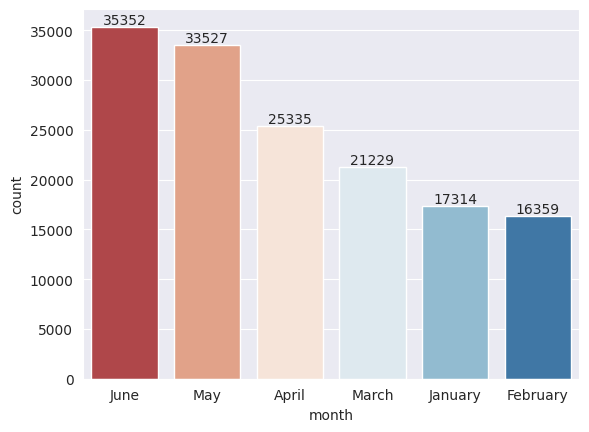

In [ ]:
# see number of transaction in each month

count_plot(x_axis = "month") # call function i create it in cell 12

**📝 Most sales within a six-month period**

In [ ]:
data["day"].unique()

array(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday',
       'Saturday'], dtype=object)

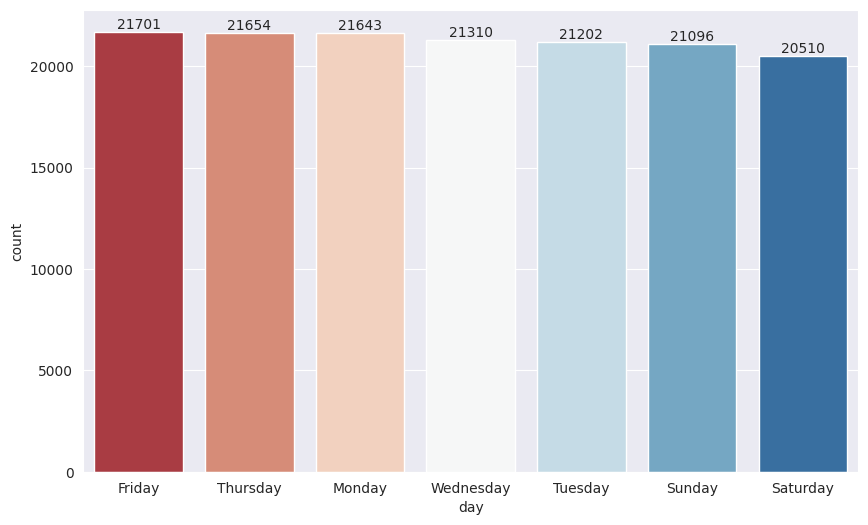

In [ ]:
# see top 5 day of transaction

# set figure size
plt.figure(figsize = (10,6))

# call function i create it in cell 12
count_plot(x_axis = "day")

In [ ]:
# now i will drop  "transaction_date" column

data.drop(columns = "transaction_date", inplace = True)

### Discovering `transaction_time` column

In [ ]:
# see unique values

data["transaction_time"].unique()[:50]

array([datetime.time(7, 6, 11), datetime.time(7, 8, 56),
       datetime.time(7, 14, 4), datetime.time(7, 20, 24),
       datetime.time(7, 22, 41), datetime.time(7, 25, 49),
       datetime.time(7, 33, 34), datetime.time(7, 39, 13),
       datetime.time(7, 39, 34), datetime.time(7, 43, 5),
       datetime.time(7, 44, 35), datetime.time(7, 45, 51),
       datetime.time(7, 48, 19), datetime.time(7, 52, 36),
       datetime.time(7, 59, 58), datetime.time(8, 0, 18),
       datetime.time(8, 0, 39), datetime.time(8, 11, 45),
       datetime.time(8, 17, 27), datetime.time(8, 24, 26),
       datetime.time(8, 29, 38), datetime.time(8, 31, 23),
       datetime.time(8, 33, 8), datetime.time(8, 35, 3),
       datetime.time(8, 41, 57), datetime.time(8, 52, 3),
       datetime.time(8, 52, 32), datetime.time(8, 54, 33),
       datetime.time(8, 56, 27), datetime.time(8, 57, 46),
       datetime.time(8, 58, 55), datetime.time(9, 0, 12),
       datetime.time(9, 0, 24), datetime.time(9, 7, 13),
       da

**🧩📝 Extract some information such as `hour`**

In [ ]:
# add new column hour

data["hour"] = data["transaction_time"].apply(lambda x : x.hour)

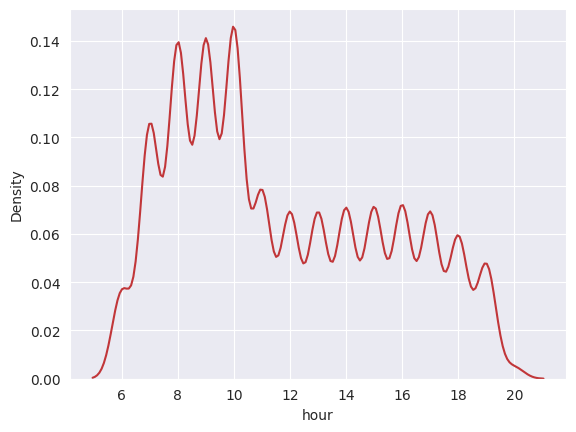

In [ ]:
# see distribution

sns.kdeplot(data["hour"])
plt.show()

**📝 Most sales were from 8 am to 11 pm**

In [ ]:
# now i will drop  "transaction_date" column

data.drop(columns = "transaction_time", inplace = True)

### Discovering `transaction_qty` column

In [ ]:
# see unique values

data["transaction_qty"].unique()

array([2, 1, 3, 4, 8, 6])

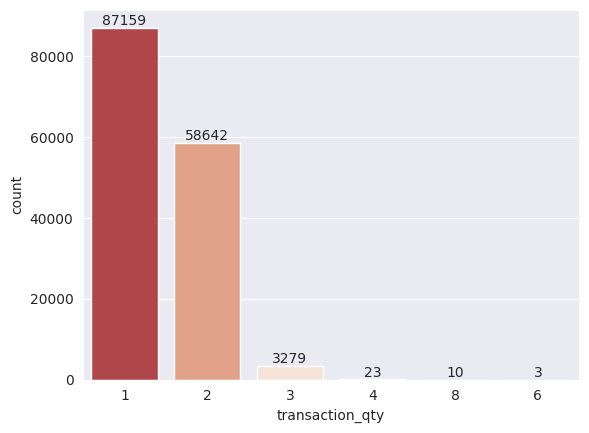

In [ ]:
# see number of sales quantity

count_plot(x_axis = "transaction_qty") # call function i create it in cell 12

**📝Most sales were singles followed by 2 lots**

### Discovering `store_location` column

In [ ]:
# see unique values

data["store_location"].unique()

array(['Lower Manhattan', "Hell's Kitchen", 'Astoria'], dtype=object)

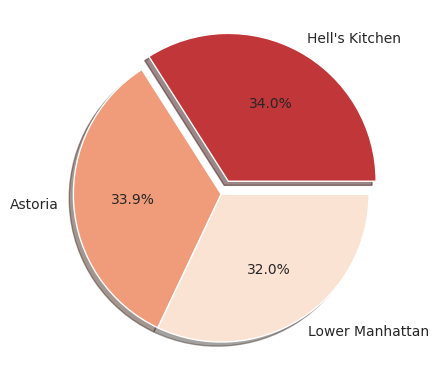

In [ ]:
# see number of sales in each store

pie_plot(column_name = "store_location", explodeIndex = 0)

**📝 The sales rates of the three stores were similar, with the most significant difference observed at the Hell's Kitchen store**

### Discovering `unit_price` column

In [ ]:
# see unique values

data["unit_price"].unique()

array([ 3.  ,  3.1 ,  4.5 ,  2.  ,  4.25,  3.5 ,  2.55,  3.75,  2.5 ,
        4.75,  3.25,  4.  ,  2.2 ,  2.45,  0.8 ,  8.95, 21.  , 28.  ,
        6.4 , 19.75, 12.  , 18.  ,  9.5 , 10.  , 20.45,  9.25, 22.5 ,
       14.75,  7.6 , 14.  , 10.95, 13.33, 15.  ,  4.38,  4.06,  5.63,
        4.69, 45.  , 23.  ,  2.1 ,  2.65])

<Axes: ylabel='unit_price'>

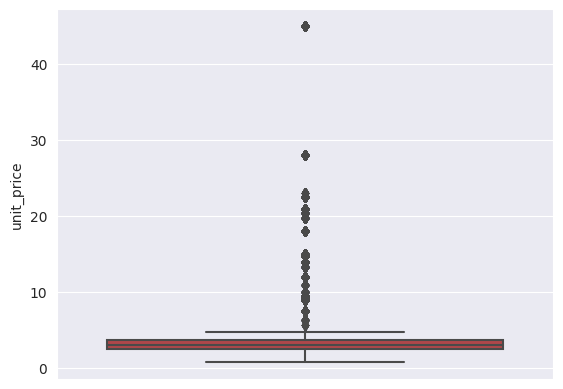

In [ ]:
# see 5 number summary to check outliers

sns.boxplot(y = "unit_price", data = data)

**🧩 One might assume the presence of `outliers`, but such variations are expected in different types of coffee**

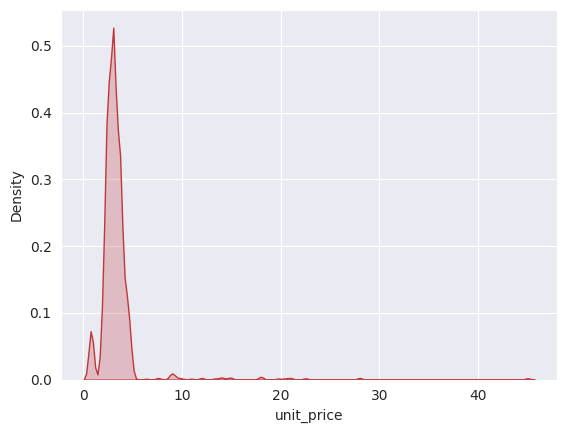

In [ ]:
# see distribution

sns.kdeplot(x = data["unit_price"], fill = True)
plt.show()

**🛑📊 We can see :**
   - Price distribution is `positively skewed`, We understand from this that most Coffee have lower prices,while a few Coffee have higher prices

### Discovering `product_category` column

In [ ]:
# see unique values

data["product_category"].unique()

array(['Coffee', 'Tea', 'Drinking Chocolate', 'Bakery', 'Flavours',
       'Loose Tea', 'Coffee beans', 'Packaged Chocolate', 'Branded'],
      dtype=object)

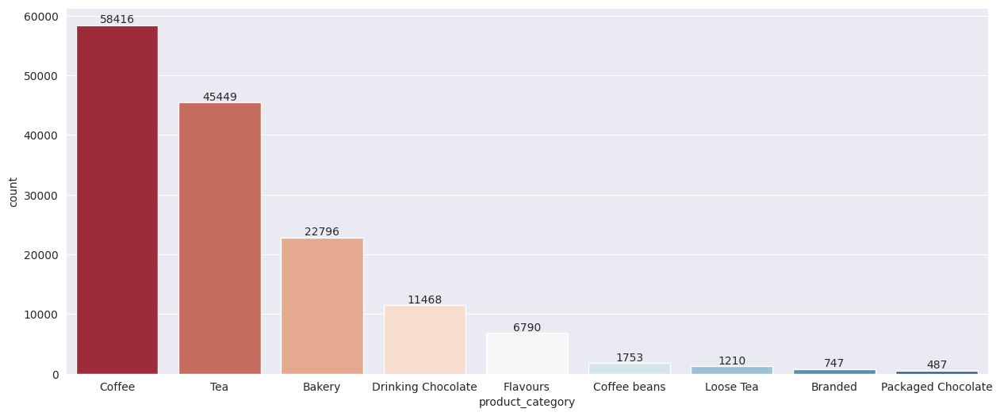

In [ ]:
# see most common category

# set figure size
plt.figure(figsize = (15,6))

# call function i create it in cell 12
count_plot(x_axis = "product_category")

**🛑📊 We can see :**
   - it's evident that the three stores offer a wide range of services.
   - `Coffee` stands as the best-selling product.
   - `Tea` also exhibits a high sales rate.

### Discovering `product_type` column

In [ ]:
# see unique values

data["product_type"].unique()

array(['Gourmet brewed coffee', 'Brewed Chai tea', 'Hot chocolate',
       'Drip coffee', 'Scone', 'Barista Espresso', 'Brewed Black tea',
       'Brewed Green tea', 'Brewed herbal tea', 'Biscotti', 'Pastry',
       'Organic brewed coffee', 'Premium brewed coffee', 'Regular syrup',
       'Herbal tea', 'Gourmet Beans', 'Organic Beans', 'Sugar free syrup',
       'Drinking Chocolate', 'Premium Beans', 'Chai tea', 'Green beans',
       'Espresso Beans', 'Green tea', 'Organic Chocolate', 'Housewares',
       'Black tea', 'House blend Beans', 'Clothing'], dtype=object)

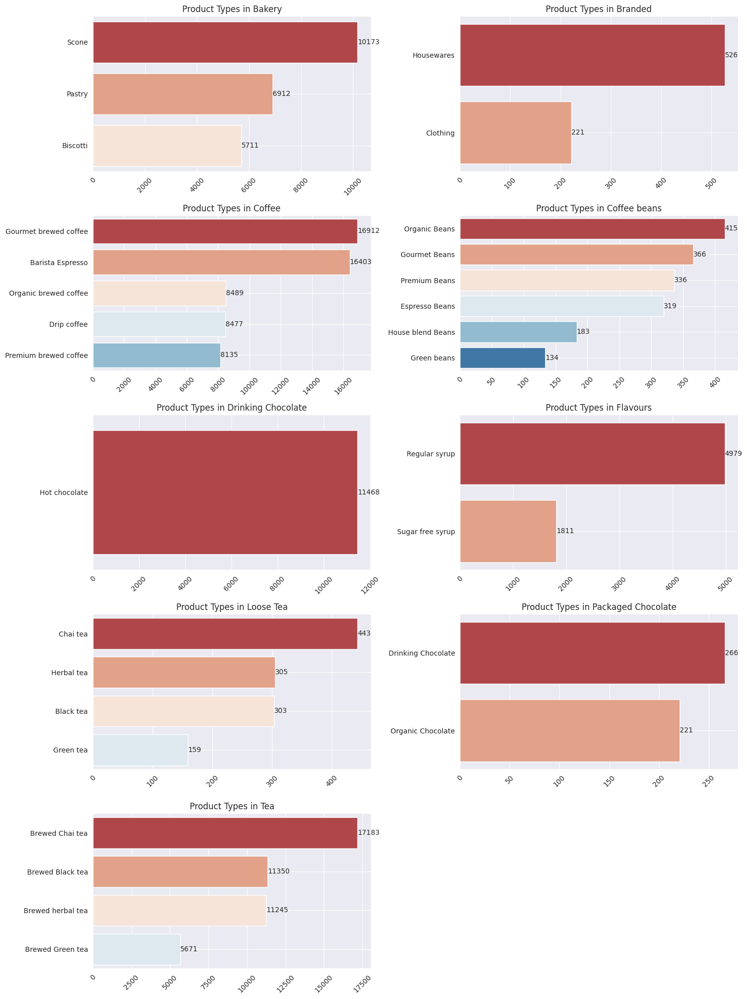

In [ ]:
# Assuming 'counts' is the DataFrame obtained from your groupby operation
counts = data.groupby(["product_category", "product_type"]).size().reset_index(name = "count")

# Get unique categories
categories = counts['product_category'].unique()

# Create subplots for each category in a 4x2 grid
fig, axes = plt.subplots(5, 2, figsize = (15, 20))

# Flatten the axes for easier iteration
axes = axes.flatten()

for i, category in enumerate(categories):
    # Filter data for each category
    subset = counts[counts['product_category'] == category]

    # Sort the data by 'count' column in descending order
    subset = subset.sort_values('count', ascending = False)

    # Create a bar plot for each category with sorted order
    sns.barplot(x = 'count', y = 'product_type', data = subset, ax = axes[i], order = subset['product_type'])
    axes[i].set_title(f'Product Types in {category}')
    axes[i].set_ylabel('')
    axes[i].set_xlabel('')
    axes[i].tick_params(axis = 'x', rotation = 45)
    axes[i].grid(True)

    # Adding bar labels
    for idx, bar in enumerate(axes[i].patches):
        axes[i].text(bar.get_width(), bar.get_y() + bar.get_height() / 2, subset.iloc[idx]['count'], ha = 'left', va = 'center')

# Hide extra subplots if there are fewer categories than subplots
for j in range(len(categories), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


### Discovering `product_detail` column

In [ ]:
# see unique values

data["product_detail"].unique()

array(['Ethiopia Rg', 'Spicy Eye Opener Chai Lg', 'Dark chocolate Lg',
       'Our Old Time Diner Blend Sm', 'Oatmeal Scone',
       'Columbian Medium Roast Sm', 'Latte Rg', 'Dark chocolate Rg',
       'Spicy Eye Opener Chai Rg', 'Ethiopia Lg', 'Earl Grey Lg',
       'Ouro Brasileiro shot', 'Serenity Green Tea Lg',
       'Jumbo Savory Scone', 'Lemon Grass Rg',
       'Sustainably Grown Organic Lg', 'Hazelnut Biscotti', 'Cappuccino',
       'Lemon Grass Lg', 'Chocolate Chip Biscotti', 'Peppermint Lg',
       'Chocolate Croissant', 'Latte', 'Brazilian Rg', 'Brazilian Lg',
       'Columbian Medium Roast Rg', 'Morning Sunrise Chai Rg',
       'Morning Sunrise Chai Lg', 'Our Old Time Diner Blend Lg',
       'Sustainably Grown Organic Rg', 'Scottish Cream Scone ',
       'Peppermint Rg', 'English Breakfast Rg',
       'Our Old Time Diner Blend Rg', 'Serenity Green Tea Rg',
       'Brazilian Sm', 'Jamaican Coffee River Sm',
       'Jamaican Coffee River Lg', 'Ginger Biscotti',
       'Tradit

**🛑I decided to `Drop` this column, it's redundant since the same information is presented more effectively in the other columns**

In [ ]:
# drop column

data.drop(columns = "product_detail", inplace = True)

In [ ]:
# add new column revenue

data["Total revenue"] = data["transaction_qty"] * data["unit_price"]

In [ ]:
# see sample of data

data.sample(5)

,transaction_qty,store_location,unit_price,product_category,product_type,year,month,day,hour,Total revenue
101834,1,Lower Manhattan,2.5,Tea,Brewed Chai tea,2023,May,Saturday,13,2.5
66866,1,Lower Manhattan,2.5,Tea,Brewed Chai tea,2023,April,Saturday,8,2.5
140472,2,Lower Manhattan,3.0,Coffee,Gourmet brewed coffee,2023,June,Friday,10,6.0
30502,3,Lower Manhattan,3.0,Tea,Brewed Black tea,2023,February,Thursday,12,9.0
104326,2,Astoria,2.5,Tea,Brewed herbal tea,2023,May,Monday,19,5.0


## Columns Insights📊📉📈

- **Year**, Sales exclusively from 2023.
- **Month**, Most sales within a six-month period
- **Hour**, Most sales were from 8 am to 11 pm
- **Transaction quantity**, Most sales were singles followed by 2 lots
- **Stores**, The sales rates of the three stores were similar, with the most significant difference observed at the `Hell's Kitchen` store
- **Unit price**, Price distribution is `positively skewed`, We understand from this that most Coffee have lower prices,while a few Coffee have higher prices
- **Category :**
     - it's evident that the three stores offer a wide range of services.
     - `Coffee` stands as the best-selling product.
     - `Tea` also exhibits a high sales rate.
- **product type :**
     - In the **Bakery** category, the most sold item is the **scone**
     - In the **Branded** category, the best-selling item is **Housewares**
     - In the **Coffee** category, the best-selling item is **Gourmet brewed coffee**
     - In the **Coffee beans** category, the best-selling item is **Organic Beans**
     - The **Drinking Chocolate** category solely offers **hot chocolate**
     - **Regular syrup** are the top-selling items in the **Flavours** category
     - In the **Loose Tea** category, the best-selling item is **Chai tea**
     - In the **Packaged Chocolate** category, the best-selling item is **Drinking Chocolate**
     - In the **Tea** category, the best-selling item is **Brewed Chai tea**

## Bivariate Analysis & Visualizations 📊📉📈

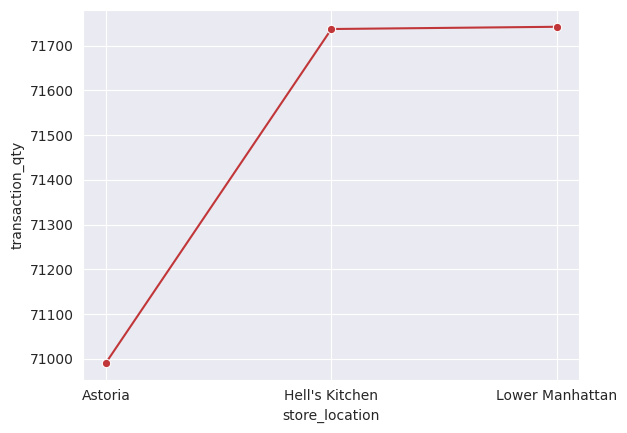

In [ ]:
# stores Vs transaction quantities

# Calculate sum of transaction quantities for each store_location
sum_transaction_qty = data.groupby("store_location")["transaction_qty"].sum().reset_index()

# create line plot
sns.lineplot(x = "store_location", y = "transaction_qty", data = sum_transaction_qty, marker = "o")
plt.show()

**🛑 We can see :**
   - The sales ratios for quantities seem to be quite similar across all stores

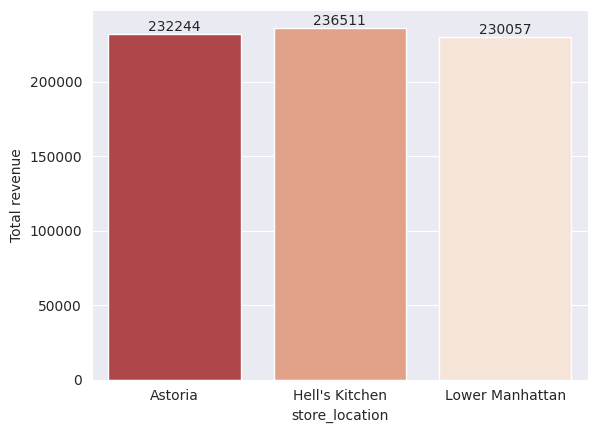

In [ ]:
# Stores Vs Total revenue

# Calculate total revenue for each store_location
revenue = data.groupby("store_location")["Total revenue"].sum().reset_index()

# create bar plot
ax = sns.barplot(x = "store_location", y = "Total revenue", data = revenue)

# Adding labels to each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center',
                xytext = (0, 5), textcoords = 'offset points')

plt.show()

**We can see :**
- The total revenue generated from sales at each store location amounted to $232,243.91 for Astoria, $236,511.17 for `Hell's Kitchen`, and $230,057.25 for `Lower Manhattan`
- **"Hell's Kitchen"** appears to be the best store in terms of revenue.

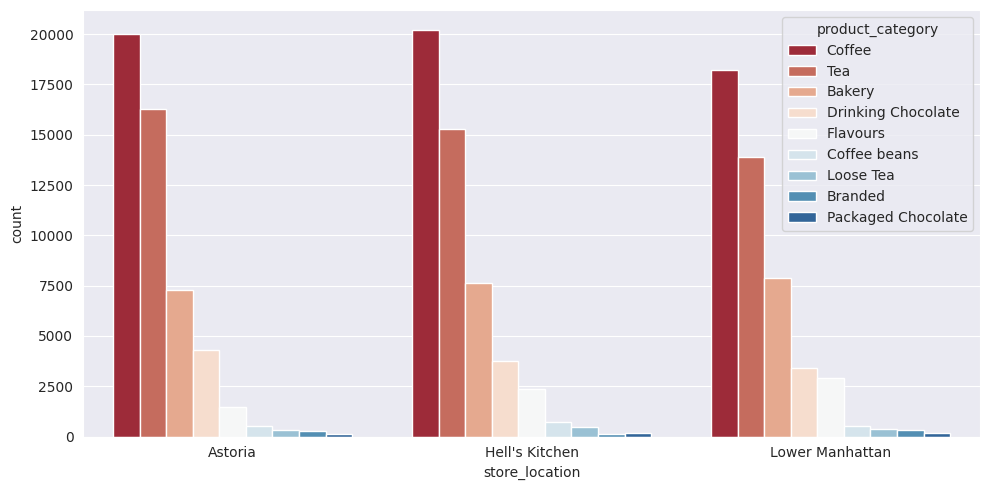

In [ ]:
# Stores VS product categories

# Calculate number of product categories at each store location
popular_products = data.groupby('store_location')[['product_category']].value_counts().reset_index(name='count')

# set figure size
plt.figure(figsize=(10, 5))

# Create a bar plot
sns.barplot(x = 'store_location', y = 'count', hue = 'product_category', data = popular_products, palette = "RdBu")

plt.tight_layout()
plt.show()

- **Astoria Store :**
    - The highest selling product category is **Coffee** with a count of **20,025** units
    - Following Coffee, **Tea** stands as the second most popular category with a count of **16,260** units
    - Other categories like Bakery, Drinking Chocolate, Flavours, Coffee beans, Loose Tea, Branded, and Packaged Chocolate have        varying counts, ranging from **7289** to **110** units, in **descending order**
<p>&nbsp;</p>

- **Hell's Kitchen Store :**
    - Similar to Astoria, **Coffee** leads in sales, amounting to **20,187** units
    - **Tea** follows closely as the second most popular category with **15,277** units
    - Other categories, such as Bakery, Drinking Chocolate, Flavours, Coffee beans, Loose Tea, Packaged Chocolate, Branded, and Packaged Chocolate, have counts ranging from **7617** to **119** units  
<p>&nbsp;</p>

- **Lower Manhattan Store :**
    - **Coffee** is again the top-selling category with **18,204** units
    - **Tea** follows with **13,912** units
    - Bakery, Drinking Chocolate, Flavours, Coffee beans, Loose Tea, Branded, Packaged Chocolate have counts ranging from **7890** to **180** units, in **descending order**

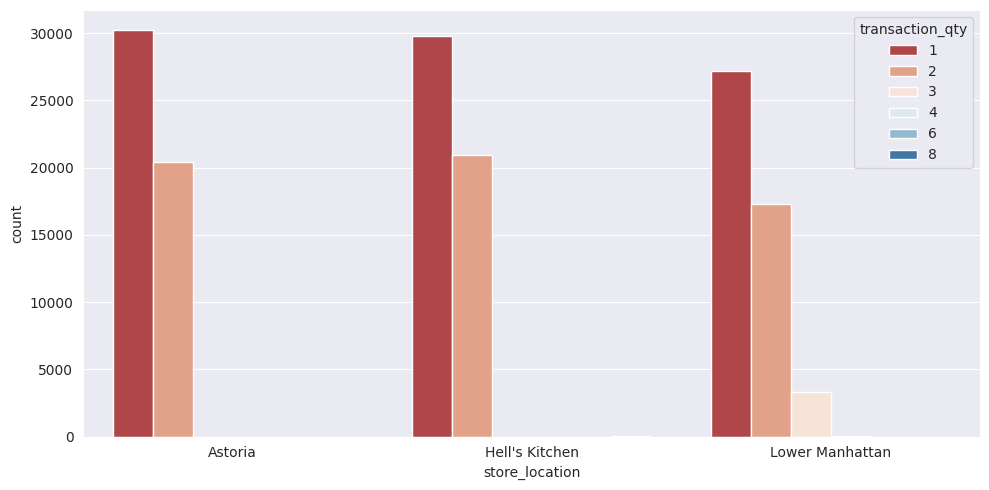

In [ ]:
# Stores VS Most transaction_qty

# grouped 'store_location' and 'transaction_qty' as columns
grouped_data = data.groupby("store_location")["transaction_qty"].value_counts().reset_index(name = "count")

# set figure size
plt.figure(figsize=(10, 5))

# Create bar plot
sns.barplot(x = "store_location", y = "count", hue = "transaction_qty", data = grouped_data)

plt.tight_layout()
plt.show()

- **Astoria Store :**
    - The most frequent transaction quantity observed is **1**, with a count of **30,207** instances
    - The second most frequent transaction quantity is **2**, noted **20,392** times
<p>&nbsp;</p>
- **Hell's Kitchen Store:**
    - The most frequent transaction quantity observed is **1**, noted **29,793** times
    - The second most frequent transaction quantity is **2**, observed **20,932** times
    - Additionally, there are **8** transactions with a quantity of **8**
<p>&nbsp;</p>
- **Lower Manhattan Store:**
    - The most frequent transaction quantity observed is **1**, recorded **27,159** times.
    - The second most frequent transaction quantity is **2**, seen **17,318** times.
    - There are occurrences of transaction quantities **3**, **4**, and **6**, but they are less frequent compared to quantities **1** and **2**

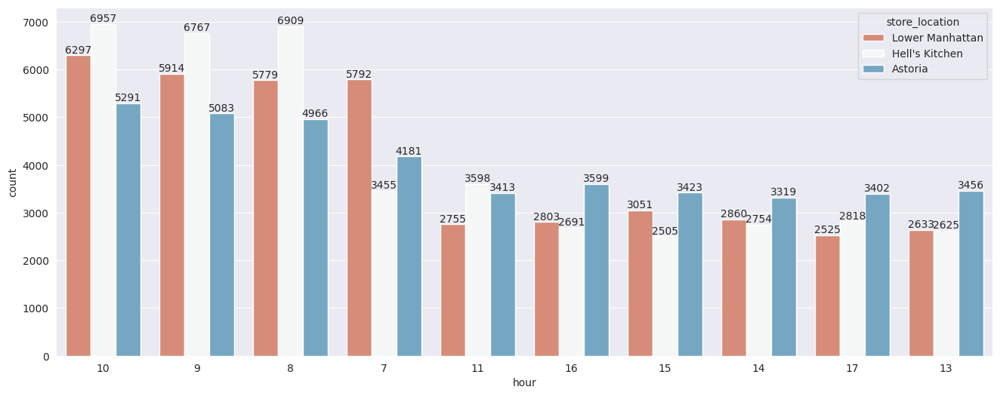

In [ ]:
# Stores VS Hour sales

# set figure size
plt.figure(figsize=(16, 6))

# call function i create it in cell 12
count_plot(x_axis = "hour", hue = "store_location", top = 10)

- **Astoria Store :**
    - Peak hours are from **9 AM** to **10 AM**, and from **4 PM** to **5 PM**, with counts ranging between **5,083** and **5,291** during these periods
    - The least busy hours are from **7 AM** to **8 AM**, with counts ranging between **4,181** and **4,966**
<p>&nbsp;</p>
- **Hell's Kitchen Store :**
    - Busiest hours are from **8 AM** to **10 AM**, with counts ranging between **6,767** and **6,909**
    - The least busy hours are from **6 AM** to **7 AM** and from **6 PM** to **8 PM**
<p>&nbsp;</p>
- **Lower Manhattan Store :**
    - Peak hours are from **9 AM** to **10 AM**, with a count of **6,297**, and from **2 PM** to **3 PM**, with a count of **3,051**
    - The least busy hours are from **7 PM** to **8 PM**, with counts dropping to **75** and **125**

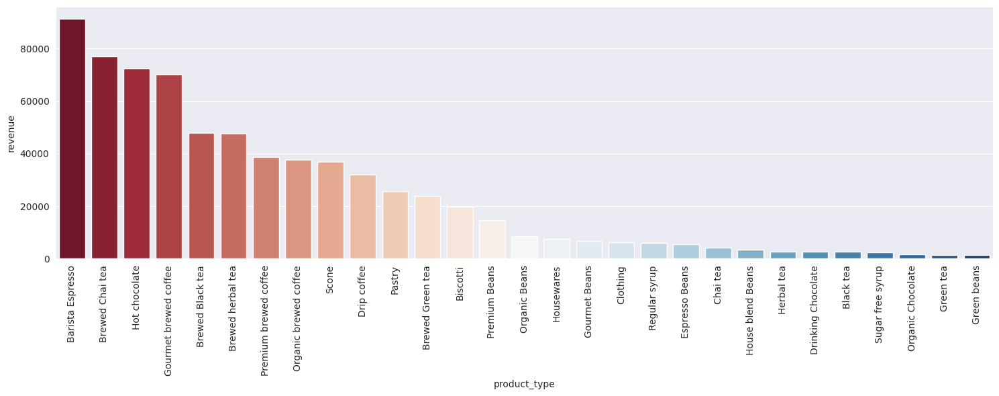

In [ ]:
# Category VS Total revenue

# grouped product_type' and 'Total revenue'
category_revenue = data.groupby("product_type")["Total revenue"].sum().reset_index(name = "revenue")

# sort category by revenue
category_revenue = category_revenue.sort_values(by = 'revenue', ascending = False)

# set figure size
plt.figure(figsize = (15,6))

# create bar plot
sns.barplot(x = "product_type", y = "revenue", data = category_revenue, palette = "RdBu")

# set x-axis rotation
plt.xticks(rotation = 90)

plt.tight_layout()
plt.show()

- **Top Revenue Product Types :**
   - **Barista Espresso** with a revenue of **91,406.20**
   - **Brewed Chai tea** with a revenue of **77,081.95**
   - **Hot chocolate** with a revenue of **72,416.00**
   - **Gourmet brewed coffee** with a revenue of **70,034.60**
   - **Brewed Black tea** with a revenue of **47,932.00**
<p>&nbsp;</p>
- **Lowest Revenue Product Types :**
   - **Organic Chocolate** with a revenue of **1,679.60**
   - **Green tea** with a revenue of **1,470.75**
   - **Green beans** with a revenue of **1,340.00**
<p>&nbsp;</p>
- **Other Observations :**
    - Various products contribute to revenue across different ranges, with a mix of beverages (like **teas, coffees**) and snacks (**biscotti, pastries**).
    - **Coffee-related products**, such as various brews and espresso variants, hold prominent positions in revenue generation.
    - The lowest revenue-generating products are predominantly related to **tea** and specific beverage variants.

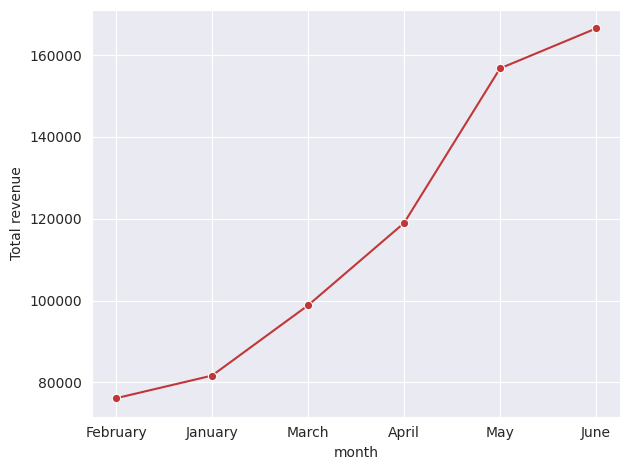

In [ ]:
# Month VS revenue

# Grouping by month and summing the revenue
monthly_revenue  = data.groupby("month")["Total revenue"].sum().reset_index().sort_values(by = "Total revenue")

# create line plot
sns.lineplot(x = "month", y = "Total revenue", data = monthly_revenue , marker = "o")

plt.tight_layout()
plt.show()

- **We can see 🎛️📊 :**
    - **Jun**e had the highest total revenue, reaching **166,485.88**, making it the most profitable month.
    - **May** followed closely behind with a total revenue of **156,727.76**, indicating strong performance.
    - **Apri**l and **March** also performed well, generating revenues of **118,941.08** and **98,834.68**, respectively.
    - **January** and **February** had comparatively lower revenue figures at **81,677.74** and **76,145.19**, respectively.

# Importing necassary Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.offline import iplot
from plotly.subplots import make_subplots

# Reading the dataset

In [ ]:
df = pd.read_excel('/kaggle/input/coffee-sales/Coffee Shop Sales.xlsx')
df

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail
0,1,2023-01-01,07:06:11,2,5,Lower Manhattan,32,3.00,Coffee,Gourmet brewed coffee,Ethiopia Rg
1,2,2023-01-01,07:08:56,2,5,Lower Manhattan,57,3.10,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg
2,3,2023-01-01,07:14:04,2,5,Lower Manhattan,59,4.50,Drinking Chocolate,Hot chocolate,Dark chocolate Lg
3,4,2023-01-01,07:20:24,1,5,Lower Manhattan,22,2.00,Coffee,Drip coffee,Our Old Time Diner Blend Sm
4,5,2023-01-01,07:22:41,2,5,Lower Manhattan,57,3.10,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg
...,...,...,...,...,...,...,...,...,...,...,...
149111,149452,2023-06-30,20:18:41,2,8,Hell's Kitchen,44,2.50,Tea,Brewed herbal tea,Peppermint Rg
149112,149453,2023-06-30,20:25:10,2,8,Hell's Kitchen,49,3.00,Tea,Brewed Black tea,English Breakfast Lg
149113,149454,2023-06-30,20:31:34,1,8,Hell's Kitchen,45,3.00,Tea,Brewed herbal tea,Peppermint Lg
149114,149455,2023-06-30,20:57:19,1,8,Hell's Kitchen,40,3.75,Coffee,Barista Espresso,Cappuccino


# Preprocessing & Cleaning

In [ ]:
df.isna().sum()

transaction_id      0
transaction_date    0
transaction_time    0
transaction_qty     0
store_id            0
store_location      0
product_id          0
unit_price          0
product_category    0
product_type        0
product_detail      0
dtype: int64

In [ ]:
df.isnull().sum()

transaction_id      0
transaction_date    0
transaction_time    0
transaction_qty     0
store_id            0
store_location      0
product_id          0
unit_price          0
product_category    0
product_type        0
product_detail      0
dtype: int64

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149116 entries, 0 to 149115
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   transaction_id    149116 non-null  int64         
 1   transaction_date  149116 non-null  datetime64[ns]
 2   transaction_time  149116 non-null  object        
 3   transaction_qty   149116 non-null  int64         
 4   store_id          149116 non-null  int64         
 5   store_location    149116 non-null  object        
 6   product_id        149116 non-null  int64         
 7   unit_price        149116 non-null  float64       
 8   product_category  149116 non-null  object        
 9   product_type      149116 non-null  object        
 10  product_detail    149116 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(4), object(5)
memory usage: 12.5+ MB


**This data is clean from NaN values, Nulls and duplicates**

In [ ]:
# describing the numerical data
df.describe()

,transaction_id,transaction_date,transaction_qty,store_id,product_id,unit_price
count,149116.000000,149116,149116.000000,149116.000000,149116.000000,149116.000000
mean,74737.371872,2023-04-15 11:50:32.173609984,1.438276,5.342063,47.918607,3.382219
min,1.000000,2023-01-01 00:00:00,1.000000,3.000000,1.000000,0.800000
25%,37335.750000,2023-03-06 00:00:00,1.000000,3.000000,33.000000,2.500000
50%,74727.500000,2023-04-24 00:00:00,1.000000,5.000000,47.000000,3.000000
75%,112094.250000,2023-05-30 00:00:00,2.000000,8.000000,60.000000,3.750000
max,149456.000000,2023-06-30 00:00:00,8.000000,8.000000,87.000000,45.000000
std,43153.600016,NaN,0.542509,2.074241,17.930020,2.658723


In [ ]:
# describing the categorical data
df.describe(include= object)

,transaction_time,store_location,product_category,product_type,product_detail
count,149116,149116,149116,149116,149116
unique,25762,3,9,29,80
top,09:31:15,Hell's Kitchen,Coffee,Brewed Chai tea,Chocolate Croissant
freq,41,50735,58416,17183,3076


In [ ]:
# add new column year
df["year"] = df["transaction_date"].dt.year

# add new column month
df["month"] = df["transaction_date"].dt.month_name()

# add new column day
df["day"] = df["transaction_date"].dt.day_name()

In [ ]:
df

,transaction_id,transaction_date,transaction_time,transaction_qty,store_id,store_location,product_id,unit_price,product_category,product_type,product_detail,year,month,day
0,1,2023-01-01,07:06:11,2,5,Lower Manhattan,32,3.00,Coffee,Gourmet brewed coffee,Ethiopia Rg,2023,January,Sunday
1,2,2023-01-01,07:08:56,2,5,Lower Manhattan,57,3.10,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,2023,January,Sunday
2,3,2023-01-01,07:14:04,2,5,Lower Manhattan,59,4.50,Drinking Chocolate,Hot chocolate,Dark chocolate Lg,2023,January,Sunday
3,4,2023-01-01,07:20:24,1,5,Lower Manhattan,22,2.00,Coffee,Drip coffee,Our Old Time Diner Blend Sm,2023,January,Sunday
4,5,2023-01-01,07:22:41,2,5,Lower Manhattan,57,3.10,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,2023,January,Sunday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149111,149452,2023-06-30,20:18:41,2,8,Hell's Kitchen,44,2.50,Tea,Brewed herbal tea,Peppermint Rg,2023,June,Friday
149112,149453,2023-06-30,20:25:10,2,8,Hell's Kitchen,49,3.00,Tea,Brewed Black tea,English Breakfast Lg,2023,June,Friday
149113,149454,2023-06-30,20:31:34,1,8,Hell's Kitchen,45,3.00,Tea,Brewed herbal tea,Peppermint Lg,2023,June,Friday
149114,149455,2023-06-30,20:57:19,1,8,Hell's Kitchen,40,3.75,Coffee,Barista Espresso,Cappuccino,2023,June,Friday


In [ ]:
# We can drop some columns we don't use in analysis
df.drop(columns = ["transaction_id", "store_id", "product_id"], inplace = True)

In [ ]:
df

,transaction_date,transaction_time,transaction_qty,store_location,unit_price,product_category,product_type,product_detail,year,month,day
0,2023-01-01,07:06:11,2,Lower Manhattan,3.00,Coffee,Gourmet brewed coffee,Ethiopia Rg,2023,January,Sunday
1,2023-01-01,07:08:56,2,Lower Manhattan,3.10,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,2023,January,Sunday
2,2023-01-01,07:14:04,2,Lower Manhattan,4.50,Drinking Chocolate,Hot chocolate,Dark chocolate Lg,2023,January,Sunday
3,2023-01-01,07:20:24,1,Lower Manhattan,2.00,Coffee,Drip coffee,Our Old Time Diner Blend Sm,2023,January,Sunday
4,2023-01-01,07:22:41,2,Lower Manhattan,3.10,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,2023,January,Sunday
...,...,...,...,...,...,...,...,...,...,...,...
149111,2023-06-30,20:18:41,2,Hell's Kitchen,2.50,Tea,Brewed herbal tea,Peppermint Rg,2023,June,Friday
149112,2023-06-30,20:25:10,2,Hell's Kitchen,3.00,Tea,Brewed Black tea,English Breakfast Lg,2023,June,Friday
149113,2023-06-30,20:31:34,1,Hell's Kitchen,3.00,Tea,Brewed herbal tea,Peppermint Lg,2023,June,Friday
149114,2023-06-30,20:57:19,1,Hell's Kitchen,3.75,Coffee,Barista Espresso,Cappuccino,2023,June,Friday


# Analysis & Visualization

In [ ]:
df['year'].unique()

array([2023], dtype=int32)

In [ ]:
df['month'].unique()

array(['January', 'February', 'March', 'April', 'May', 'June'],
      dtype=object)

In [ ]:
transactions_per_month = df['month'].value_counts()
transactions_per_month

month
June        35352
May         33527
April       25335
March       21229
January     17314
February    16359
Name: count, dtype: int64

In [ ]:
iplot(px.bar(x=transactions_per_month.index, y=transactions_per_month.values,
             labels={'x': 'Month', 'y': 'Number of Transactions'},
             title='Transactions per Month', text_auto= True))

In [ ]:
# # Same plot using seaborn
# plt.figure(figsize=(10, 6))
# sns.barplot(x=transactions_per_month.index, y=transactions_per_month.values, color='skyblue', palette = "RdBu")
# plt.title('Transactions per Month')
# plt.xlabel('Month')
# plt.ylabel('Number of Transactions')
# plt.show()

In [ ]:
df['day'].unique()

array(['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday',
       'Saturday'], dtype=object)

In [ ]:
transactions_per_day = df['day'].value_counts()
transactions_per_day

day
Friday       21701
Thursday     21654
Monday       21643
Wednesday    21310
Tuesday      21202
Sunday       21096
Saturday     20510
Name: count, dtype: int64

In [ ]:
iplot(px.bar(x=transactions_per_day.index, y=transactions_per_day.values,
             labels={'x': 'Month', 'y': 'Number of Transactions'},
             title='Transactions per Day', text_auto= True))

In [ ]:
# # Same plot using seaborn
# plt.figure(figsize=(10, 6))
# sns.barplot(x=transactions_per_day.index, y=transactions_per_day.values, color='skyblue', palette = "RdBu")
# plt.title('Transactions per Day')
# plt.xlabel('Month')
# plt.ylabel('Number of Transactions')
# plt.show()

In [ ]:
# add new column hour

df["hour"] = df["transaction_time"].apply(lambda x : x.hour)

In [ ]:
df.head()

,transaction_date,transaction_time,transaction_qty,store_location,unit_price,product_category,product_type,product_detail,year,month,day,hour
0,2023-01-01,07:06:11,2,Lower Manhattan,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg,2023,January,Sunday,7
1,2023-01-01,07:08:56,2,Lower Manhattan,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,2023,January,Sunday,7
2,2023-01-01,07:14:04,2,Lower Manhattan,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg,2023,January,Sunday,7
3,2023-01-01,07:20:24,1,Lower Manhattan,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm,2023,January,Sunday,7
4,2023-01-01,07:22:41,2,Lower Manhattan,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,2023,January,Sunday,7


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



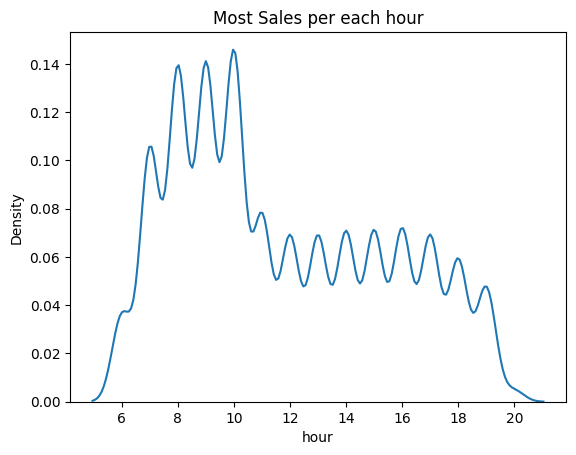

In [ ]:
# see distribution

sns.kdeplot(df["hour"])
plt.title('Most Sales per each hour')
plt.show()

**This means that most of the transactions occurs from 8 am to 11 am**

In [ ]:
df['transaction_qty'].unique()

array([2, 1, 3, 4, 8, 6])

In [ ]:
no_sales_quantity = df['transaction_qty'].value_counts()
no_sales_quantity

transaction_qty
1    87159
2    58642
3     3279
4       23
8       10
6        3
Name: count, dtype: int64

In [ ]:
iplot(px.bar(x=no_sales_quantity.index, y=no_sales_quantity.values,
             labels={'x': 'Quantity', 'y': 'Number of sales'},
             title='Number of sales quantity', text_auto= True))

In [ ]:
df['store_location'].unique()

array(['Lower Manhattan', "Hell's Kitchen", 'Astoria'], dtype=object)

In [ ]:
sales_per_store = df['store_location'].value_counts()
sales_per_store

store_location
Hell's Kitchen     50735
Astoria            50599
Lower Manhattan    47782
Name: count, dtype: int64

In [ ]:
iplot(px.pie(names=sales_per_store.index, values=sales_per_store.values,
             title='Number of sales for each store'))

In [ ]:
df["unit_price"].unique()

array([ 3.  ,  3.1 ,  4.5 ,  2.  ,  4.25,  3.5 ,  2.55,  3.75,  2.5 ,
        4.75,  3.25,  4.  ,  2.2 ,  2.45,  0.8 ,  8.95, 21.  , 28.  ,
        6.4 , 19.75, 12.  , 18.  ,  9.5 , 10.  , 20.45,  9.25, 22.5 ,
       14.75,  7.6 , 14.  , 10.95, 13.33, 15.  ,  4.38,  4.06,  5.63,
        4.69, 45.  , 23.  ,  2.1 ,  2.65])

<Axes: ylabel='unit_price'>

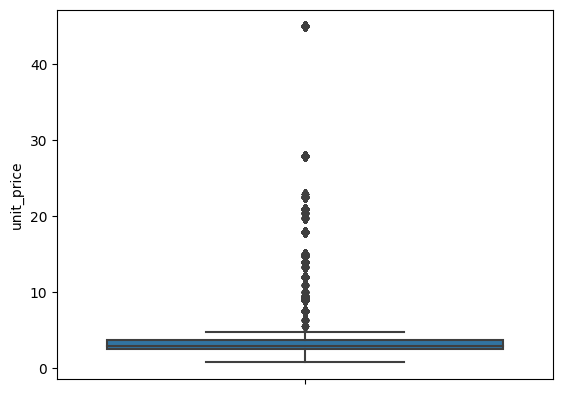

In [ ]:
# see 5 number summary to check outliers

sns.boxplot(y = "unit_price", data = df)

**One might assume the presence of outliers, but such variations are expected in different types of coffee**

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



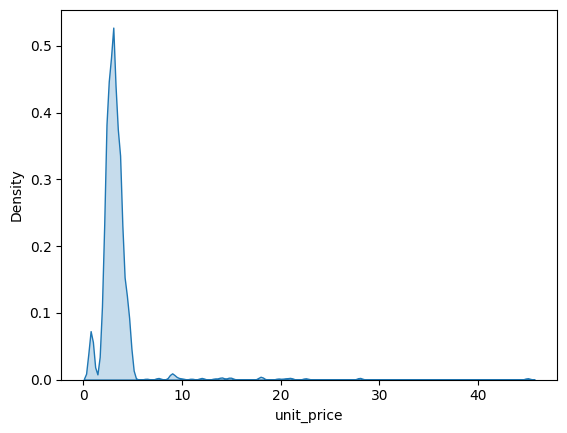

In [ ]:
# see distribution

sns.kdeplot(x = df["unit_price"], fill = True)
plt.show()

**We can see: Price distribution is positively skewed, We understand from this that most Coffee have lower prices,while a few Coffee have higher prices**

In [ ]:
df['product_category'].unique()

array(['Coffee', 'Tea', 'Drinking Chocolate', 'Bakery', 'Flavours',
       'Loose Tea', 'Coffee beans', 'Packaged Chocolate', 'Branded'],
      dtype=object)

In [ ]:
category_count = df['product_category'].value_counts()
category_count

product_category
Coffee                58416
Tea                   45449
Bakery                22796
Drinking Chocolate    11468
Flavours               6790
Coffee beans           1753
Loose Tea              1210
Branded                 747
Packaged Chocolate      487
Name: count, dtype: int64

In [ ]:
iplot(px.bar(x=category_count.index, y=category_count.values,
             labels={'x': 'Product Category', 'y': 'Count'},
             title='Category Count', text_auto= True))

**We can see that Coffee stands as the best selling product. Also, Tea exhibits a high sales rates**

In [ ]:
df["product_type"].unique()

array(['Gourmet brewed coffee', 'Brewed Chai tea', 'Hot chocolate',
       'Drip coffee', 'Scone', 'Barista Espresso', 'Brewed Black tea',
       'Brewed Green tea', 'Brewed herbal tea', 'Biscotti', 'Pastry',
       'Organic brewed coffee', 'Premium brewed coffee', 'Regular syrup',
       'Herbal tea', 'Gourmet Beans', 'Organic Beans', 'Sugar free syrup',
       'Drinking Chocolate', 'Premium Beans', 'Chai tea', 'Green beans',
       'Espresso Beans', 'Green tea', 'Organic Chocolate', 'Housewares',
       'Black tea', 'House blend Beans', 'Clothing'], dtype=object)

In [ ]:
product_type_count = df['product_type'].value_counts()
product_type_count

product_type
Brewed Chai tea          17183
Gourmet brewed coffee    16912
Barista Espresso         16403
Hot chocolate            11468
Brewed Black tea         11350
Brewed herbal tea        11245
Scone                    10173
Organic brewed coffee     8489
Drip coffee               8477
Premium brewed coffee     8135
Pastry                    6912
Biscotti                  5711
Brewed Green tea          5671
Regular syrup             4979
Sugar free syrup          1811
Housewares                 526
Chai tea                   443
Organic Beans              415
Gourmet Beans              366
Premium Beans              336
Espresso Beans             319
Herbal tea                 305
Black tea                  303
Drinking Chocolate         266
Organic Chocolate          221
Clothing                   221
House blend Beans          183
Green tea                  159
Green beans                134
Name: count, dtype: int64

/opt/conda/lib/python3.10/site-packages/seaborn/categorical.py:645: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



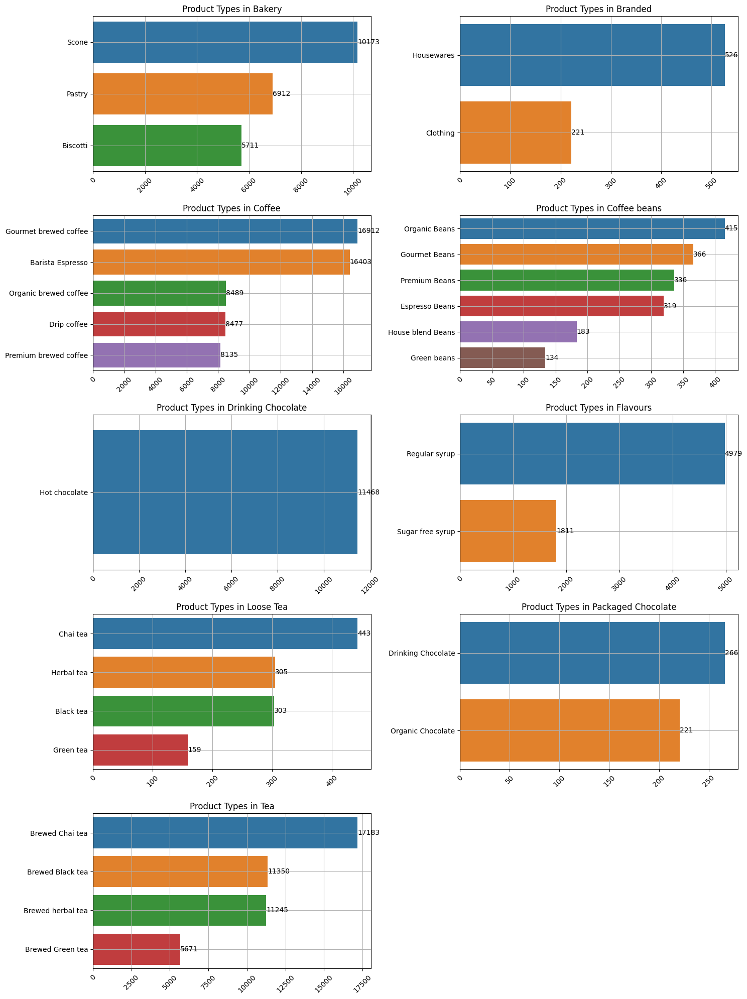

In [ ]:
# Assuming 'counts' is the DataFrame obtained from your groupby operation
counts = df.groupby(["product_category", "product_type"]).size().reset_index(name = "count")

# Get unique categories
categories = counts['product_category'].unique()

# Create subplots for each category in a 4x2 grid
fig, axes = plt.subplots(5, 2, figsize = (15, 20))

# Flatten the axes for easier iteration
axes = axes.flatten()

for i, category in enumerate(categories):
    # Filter data for each category
    subset = counts[counts['product_category'] == category]

    # Sort the data by 'count' column in descending order
    subset = subset.sort_values('count', ascending = False)

    # Create a bar plot for each category with sorted order
    sns.barplot(x = 'count', y = 'product_type', data = subset, ax = axes[i], order = subset['product_type'])
    axes[i].set_title(f'Product Types in {category}')
    axes[i].set_ylabel('')
    axes[i].set_xlabel('')
    axes[i].tick_params(axis = 'x', rotation = 45)
    axes[i].grid(True)

    # Adding bar labels
    for idx, bar in enumerate(axes[i].patches):
        axes[i].text(bar.get_width(), bar.get_y() + bar.get_height() / 2, subset.iloc[idx]['count'], ha = 'left', va = 'center')

# Hide extra subplots if there are fewer categories than subplots
for j in range(len(categories), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

# Conclusion from Columns analysis

* **Year**, Sales exclusively from 2023.
* **Month**, Most sales within a six-month period
* **Hour**, Most sales were from 8 am to 11 pm
* **Transaction quantity**, Most sales were singles followed by 2 lots
* **Stores**, The sales rates of the three stores were similar, with the most significant difference observed at the Hell's Kitchen store
* **Unit price**, Price distribution is positively skewed, We understand from this that most Coffee have lower prices,while a few Coffee have higher prices
* **Category** :
  - it's evident that the three stores offer a wide range of services.
  - Coffee stands as the best-selling product.
  - Tea also exhibits a high sales rate.
* **product type** :
  - In the Bakery category, the most sold item is the scone
  - In the Branded category, the best-selling item is Housewares
  - In the Coffee category, the best-selling item is Gourmet brewed coffee
  - In the Coffee beans category, the best-selling item is Organic Beans
  - The Drinking Chocolate category solely offers hot chocolate
  - Regular syrup are the top-selling items in the Flavours category
  - In the Loose Tea category, the best-selling item is Chai tea
  - In the Packaged Chocolate category, the best-selling item is Drinking Chocolate
  - In the Tea category, the best-selling item is Brewed Chai tea

In [ ]:
# add new column revenue
df["Total revenue"] = df["transaction_qty"] * df["unit_price"]

In [ ]:
df.head()

,transaction_date,transaction_time,transaction_qty,store_location,unit_price,product_category,product_type,product_detail,year,month,day,hour,Total revenue
0,2023-01-01,07:06:11,2,Lower Manhattan,3.0,Coffee,Gourmet brewed coffee,Ethiopia Rg,2023,January,Sunday,7,6.0
1,2023-01-01,07:08:56,2,Lower Manhattan,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,2023,January,Sunday,7,6.2
2,2023-01-01,07:14:04,2,Lower Manhattan,4.5,Drinking Chocolate,Hot chocolate,Dark chocolate Lg,2023,January,Sunday,7,9.0
3,2023-01-01,07:20:24,1,Lower Manhattan,2.0,Coffee,Drip coffee,Our Old Time Diner Blend Sm,2023,January,Sunday,7,2.0
4,2023-01-01,07:22:41,2,Lower Manhattan,3.1,Tea,Brewed Chai tea,Spicy Eye Opener Chai Lg,2023,January,Sunday,7,6.2


In [ ]:
# stores Vs transaction quantities

# Calculate sum of transaction quantities for each store_location
sum_transaction_qty = df.groupby("store_location")["transaction_qty"].sum().reset_index()

# Create a Plotly line plot
iplot(px.line(sum_transaction_qty, x="store_location", y="transaction_qty",
              title="Total Transaction Quantities per Store Location",
              labels={"store_location": "Store Location", "transaction_qty": "Total Transaction Quantity"}))

**We can notice: The sales ratios for quantities seem to be quite similar across all stores**

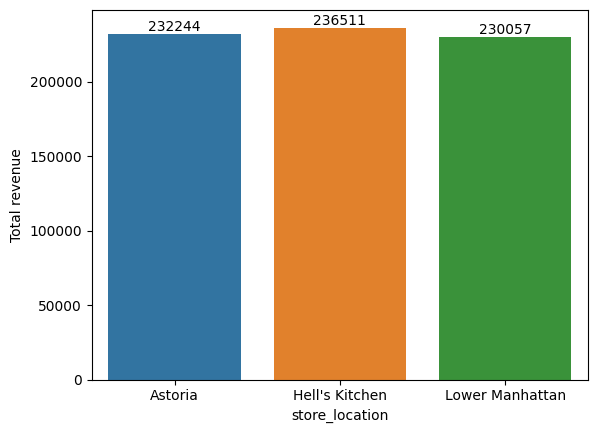

In [ ]:
# Stores Vs Total revenue

# Calculate total revenue for each store_location
revenue = df.groupby("store_location")["Total revenue"].sum().reset_index()

# create bar plot
ax = sns.barplot(x = "store_location", y = "Total revenue", data = revenue)

# Adding labels to each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center',
                xytext = (0, 5), textcoords = 'offset points')

plt.show()

**Notes**:
* The total revenue generated from sales at each store location amounted to  232,243.91 for Astoria,
 236,511.17 for Hell's Kitchen, and $230,057.25 for Lower Manhattan.
* "Hell's Kitchen" appears to be the best store in terms of revenue.

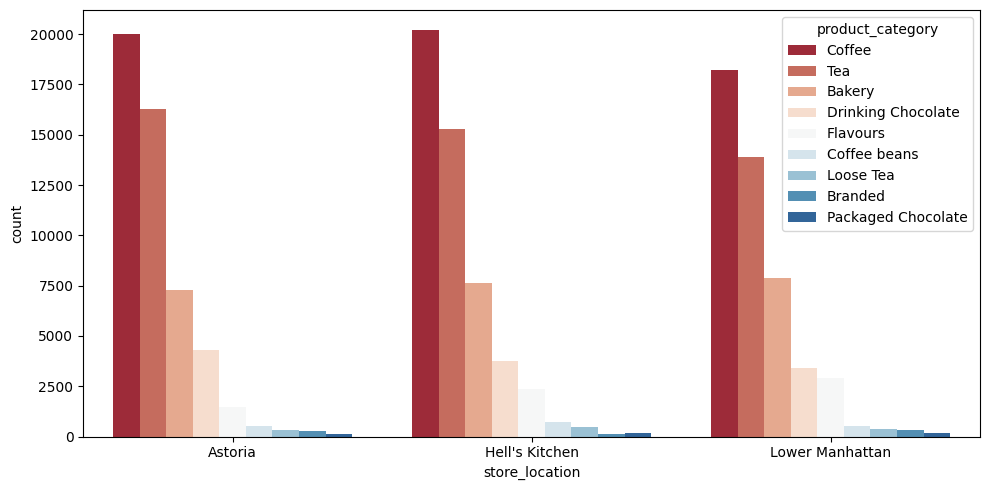

In [ ]:
# Stores VS product categories

# Calculate number of product categories at each store location
popular_products = df.groupby('store_location')[['product_category']].value_counts().reset_index(name='count')

# set figure size
plt.figure(figsize=(10, 5))

# Create a bar plot
sns.barplot(x = 'store_location', y = 'count', hue = 'product_category', data = popular_products, palette = "RdBu")

plt.tight_layout()
plt.show()

**Astoria Store** :
  - The highest selling product category is Coffee with a count of 20,025 units
  - Following Coffee, Tea stands as the second most popular category with a count of 16,260 units
  - Other categories like Bakery, Drinking Chocolate, Flavours, Coffee beans, Loose Tea, Branded, and Packaged Chocolate have varying counts, ranging from 7289 to 110 units, in descending order


**Hell's Kitchen Store** :

  - Similar to Astoria, Coffee leads in sales, amounting to 20,187 units
  - Tea follows closely as the second most popular category with 15,277 units
  - Other categories, such as Bakery, Drinking Chocolate, Flavours, Coffee beans, Loose Tea, Packaged Chocolate, Branded, and Packaged Chocolate, have counts ranging from 7617 to 119 units


**Lower Manhattan Store** :

  - Coffee is again the top-selling category with 18,204 units
  - Tea follows with 13,912 units
  - Bakery, Drinking Chocolate, Flavours, Coffee beans, Loose Tea, Branded, Packaged Chocolate have counts ranging from 7890 to 180 units, in descending order

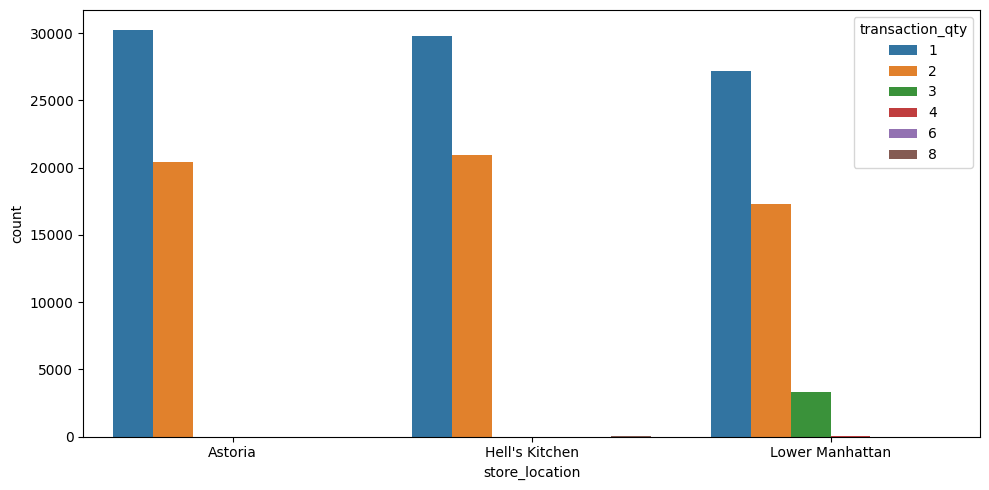

In [ ]:
# Stores VS Most transaction_qty

# grouped 'store_location' and 'transaction_qty' as columns
grouped_data = df.groupby("store_location")["transaction_qty"].value_counts().reset_index(name = "count")

# set figure size
plt.figure(figsize=(10, 5))

# Create bar plot
sns.barplot(x = "store_location", y = "count", hue = "transaction_qty", data = grouped_data)

plt.tight_layout()
plt.show()

**Astoria Store** :
  - The most frequent transaction quantity observed is 1, with a count of 30,207 instances
  - The second most frequent transaction quantity is 2, noted 20,392 times


**Hell's Kitchen Store**:
  - The most frequent transaction quantity observed is 1, noted 29,793 times
  - The second most frequent transaction quantity is 2, observed 20,932 times
  - Additionally, there are 8 transactions with a quantity of 8


**Lower Manhattan Store**:
  - The most frequent transaction quantity observed is 1, recorded 27,159 times.
  - The second most frequent transaction quantity is 2, seen 17,318 times.
  - There are occurrences of transaction quantities 3, 4, and 6, but they are less frequent compared to quantities 1 and 2

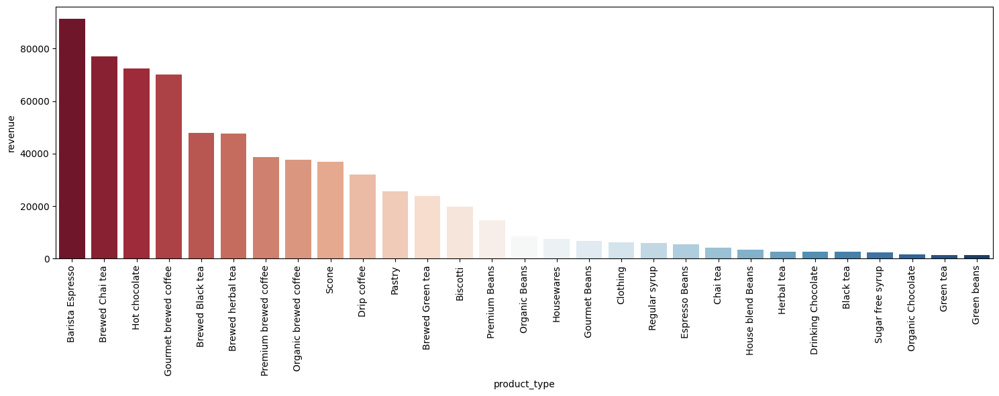

In [ ]:
# grouped product_type' and 'Total revenue'
category_revenue = df.groupby("product_type")["Total revenue"].sum().reset_index(name = "revenue")

# sort category by revenue
category_revenue = category_revenue.sort_values(by = 'revenue', ascending = False)

# set figure size
plt.figure(figsize = (15,6))

# create bar plot
sns.barplot(x = "product_type", y = "revenue", data = category_revenue, palette = "RdBu")

# set x-axis rotation
plt.xticks(rotation = 90)

plt.tight_layout()
plt.show()

**Top Revenue Product Types** :
  - Barista Espresso with a revenue of 91,406.20
  - Brewed Chai tea with a revenue of 77,081.95
  - Hot chocolate with a revenue of 72,416.00
  - Gourmet brewed coffee with a revenue of 70,034.60
  - Brewed Black tea with a revenue of 47,932.00


**Lowest Revenue Product Types** :
  - Organic Chocolate with a revenue of 1,679.60
  - Green tea with a revenue of 1,470.75
  - Green beans with a revenue of 1,340.00


**Other Observations** :
  - Various products contribute to revenue across different ranges, with a mix of beverages (like teas, coffees) and snacks (biscotti, pastries).
  - Coffee-related products, such as various brews and espresso variants, hold prominent positions in revenue generation.
  - The lowest revenue-generating products are predominantly related to tea and specific beverage variants.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



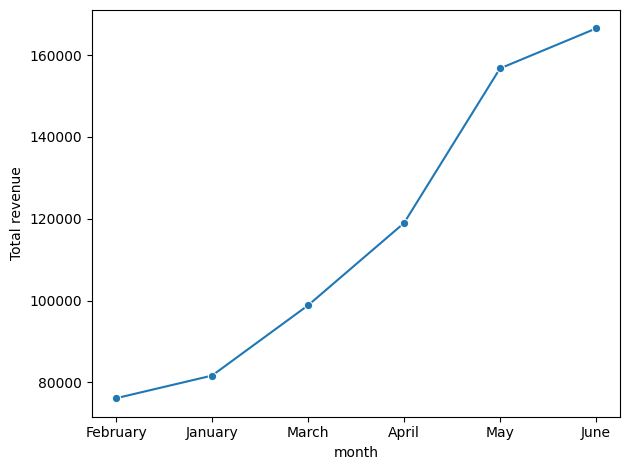

In [ ]:
# Month VS revenue

# Grouping by month and summing the revenue
monthly_revenue  = df.groupby("month")["Total revenue"].sum().reset_index().sort_values(by = "Total revenue")

# create line plot
sns.lineplot(x = "month", y = "Total revenue", data = monthly_revenue , marker = "o")

plt.tight_layout()
plt.show()

**We can see** :
  - June had the highest total revenue, reaching 166,485.88, making it the most profitable month.
  - May followed closely behind with a total revenue of 156,727.76, indicating strong performance.
  - April and March also performed well, generating revenues of 118,941.08 and 98,834.68, respectively.
  - January and February had comparatively lower revenue figures at 81,677.74 and 76,145.19, respectively.

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
# !pip install jcopml

warnings.filterwarnings('ignore')
# pd.set_option('display.max_columns', None)
sns.set_palette('Spectral')
sns.set_context('notebook', font_scale=1)
sns.set_style('whitegrid')

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/coffee-sales/Coffee Shop Sales.xlsx


# Data Extracting

In [ ]:
df = pd.read_excel(os.path.join(dirname, filename))

# Data Transforming

In [ ]:
# get hour data from transaction_time
df['hour']=df.transaction_time.apply(lambda x: int(str(x).split(':')[0]))

In [ ]:
# create get_function
def get_day(x):
    if x>=0 and x<=18:
        msg='Day'
    else:
        msg='Night'
    return msg

# get the day part by hour using get_day function
df['daypart']=df.hour.apply(get_day)

In [ ]:
# get the date with time for find the peformance customer service
df['datetime']=df.transaction_date.apply(lambda x: str(x).split()[0] + ' ') + df.transaction_time.apply(lambda x: str(x))
df['datetime']=pd.to_datetime(df['datetime'])

In [ ]:
# reposition columns
df=df.rename(columns={'transaction_id':'transaction', 'transaction_date':'date', 'transaction_time':'time'})
df=df[['store_id','store_location','transaction','datetime', 'date','time','hour', 'daypart'
    ,'product_id', 'product_category', 'product_type', 'product_detail','transaction_qty','unit_price']]

In [ ]:
# check null data
df.isna().sum()

store_id            0
store_location      0
transaction         0
datetime            0
date                0
time                0
hour                0
daypart             0
product_id          0
product_category    0
product_type        0
product_detail      0
transaction_qty     0
unit_price          0
dtype: int64

In [ ]:
# check duplicated data
df.duplicated().sum()

0

In [ ]:
# get the income from qty * unit_price
df['income']=df.transaction_qty * df.unit_price

# Exploratory Data Analyst

# Task-1 : How have Maven Roasters sales trended over time?

In [ ]:
# get the informaction to answer task-1
task1=df.groupby(['date']).agg({
    'transaction':np.count_nonzero,
    'transaction_qty':np.sum,
    'income':np.sum
}).reset_index()

In [ ]:
# Day-over-Day Growth Analysis
columns=['transaction','transaction_qty','income']

# create the function
def growth_percentage(now, before):
    msg=((now - before)/before)
    return np.round(msg, 4)

# apply the function and get the growth over day
growth_analyst=[]
for cols in columns:
    values=task1[cols].tolist()
    report=[]
    for i in range(len(values)):
        try:
            now=values[i+1]
            before=values[i]
            msg=growth_percentage(now, before)
        except:
            msg=0
        report.append(msg)

    report = [0] + report[0:-1]
    growth_analyst.append(pd.DataFrame({
        cols:report
    }))

# append growth_analyst and adding date data
growth_analyst=pd.concat(growth_analyst, axis=1)
growth_analyst['date']=task1.date
growth_analyst=growth_analyst[['date','transaction','transaction_qty','income']]

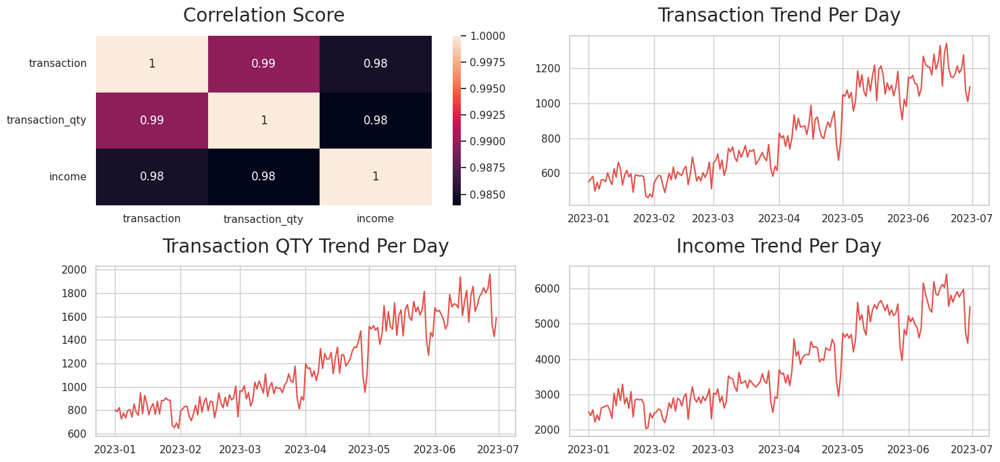

In [ ]:
# correlaction
corr_task1=task1.drop(columns='date').corr()

# set the canvas with 2 rows and 2 columns
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(15, 7))

# correlation score visualize
ax[0][0].set_title('Correlation Score', fontsize=20, pad=15)
sns.heatmap(corr_task1, annot=True, ax=ax[0][0])
ax[0][0].set_yticks(ticks=[0.5,1.5,2.5], labels=['transaction','transaction_qty','income'], rotation=0)

# transaction trend visualize
ax[0][1].set_title('Transaction Trend Per Day', fontsize=20, pad=15)
ax[0][1].plot(task1.date, task1.transaction)

# qty trend visualize
ax[1][0].set_title('Transaction QTY Trend Per Day', fontsize=20, pad=15)
ax[1][0].plot(task1.date, task1.transaction_qty)

# qty trend visualize
ax[1][1].set_title('Income Trend Per Day', fontsize=20, pad=15)
ax[1][1].plot(task1.date, task1.income)

plt.tight_layout()
plt.show()

#### **Observation :**

1. The correlation indicates a strong positive relationship among the three features [transaction, transaction_qty, income], providing insight that when income decreases significantly on a certain day, it is likely due to a decrease in transactions and, consequently, quantity sold. Another condition leading to a decrease in income is when, at times, customers only shop for low unit_price items. However, with the information from this correlation, we can ascertain that the decline in income is influenced by transactional factors rather than changes in customer behavior.

2. Examining the trends of [transaction, transaction_qty, income] reveals a positive scenario where, over time, both transactions and transaction quantity exhibit a significant increase. Next, we will explore the daily growth percentage related to these three trends.

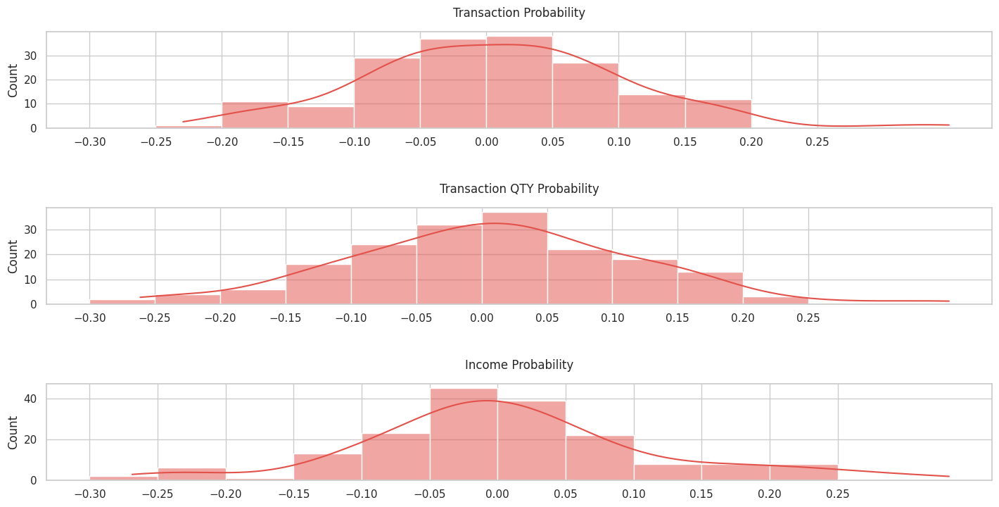

In [ ]:
# set the canvas with 2 rows and 2 columns
fig, ax = plt.subplots(nrows=3, figsize=(15, 8))
bins=np.arange(-0.3, 0.3, 0.05)

ax[0].set_title('Transaction Probability', pad=15)
ax[1].set_title('Transaction QTY Probability', pad=15)
ax[2].set_title('Income Probability', pad=15)

sns.histplot(growth_analyst.transaction, ax=ax[0], bins=bins, kde=True)
sns.histplot(growth_analyst.transaction_qty, ax=ax[1], bins=bins, kde=True)
sns.histplot(growth_analyst.income, ax=ax[2], bins=bins, kde=True)

ax[0].set_xticks(ticks=bins)
ax[1].set_xticks(ticks=bins)
ax[2].set_xticks(ticks=bins)

ax[0].set_xlabel('')
ax[1].set_xlabel('')
ax[2].set_xlabel('')

plt.tight_layout(pad=3)
plt.show()

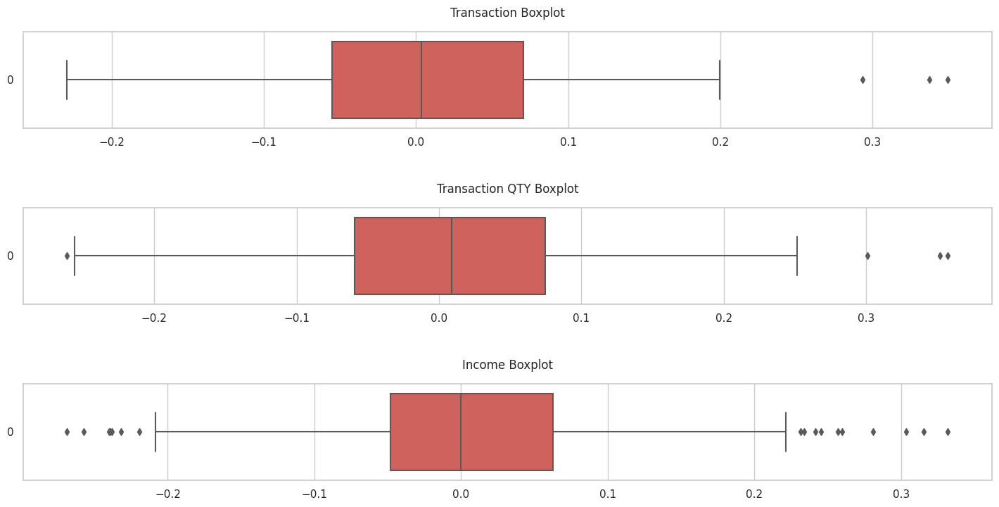

In [ ]:
# set the canvas with 2 rows and 2 columns
fig, ax = plt.subplots(nrows=3, figsize=(15, 8))
bins=np.arange(-0.3, 0.3, 0.05)

ax[0].set_title('Transaction Boxplot', pad=15)
ax[1].set_title('Transaction QTY Boxplot', pad=15)
ax[2].set_title('Income Boxplot', pad=15)

sns.boxplot(growth_analyst.transaction, ax=ax[0], orient='horizontal')
sns.boxplot(growth_analyst.transaction_qty, ax=ax[1], orient='horizontal')
sns.boxplot(growth_analyst.income, ax=ax[2], orient='horizontal')

ax[0].set_xlabel('')
ax[1].set_xlabel('')
ax[2].set_xlabel('')

plt.tight_layout(pad=3)
plt.show()

In [ ]:
print('1. AVG. Day-over-Day Growth of Transaction :\t\t', growth_analyst.transaction.mean())
print('2. AVG. Day-over-Day Growth of Transaction QTY :\t', growth_analyst.transaction_qty.mean())
print('3. AVG. Day-over-Day Growth of Income :\t\t\t', growth_analyst.income.mean())

1. AVG. Day-over-Day Growth of Transaction :		 0.008615469613259671
2. AVG. Day-over-Day Growth of Transaction QTY :	 0.009890607734806633
3. AVG. Day-over-Day Growth of Income :			 0.010307734806629831


#### **Observation:**


The daily growth of the three features shows a significant difference. The average percentage daily growth of income is 0.010307734806629831 or 1.03%. Subsequently, the average percentage daily growth of transaction_qty is 0.009890607734806633 or 0.98%, and the average percentage daily growth of transaction is 0.008615469613259671 or 0.86%.

From this information, we know that the growth of income is slightly superior to transaction_qty and transaction. This can also be interpreted that, on a daily basis, customers tend to prefer purchasing higher unit_price products, indicating the influence of the Maven Roasters brand, attracting or intriguing customers towards products with higher unit_prices.

# Task-2 : Which days of the week tend to be busiest, and why do you think that's the case?

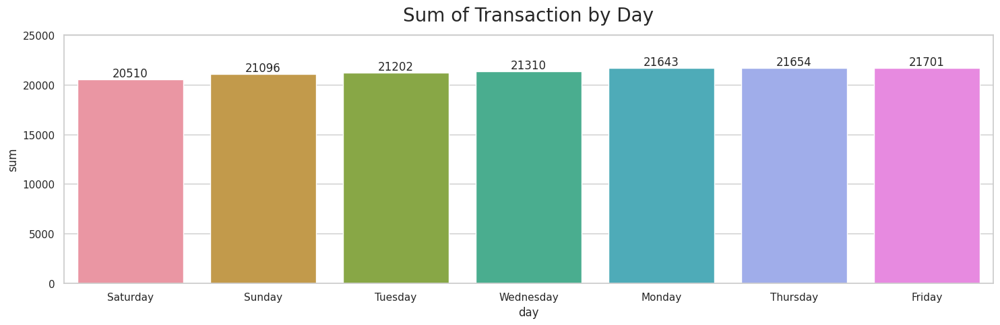

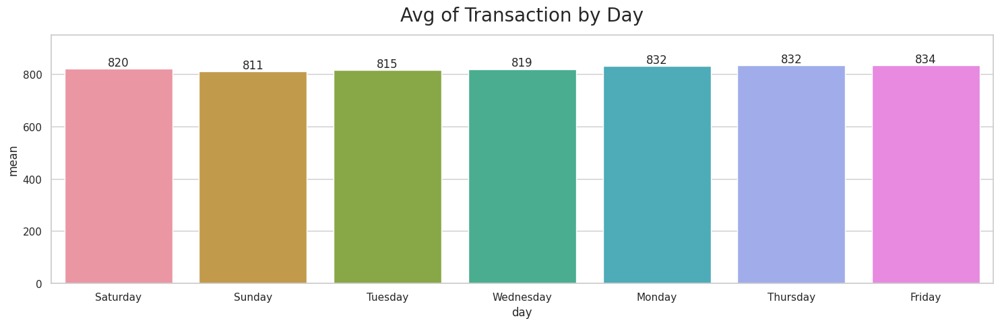

In [ ]:
task2=df.copy()
task2['day']=task2.datetime.dt.day_name()

# group the data
task2=task2.groupby(['date','day']).agg({
    'transaction':np.count_nonzero,
}).reset_index()


task2['date']=pd.to_datetime(task2['date'])
task2['month']=task2.date.dt.month
task2=task2[['date','month','day','transaction']]

data=task2.groupby(['day'])['transaction'].agg([np.sum, np.mean]).reset_index().sort_values(['sum'], ascending=True)

# visualize the SUM of transaction by Day
plt.figure(figsize=(15, 5))
plt.title('Sum of Transaction by Day', fontsize=20, pad=15)
splot=sns.barplot(data, x='day', y='sum')

for bar in splot.patches:
    height = bar.get_height()
    splot.text(bar.get_x() + bar.get_width() / 2, height + 0.1, int(height), ha='center', va='bottom')

plt.ylim(ymin=0, ymax=25000)
plt.tight_layout()
plt.show()

# visualize the AVG of Transaction by Day per Day
plt.figure(figsize=(15, 5))
plt.title('Avg of Transaction by Day', fontsize=20, pad=15)
splot=sns.barplot(data, x='day', y='mean')

for bar in splot.patches:
    height = bar.get_height()
    splot.text(bar.get_x() + bar.get_width() / 2, height + 0.1, int(height), ha='center', va='bottom')

plt.ylim(ymin=0, ymax=950)
plt.tight_layout()
plt.show()

In [ ]:
report = []
for i in task2.month.unique():
    data=task2[task2.month==i]
    data=data.groupby(['day'])[['transaction']].sum().reset_index()
    data['p_transaction']=data.transaction / data.transaction.sum()
    data['month']=i
    report.append(data)

data=pd.concat(report)
data=data[['month','day','p_transaction']]

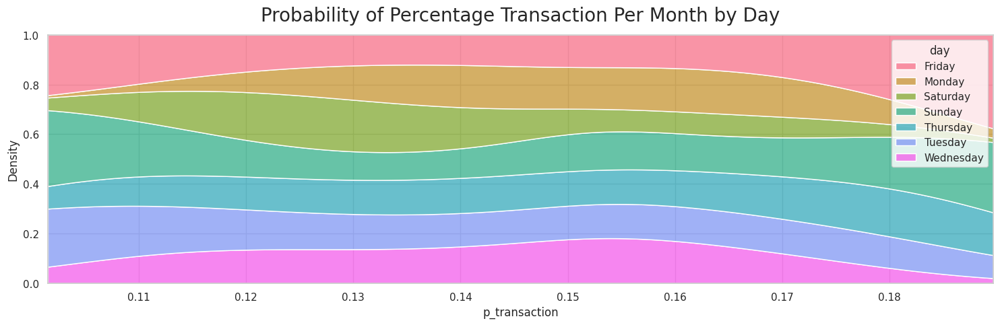

In [ ]:
plt.figure(figsize=(15, 5))
plt.title('Probability of Percentage Transaction Per Month by Day', fontsize=20, pad=15)
sns.kdeplot(data, x='p_transaction', hue='day', multiple='fill', fill=True)
plt.tight_layout()
plt.show()

**Observation:**

After examining the barplots of the SUM of Transaction by Day, AVG of Transaction by Day per Day, and Probability of Percentage Transaction Per Month by Day, it can be concluded that the days with high density of orders are as follows:

- **When looking at the stable level of busyness:**

    1. **Thursday**: Ranks second highest in total transactions, daily transaction averages, and has a significant chance of being the busiest day in a month.

- **When looking at the high but not very stable level of busyness:**

    1. **Friday**: Ranks highest in total transactions, daily transaction averages, and has a strong likelihood of being the busiest day in a month.
    2. **Sunday**: Has a considerable chance of being the day with the highest percentage density in a month.

# Task-3 : Which products are sold most and least often? Which drive the most revenue for the business?

In [ ]:
task3=df.copy()
task3=task3.groupby(['product_detail']).agg({
    'transaction':np.count_nonzero,
    'income':np.sum
}).reset_index().sort_values('income', ascending=False)

In [ ]:
# create function to get the characteristics of transaction
def get_class_transaction(x, max_value, len_bins):
    if x < max_value/len_bins:
        msg='C1'
    elif x>=max_value/len_bins and x<=((max_value/len_bins)*2):
        msg='C2'
    elif x>((max_value/len_bins)*2):
        msg='C3'
    return msg

# apply the function to classification the transaction characteristics
task3['transaction_class']=task3.transaction.apply(lambda i: get_class_transaction(x=i, max_value=task3.transaction.max(), len_bins=3))

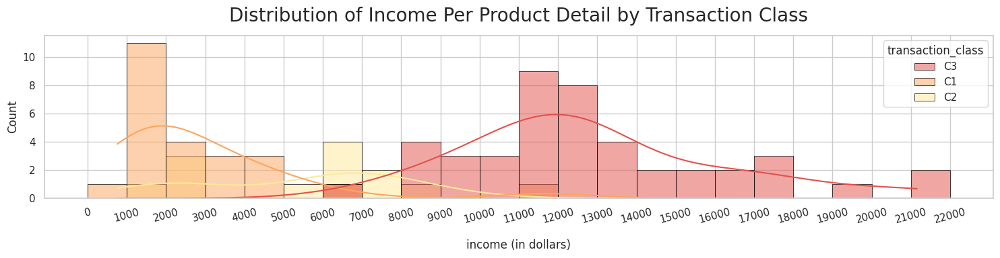

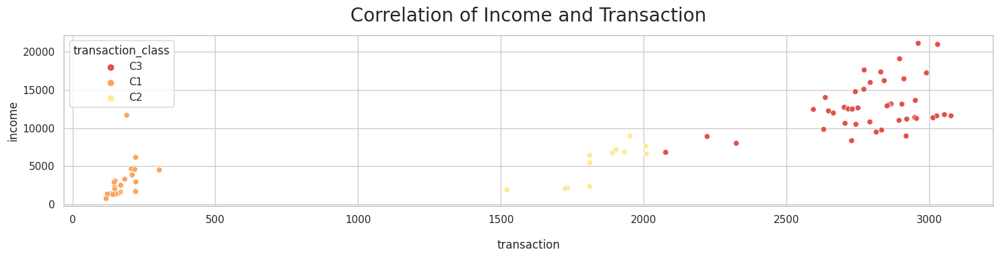

             transaction    income
transaction     1.000000  0.837088
income          0.837088  1.000000


In [ ]:
# visualize the distribution of income per product detail by transaction class
bins=np.arange(0, 23000, 1000)
plt.figure(figsize=(15, 4))
plt.title('Distribution of Income Per Product Detail by Transaction Class', fontsize=20, pad=15)
sns.histplot(task3, x='income', bins=bins, kde=True, hue='transaction_class', linewidth=0.5, edgecolor='black')
plt.xticks(bins, rotation=15)
plt.xlabel('income (in dollars)', labelpad=15)
plt.tight_layout()
plt.show()

# visualize the scatterplot of transaction and income by transaction class to get knowladge of correlation
plt.figure(figsize=(15, 4))
plt.title('Correlation of Income and Transaction', fontsize=20, pad=15)
sns.scatterplot(task3, x='transaction', y='income', hue='transaction_class')
plt.xlabel('transaction', labelpad=15)
plt.tight_layout()
plt.show()

# print the correlation score
print(task3.select_dtypes('number').corr())

**Observation:**

Through distribution and correlation analysis, we have determined that income tends to rise with higher transaction volumes. This observation specifically addresses Task 3, where our goal is to identify the most frequently sold products. I can confidently assert that products with higher transaction rates are those in greater demand among consumers.

Next, I will showcase the products with the highest transactions and income, as well as the opposite scenario.

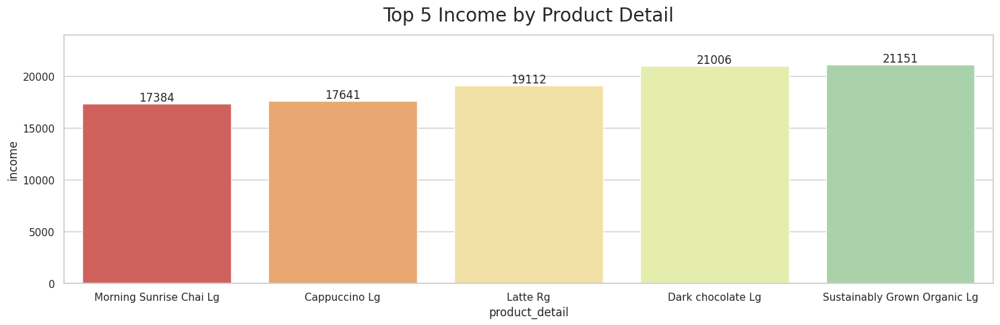

In [ ]:
# Top 5 product with sold most
data1=task3.sort_values('income', ascending=False).head(5)
data1['status']='top 5 high'
plt.figure(figsize=(15, 5))
plt.title('Top 5 Income by Product Detail', fontsize=20, pad=15)
splot=sns.barplot(data1.sort_values('income', ascending=True), x='product_detail', y='income')
for bar in splot.patches:
    height = bar.get_height()
    splot.text(bar.get_x() + bar.get_width() / 2, height + 0.1, int(height), ha='center', va='bottom')

plt.ylim(ymin=0, ymax=24000)
plt.tight_layout()
plt.show()

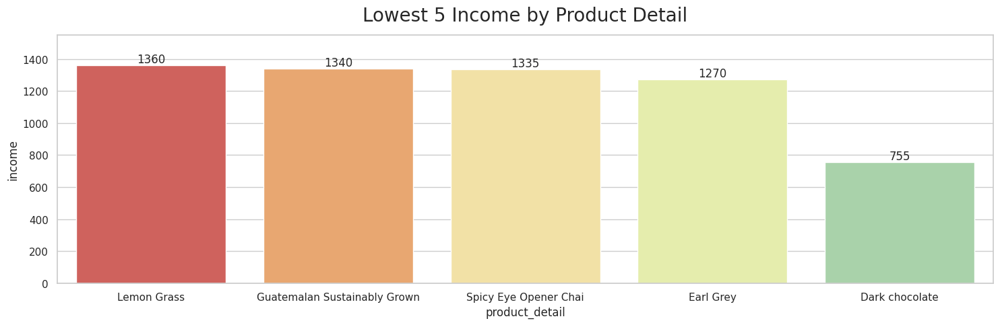

In [ ]:
# Top 5 product with sold most
data2=task3.sort_values('income', ascending=False).tail(5)
data2['status']='top 5 low'
plt.figure(figsize=(15, 5))
plt.title('Lowest 5 Income by Product Detail', fontsize=20, pad=15)
splot=sns.barplot(data2.sort_values('income', ascending=False), x='product_detail', y='income')
for bar in splot.patches:
    height = bar.get_height()
    splot.text(bar.get_x() + bar.get_width() / 2, height + 0.1, int(height), ha='center', va='bottom')

plt.ylim(ymin=0, ymax=1550)
plt.tight_layout()
plt.show()

In [ ]:
# get the information
data=pd.concat([data1, data2], axis=0)
data=data.merge(df[['unit_price','product_detail','product_category','product_type']], on='product_detail', how='left').drop_duplicates()
data.reset_index(drop=True, inplace=True)
data=data[['product_category','product_type','product_detail','status','unit_price','transaction','income']]

In [ ]:
data

,product_category,product_type,product_detail,status,unit_price,transaction,income
0,Drinking Chocolate,Hot chocolate,Sustainably Grown Organic Lg,top 5 high,4.75,2961,21151.75
1,Drinking Chocolate,Hot chocolate,Dark chocolate Lg,top 5 high,4.50,3029,21006.00
2,Coffee,Barista Espresso,Latte Rg,top 5 high,4.25,2896,19112.25
3,Coffee,Barista Espresso,Cappuccino Lg,top 5 high,4.25,2772,17641.75
4,Tea,Brewed Chai tea,Morning Sunrise Chai Lg,top 5 high,4.00,2830,17384.00
5,Loose Tea,Herbal tea,Lemon Grass,top 5 low,8.95,152,1360.40
6,Coffee beans,Green beans,Guatemalan Sustainably Grown,top 5 low,10.00,134,1340.00
7,Loose Tea,Chai tea,Spicy Eye Opener Chai,top 5 low,10.95,122,1335.90
8,Loose Tea,Black tea,Earl Grey,top 5 low,8.95,142,1270.90
9,Packaged Chocolate,Drinking Chocolate,Dark chocolate,top 5 low,6.40,118,755.20


In [ ]:
data[data.status=='top 5 high']

,product_category,product_type,product_detail,status,unit_price,transaction,income
0,Drinking Chocolate,Hot chocolate,Sustainably Grown Organic Lg,top 5 high,4.75,2961,21151.75
1,Drinking Chocolate,Hot chocolate,Dark chocolate Lg,top 5 high,4.50,3029,21006.00
2,Coffee,Barista Espresso,Latte Rg,top 5 high,4.25,2896,19112.25
3,Coffee,Barista Espresso,Cappuccino Lg,top 5 high,4.25,2772,17641.75
4,Tea,Brewed Chai tea,Morning Sunrise Chai Lg,top 5 high,4.00,2830,17384.00


In [ ]:
data[data.status=='top 5 low']

,product_category,product_type,product_detail,status,unit_price,transaction,income
5,Loose Tea,Herbal tea,Lemon Grass,top 5 low,8.95,152,1360.4
6,Coffee beans,Green beans,Guatemalan Sustainably Grown,top 5 low,10.00,134,1340.0
7,Loose Tea,Chai tea,Spicy Eye Opener Chai,top 5 low,10.95,122,1335.9
8,Loose Tea,Black tea,Earl Grey,top 5 low,8.95,142,1270.9
9,Packaged Chocolate,Drinking Chocolate,Dark chocolate,top 5 low,6.40,118,755.2


**Observation:**

1. The top 5 products with the highest income fall under the categories of: Drinking Chocolate, Coffee, Tea.
2. The bottom 5 products with the lowest income belong to the categories of: Loose Tea, Coffee beans, Packaged Chocolate.
3. There is a difference in the average unit price between the top 5 products with the highest income and the lowest income. The top 5 products with the highest income have a lower unit price, while the bottom 5 products with the lowest income have a higher unit price.
4. The low income may be influenced by the number of transactions or customer interest in the sold products, and it may also be affected by a higher unit price. However, this statement needs further analysis to confirm its accuracy.

### THANKS [COFFEE SHOP SALES ](https://www.kaggle.com/code/ahmedabbas757/coffee-shop-sales)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("darkgrid")
sns.set_palette("RdBu")

In [ ]:
data = pd.read_excel("/kaggle/input/coffee-sales/Coffee Shop Sales.xlsx")

In [ ]:
columnValue = data.nunique().reset_index()
columnValue.rename(columns = {"index" : "Column _name", 0 : "Uniue values"}, inplace = True)
columnValue

,Column _name,Uniue values
0,transaction_id,149116
1,transaction_date,181
2,transaction_time,25762
3,transaction_qty,6
4,store_id,3
5,store_location,3
6,product_id,80
7,unit_price,41
8,product_category,9
9,product_type,29


In [ ]:
data.describe(include = object)

,transaction_time,store_location,product_category,product_type,product_detail
count,149116,149116,149116,149116,149116
unique,25762,3,9,29,80
top,09:31:15,Hell's Kitchen,Coffee,Brewed Chai tea,Chocolate Croissant
freq,41,50735,58416,17183,3076


In [ ]:
data.drop(columns = ["transaction_id", "store_id", "product_id"], inplace = True)

In [ ]:
def count_plot(x_axis = None, y_axis = None, hue = None, rotation = 0, top = None):
    """
    1) input : x_axis, column name, data type must be object or categorical
    3) output : cout plot using seaborn modules, unique values in x-axis and frequency in y-axis
    4) use bar_label to show frequency of each unique values above each column in graph
    5) top parameter i use it to specify indexes i want to see it
    """
    if x_axis:
        order = data[x_axis].value_counts().iloc[:top].index

    else :
        order = data[y_axis].value_counts().iloc[:top].index

    graph = sns.countplot(x = x_axis, y = y_axis, data = data, hue = hue, order = order, palette = "RdBu")
    for container in graph.containers:
        graph.bar_label(container)


    plt.xticks(rotation = rotation)
    plt.show()

def pie_plot(column_name, explodeIndex = None):
    """
    1) input : column name, column data type must be object or categorical
    2) explodeIndex, is the index i need to explode it
    2) output : circle chart that shows size of each unique values and percentage
    """
    explodeList = [0] * data[column_name].nunique()

    if explodeIndex is not None:
        explodeList[explodeIndex] = 0.1

    plt.pie(data[column_name].value_counts(), labels = data[column_name].value_counts().index, shadow = True, autopct = "%1.1f%%",  explode = explodeList)
    plt.show()


In [ ]:
data["year"] = data["transaction_date"].dt.year
data["month"] = data["transaction_date"].dt.month_name()
data["day"] = data["transaction_date"].dt.day_name()

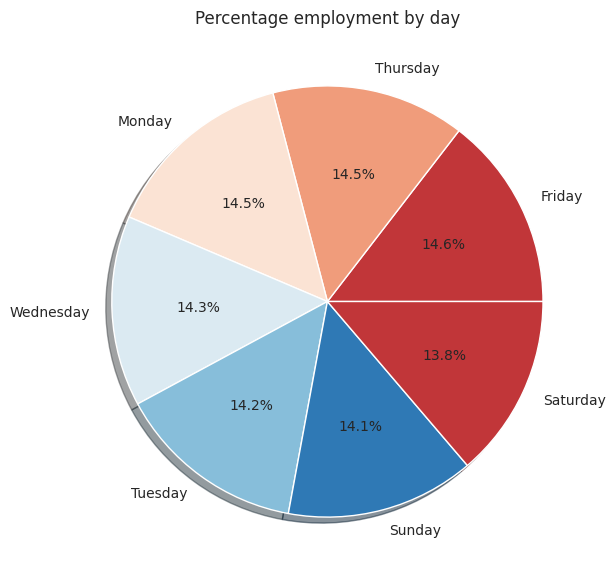

In [ ]:
plt.figure(figsize = (10,7))
plt.title('Percentage employment by day')
pie_plot(column_name = "day")
plt.show()

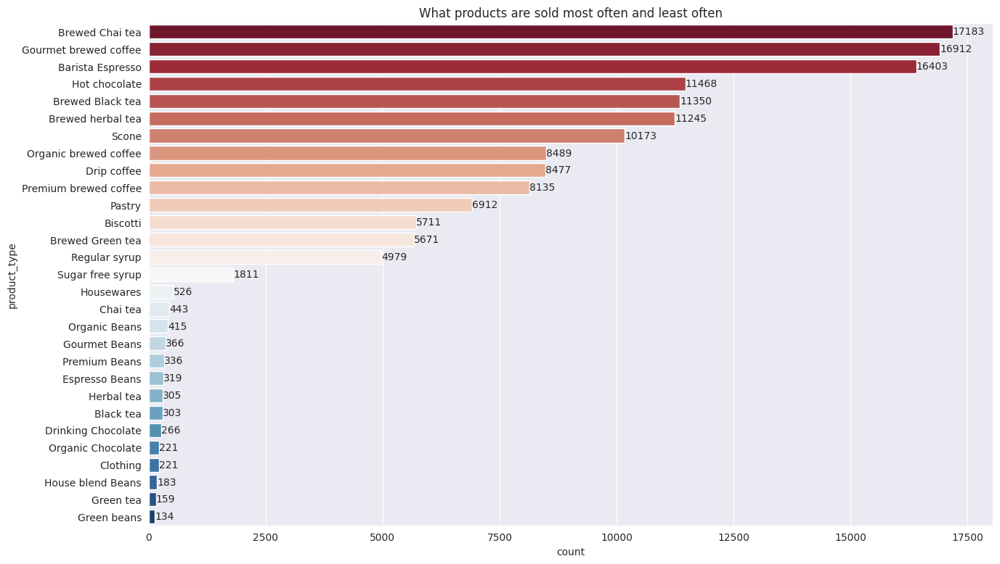

In [ ]:
plt.figure(figsize = (15,9))
plt.title('What products are sold most often and least often')
count_plot(y_axis = "product_type")
plt.show()

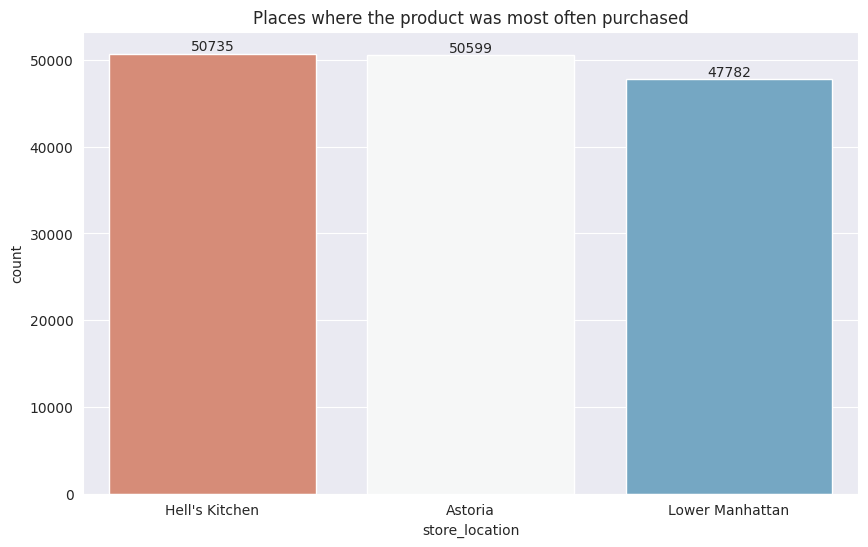

In [ ]:
plt.figure(figsize = (10,6))
plt.title('Places where the product was most often purchased')
count_plot(x_axis = "store_location")
plt.show()

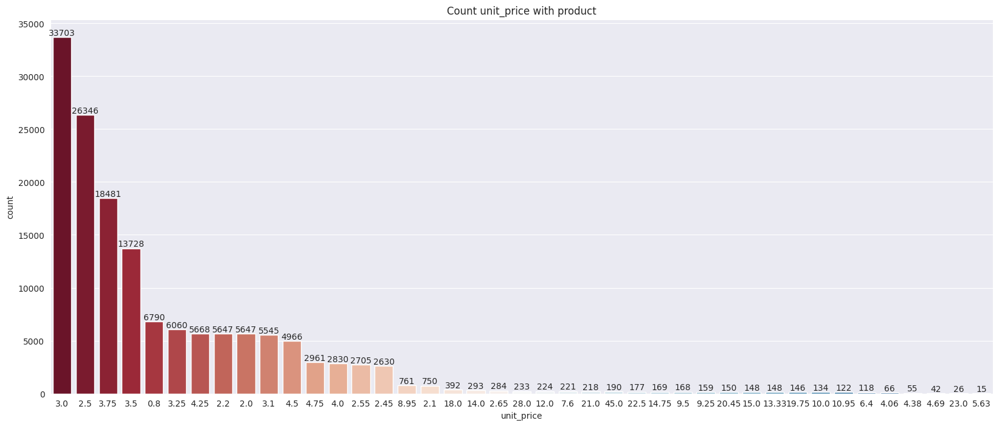

In [ ]:
plt.figure(figsize = (20,8))
plt.title('Count unit_price with product')
count_plot(x_axis = "unit_price")
plt.show()

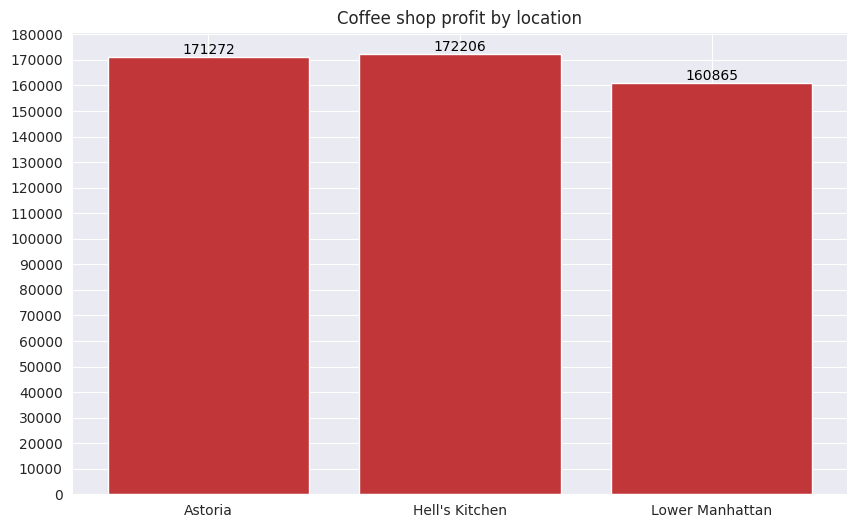

In [ ]:
sum_transactions = data.groupby('store_location')['unit_price'].sum()
plt.figure(figsize=(10, 6))
bars = plt.bar(sum_transactions.index, sum_transactions.values)
plt.title('Coffee shop profit by location')
max_value = int(max(sum_transactions.values))
plt.yticks(range(0, max_value + 10000, 10000))
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 10, round(yval), ha='center', va='bottom', color='black', size=10)
plt.show()

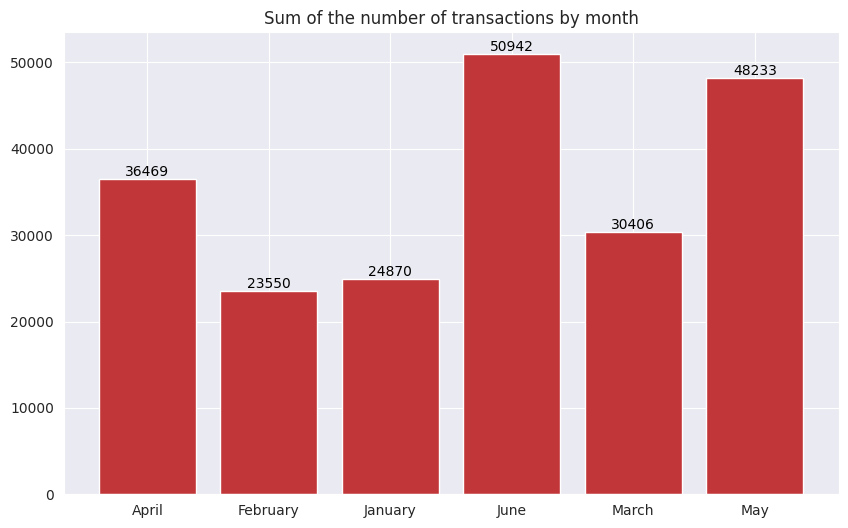

In [ ]:
transactions_by_day = data.groupby('month')['transaction_qty'].sum()
plt.figure(figsize=(10, 6))
plt.bar(transactions_by_day.index, transactions_by_day.values)
plt.title('Sum of the number of transactions by month')
for i, value in enumerate(transactions_by_day.values):
    plt.text(i, value + 10, str(value), ha='center', va='bottom', color='black', size=10)

plt.show()